In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
from math import floor
import numpy as np
import matplotlib as mpl
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import matplotlib.path as mpath
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from tqdm import tqdm
from scipy.special import softmax
import os, shutil
import pandas as pd
import seaborn as sbn

# import wandb

def row_col_to_seq(row_col, num_cols):  #Converts state number to row_column format
    return row_col[:,0] * num_cols + row_col[:,1]

def seq_to_col_row(seq, num_cols): #Converts row_column format to state number
    r = floor(seq / num_cols) 
    c = seq - r * num_cols
    return np.array([[r, c]])

class GridWorld:
    """
    Creates a gridworld object to pass to an RL algorithm.
    Parameters
    ----------
    num_rows : int
        The number of rows in the gridworld.
    num_cols : int
        The number of cols in the gridworld.
    start_state : numpy array of shape (1, 2), np.array([[row, col]])
        The start state of the gridworld (can only be one start state)
    goal_states : numpy arrany of shape (n, 2)
        The goal states for the gridworld where n is the number of goal
        states.
    """
    def __init__(self, num_rows, num_cols, start_state, goal_states, wind = False):
        self.num_rows = num_rows
        self.num_cols = num_cols
        self.start_state = start_state
        self.goal_states = goal_states
        self.obs_states = None
        self.bad_states = None
        self.num_bad_states = 0
        self.p_good_trans = None
        self.bias = None
        self.r_step = None
        self.r_goal = None
        self.r_dead = None
        self.gamma = 1 # default is no discounting
        self.wind = wind

    def add_obstructions(self, obstructed_states=None, bad_states=None, restart_states=None):

        self.obs_states = obstructed_states
        self.bad_states = bad_states
        if bad_states is not None:
            self.num_bad_states = bad_states.shape[0]
        else:
            self.num_bad_states = 0
        self.restart_states = restart_states
        if restart_states is not None:
            self.num_restart_states = restart_states.shape[0]
        else:
            self.num_restart_states = 0

    def add_transition_probability(self, p_good_transition, bias):

        self.p_good_trans = p_good_transition
        self.bias = bias

    def add_rewards(self, step_reward, goal_reward, bad_state_reward=None, restart_state_reward = None):

        self.r_step = step_reward
        self.r_goal = goal_reward
        self.r_bad = bad_state_reward
        self.r_restart = restart_state_reward


    def create_gridworld(self):

        self.num_actions = 4
        self.num_states = self.num_cols * self.num_rows# +1
        self.start_state_seq = row_col_to_seq(self.start_state, self.num_cols)
        self.goal_states_seq = row_col_to_seq(self.goal_states, self.num_cols)

        # rewards structure
        self.R = self.r_step * np.ones((self.num_states, 1))
        #self.R[self.num_states-1] = 0
        self.R[self.goal_states_seq] = self.r_goal
        
        for i in range(self.num_bad_states):
            if self.r_bad is None:
                raise Exception("Bad state specified but no reward is given")
            bad_state = row_col_to_seq(self.bad_states[i,:].reshape(1,-1), self.num_cols)
            #print("bad states", bad_state)
            self.R[bad_state, :] = self.r_bad
        for i in range(self.num_restart_states):
            if self.r_restart is None:
                raise Exception("Restart state specified but no reward is given")
            restart_state = row_col_to_seq(self.restart_states[i,:].reshape(1,-1), self.num_cols)
            #print("restart_state", restart_state)
            self.R[restart_state, :] = self.r_restart

        # probability model
        if self.p_good_trans == None:
            raise Exception("Must assign probability and bias terms via the add_transition_probability method.")

        self.P = np.zeros((self.num_states,self.num_states,self.num_actions))
        for action in range(self.num_actions):
            for state in range(self.num_states):


                # check if the state is the goal state or an obstructed state - transition to end
                row_col = seq_to_col_row(state, self.num_cols)
                if self.obs_states is not None:
                    end_states = np.vstack((self.obs_states, self.goal_states))
                else:
                    end_states = self.goal_states

                if any(np.sum(np.abs(end_states-row_col), 1) == 0):
                    self.P[state, state, action] = 1

                # else consider stochastic effects of action
                else:
                    for dir in range(-1,2,1):
                        
                        direction = self._get_direction(action, dir)
                        next_state = self._get_state(state, direction)
                        if dir == 0:
                            prob = self.p_good_trans
                        elif dir == -1:
                            prob = (1 - self.p_good_trans)*(self.bias)
                        elif dir == 1:
                            prob = (1 - self.p_good_trans)*(1-self.bias)

                        self.P[state, next_state, action] += prob

                # make restart states transition back to the start state with
                # probability 1
                if self.restart_states is not None:
                    if any(np.sum(np.abs(self.restart_states-row_col),1)==0):
                        next_state = row_col_to_seq(self.start_state, self.num_cols)
                        self.P[state,:,:] = 0
                        self.P[state,next_state,:] = 1
        return self

    def _get_direction(self, action, direction):

        left = [2,3,1,0]
        right = [3,2,0,1]
        if direction == 0:
            new_direction = action
        elif direction == -1:
            new_direction = left[action]
        elif direction == 1:
            new_direction = right[action]
        else:
            raise Exception("getDir received an unspecified case")
        return new_direction

    def _get_state(self, state, direction):

        row_change = [-1,1,0,0]
        col_change = [0,0,-1,1]
        row_col = seq_to_col_row(state, self.num_cols)
        row_col[0,0] += row_change[direction]
        row_col[0,1] += col_change[direction]

        # check for invalid states
        if self.obs_states is not None:
            if (np.any(row_col < 0) or
                np.any(row_col[:,0] > self.num_rows-1) or
                np.any(row_col[:,1] > self.num_cols-1) or
                np.any(np.sum(abs(self.obs_states - row_col), 1)==0)):
                next_state = state
            else:
                next_state = row_col_to_seq(row_col, self.num_cols)[0]
        else:
            if (np.any(row_col < 0) or
                np.any(row_col[:,0] > self.num_rows-1) or
                np.any(row_col[:,1] > self.num_cols-1)):
                next_state = state
            else:
                next_state = row_col_to_seq(row_col, self.num_cols)[0]

        return next_state

    def reset(self):
      return int(self.start_state_seq)
      
    def step(self, state, action):
        p, r = 0, np.random.random()
        for next_state in range(self.num_states):
            
            p += self.P[state, next_state, action]
            
            if r <= p:
                break

        if(self.wind and np.random.random() < 0.4):

          arr = self.P[next_state, :, 3]
          next_next = np.where(arr == np.amax(arr))
          next_next = next_next[0][0]
          return next_next, self.R[next_next]
        else:
          return next_state, self.R[next_state]

# Visualize Policy and Render Functions

In [54]:
def plot_gridworld(env):
    rewards = np.zeros((env.num_rows, env.num_cols))

    for r in range(env.num_rows):
        for c in range(env.num_cols):
            seq_rc = row_col_to_seq(np.array([[r,c]]), env.num_cols)[0]
            rewards[r,c] = env.R[seq_rc]

    fig = plt.figure(figsize=(8,8), facecolor='lavender')
    ax = fig.subplots(nrows = env.num_rows, ncols = env.num_cols, sharex=True, sharey=True)
    for r in range(env.num_rows):
        for c in range(env.num_cols):
            rc = row_col_to_seq(np.array([[r,c]]), env.num_cols)[0]
            cur_ax = ax[r,c]
            cur_ax.set_axis_off()
            if rc in env.goal_states_seq:
                ax[r,c] = cur_ax.add_artist(mpatches.RegularPolygon((0.5, 0.5), 3, radius=0.4, ec="none", color='darkgreen'))
            elif rc in env.start_state_seq:
                ax[r,c] = cur_ax.add_artist(mpatches.RegularPolygon((0.5, 0.5), 3, radius=0.4, ec="none", color='tab:blue'))
            elif [r,c] in env.obs_states.tolist():
                ax[r,c] = cur_ax.add_artist(mpatches.RegularPolygon((0.5, 0.5), 6, radius=0.4, ec="none", color='tab:brown'))
            elif rewards[r,c] == env.r_bad:
                ax[r,c] = cur_ax.add_artist(mpatches.Wedge((0.5, 0.5), 0.3, 30, 330, ec="none", color='darkorange'))
            elif rewards[r,c] == env.r_restart:
                ax[r,c] = cur_ax.add_artist(mpatches.Wedge((0.5, 0.5), 0.3, 30, 330, ec="none", color='crimson'))
            else:
                ax[r,c] = cur_ax.add_artist(mpatches.Rectangle((0, 0),1,1, ec="none", color='yellow'))
    l1 = mpatches.Patch(color='crimson', label='Restart')
    l2 = mpatches.Patch(color='darkorange', label='Bad')
    l3 = mpatches.Patch(color='tab:brown', label='Obstructed')
    l4 = mpatches.Patch(color='tab:blue', label='Start')
    l5 = mpatches.Patch(color='#ff6600', label='Goal')
    fig.legend(handles=[l1,l2,l3,l4,l5])
    fig.show()

def render_env(env):
    grid = np.zeros((env.num_rows, env.num_cols))
    for state in env.restart_states:
        grid[state[0],state[1]] = 1
    for state in env.bad_states:
        grid[state[0],state[1]] = 2
    for state in env.obs_states:
        grid[state[0],state[1]] = 3
    for state in env.start_state:
        grid[state[0],state[1]] = 4
    for state in env.goal_states:
        grid[state[0],state[1]] = 5

    cmap = colors.ListedColormap(['yellow', 'crimson', 'darkorange', 'tab:brown', 'tab:blue', 'darkgreen'])

    l1 = mpatches.Patch(color='crimson', label='Restart')
    l2 = mpatches.Patch(color='darkorange', label='Bad')
    l3 = mpatches.Patch(color='tab:brown', label='Obstructed')
    l4 = mpatches.Patch(color='tab:blue', label='Start')
    l5 = mpatches.Patch(color='darkgreen', label='Goal')

    fig, ax = plt.subplots(figsize=(10,10))
    ax.set_title('Grid')
    ax.invert_yaxis()
    ax.xaxis.tick_top()
    ax.set_xlabel('Columns')
    ax.xaxis.set_label_position('top') 
    ax.set_ylabel('Rows')
    mesh = ax.pcolormesh(grid, cmap=cmap, edgecolors='k', linewidths=2)
    ax.legend(bbox_to_anchor = (1.15, 1), handles=[l1,l2,l3,l4,l5])
    return fig, ax

def render_episode(Q, env):
    total_reward, steps = 0, 0

    #Resetting environment
    state = env.reset()
    action = Q[state].argmax(-1)
    seen_states = []
    for st in range(100):
        seen_states += [state]
        state_next, reward = env.step(state, action)
        action_next = Q[state_next].argmax(-1)
    
        total_reward += reward
        steps += 1

        if np.any(np.abs(env.goal_states_seq - state_next) == 0): # check if state_next is a goal state
            seen_states += [state_next]
            break

        state, action = state_next, action_next
    
    seen_states = np.array([seq_to_col_row(s, env.num_cols)[0] for s in seen_states], dtype=float) # convert to co-ordinates
    seen_states = seen_states[:,::-1]
    seen_states += 0.5
    path = seen_states[1:] -seen_states[0:-1]
    fig, ax = render_env(env)
    for start, diff in zip(seen_states, path):
        arrow = mpatches.Arrow(*start, *diff, width = 0.15, color = 'k')
        ax.add_patch(arrow)
    ax.set_title("Steps: %d, Total Reward: %d"%(steps, total_reward))
    return fig, ax, total_reward, steps

# Plotting Functions

In [4]:
def convert_to_grid_form_Q(X, env):
    grid_X = np.zeros((env.num_rows, env.num_cols, env.num_actions))
    for s in range(env.num_states):
        rc = seq_to_col_row(s, env.num_cols)[0]
        grid_X[rc[0], rc[1]] = X[s]
    return grid_X

def convert_to_grid_form_V(X, env):
    grid_X = np.zeros((env.num_rows, env.num_cols))
    for s in range(env.num_states):
        rc = seq_to_col_row(s, env.num_cols)[0]
        grid_X[rc[0], rc[1]] = X[s]
    return grid_X

def plot_q_values_map_with_optimal_policy(Q, env, message = "Q Values plot"):
    Q = convert_to_grid_form_Q(Q, env)
    fig, ax = plt.subplots(figsize=(8,8))
    ax.set_title(message)
    ax.invert_yaxis()
    ax.xaxis.tick_top()
    ax.set_xlabel('Columns')
    ax.xaxis.set_label_position('top') 
    ax.set_ylabel('Rows')
    mesh = ax.pcolormesh(Q.max(-1), edgecolors='k', linewidths=2)
    fig.colorbar(mesh)
    def r_direct(a):
        if a in [0, 1]:
            return 0
        return 1 if a == 3 else -1
    def c_direct(a):
        if a in [2, 3]:
            return 0
        return 1 if a == 0 else -1
    policy = Q.argmax(-1)
    policyr = np.vectorize(r_direct)(policy)
    policyc = np.vectorize(c_direct)(policy)
    idx = np.indices(policy.shape)
    idx0 = idx[0] + 0.5
    idx1 = idx[1] + 0.5
    ax.quiver(idx1, idx0, policyr, policyc, pivot="middle", color='red')
    return fig

def plot_state_visits_map(V, env, message = "Visits Plot"):
    V = convert_to_grid_form_V(V, env)
    fig, ax = plt.subplots(figsize=(8,8))
    ax.set_title(message)
    ax.invert_yaxis()
    ax.xaxis.tick_top()
    ax.set_xlabel('Columns')
    ax.xaxis.set_label_position('top') 
    ax.set_ylabel('Rows')
    mesh = ax.imshow(V, cmap='YlGn')
    fig.colorbar(mesh, ax=ax)
    for i in range(env.num_rows):
        for j in range(env.num_cols):
            text = ax.text(j, i, V[i, j], ha="center", va="center", color="r")
    return fig

def plot_avg_reward_curve(rewards_run_list, num_episodes):
    avg_rewards = np.mean(rewards_run_list, axis=0)
    fig, ax = plt.subplots(figsize=(8,8))
    ax.set_title('Average Reward Curve')
    ax.set_xlabel('Episode Number')
    ax.set_ylabel('Reward')
    ax.plot(np.arange(1, num_episodes+1), avg_rewards)
    return fig

def plot_avg_steps_curve(steps_run_list, num_episodes):
    avg_steps = np.mean(steps_run_list, axis=0)
    fig, ax = plt.subplots(figsize=(8,8))
    ax.set_title('Average Steps Curve')
    ax.set_xlabel('Episode Number')
    ax.set_ylabel('Number of Steps')
    ax.plot(np.arange(1, num_episodes+1), avg_steps)
    return fig

# Action Selection Functions

In [5]:
# Epsilon Greedy Action Selection Policy
def epsilon_greedy_action(Q, env, state, epsilon, beta, rg=None):
    if rg == None:
        rg = np.random.RandomState(None)
    rv = rg.random()
    if rv < epsilon:          # with epsilon prob, select random action
        return rg.choice(env.num_actions)
    else:                     # otherwise, select greedy action
        return np.argmax(Q[state])

# Softmax Action Selection Policy
def softmax_action(Q, env, state, epsilon, beta, rg=None):
    if rg == None:
        rg = np.random.RandomState(None)
    return rg.choice(env.num_actions, p=softmax(Q[state]/beta))

# SARSA and Q-Learning Algorithms

In [6]:
def sarsa(Q, env, num_episodes, rg, alpha = None, gamma = None, choose_action = None, epsilon = None, beta = None):
    episode_rewards = np.zeros(num_episodes)
    no_of_steps = np.zeros(num_episodes)
    V = np.zeros((env.num_states)) # num of visits

    for ep in tqdm(range(num_episodes)):
        total_reward, steps = 0, 0

        #Resetting environment
        state = env.reset()
        action = choose_action(Q, env, state, epsilon, beta, rg)
        
        for st in range(100):
            V[state] += 1
            state_next, reward = env.step(state, action)
            action_next = choose_action(Q, env, state_next, epsilon, beta, rg)

            # Update equation:
            Q[state,action] += alpha * (reward + gamma * Q[state_next, action_next] - Q[state, action])
        
            total_reward += reward
            steps += 1

            if np.any(np.abs(env.goal_states_seq - state_next) == 0): # check if state_next is a goal state
                V[state_next] += 1
                break

            state, action = state_next, action_next

        episode_rewards[ep]=total_reward
        no_of_steps[ep]= steps
    
    return Q, V, episode_rewards, no_of_steps

def qlearning(Q, env, num_episodes, rg, alpha = None, gamma = None, choose_action = None, epsilon = None, beta = None):
    episode_rewards = np.zeros(num_episodes)
    no_of_steps = np.zeros(num_episodes)
    V = np.zeros((env.num_states)) # num of visits

    for ep in tqdm(range(num_episodes)):
        total_reward, steps = 0, 0

        #Resetting environment
        state = env.reset()
        action = choose_action(Q, env, state, epsilon, beta, rg)
        
        for st in range(100):
            V[state] += 1
            state_next, reward = env.step(state, action)
            action_next = choose_action(Q, env, state_next, epsilon, beta, rg)

            # Update equation:
            Q[state,action] += alpha * (reward + gamma * np.max(Q[state_next]) - Q[state, action])
        
            total_reward += reward
            steps += 1

            if np.any(np.abs(env.goal_states_seq - state_next) == 0): # check if state_next is a goal state
                V[state_next] += 1
                break

            state, action = state_next, action_next

        episode_rewards[ep]=total_reward
        no_of_steps[ep]= steps
  
    return Q, V, episode_rewards, no_of_steps

# Test metric for hyperparameter finetuning

In [7]:
def test_policy(Q, env, num_episodes=1000):
    episode_rewards = np.zeros(num_episodes)
    no_of_steps = np.zeros(num_episodes)
    
    for ep in tqdm(range(num_episodes)):
        total_reward, steps = 0, 0

        #Resetting environment
        state = env.reset()
        action = Q[state].argmax()
        
        for st in range(100):
            state_next, reward = env.step(state, action)
            action_next = Q[state_next].argmax()
            total_reward += reward
            steps += 1

            if np.any(np.abs(env.goal_states_seq - state_next) == 0): # check if state_next is a goal state
                break

            state, action = state_next, action_next

        episode_rewards[ep] = total_reward
        no_of_steps[ep] = steps

    return np.mean(episode_rewards), np.mean(no_of_steps)

# Experiment Class

In [8]:
class Experiment():
    def __init__(self, args):
        self.learning = args['learning']                # Q-Learning or SARSA
        self.exp_strategy = args['action']            # ep-greedy or softmax
        self.p_value = args['p_value']                  # p in the environment
        self.wind = args['wind']                        # wind in the environment
        self.start = args['start']                      # start state
        self.num_rows = 10
        self.num_cols = 10
        self.goal_states = np.array([[0,9],[2,2],[8,7]])
        self.obstructions = np.array([[0,7],[1,1],[1,2],[1,3],[1,7],[2,1],[2,3],
                                [2,7],[3,1],[3,3],[3,5],[4,3],[4,5],[4,7],
                                [5,3],[5,7],[5,9],[6,3],[6,9],[7,1],[7,6],
                                [7,7],[7,8],[7,9],[8,1],[8,5],[8,6],[9,1]])
        self.bad_states = np.array([[1,9],[4,2],[4,4],[7,5],[9,9]])
        self.restart_states = np.array([[3,7],[8,2]])

        self.gw = GridWorld(num_rows = self.num_rows, num_cols = self.num_cols, start_state = self.start, goal_states = self.goal_states, wind = self.wind)

        self.gw.add_obstructions(obstructed_states=self.obstructions, bad_states=self.bad_states, restart_states=self.restart_states)
        
        self.gw.add_rewards(step_reward=-1, goal_reward=10, bad_state_reward=-6, restart_state_reward=-100)

        self.gw.add_transition_probability(p_good_transition=self.p_value, bias=0.5)

        self.env = self.gw.create_gridworld()
        self.env.reset()
    
    def train_model(self, num_runs, num_episodes, alp, gam, eps, bet, wandb_log=False, test=True):
        self.rewards_run_list, self.steps_run_list, self.Q_list, self.V_list  = [], [], [], []
        self.num_runs = num_runs
        self.num_episodes = num_episodes

        test_rewards, test_steps = [], []
        for run in range(num_runs):
            print(f'run - {run+1}')
            self.Q = np.zeros((self.env.num_states, self.env.num_actions))          # init Q
            rg = np.random.RandomState(run)
            if self.learning == 'sarsa':
                if self.exp_strategy == 'ep-greedy':
                    Q, V, R, S = sarsa(self.Q, self.env, num_episodes, rg, alpha = alp, gamma = gam, choose_action = epsilon_greedy_action, epsilon = eps, beta = bet)
                else:
                    Q, V, R, S = sarsa(self.Q, self.env, num_episodes, rg, alpha = alp, gamma = gam, choose_action = softmax_action, epsilon = eps, beta = bet)
            else:
                if self.exp_strategy == 'ep-greedy':
                    Q, V, R, S = qlearning(self.Q, self.env, num_episodes, rg, alpha = alp, gamma = gam, choose_action = epsilon_greedy_action, epsilon = eps, beta = bet)
                else:
                    Q, V, R, S = qlearning(self.Q, self.env, num_episodes, rg, alpha = alp, gamma = gam, choose_action = softmax_action, epsilon = eps, beta = bet)

            self.Q_list += [Q]
            self.V_list += [V]
            self.rewards_run_list += [R]
            self.steps_run_list += [S]

            if (test):
                tr, ts = test_policy(Q, self.env, 100)
                test_rewards += [tr]
                test_steps += [ts]
        
        average_rewards, average_steps = np.mean(self.rewards_run_list ,axis=0), np.mean(self.steps_run_list, axis=0)

        if (wandb_log):
            wandb.log({"average train reward" : np.average(average_rewards), "average train steps" : np.average(average_steps)}, commit=False)
            if (test):
                wandb.log({"average test reward" : np.average(test_rewards), "average test steps" : np.average(test_steps)}, commit=True)
        return average_rewards, average_steps

    def generate_comparative_plots(self, cno, hyper_parameter_list, num_runs, num_episodes, action):
        if not os.path.exists(f'/content/drive/MyDrive/Colab Notebooks/CS6700/Assignments/Assignment1/Plots/ComparativeImages'):
            os.mkdir(f'/content/drive/MyDrive/Colab Notebooks/CS6700/Assignments/Assignment1/Plots/ComparativeImages')
        
        results = pd.DataFrame()

        if action =='ep-greedy':
            for (al, ga, ep) in hyper_parameter_list:
                average_rewards, average_steps = self.train_model(num_runs, num_episodes, al, ga, ep, None, False, False)
                cur_results = pd.DataFrame()
                cur_results['rewards'] = average_rewards
                cur_results['steps'] = average_steps
                cur_results['hyperparameters'] = [f'alpha = {al} gamma = {ga} epsilon = {ep}' for _ in range(len(average_steps))]
                results = pd.concat([results, cur_results])
        else:
            for (al, ga, be) in hyper_parameter_list:
                average_rewards, average_steps = self.train_model(num_runs, num_episodes, al, ga, None, be, False, False)
                cur_results = pd.DataFrame()
                cur_results['rewards'] = average_rewards
                cur_results['steps'] = average_steps
                cur_results['hyperparameters'] = [f'alpha = {al} gamma = {ga} beta = {be}' for _ in range(len(average_steps))]
                results = pd.concat([results, cur_results])

        results = results.reset_index().rename(columns = {'index' : 'episode'})

        fig = plt.figure(figsize=(10,10))
        sbn.lineplot(x='episode', y='rewards', hue='hyperparameters', data=results).set(title='Comparative Average Rewards Curve')
        fig.savefig(f'/content/drive/MyDrive/Colab Notebooks/CS6700/Assignments/Assignment1/Plots/ComparativeImages/reward_{cno}')
        fig = plt.figure(figsize=(10,10))
        sbn.lineplot(x='episode', y='steps', hue='hyperparameters', data=results).set(title='Comparative Average Steps Curve')
        fig.savefig(f'/content/drive/MyDrive/Colab Notebooks/CS6700/Assignments/Assignment1/Plots/ComparativeImages/step_{cno}')

    def generate_plots_report(self, cno):
        if not os.path.exists(f'/content/drive/MyDrive/Colab Notebooks/CS6700/Assignments/Assignment1/Plots/images'):
            os.mkdir(f'/content/drive/MyDrive/Colab Notebooks/CS6700/Assignments/Assignment1/Plots/images')
      
        if os.path.exists(f'/content/drive/MyDrive/Colab Notebooks/CS6700/Assignments/Assignment1/Plots/images/config{str(cno)}'):
            shutil.rmtree(f'/content/drive/MyDrive/Colab Notebooks/CS6700/Assignments/Assignment1/Plots/images/config{str(cno)}')
      
        os.mkdir(f'/content/drive/MyDrive/Colab Notebooks/CS6700/Assignments/Assignment1/Plots/images/config{str(cno)}')
      
        avg_reward_curve=plot_avg_reward_curve(self.rewards_run_list, self.num_episodes)
        avg_steps_curve=plot_avg_steps_curve(self.steps_run_list, self.num_episodes)

        test_values = np.zeros((self.num_runs))

        for i in range(self.num_runs):
            test_values[i] = test_policy(self.Q_list[i], self.env, 100)[0]
      
        bestidx = np.argmax(test_values)
        heatmap_visit_count=plot_state_visits_map(self.V_list[bestidx], self.env, message = "Visits Plot")
        heatmap_optimal_policy=plot_q_values_map_with_optimal_policy(self.Q_list[bestidx], self.env, message = "Q Values plot")

        for i in range(5):
            fig, ax, _, _ = render_episode(self.Q_list[bestidx], self.env)
            fig.savefig(f'/content/drive/MyDrive/Colab Notebooks/CS6700/Assignments/Assignment1/Plots/images/config{str(cno)}/render_{i+1}.png')

        avg_reward_curve.savefig("/content/drive/MyDrive/Colab Notebooks/CS6700/Assignments/Assignment1/Plots/images/config"+str(cno)+"/avg_reward_curve.png")
        avg_steps_curve.savefig("/content/drive/MyDrive/Colab Notebooks/CS6700/Assignments/Assignment1/Plots/images/config"+str(cno)+"/avg_steps_curve.png")
        heatmap_visit_count.savefig("/content/drive/MyDrive/Colab Notebooks/CS6700/Assignments/Assignment1/Plots/images/config"+str(cno)+"/heatmap_visit_count.png")
        heatmap_optimal_policy.savefig("/content/drive/MyDrive/Colab Notebooks/CS6700/Assignments/Assignment1/Plots/images/config"+str(cno)+"/heatmap_optimal_policy.png")

# Configurations Definition

In [9]:
# Our set of configurations is put in a dictionary
configs_dict = dict()


# SARSA, ep-greedy
configs_dict[1] = dict({"learning": "sarsa", 'action': 'ep-greedy', 'wind' : True, 'start' : np.array([[0,4]]), 'p_value' : 1.0})
configs_dict[2] = dict({"learning": "sarsa", 'action': 'ep-greedy', 'wind' : True, 'start' : np.array([[0,4]]), 'p_value' : 0.7})
configs_dict[3] = dict({"learning": "sarsa", 'action': 'ep-greedy', 'wind' : True, 'start' : np.array([[3,6]]), 'p_value' : 1.0})
configs_dict[4] = dict({"learning": "sarsa", 'action': 'ep-greedy', 'wind' : True, 'start' : np.array([[3,6]]), 'p_value' : 0.7})

configs_dict[5] = dict({"learning": "sarsa", 'action': 'ep-greedy', 'wind' : False, 'start' : np.array([[0,4]]), 'p_value' : 1.0})
configs_dict[6] = dict({"learning": "sarsa", 'action': 'ep-greedy', 'wind' : False, 'start' : np.array([[0,4]]), 'p_value' : 0.7})
configs_dict[7] = dict({"learning": "sarsa", 'action': 'ep-greedy', 'wind' : False, 'start' : np.array([[3,6]]), 'p_value' : 1.0})
configs_dict[8] = dict({"learning": "sarsa", 'action': 'ep-greedy', 'wind' : False, 'start' : np.array([[3,6]]), 'p_value' : 0.7})


# SARSA, softmax
configs_dict[9] = dict({"learning": "sarsa", 'action': 'softmax', 'wind' : True, 'start' : np.array([[0,4]]), 'p_value' : 1.0})
configs_dict[10] = dict({"learning": "sarsa", 'action': 'softmax', 'wind' : True, 'start' : np.array([[0,4]]), 'p_value' : 0.7})
configs_dict[11] = dict({"learning": "sarsa", 'action': 'softmax', 'wind' : True, 'start' : np.array([[3,6]]), 'p_value' : 1.0})
configs_dict[12] = dict({"learning": "sarsa", 'action': 'softmax', 'wind' : True, 'start' : np.array([[3,6]]), 'p_value' : 0.7})

configs_dict[13] = dict({"learning": "sarsa", 'action': 'softmax', 'wind' : False, 'start' : np.array([[0,4]]), 'p_value' : 1.0})
configs_dict[14] = dict({"learning": "sarsa", 'action': 'softmax', 'wind' : False, 'start' : np.array([[0,4]]), 'p_value' : 0.7})
configs_dict[15] = dict({"learning": "sarsa", 'action': 'softmax', 'wind' : False, 'start' : np.array([[3,6]]), 'p_value' : 1.0})
configs_dict[16] = dict({"learning": "sarsa", 'action': 'softmax', 'wind' : False, 'start' : np.array([[3,6]]), 'p_value' : 0.7})



# Qlearning, ep-greedy
configs_dict[17] = dict({"learning": "qlearning", 'action': 'ep-greedy', 'wind' : True, 'start' : np.array([[0,4]]), 'p_value' : 1.0})
configs_dict[18] = dict({"learning": "qlearning", 'action': 'ep-greedy', 'wind' : True, 'start' : np.array([[0,4]]), 'p_value' : 0.7})
configs_dict[19] = dict({"learning": "qlearning", 'action': 'ep-greedy', 'wind' : True, 'start' : np.array([[3,6]]), 'p_value' : 1.0})
configs_dict[20] = dict({"learning": "qlearning", 'action': 'ep-greedy', 'wind' : True, 'start' : np.array([[3,6]]), 'p_value' : 0.7})

configs_dict[21] = dict({"learning": "qlearning", 'action': 'ep-greedy', 'wind' : False, 'start' : np.array([[0,4]]), 'p_value' : 1.0})
configs_dict[22] = dict({"learning": "qlearning", 'action': 'ep-greedy', 'wind' : False, 'start' : np.array([[0,4]]), 'p_value' : 0.7})
configs_dict[23] = dict({"learning": "qlearning", 'action': 'ep-greedy', 'wind' : False, 'start' : np.array([[3,6]]), 'p_value' : 1.0})
configs_dict[24] = dict({"learning": "qlearning", 'action': 'ep-greedy', 'wind' : False, 'start' : np.array([[3,6]]), 'p_value' : 0.7})


# Qlearning, softmax
configs_dict[25] = dict({"learning": "qlearning", 'action': 'softmax', 'wind' : True, 'start' : np.array([[0,4]]), 'p_value' : 1.0})
configs_dict[26] = dict({"learning": "qlearning", 'action': 'softmax', 'wind' : True, 'start' : np.array([[0,4]]), 'p_value' : 0.7})
configs_dict[27] = dict({"learning": "qlearning", 'action': 'softmax', 'wind' : True, 'start' : np.array([[3,6]]), 'p_value' : 1.0})
configs_dict[28] = dict({"learning": "qlearning", 'action': 'softmax', 'wind' : True, 'start' : np.array([[3,6]]), 'p_value' : 0.7})

configs_dict[29] = dict({"learning": "qlearning", 'action': 'softmax', 'wind' : False, 'start' : np.array([[0,4]]), 'p_value' : 1.0})
configs_dict[30] = dict({"learning": "qlearning", 'action': 'softmax', 'wind' : False, 'start' : np.array([[0,4]]), 'p_value' : 0.7})
configs_dict[31] = dict({"learning": "qlearning", 'action': 'softmax', 'wind' : False, 'start' : np.array([[3,6]]), 'p_value' : 1.0})
configs_dict[32] = dict({"learning": "qlearning", 'action': 'softmax', 'wind' : False, 'start' : np.array([[3,6]]), 'p_value' : 0.7})

# Wandb Agent Code (generic - needs to be adjusted for every configuration)

In [ ]:
# Code for configuration 14 -> sarsa, softmax, no wind, start - (0,4), p - 0.7
# We do a full grid sweep for 729 combinations of hyperparameters for each configuration.
# The links to the wandb sweep results are in the report

import wandb
import numpy as np

wandb.login()

alphalist = [0.02, 0.04, 0.07, 0.10, 0.15, 0.2, 0.25, 0.35, 0.7]
gammalist = [0.4, 0.75, 0.8, 0.85, 0.90, 0.92, 0.95, 0.97, 0.99] 
epsilonlist = [0.01, 0.02, 0.04, 0.07, 0.1, 0.15, 0.2, 0.6, 0.9]
betalist = [0.3, 0.5, 0.6, 0.8, 0.9, 1.0, 1.1, 1.2, 1.5]

config = dict({"learning": "sarsa", 'action': 'softmax', 'wind' : False, 'start' : np.array([[0,4]]), 'p_value' : 0.7})

sweep_configuration = {
    'method': 'grid',
    'name': 'sweep',
    'metric': {
        'goal': 'maximize', 
        'name': 'average test reward'
		},
    'parameters': {
        'alpha': {'values': alphalist},
        'gamma':  {'values': gammalist},
        'beta':  {'values': betalist}
     }
}

def wandbwrapper():
    with wandb.init() as run:
        run.name = f'al={wandb.config.alpha}_ga={wandb.config.gamma}_be={wandb.config.beta}'
        new_exp = Experiment(config)
        new_exp.train_model(5, 2000, wandb.config.alpha, wandb.config.gamma, None, wandb.config.beta, True, True)

sweep_id = wandb.sweep(sweep=sweep_configuration, project="project-name", entity='entity-name')
print(sweep_id)
wandb.agent(sweep_id=sweep_id, function=wandbwrapper)

# Configuration 1 - {wind = true, start = (0,4), p = 1.0} with SARSA and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:03<00:00, 585.26it/s]


run - 2


100%|██████████| 2000/2000 [00:02<00:00, 675.86it/s]


run - 3


100%|██████████| 2000/2000 [00:02<00:00, 855.53it/s]


run - 1


100%|██████████| 2000/2000 [00:14<00:00, 135.72it/s]


run - 2


100%|██████████| 2000/2000 [00:11<00:00, 168.93it/s]


run - 3


100%|██████████| 2000/2000 [00:06<00:00, 325.45it/s]


run - 1


100%|██████████| 2000/2000 [00:02<00:00, 826.90it/s]


run - 2


100%|██████████| 2000/2000 [00:02<00:00, 748.71it/s]


run - 3


100%|██████████| 2000/2000 [00:02<00:00, 933.93it/s] 


run - 1


100%|██████████| 2000/2000 [00:05<00:00, 345.05it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 314.85it/s]


run - 3


100%|██████████| 2000/2000 [00:05<00:00, 344.58it/s]


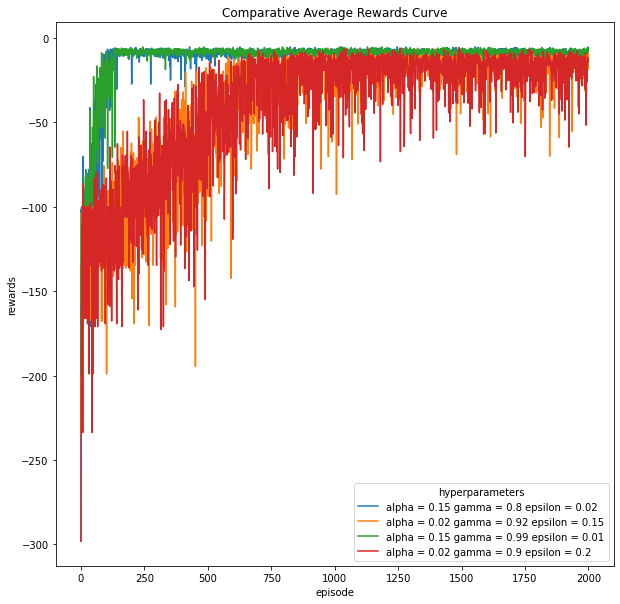

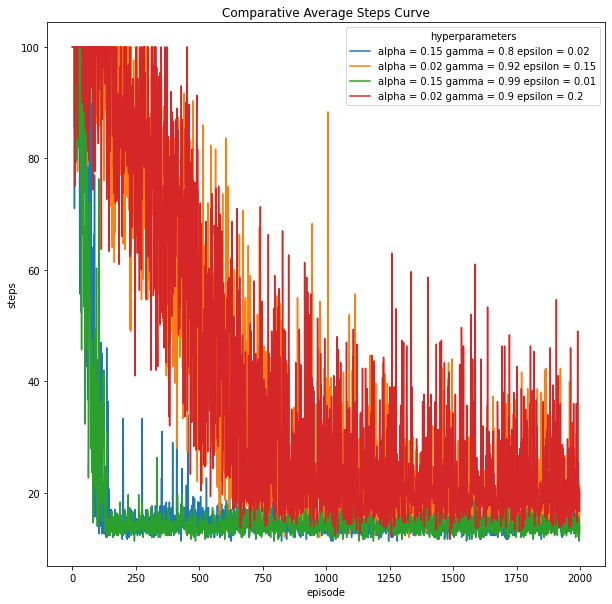

In [12]:
besthyperlist = [(0.15,0.8,0.02), (0.02,0.92,0.15), (0.15,0.99,0.01), (0.02,0.9,0.2)]
cno = 1

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:01<00:00, 1004.94it/s]


run - 2


100%|██████████| 2000/2000 [00:02<00:00, 923.35it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 1470.16it/s]


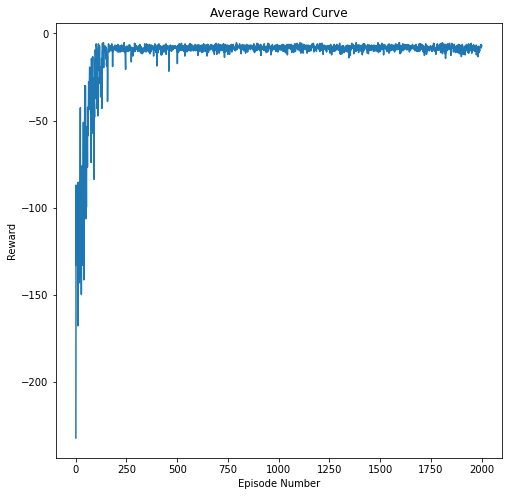

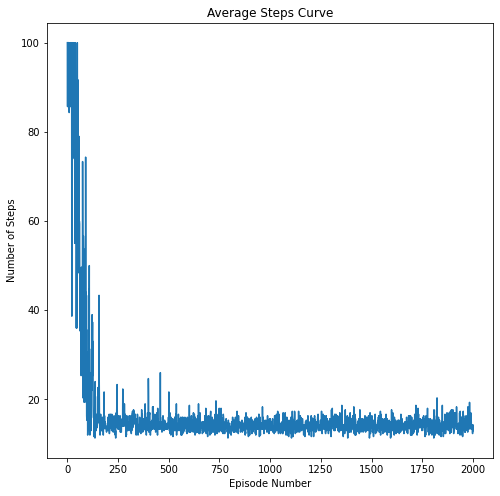

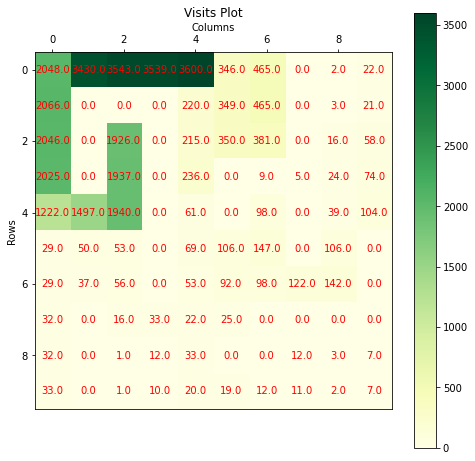

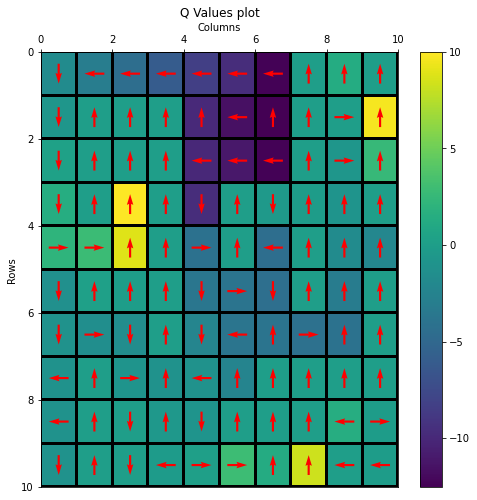

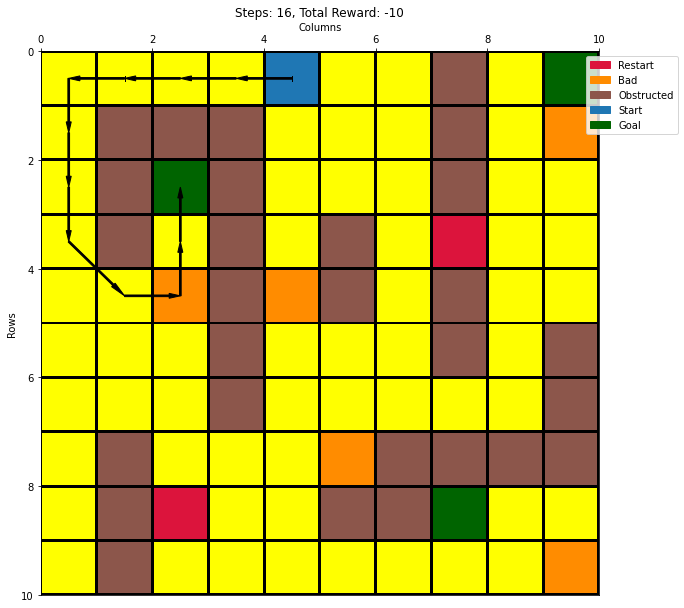

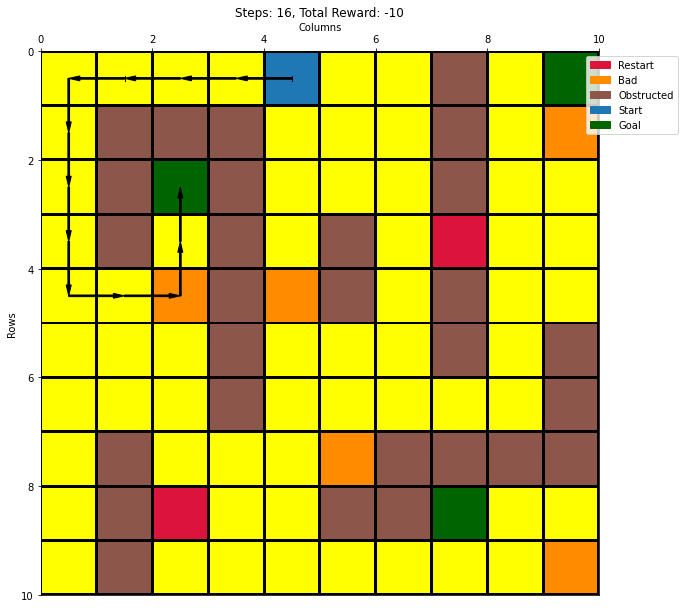

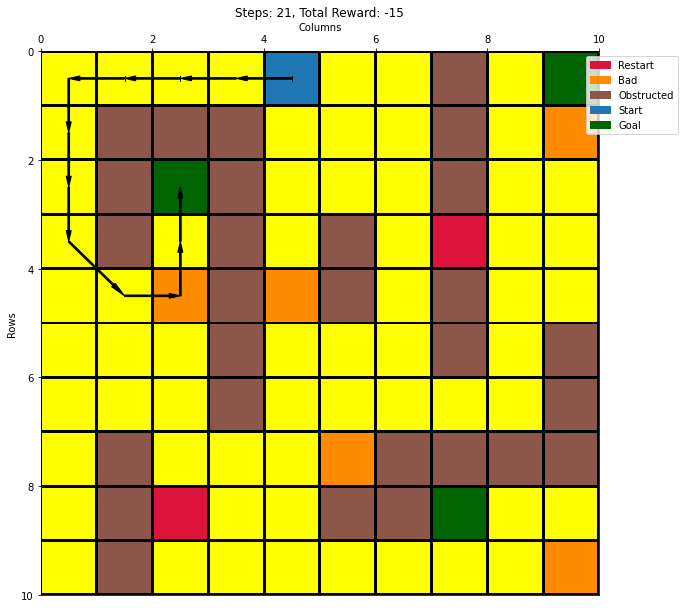

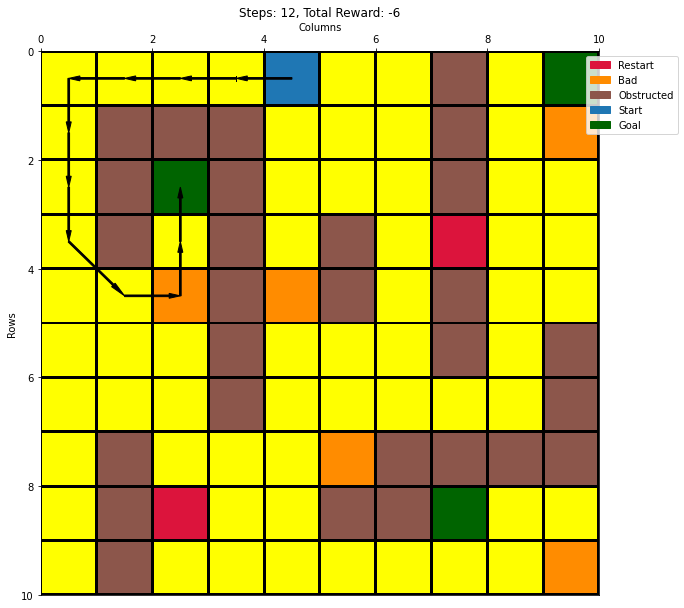

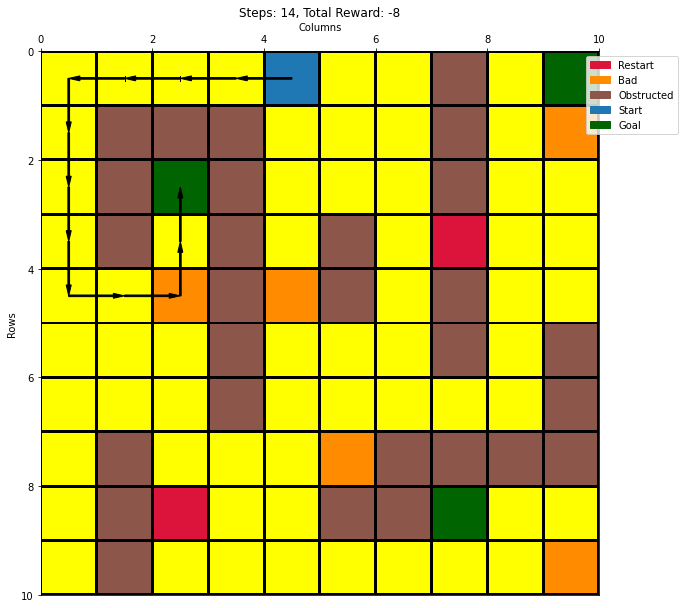

In [55]:
# best hyperparameters
balpha = 0.15
bgamma = 0.99
bepsilon = 0.01
cno = 1

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 2 - {wind = true, start = (0,4), p = 0.7} with SARSA and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:05<00:00, 371.84it/s]


run - 2


100%|██████████| 2000/2000 [00:07<00:00, 280.38it/s]


run - 3


100%|██████████| 2000/2000 [00:09<00:00, 205.29it/s]


run - 1


100%|██████████| 2000/2000 [00:05<00:00, 376.43it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 421.09it/s]


run - 3


100%|██████████| 2000/2000 [00:06<00:00, 286.53it/s]


run - 1


100%|██████████| 2000/2000 [00:12<00:00, 160.08it/s]


run - 2


100%|██████████| 2000/2000 [00:11<00:00, 180.61it/s]


run - 3


100%|██████████| 2000/2000 [00:09<00:00, 202.17it/s]


run - 1


100%|██████████| 2000/2000 [00:06<00:00, 297.50it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 407.27it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 469.43it/s]


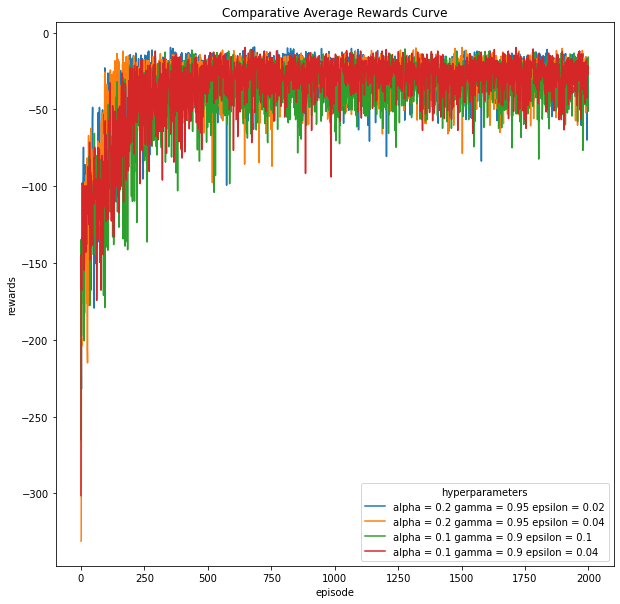

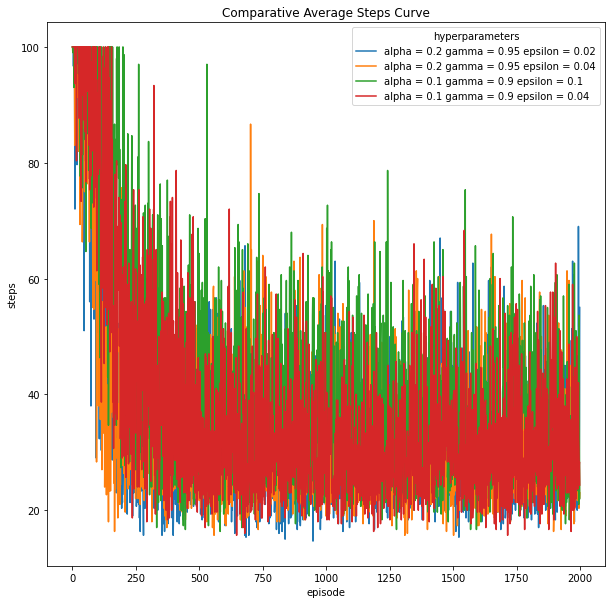

In [13]:
besthyperlist = [(0.2,0.95,0.02), (0.2,0.95,0.04), (0.1,0.9,0.1), (0.1,0.9,0.04)]
cno = 2

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:04<00:00, 424.52it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 337.42it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 733.24it/s]


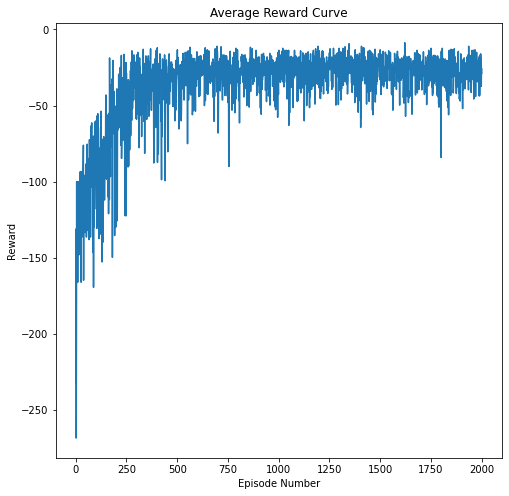

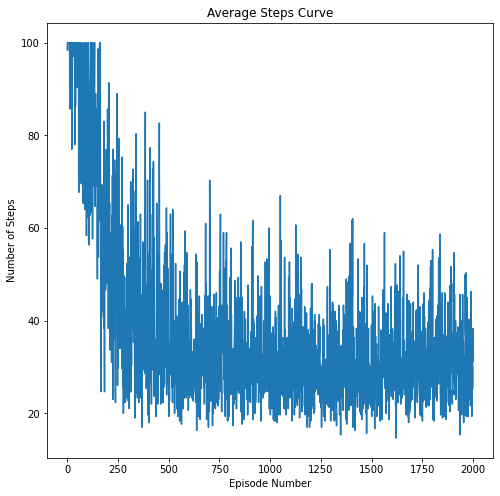

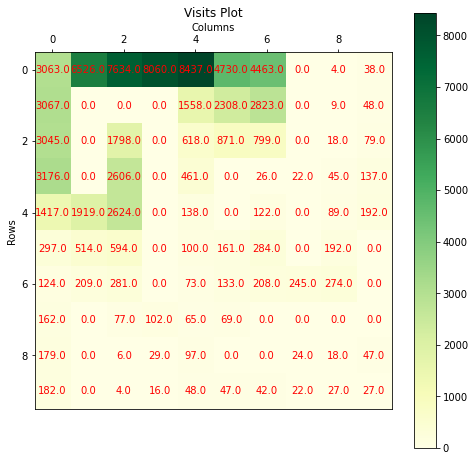

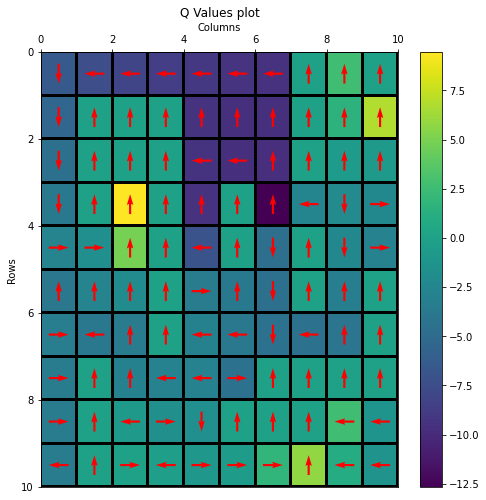

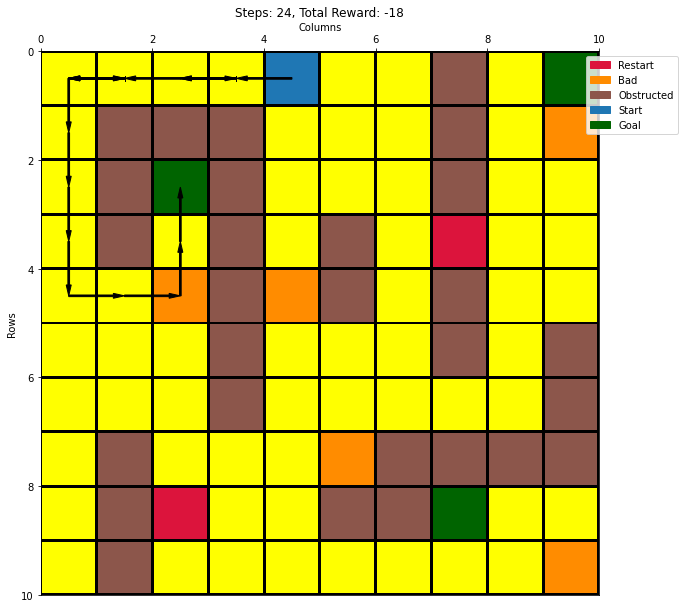

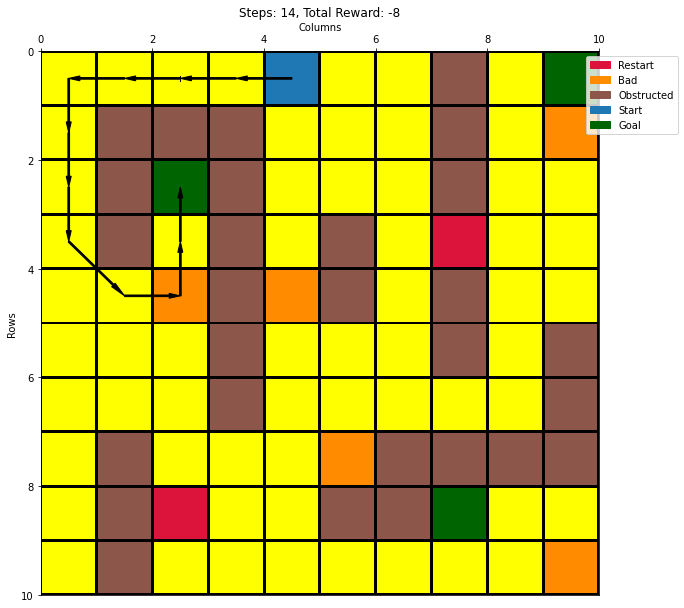

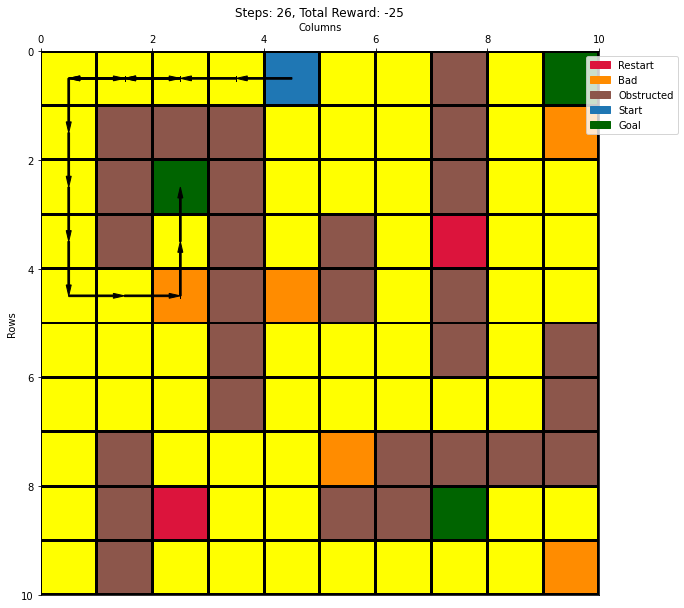

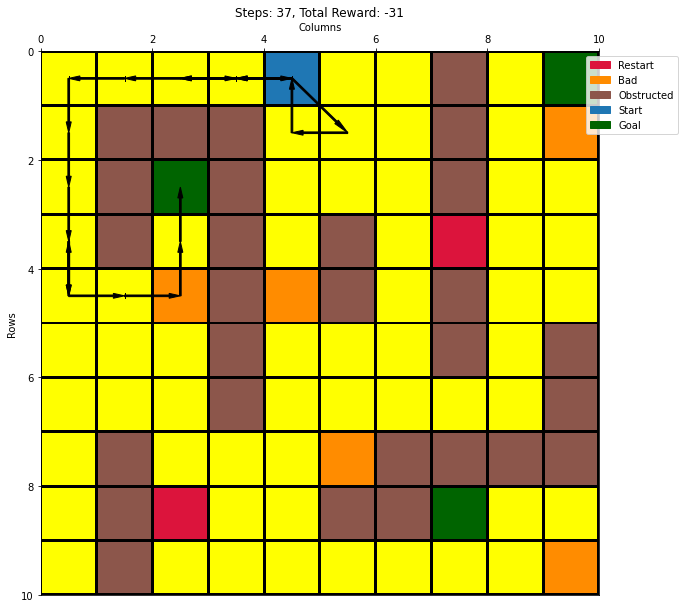

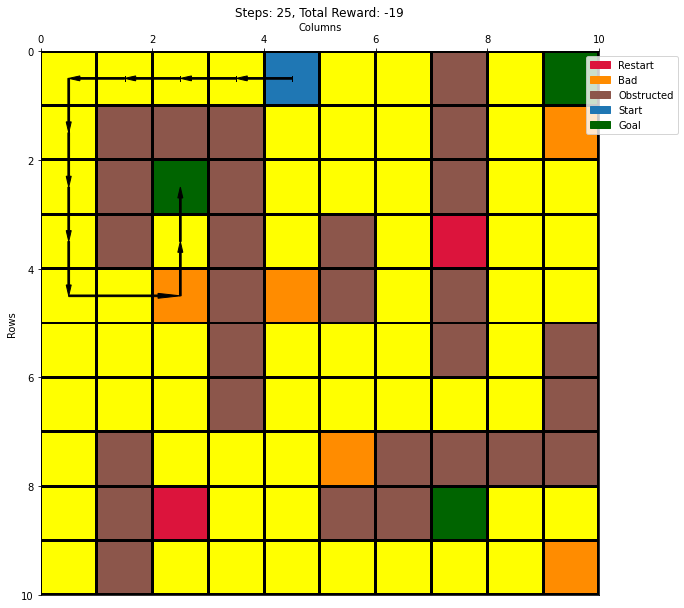

In [56]:
# best hyperparameters
balpha = 0.1
bgamma = 0.9
bepsilon = 0.04
cno = 2

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 3 - {wind = true, start = (3,6), p = 1.0} with SARSA and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:06<00:00, 304.87it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 346.78it/s]


run - 3


100%|██████████| 2000/2000 [00:06<00:00, 313.96it/s]


run - 1


100%|██████████| 2000/2000 [00:04<00:00, 482.20it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 380.28it/s]


run - 3


100%|██████████| 2000/2000 [00:05<00:00, 392.40it/s] 


run - 1


100%|██████████| 2000/2000 [00:03<00:00, 524.91it/s] 


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 465.36it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 414.74it/s]


run - 1


100%|██████████| 2000/2000 [00:04<00:00, 463.37it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 497.13it/s] 


run - 3


100%|██████████| 2000/2000 [00:05<00:00, 399.55it/s]


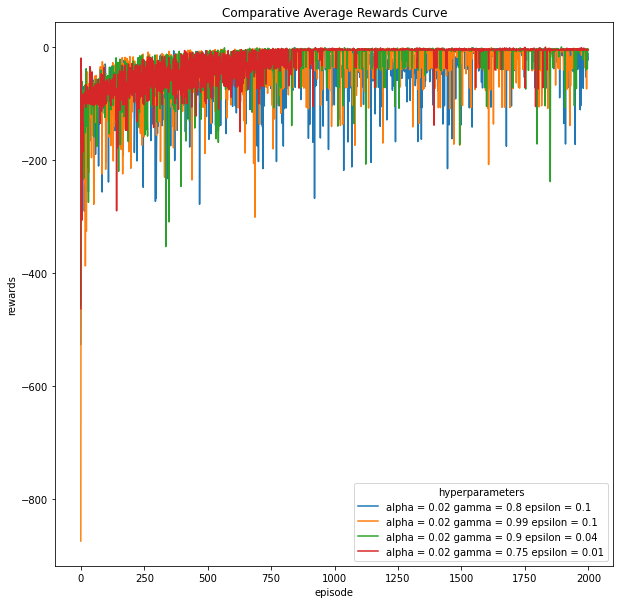

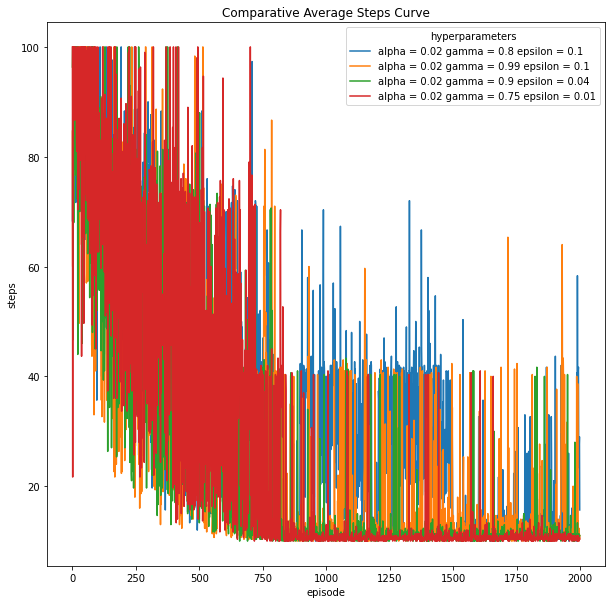

In [14]:
besthyperlist = [(0.02,0.8,0.1), (0.02,0.99,0.1), (0.02,0.9,0.04), (0.02,0.75,0.01)]
cno = 3

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:04<00:00, 403.92it/s] 


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 315.10it/s] 


run - 3


100%|██████████| 100/100 [00:00<00:00, 1225.05it/s]


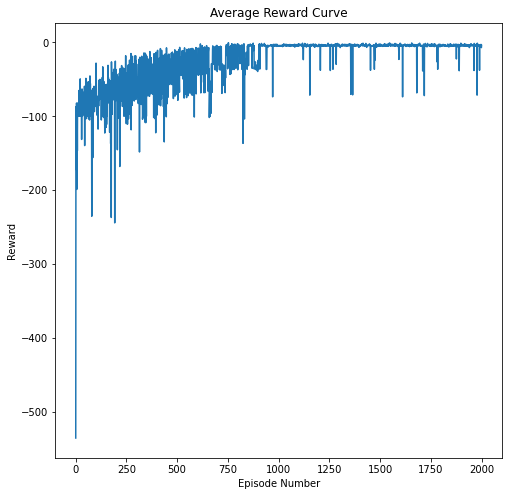

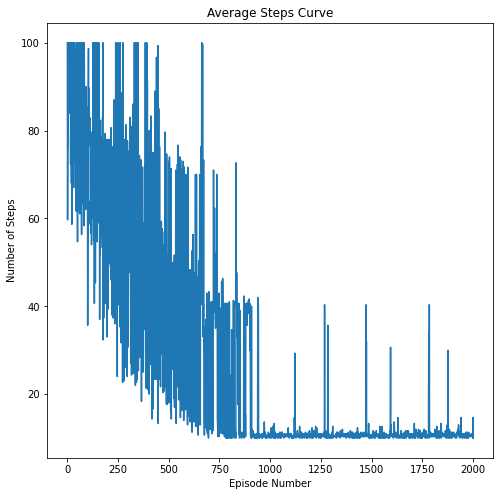

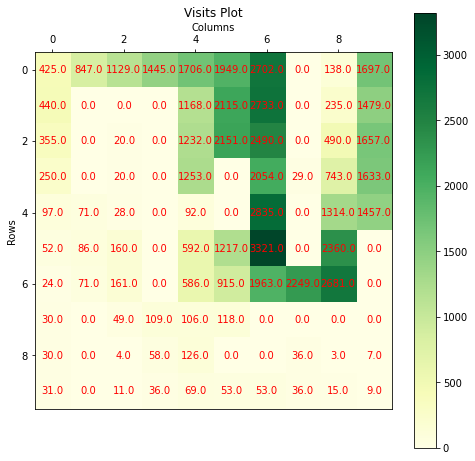

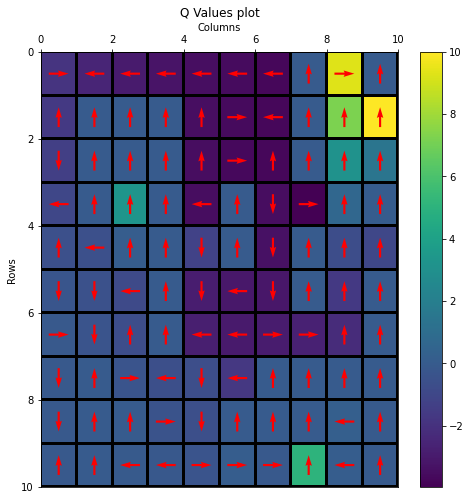

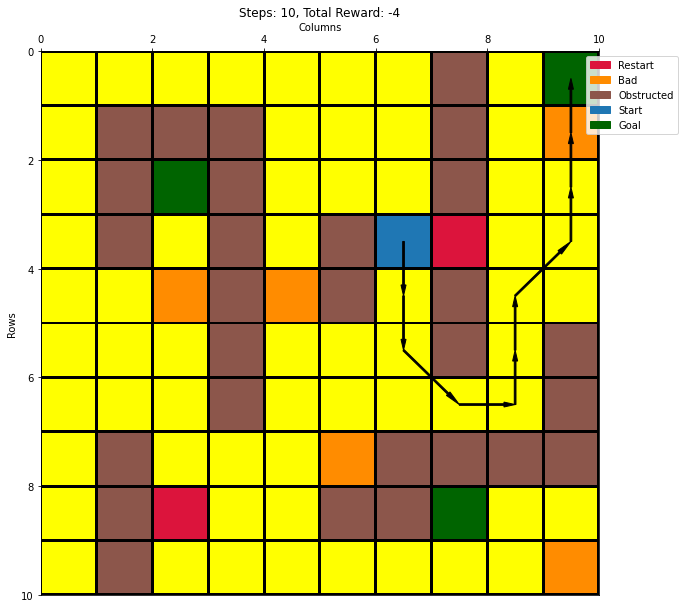

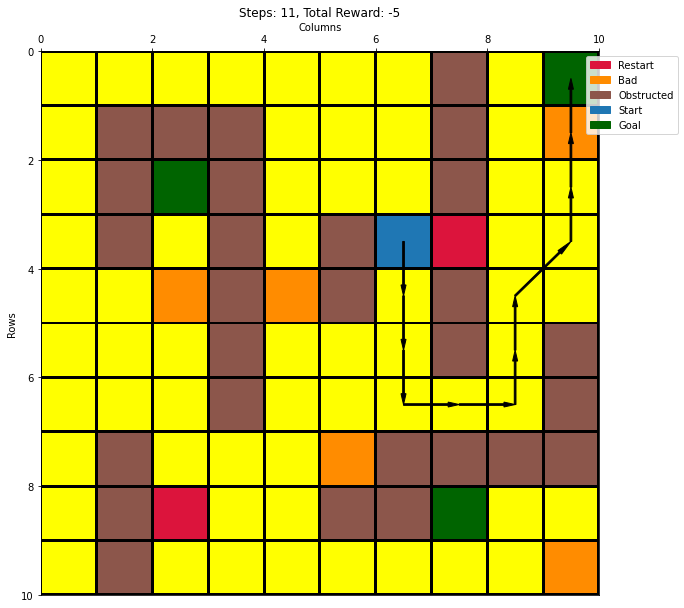

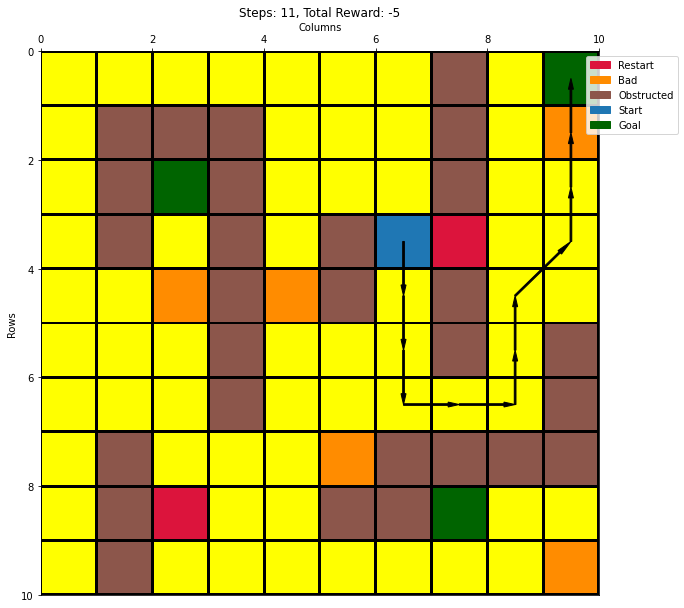

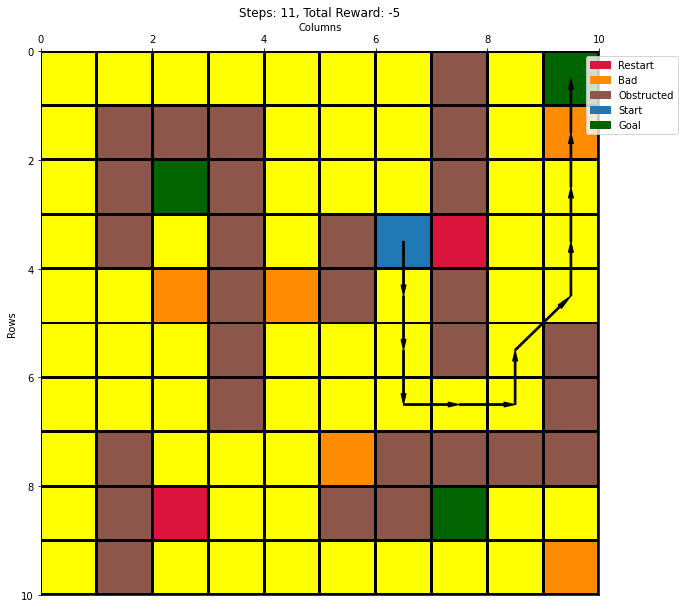

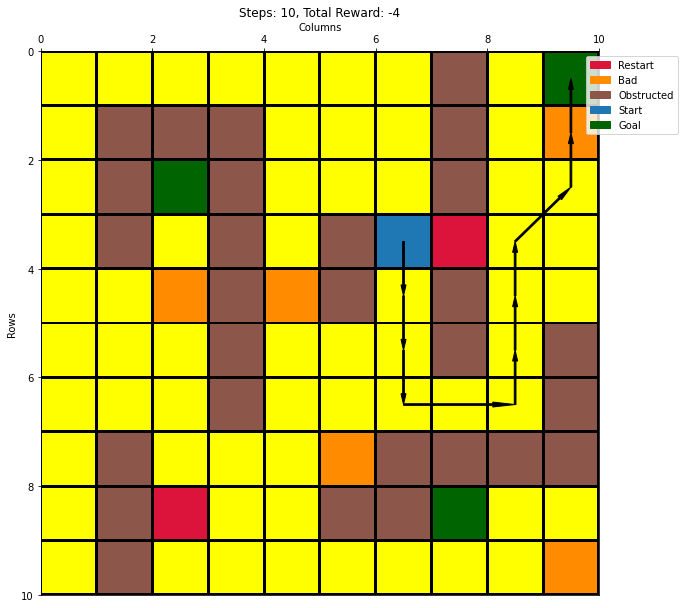

In [57]:
# best hyperparameters
balpha = 0.02
bgamma = 0.75
bepsilon = 0.01
cno = 3

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 4 - {wind = true, start = (3,6), p = 0.7} with SARSA and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:04<00:00, 400.86it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 358.50it/s]


run - 3


100%|██████████| 2000/2000 [00:05<00:00, 344.10it/s]


run - 1


100%|██████████| 2000/2000 [00:05<00:00, 356.73it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 337.00it/s]


run - 3


100%|██████████| 2000/2000 [00:05<00:00, 380.45it/s]


run - 1


100%|██████████| 2000/2000 [00:04<00:00, 447.70it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 348.71it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 406.18it/s]


run - 1


100%|██████████| 2000/2000 [00:05<00:00, 387.23it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 335.30it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 456.98it/s]


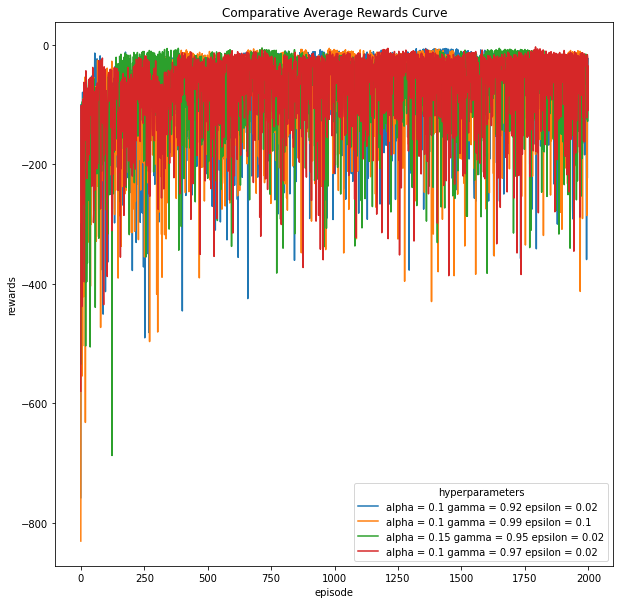

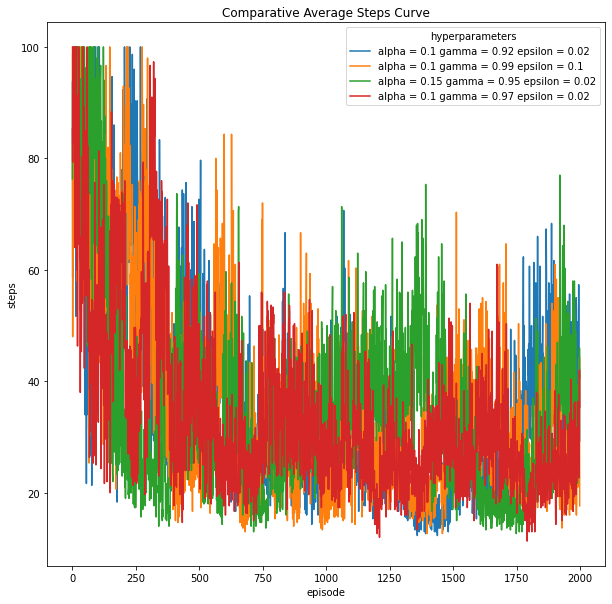

In [15]:
besthyperlist = [(0.1,0.92,0.02), (0.1,0.99,0.1), (0.15,0.95,0.02), (0.1,0.97,0.02)]
cno = 4

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:04<00:00, 463.36it/s]


run - 2


100%|██████████| 2000/2000 [00:07<00:00, 258.62it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 643.69it/s]


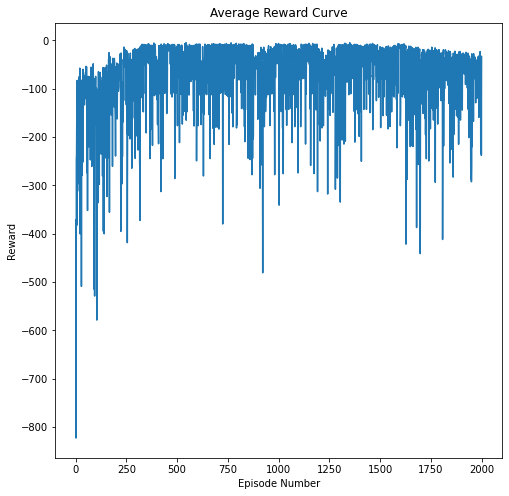

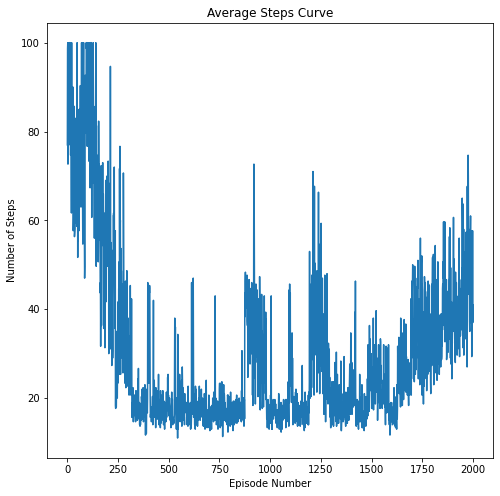

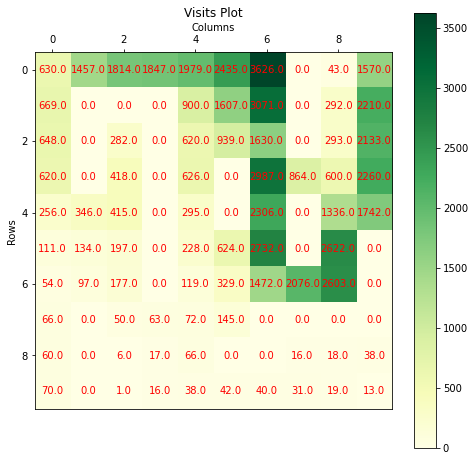

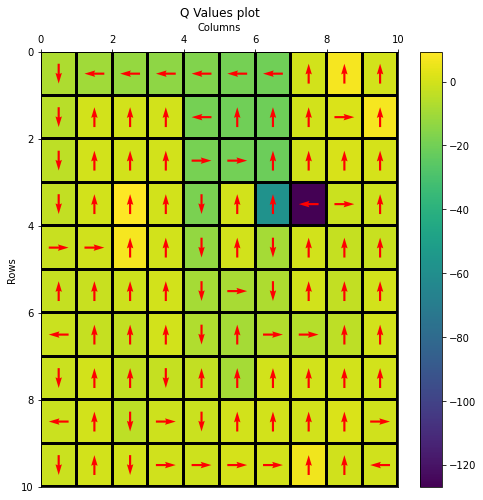

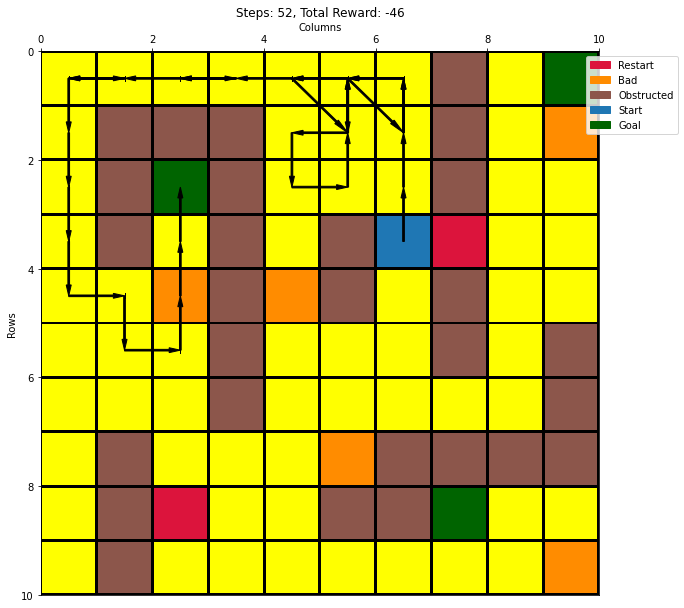

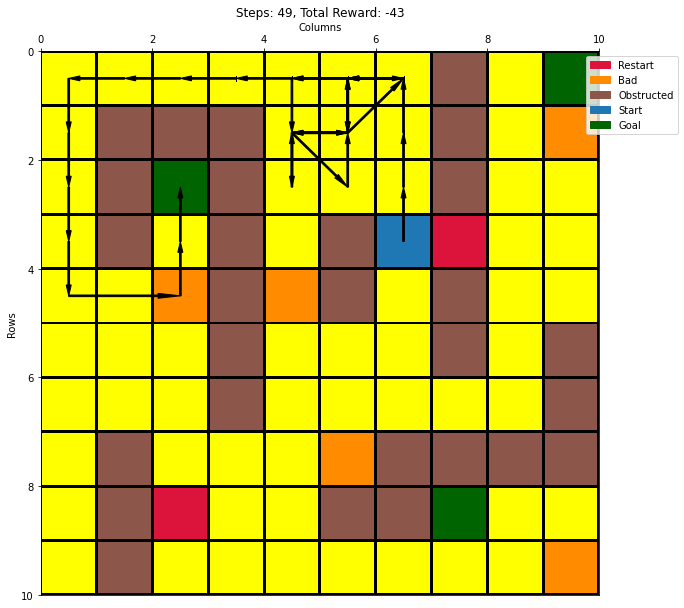

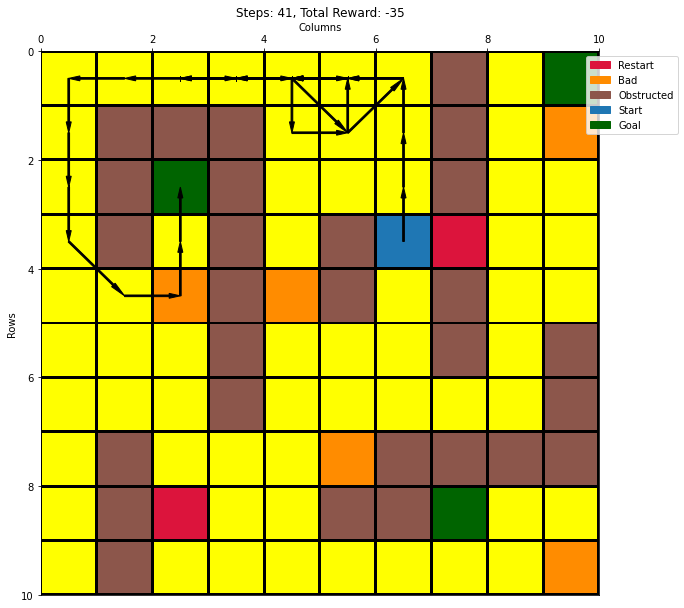

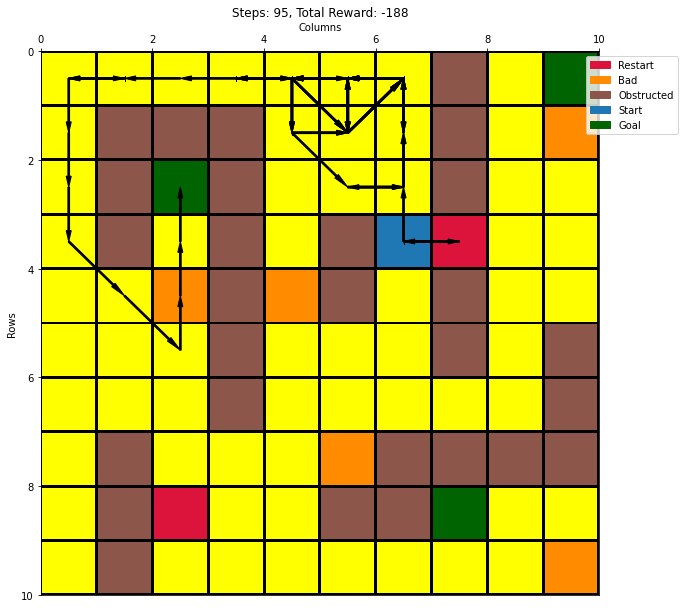

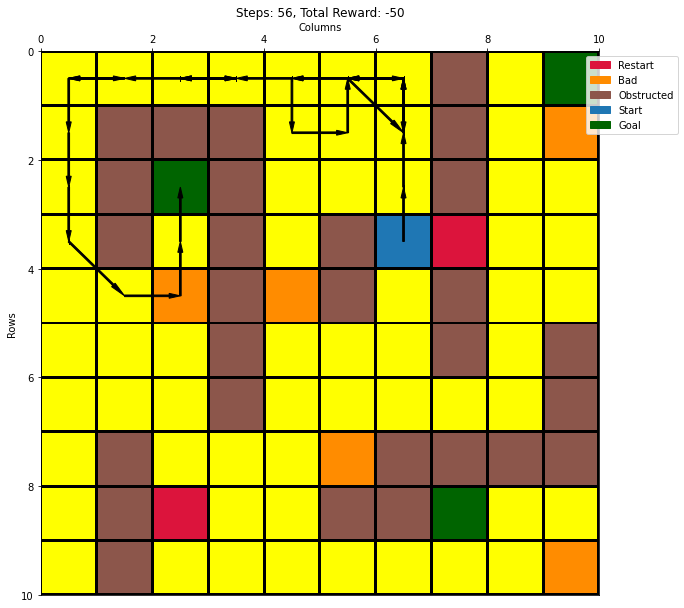

In [58]:
# best hyperparameters
balpha = 0.1
bgamma = 0.97
bepsilon = 0.02
cno = 4

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 5 - {wind = false, start = (0,4), p = 1.0} with SARSA and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:01<00:00, 1030.62it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 590.37it/s]


run - 3


100%|██████████| 2000/2000 [00:02<00:00, 802.93it/s] 


run - 1


100%|██████████| 2000/2000 [00:01<00:00, 1217.42it/s]


run - 2


100%|██████████| 2000/2000 [00:01<00:00, 1292.99it/s]


run - 3


100%|██████████| 2000/2000 [00:01<00:00, 1279.47it/s]


run - 1


100%|██████████| 2000/2000 [00:02<00:00, 932.55it/s] 


run - 2


100%|██████████| 2000/2000 [00:01<00:00, 1285.86it/s]


run - 3


100%|██████████| 2000/2000 [00:02<00:00, 709.03it/s] 


run - 1


100%|██████████| 2000/2000 [00:01<00:00, 1059.41it/s]


run - 2


100%|██████████| 2000/2000 [00:01<00:00, 1083.28it/s]


run - 3


100%|██████████| 2000/2000 [00:01<00:00, 1295.73it/s]


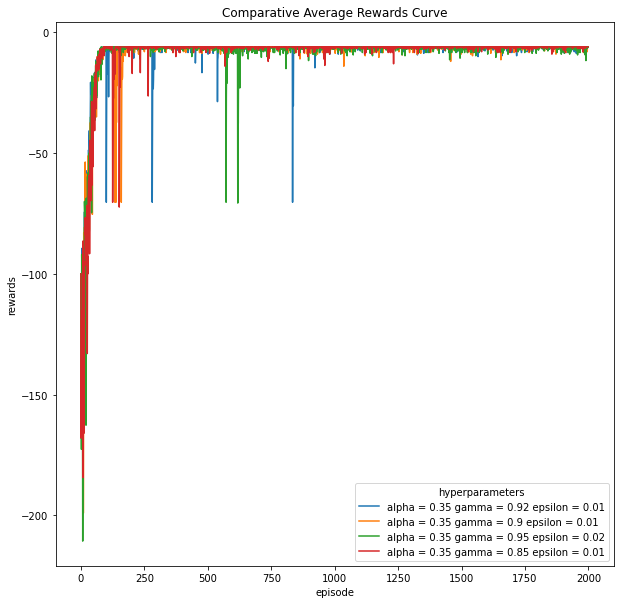

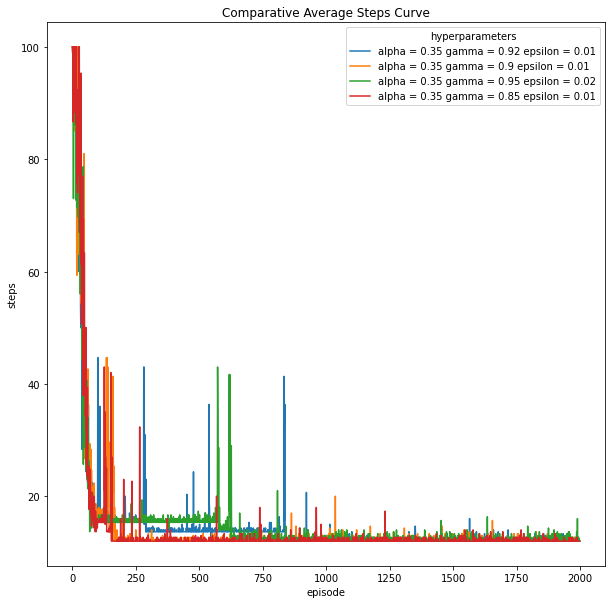

In [16]:
besthyperlist = [(0.35,0.92,0.01), (0.35,0.9,0.01), (0.35,0.95,0.02), (0.35,0.85,0.01)]
cno = 5

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:01<00:00, 1222.42it/s]


run - 2


100%|██████████| 2000/2000 [00:01<00:00, 1246.96it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 1842.56it/s]


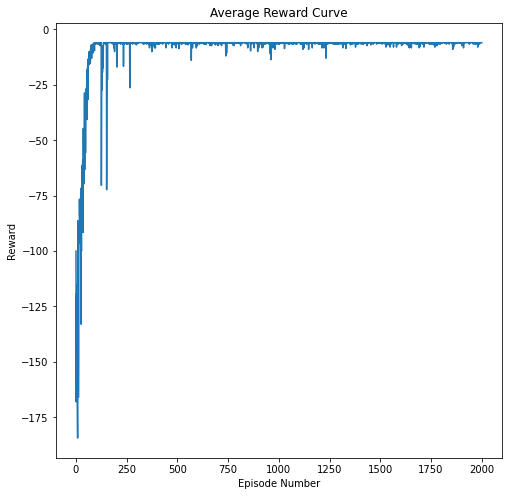

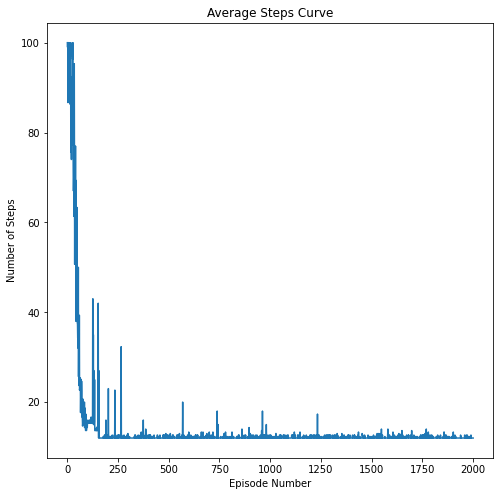

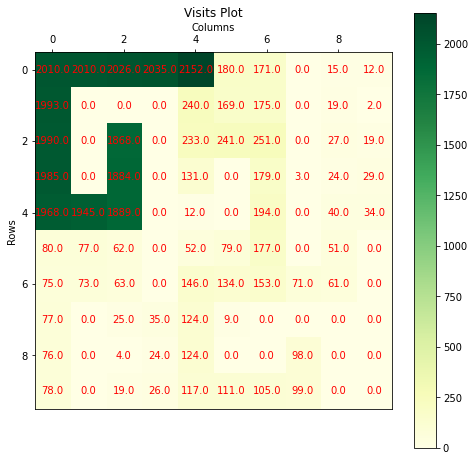

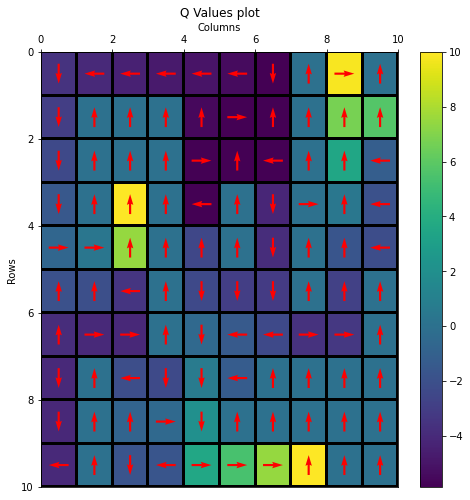

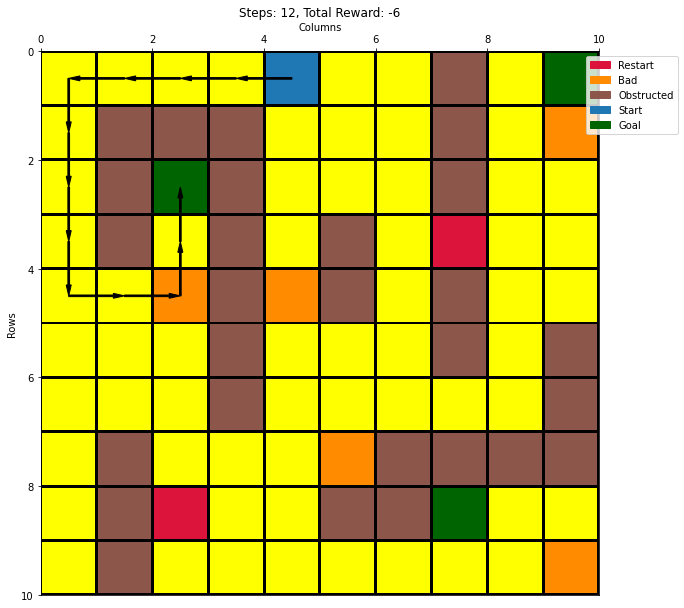

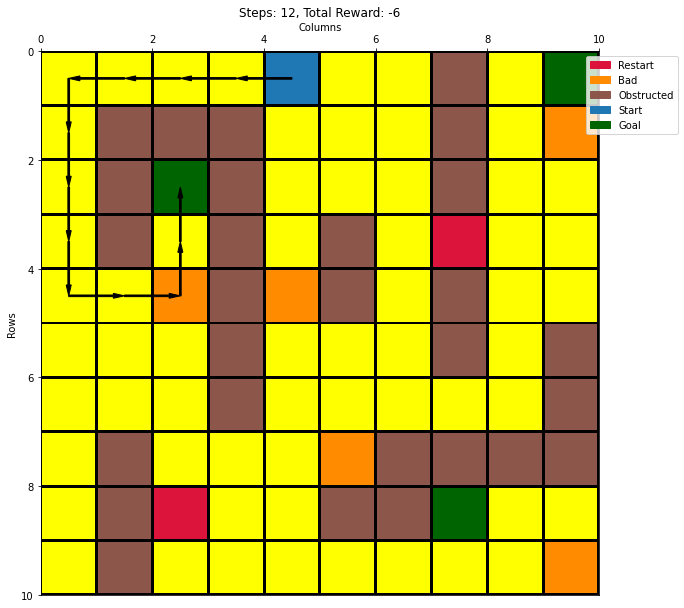

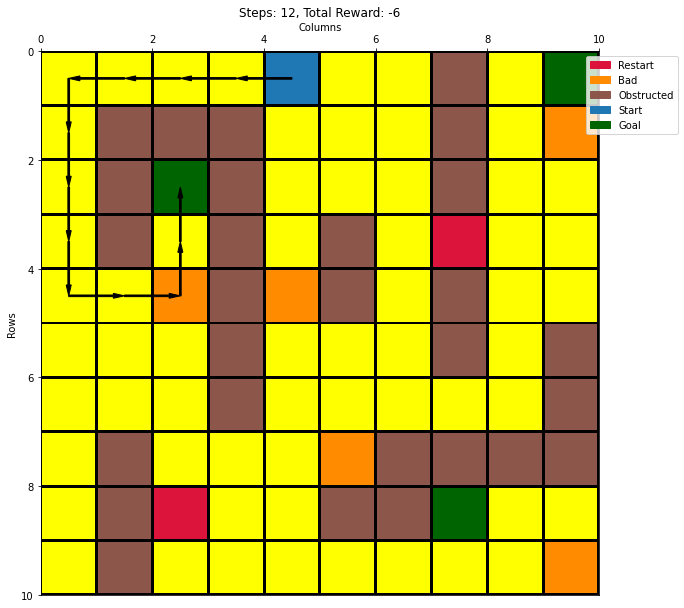

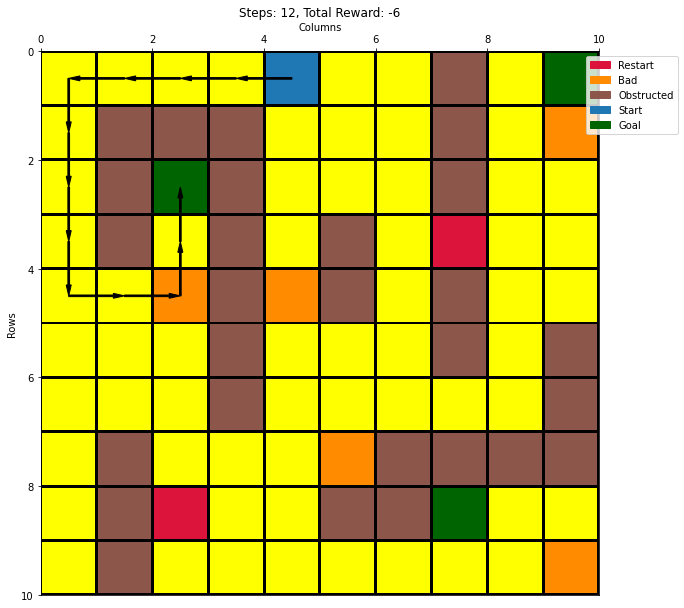

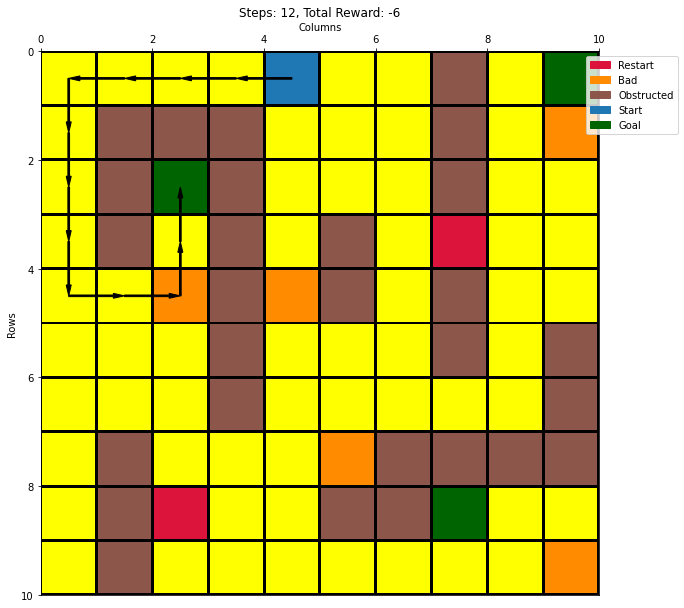

In [59]:
# best hyperparameters
balpha = 0.35
bgamma = 0.85
bepsilon = 0.01
cno = 5

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 6 - {wind = false, start = (0,4), p = 0.7} with SARSA and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:03<00:00, 573.28it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 443.04it/s]


run - 3


100%|██████████| 2000/2000 [00:03<00:00, 525.97it/s]


run - 1


100%|██████████| 2000/2000 [00:02<00:00, 699.77it/s]


run - 2


100%|██████████| 2000/2000 [00:02<00:00, 703.57it/s]


run - 3


100%|██████████| 2000/2000 [00:03<00:00, 526.37it/s]


run - 1


100%|██████████| 2000/2000 [00:04<00:00, 485.23it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 546.39it/s]


run - 3


100%|██████████| 2000/2000 [00:03<00:00, 546.25it/s]


run - 1


100%|██████████| 2000/2000 [00:05<00:00, 336.67it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 456.85it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 424.59it/s]


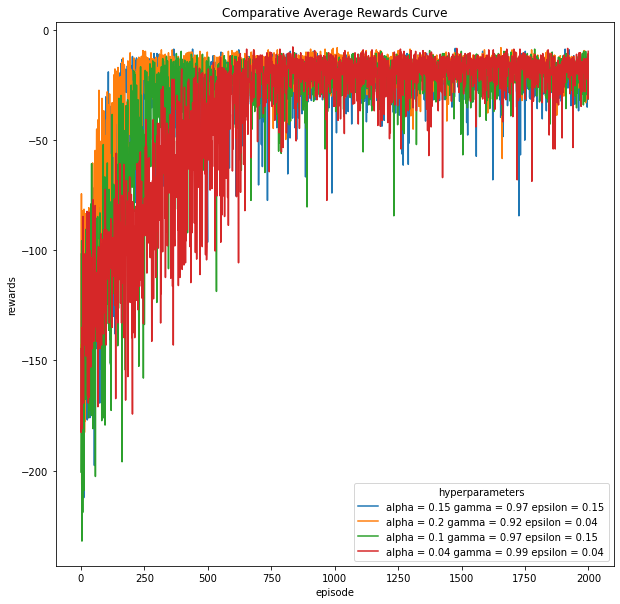

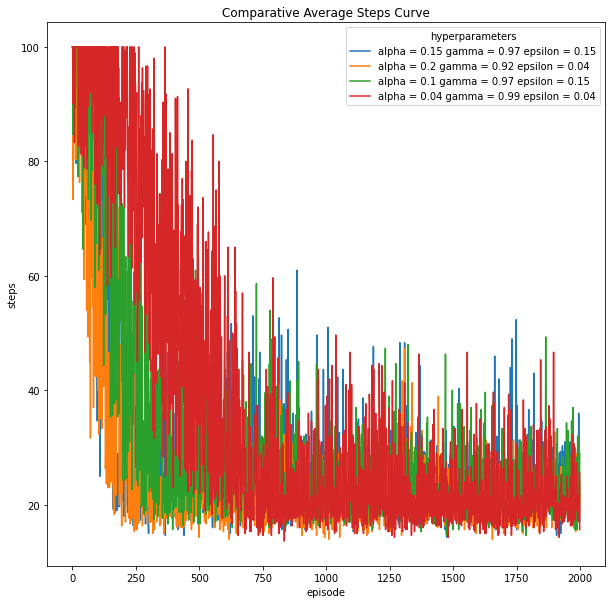

In [17]:
besthyperlist = [(0.15,0.97,0.15), (0.2,0.92,0.04), (0.1,0.97,0.15), (0.04,0.99,0.04)]
cno = 6

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:03<00:00, 583.39it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 639.81it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 1728.77it/s]


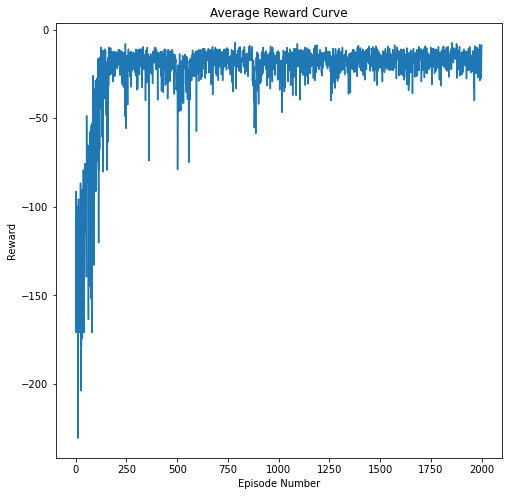

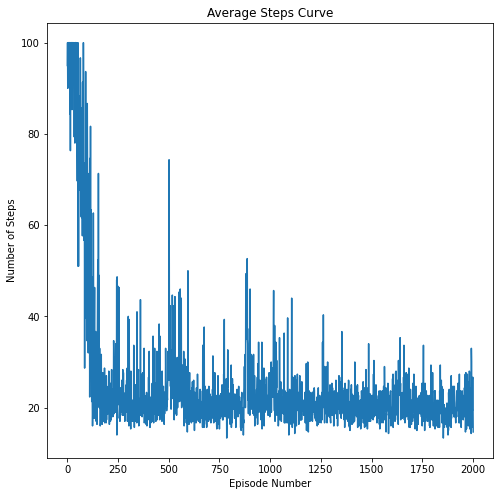

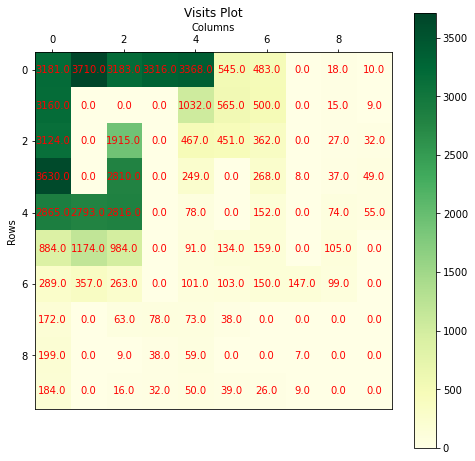

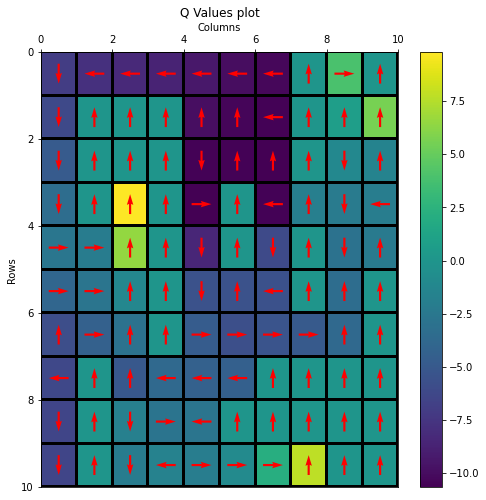

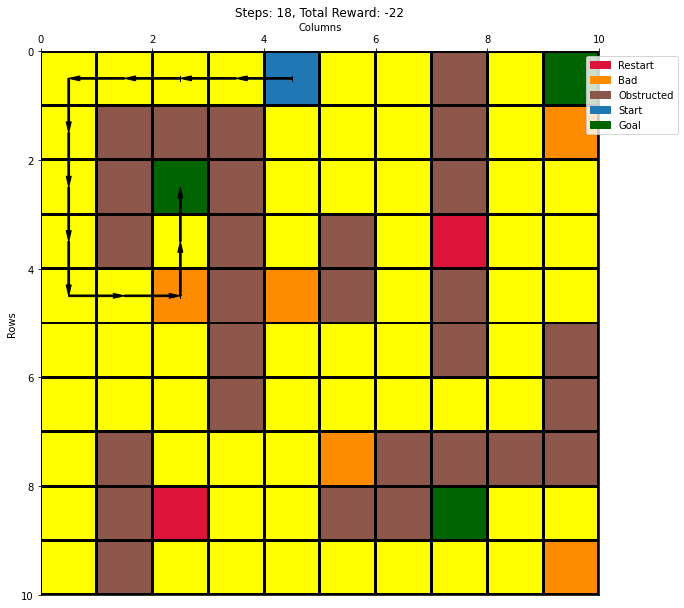

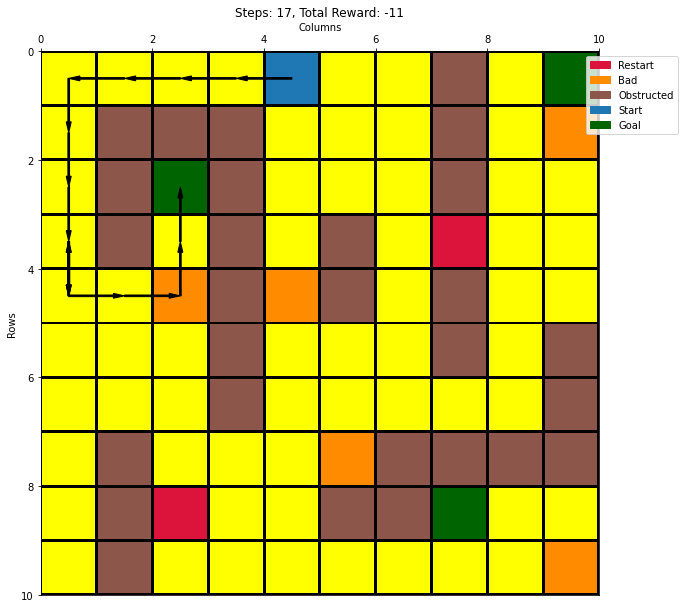

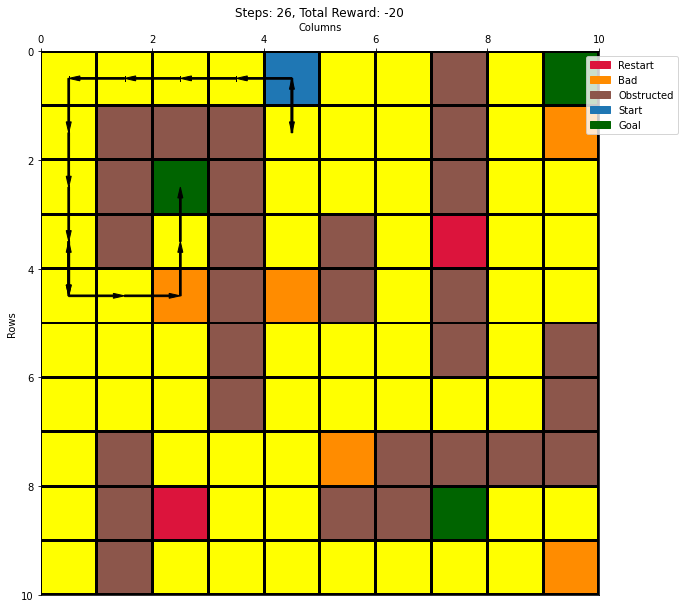

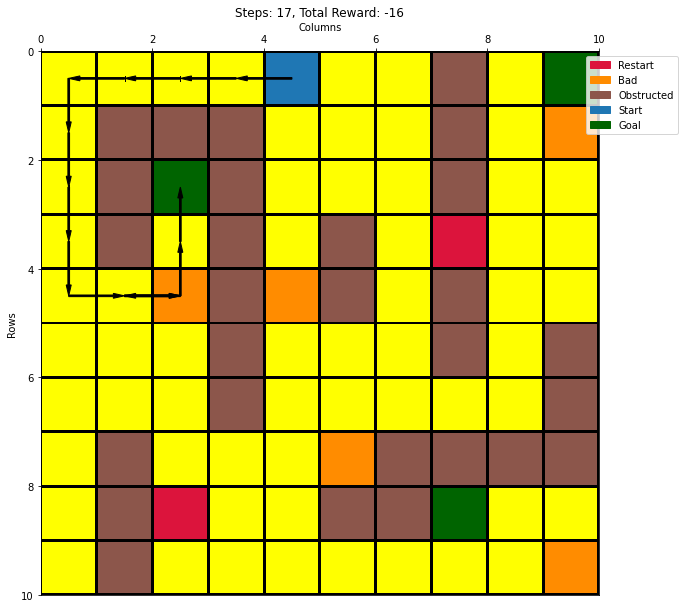

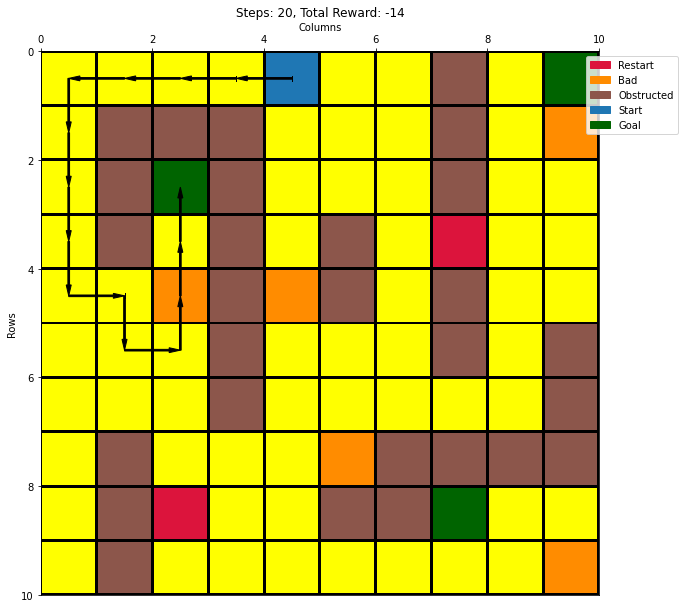

In [60]:
# best hyperparameters
balpha = 0.2
bgamma = 0.92
bepsilon = 0.04
cno = 6

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 7 - {wind = false, start = (3,6), p = 1.0} with SARSA and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:02<00:00, 693.97it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 460.00it/s]


run - 3


100%|██████████| 2000/2000 [00:02<00:00, 796.84it/s]


run - 1


100%|██████████| 2000/2000 [00:02<00:00, 698.19it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 569.11it/s]


run - 3


100%|██████████| 2000/2000 [00:02<00:00, 794.05it/s]


run - 1


100%|██████████| 2000/2000 [00:02<00:00, 872.89it/s] 


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 546.61it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 414.83it/s]


run - 1


100%|██████████| 2000/2000 [00:03<00:00, 587.01it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 655.81it/s]


run - 3


100%|██████████| 2000/2000 [00:02<00:00, 801.81it/s]


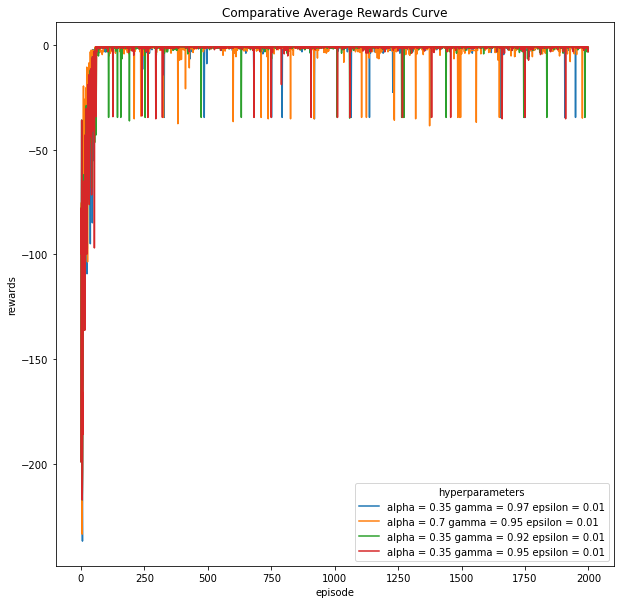

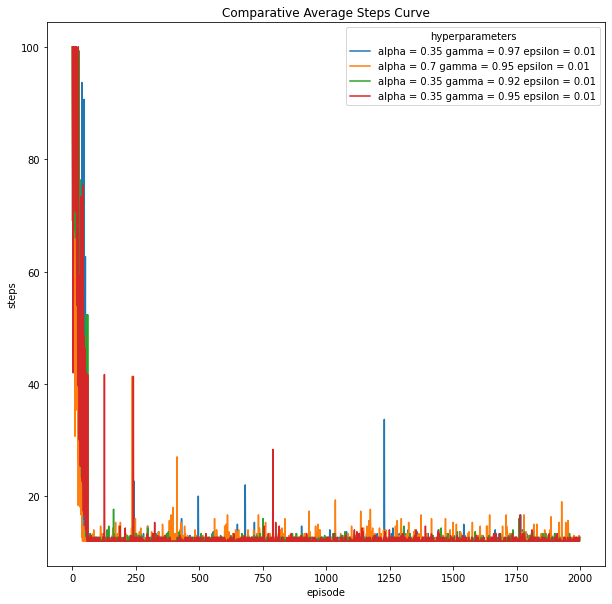

In [18]:
besthyperlist = [(0.35,0.97,0.01), (0.7,0.95,0.01), (0.35,0.92,0.01), (0.35,0.95,0.01)]
cno = 7

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:02<00:00, 805.73it/s]


run - 2


100%|██████████| 2000/2000 [00:02<00:00, 709.87it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 817.46it/s]


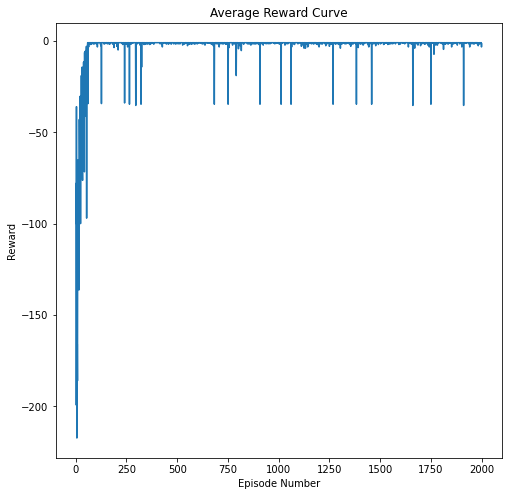

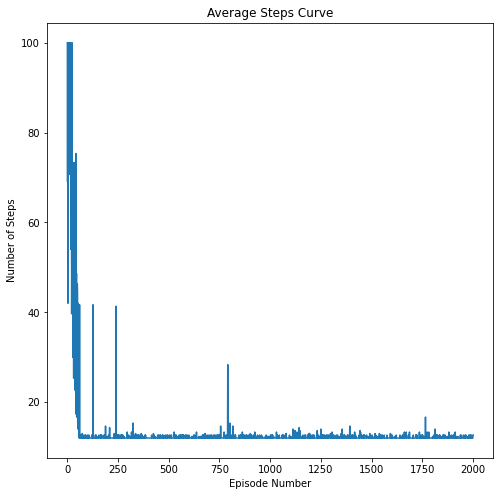

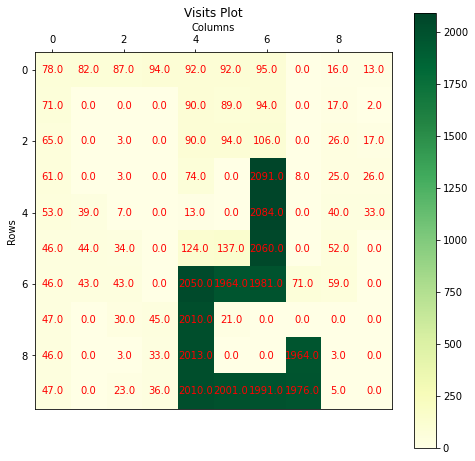

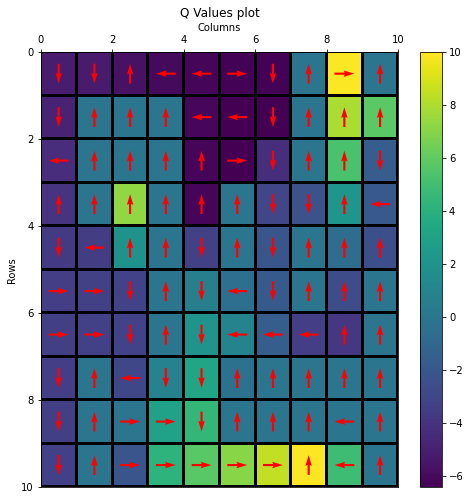

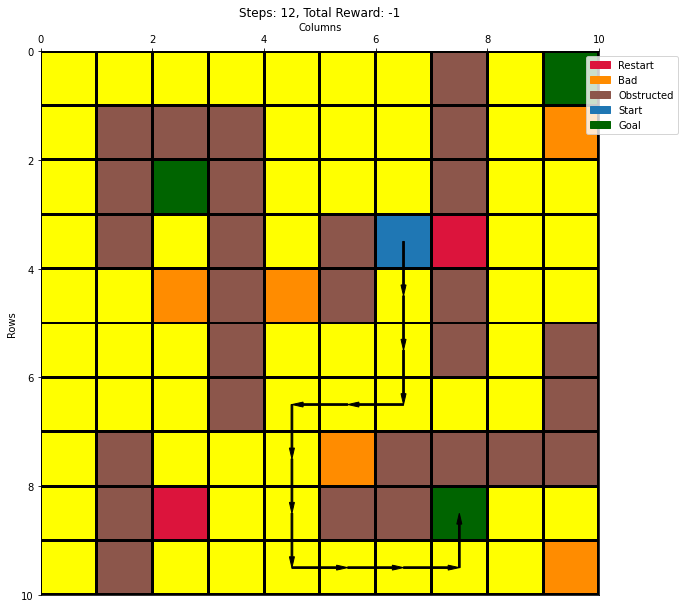

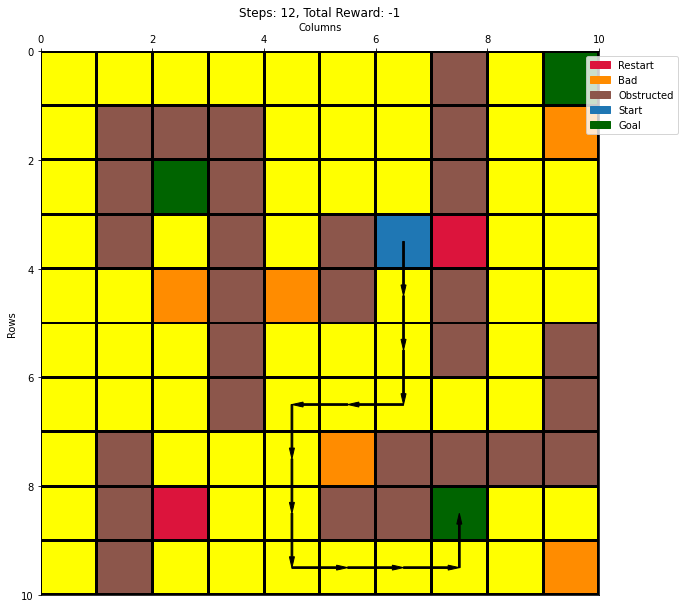

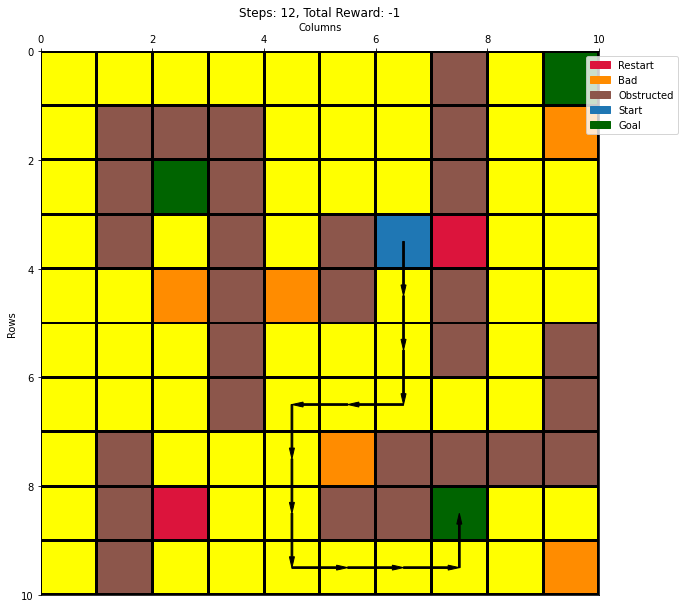

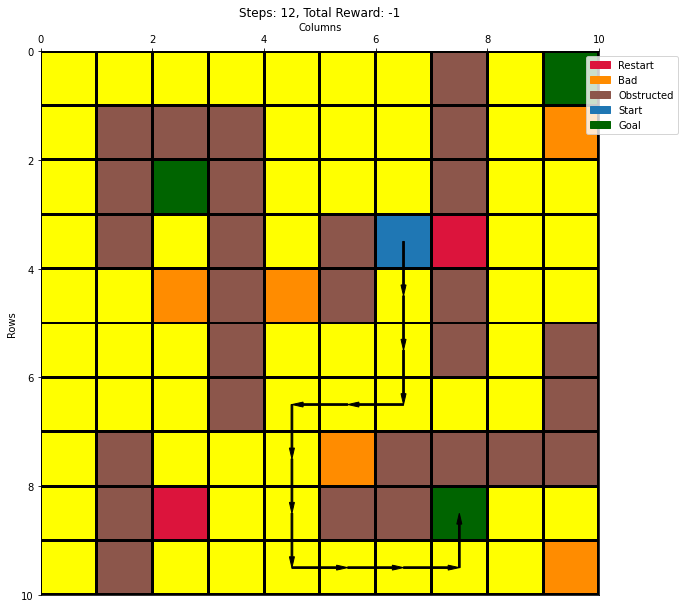

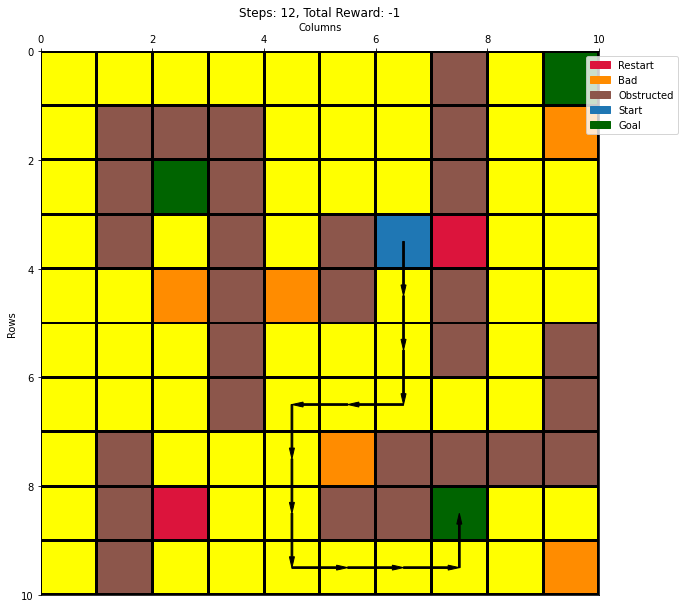

In [61]:
# best hyperparameters
balpha = 0.35
bgamma = 0.95
bepsilon = 0.01
cno = 7

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 8 - {wind = false, start = (3,6), p = 0.7} with SARSA and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:07<00:00, 278.75it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 371.45it/s]


run - 3


100%|██████████| 2000/2000 [00:06<00:00, 296.60it/s]


run - 1


100%|██████████| 2000/2000 [00:04<00:00, 434.18it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 473.45it/s]


run - 3


100%|██████████| 2000/2000 [00:05<00:00, 394.89it/s]


run - 1


100%|██████████| 2000/2000 [00:04<00:00, 442.27it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 456.96it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 449.65it/s]


run - 1


100%|██████████| 2000/2000 [00:05<00:00, 357.13it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 415.74it/s]


run - 3


100%|██████████| 2000/2000 [00:05<00:00, 398.95it/s]


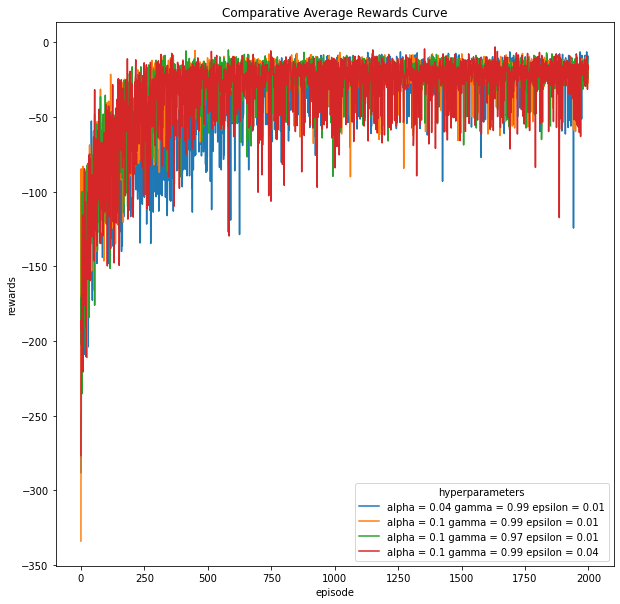

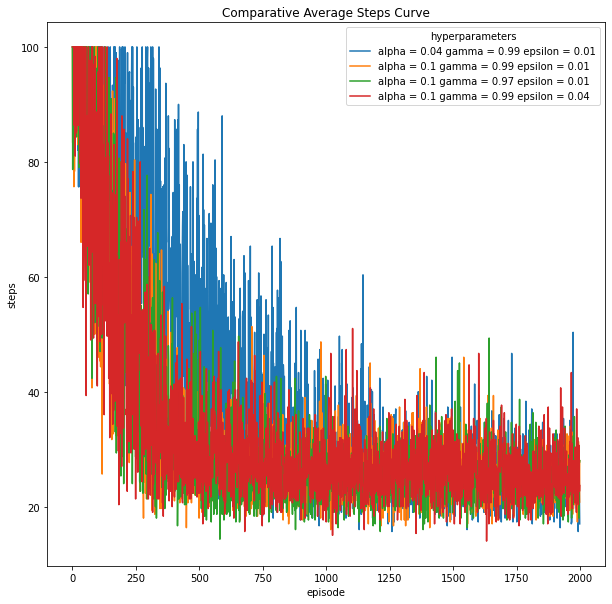

In [19]:
besthyperlist = [(0.04,0.99,0.01), (0.1,0.99,0.01), (0.1,0.97,0.01), (0.1,0.99,0.04)]
cno = 8

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:04<00:00, 484.42it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 392.85it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 699.44it/s]


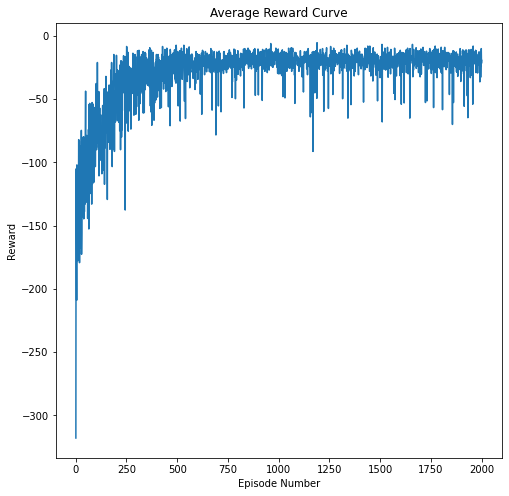

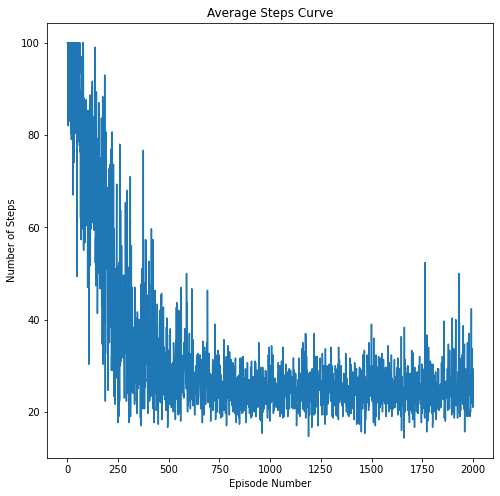

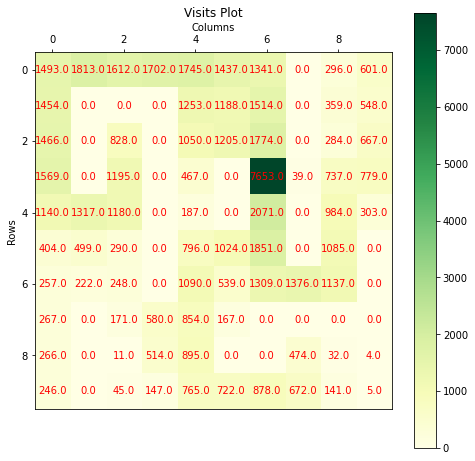

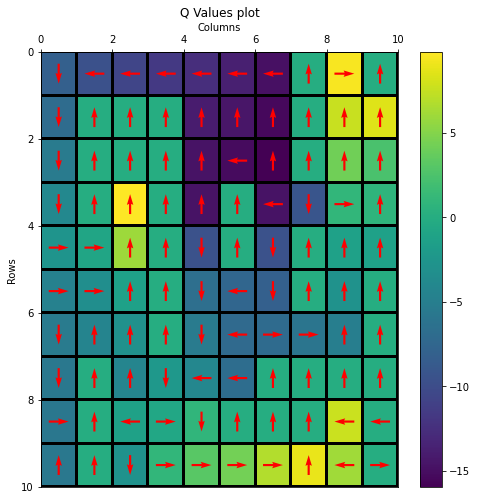

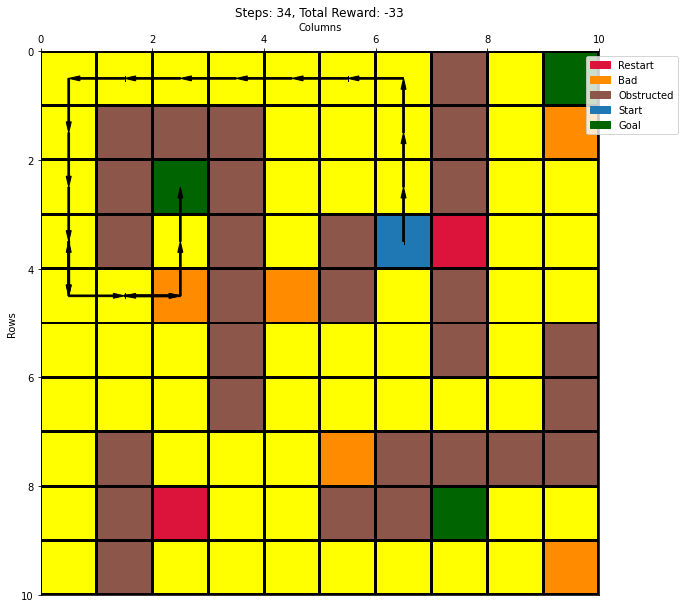

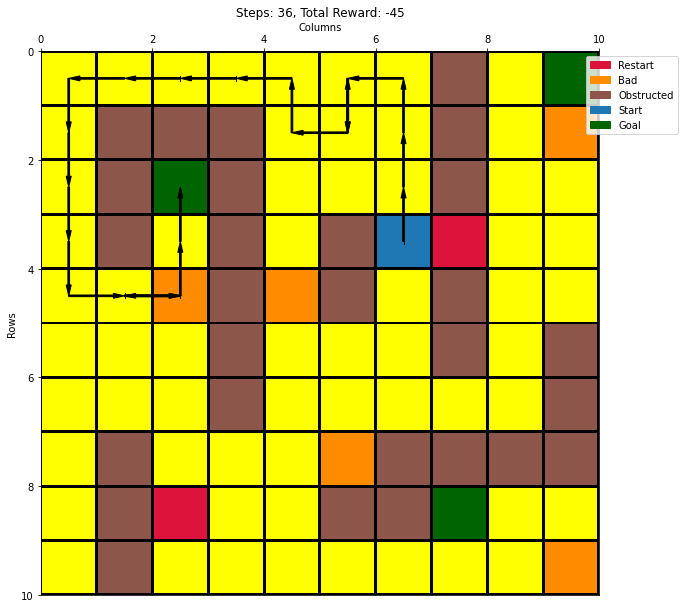

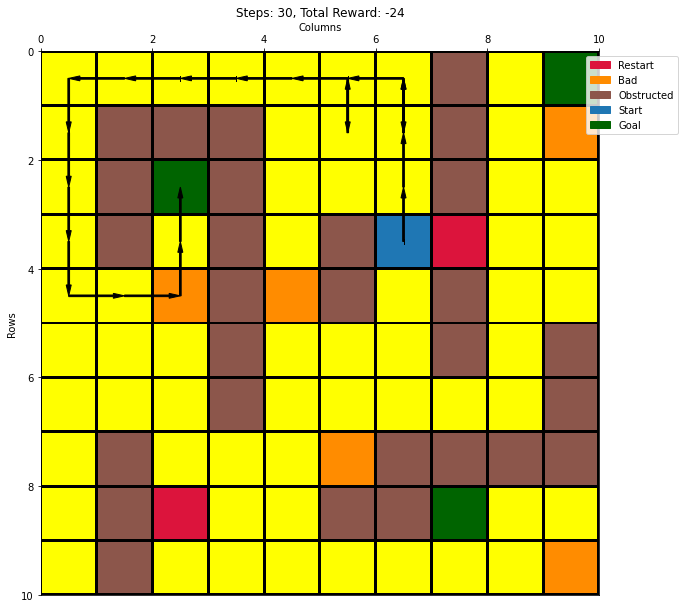

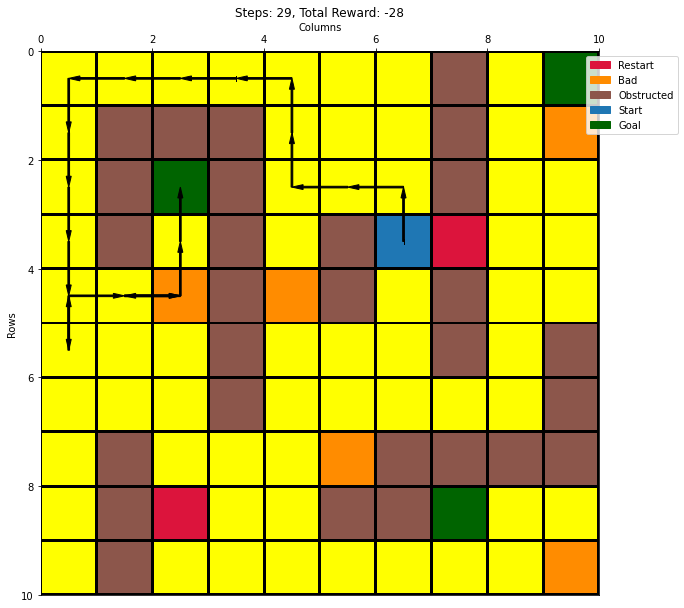

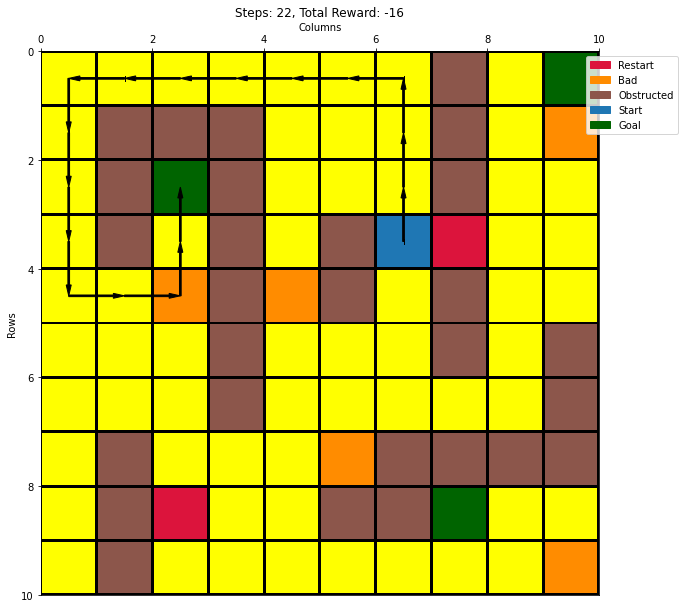

In [62]:
# best hyperparameters
balpha = 0.1
bgamma = 0.97
bepsilon = 0.01
cno = 8

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 9 - {wind = true, start = (0,4), p = 1.0} with SARSA and softmax selection

run - 1


100%|██████████| 2000/2000 [00:07<00:00, 268.16it/s]


run - 2


100%|██████████| 2000/2000 [00:08<00:00, 234.80it/s]


run - 3


100%|██████████| 2000/2000 [00:06<00:00, 288.61it/s]


run - 1


100%|██████████| 2000/2000 [00:17<00:00, 115.29it/s]


run - 2


100%|██████████| 2000/2000 [00:15<00:00, 126.24it/s]


run - 3


100%|██████████| 2000/2000 [00:15<00:00, 125.07it/s]


run - 1


100%|██████████| 2000/2000 [00:31<00:00, 63.32it/s]


run - 2


100%|██████████| 2000/2000 [00:30<00:00, 66.02it/s]


run - 3


100%|██████████| 2000/2000 [00:30<00:00, 65.47it/s]


run - 1


100%|██████████| 2000/2000 [00:06<00:00, 311.60it/s]


run - 2


100%|██████████| 2000/2000 [00:08<00:00, 249.49it/s]


run - 3


100%|██████████| 2000/2000 [00:08<00:00, 247.07it/s]


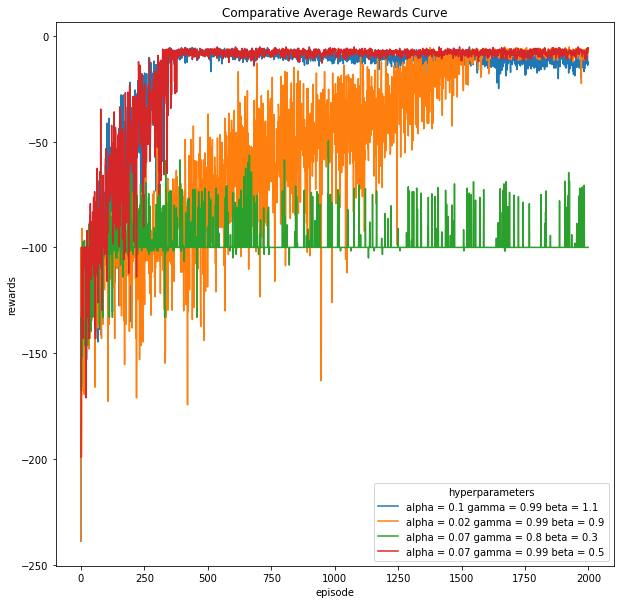

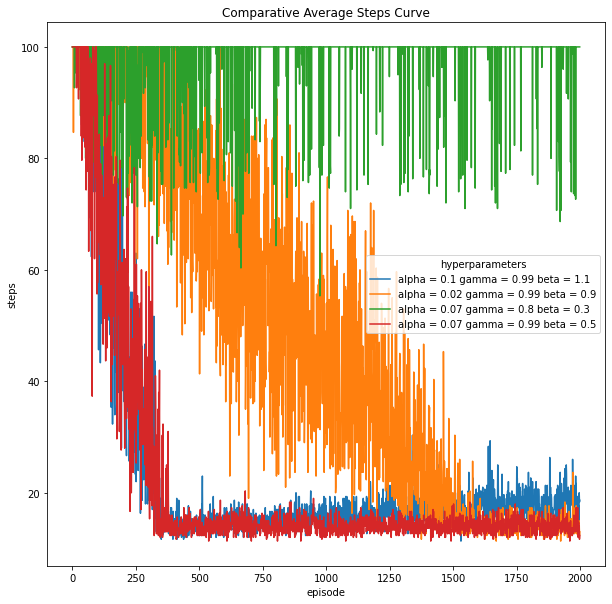

In [53]:
besthyperlist = [(0.1,0.99,1.1), (0.02,0.99,0.9), (0.07,0.8,0.3), (0.07,0.99,0.5)]
cno = 9

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:08<00:00, 236.93it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 305.10it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 1509.76it/s]


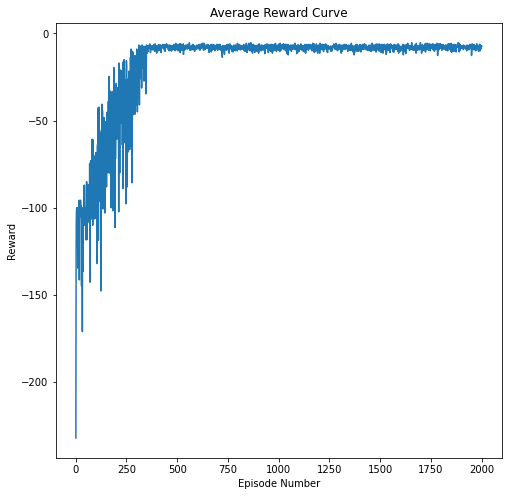

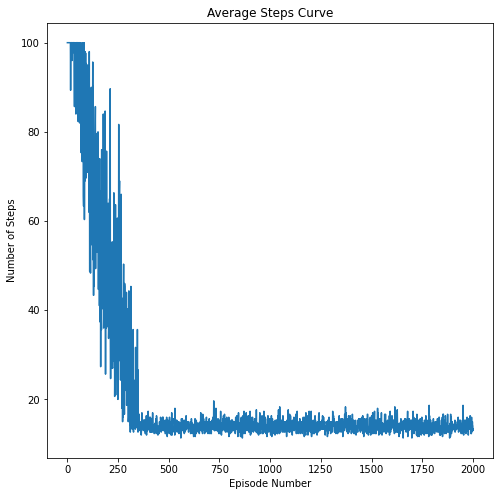

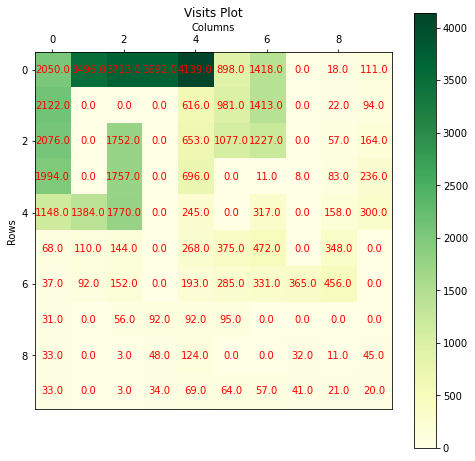

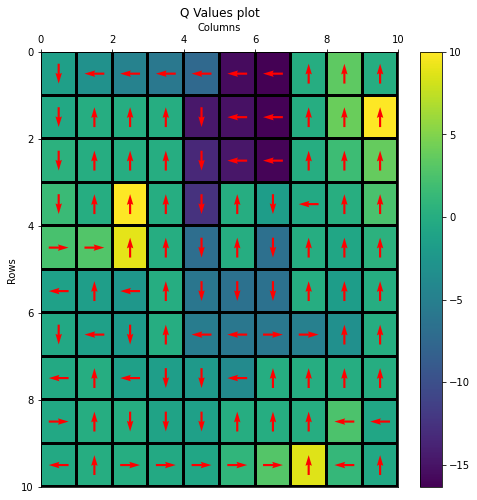

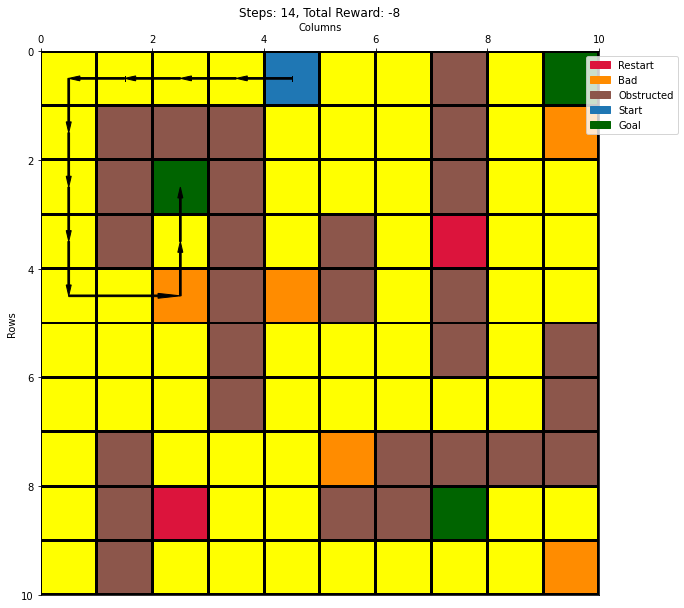

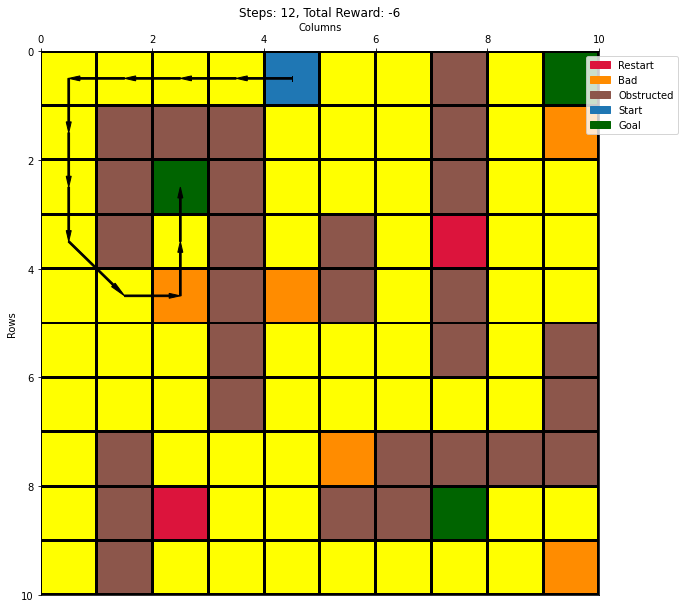

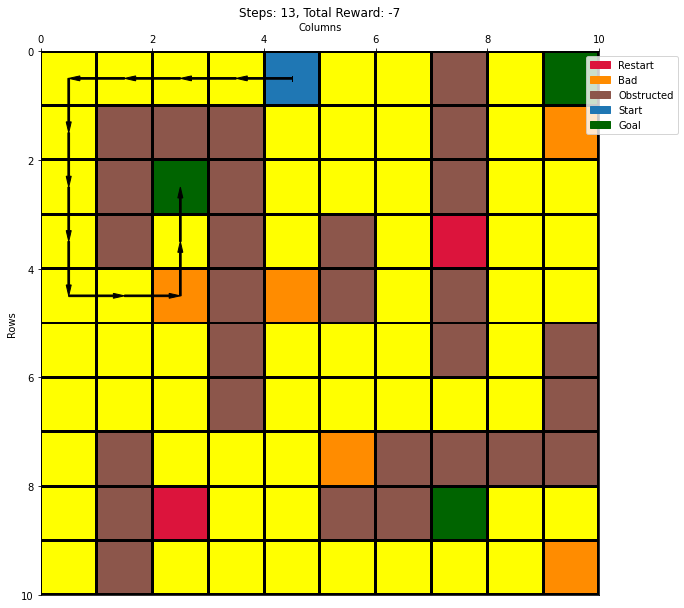

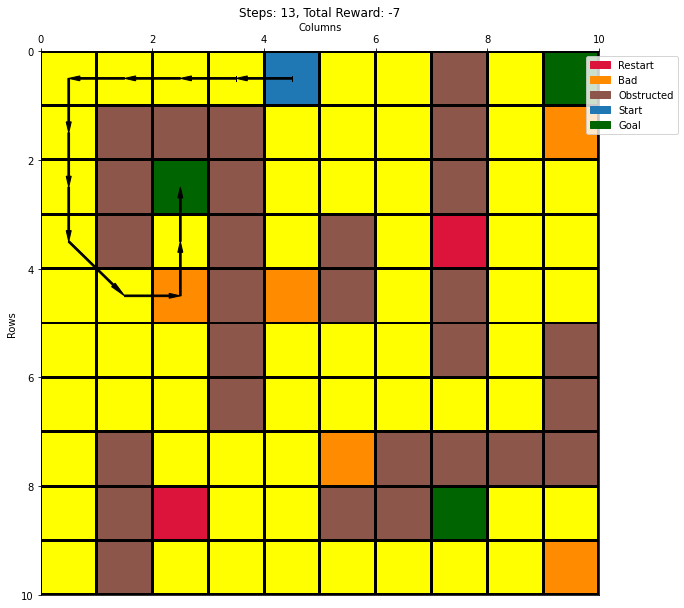

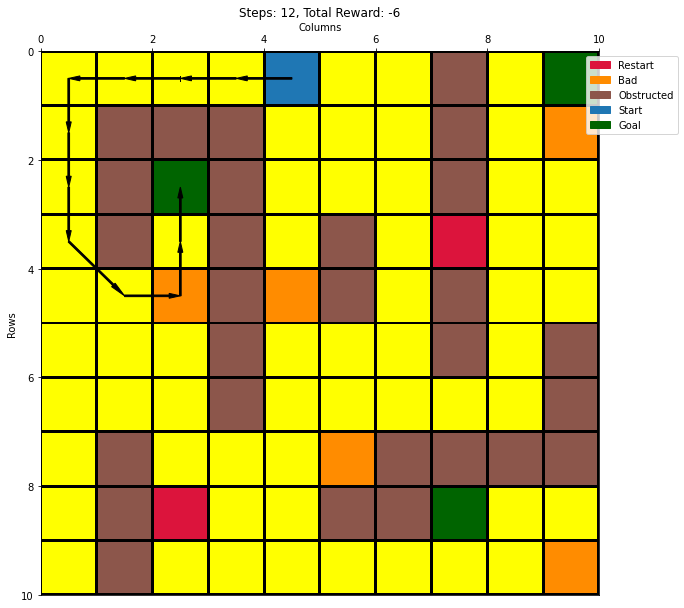

In [63]:
# best hyperparameters
balpha = 0.07
bgamma = 0.99
bbeta = 0.5
cno = 9

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

# Configuration 10 - {wind = true, start = (0,4), p = 0.7} with SARSA and softmax selection

run - 1


100%|██████████| 2000/2000 [00:14<00:00, 141.34it/s]


run - 2


100%|██████████| 2000/2000 [00:14<00:00, 141.14it/s]


run - 3


100%|██████████| 2000/2000 [00:13<00:00, 146.29it/s]


run - 1


100%|██████████| 2000/2000 [00:13<00:00, 147.19it/s]


run - 2


100%|██████████| 2000/2000 [00:13<00:00, 147.13it/s]


run - 3


100%|██████████| 2000/2000 [00:14<00:00, 134.76it/s]


run - 1


100%|██████████| 2000/2000 [00:10<00:00, 184.85it/s]


run - 2


100%|██████████| 2000/2000 [00:11<00:00, 180.05it/s]


run - 3


100%|██████████| 2000/2000 [00:11<00:00, 175.45it/s]


run - 1


100%|██████████| 2000/2000 [00:11<00:00, 169.62it/s]


run - 2


100%|██████████| 2000/2000 [00:11<00:00, 172.62it/s]


run - 3


100%|██████████| 2000/2000 [00:10<00:00, 189.96it/s]


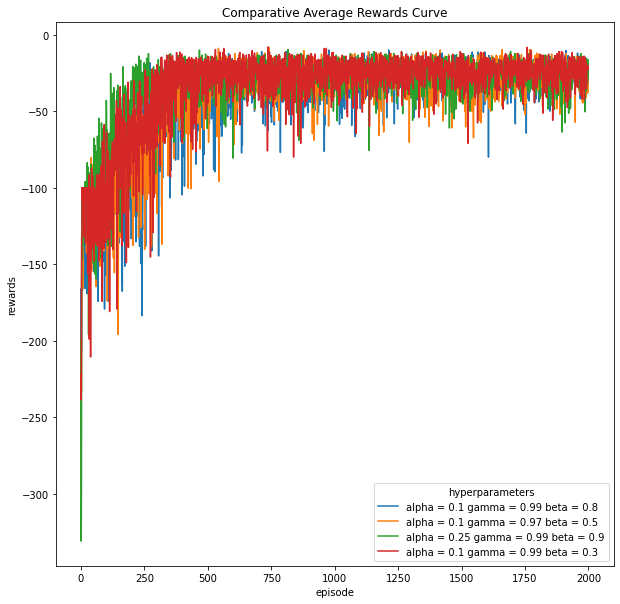

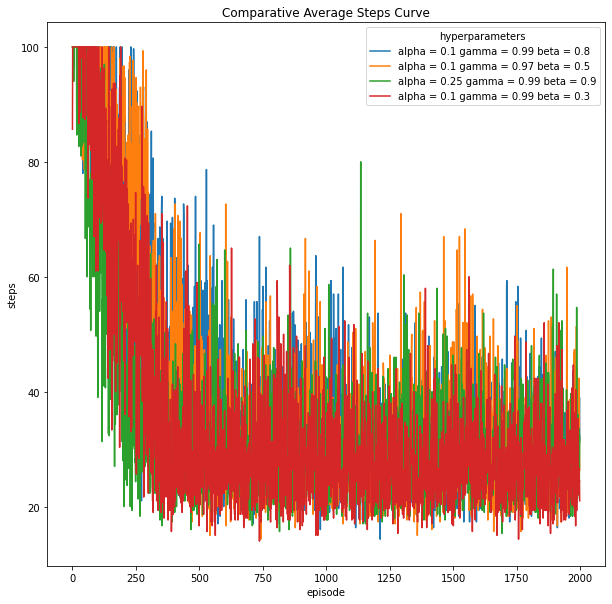

In [21]:
besthyperlist = [(0.1,0.99,0.8), (0.1,0.97,0.5), (0.25,0.99,0.9), (0.1,0.99,0.3)]
cno = 10

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:13<00:00, 144.56it/s]


run - 2


100%|██████████| 2000/2000 [00:15<00:00, 129.64it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 826.60it/s]


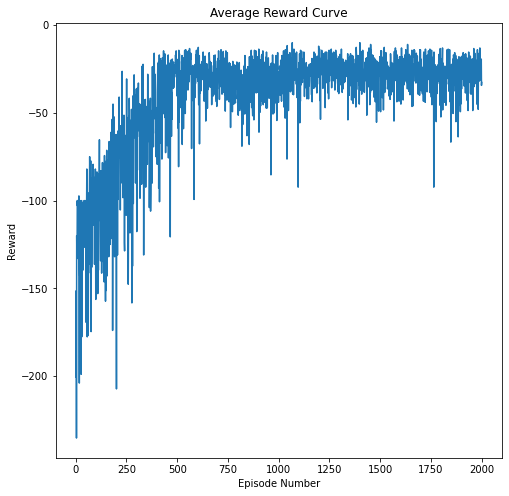

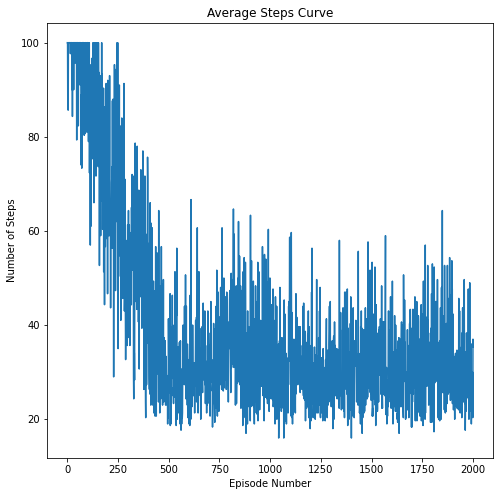

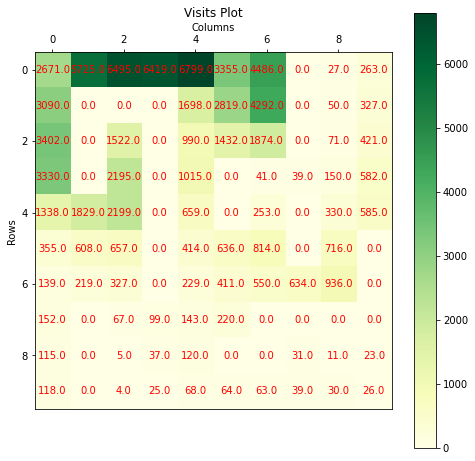

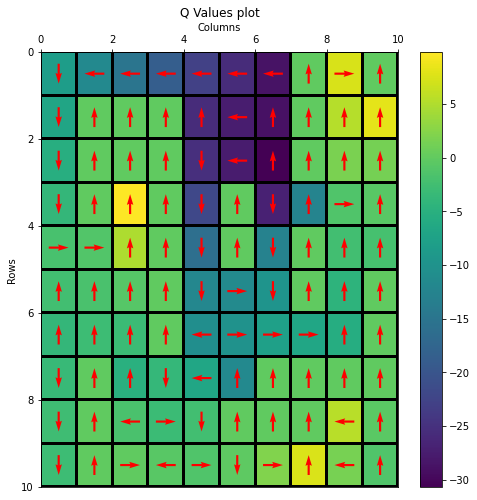

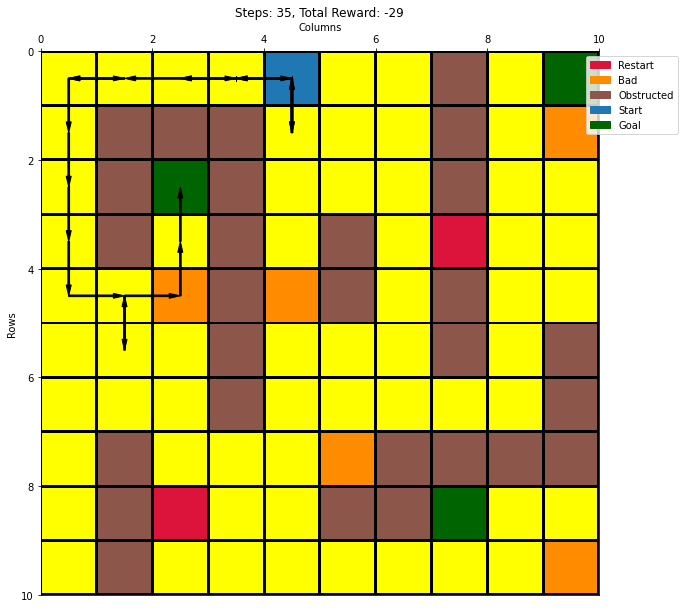

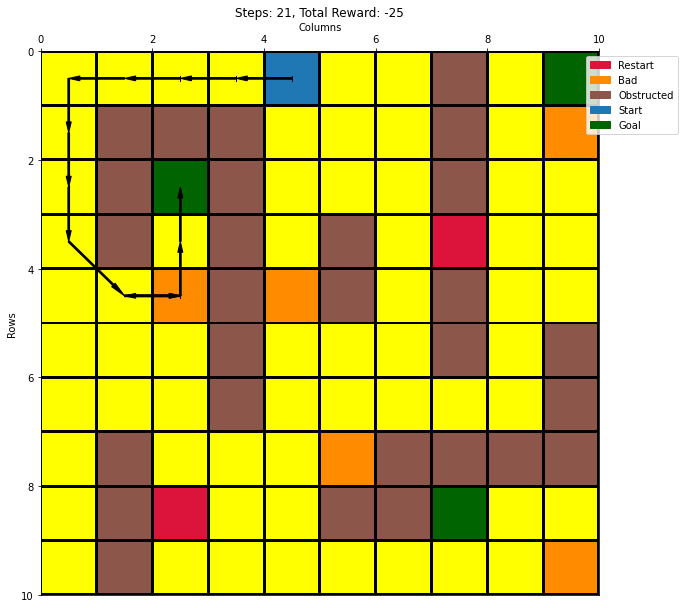

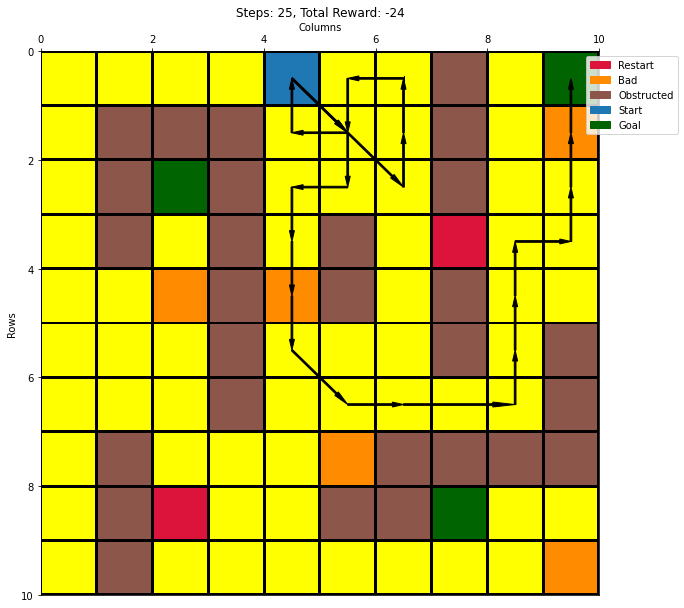

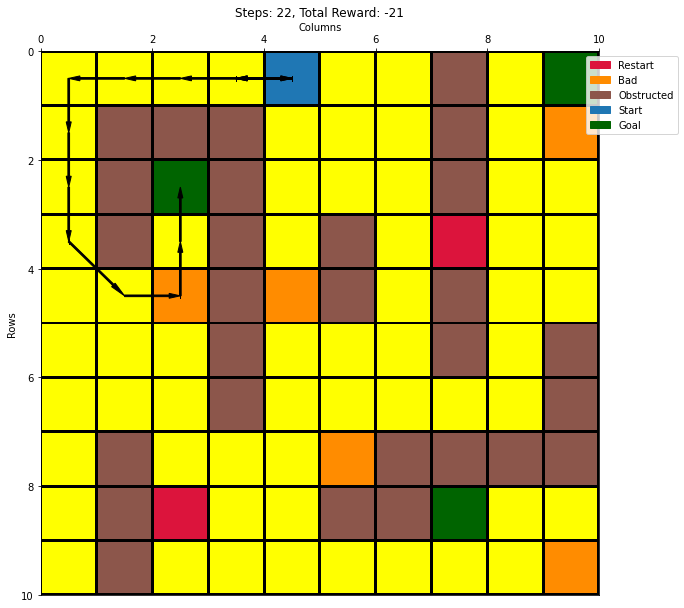

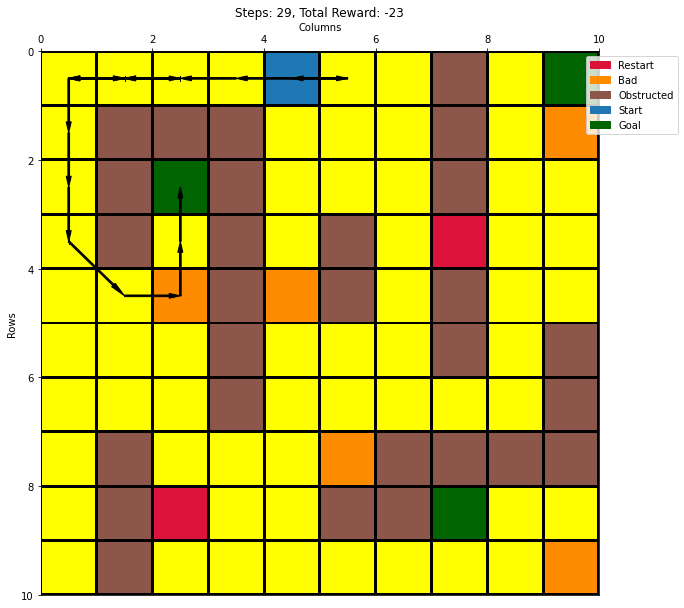

In [64]:
# best hyperparameters
balpha = 0.1
bgamma = 0.99
bbeta = 0.8
cno = 10

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

# Configuration 11 - {wind = true, start = (3,6), p = 1.0} with SARSA and softmax selection

run - 1


100%|██████████| 2000/2000 [00:06<00:00, 297.52it/s]


run - 2


100%|██████████| 2000/2000 [00:07<00:00, 263.58it/s]


run - 3


100%|██████████| 2000/2000 [00:06<00:00, 307.30it/s]


run - 1


100%|██████████| 2000/2000 [00:04<00:00, 477.09it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 323.59it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 447.66it/s]


run - 1


100%|██████████| 2000/2000 [00:08<00:00, 223.13it/s]


run - 2


100%|██████████| 2000/2000 [00:07<00:00, 270.83it/s]


run - 3


100%|██████████| 2000/2000 [00:08<00:00, 230.36it/s]


run - 1


100%|██████████| 2000/2000 [00:08<00:00, 222.50it/s]


run - 2


100%|██████████| 2000/2000 [00:09<00:00, 203.94it/s]


run - 3


100%|██████████| 2000/2000 [00:10<00:00, 193.66it/s]


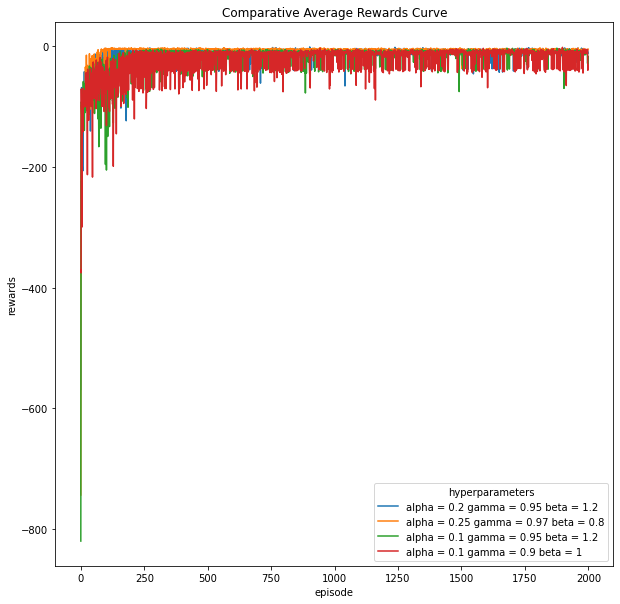

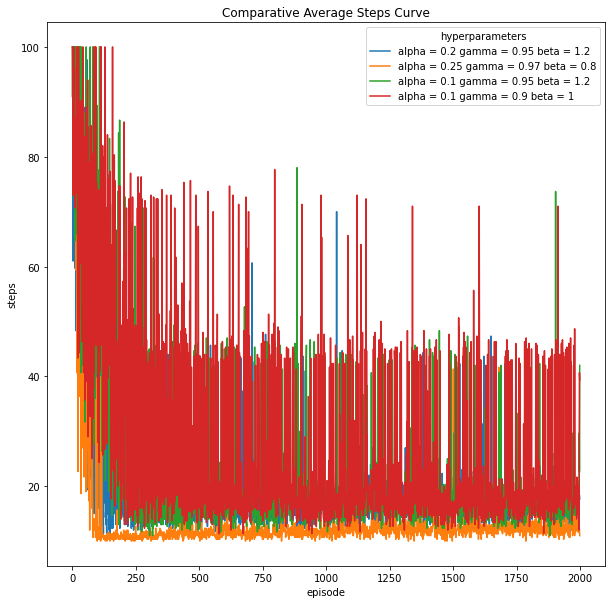

In [22]:
besthyperlist = [(0.2,0.95,1.2), (0.25,0.97,0.8), (0.1,0.95,1.2), (0.1,0.9,1)]
cno = 11

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:04<00:00, 420.01it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 306.46it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 1884.53it/s]


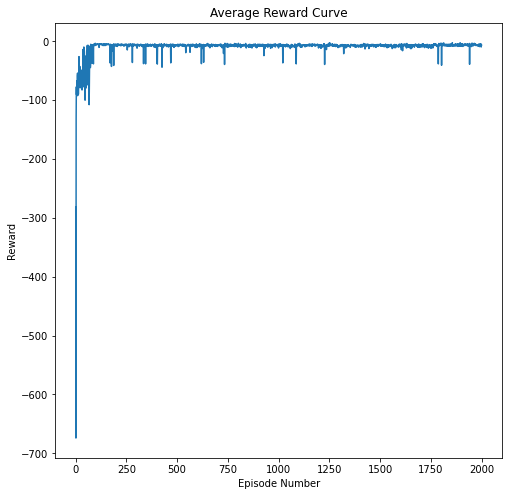

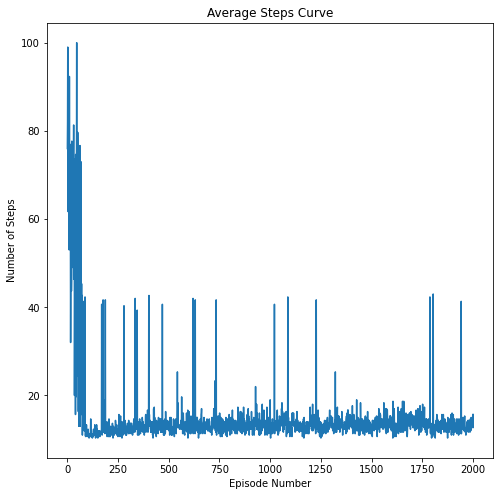

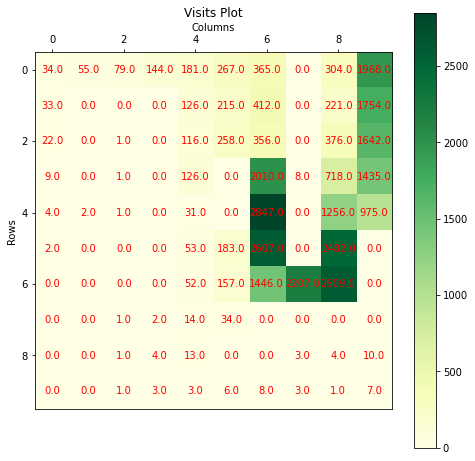

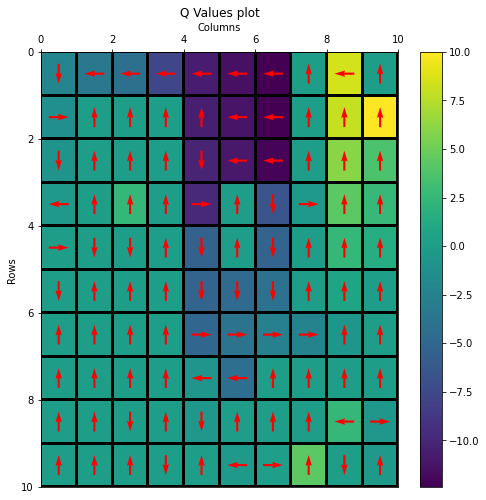

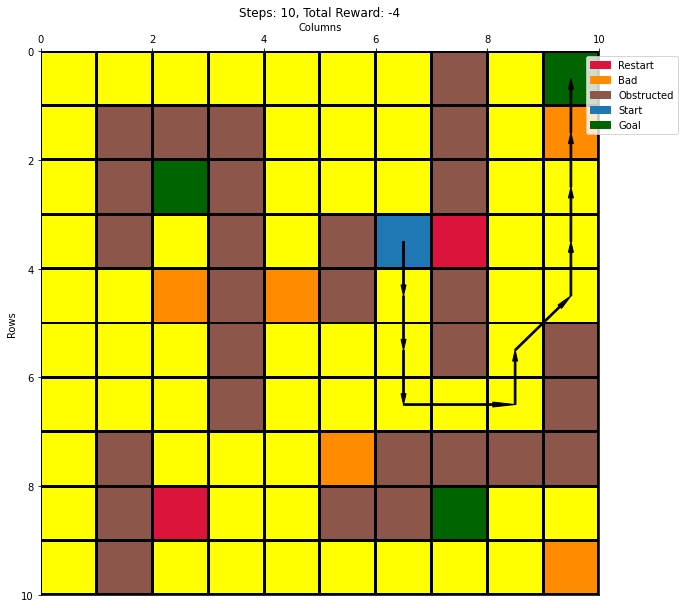

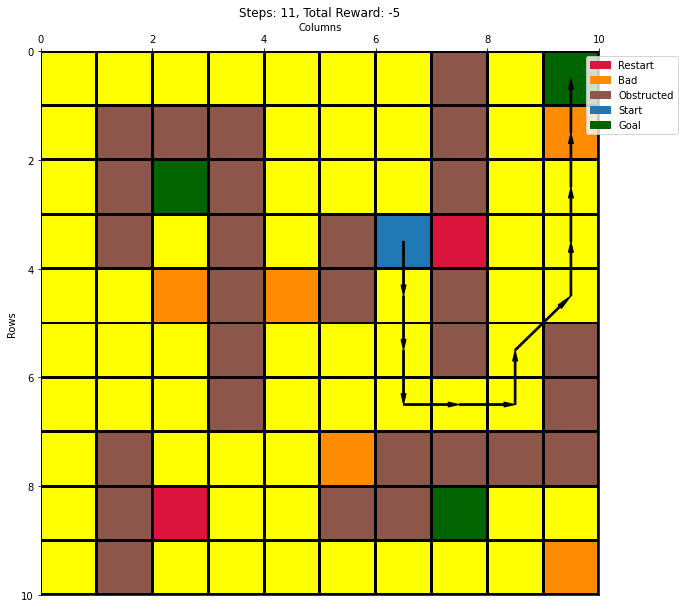

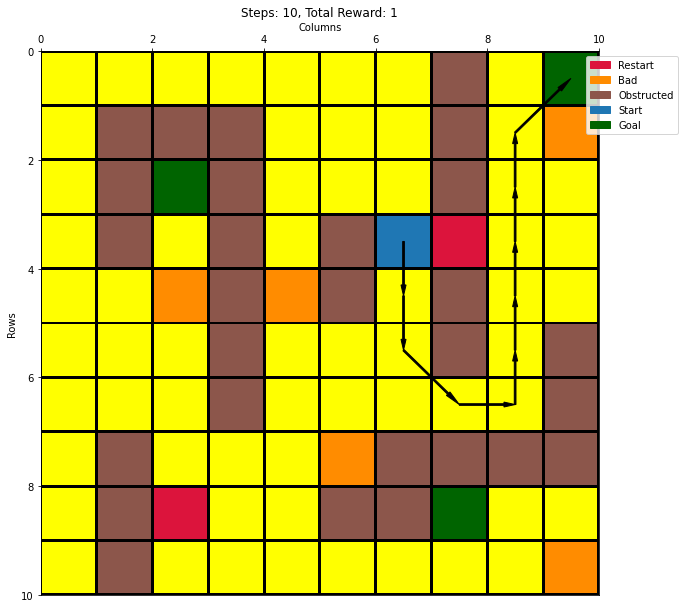

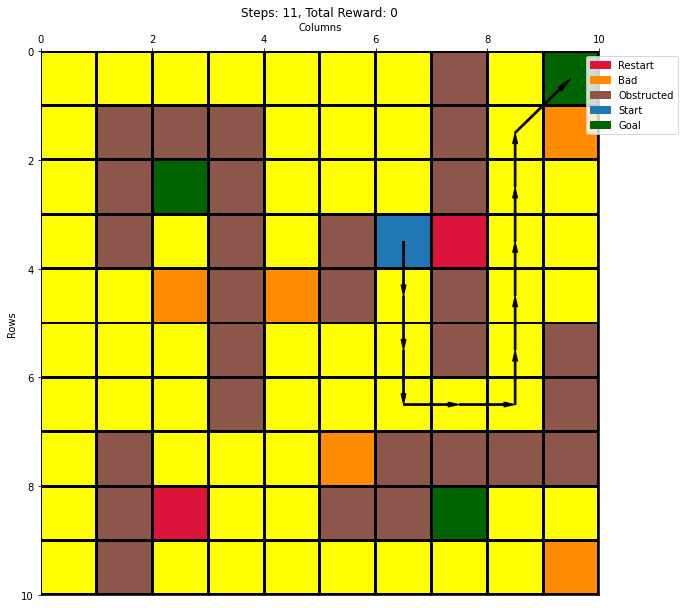

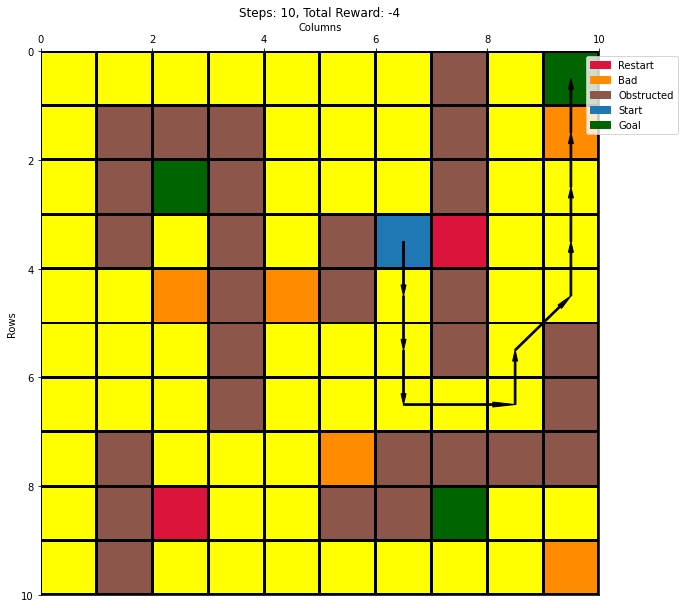

In [65]:
# best hyperparameters
balpha = 0.25
bgamma = 0.97
bbeta = 0.8
cno = 11

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

# Configuration 12 - {wind = true, start = (3,6), p = 0.7} with SARSA and softmax selection

run - 1


100%|██████████| 2000/2000 [00:16<00:00, 120.97it/s]


run - 2


100%|██████████| 2000/2000 [00:11<00:00, 173.44it/s]


run - 3


100%|██████████| 2000/2000 [00:16<00:00, 117.65it/s]


run - 1


100%|██████████| 2000/2000 [00:13<00:00, 153.67it/s]


run - 2


100%|██████████| 2000/2000 [00:14<00:00, 137.59it/s]


run - 3


100%|██████████| 2000/2000 [00:12<00:00, 156.46it/s]


run - 1


100%|██████████| 2000/2000 [00:25<00:00, 79.18it/s]


run - 2


100%|██████████| 2000/2000 [00:28<00:00, 69.63it/s]


run - 3


100%|██████████| 2000/2000 [00:20<00:00, 99.07it/s]


run - 1


100%|██████████| 2000/2000 [00:25<00:00, 78.91it/s]


run - 2


100%|██████████| 2000/2000 [00:47<00:00, 41.89it/s] 


run - 3


100%|██████████| 2000/2000 [00:18<00:00, 105.31it/s]


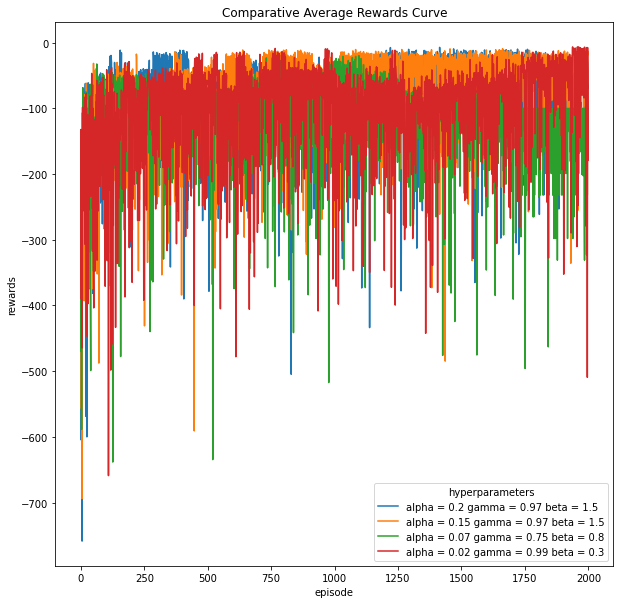

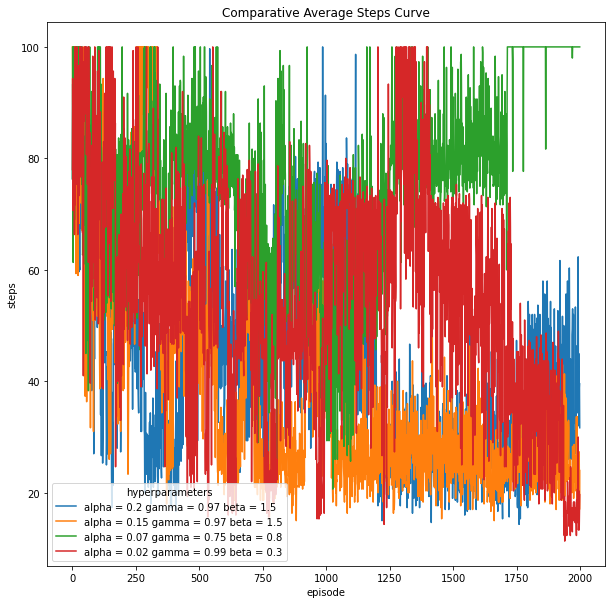

In [23]:
besthyperlist = [(0.2,0.97,1.5), (0.15,0.97,1.5), (0.07,0.75,0.8), (0.02,0.99,0.3)]
cno = 12

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:13<00:00, 153.61it/s]


run - 2


100%|██████████| 2000/2000 [00:23<00:00, 84.55it/s] 


run - 3


100%|██████████| 100/100 [00:00<00:00, 766.02it/s]


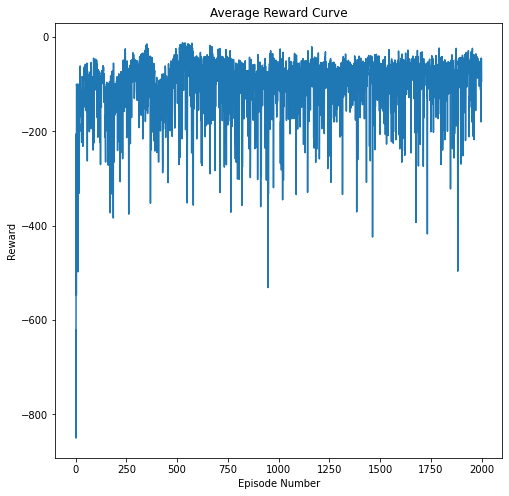

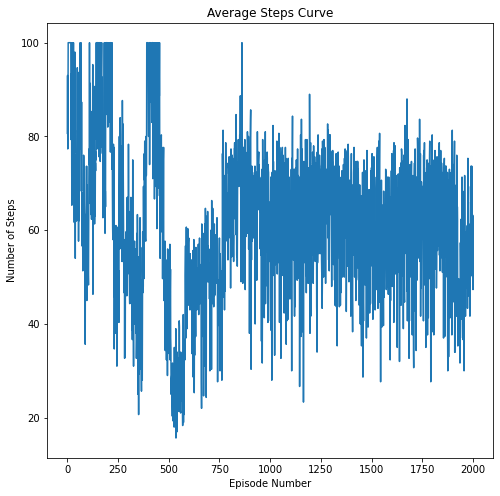

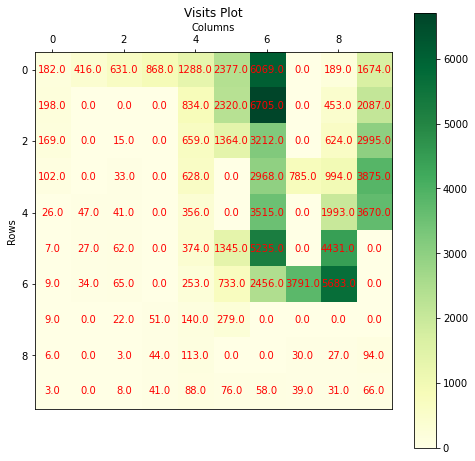

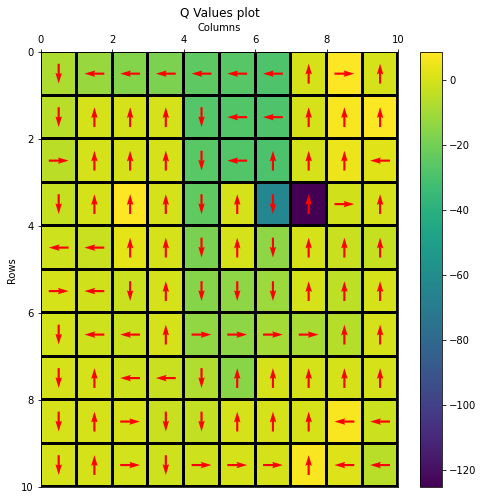

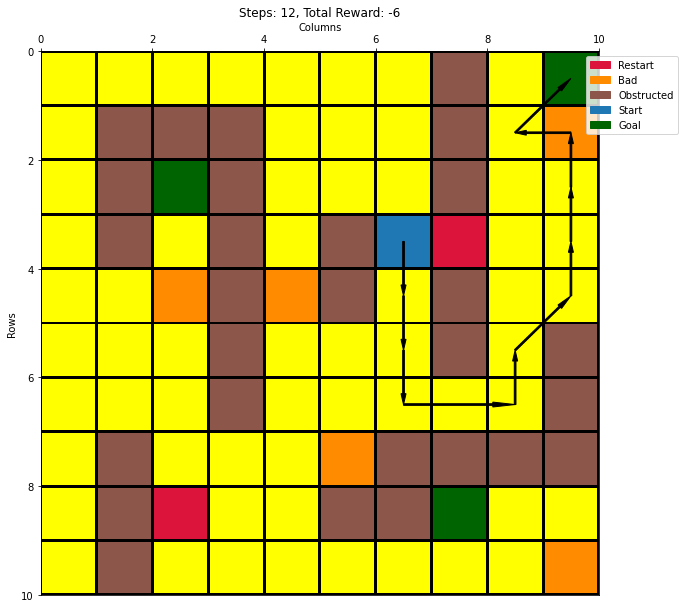

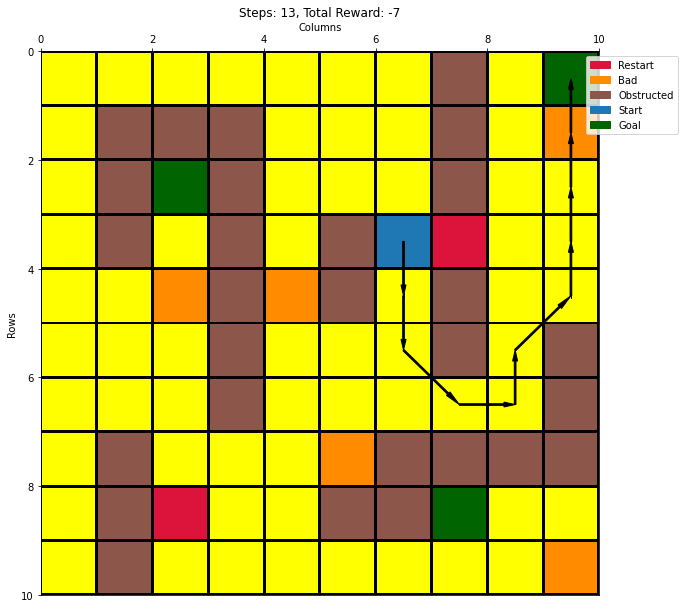

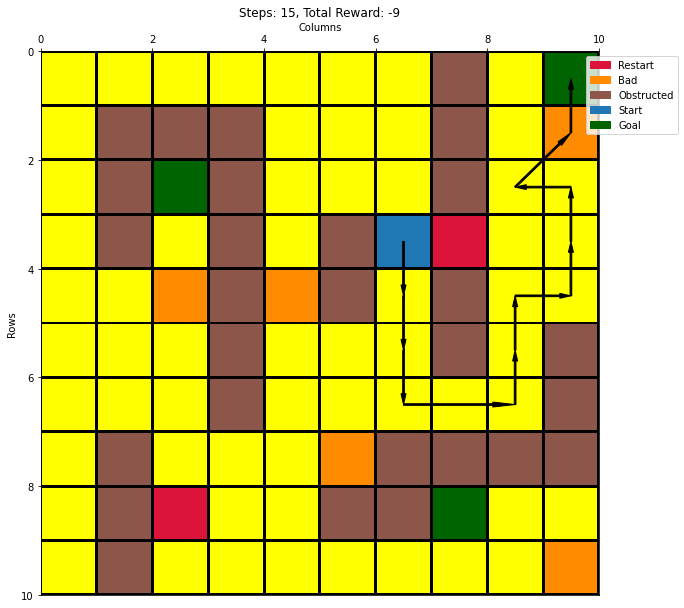

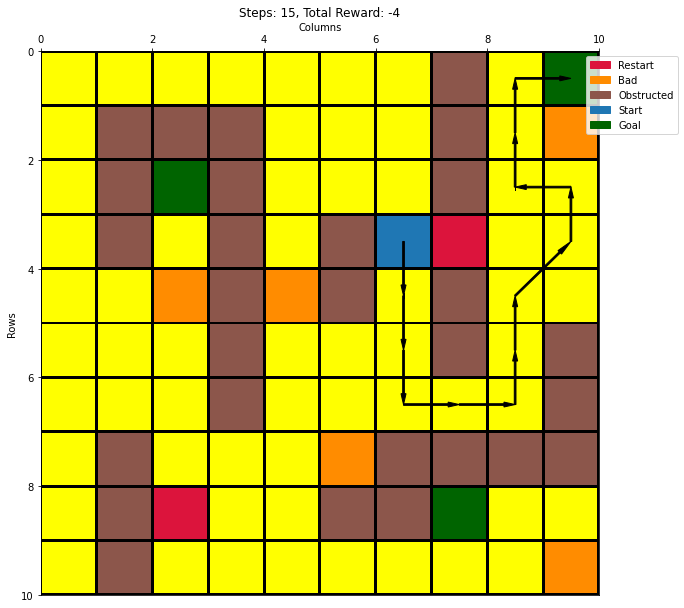

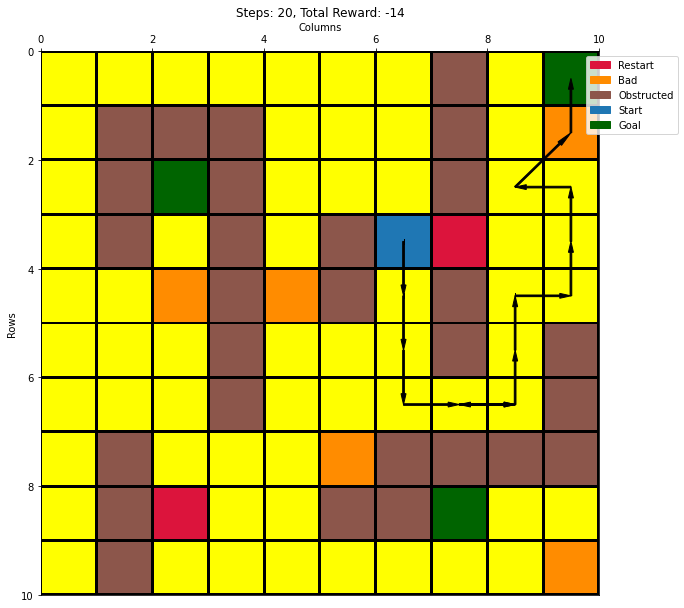

In [66]:
# best hyperparameters
balpha = 0.15
bgamma = 0.97
bbeta = 1.5
cno = 12

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

# Configuration 13 - {wind = false, start = (0,4), p = 1.0} with SARSA and softmax selection

run - 1


100%|██████████| 2000/2000 [00:07<00:00, 276.70it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 357.95it/s]


run - 3


100%|██████████| 2000/2000 [00:07<00:00, 283.70it/s]


run - 1


100%|██████████| 2000/2000 [00:05<00:00, 334.83it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 331.81it/s]


run - 3


100%|██████████| 2000/2000 [00:06<00:00, 296.39it/s]


run - 1


100%|██████████| 2000/2000 [00:05<00:00, 353.73it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 382.77it/s]


run - 3


100%|██████████| 2000/2000 [00:03<00:00, 538.55it/s]


run - 1


100%|██████████| 2000/2000 [00:05<00:00, 356.57it/s]


run - 2


100%|██████████| 2000/2000 [00:08<00:00, 242.28it/s]


run - 3


100%|██████████| 2000/2000 [00:03<00:00, 537.50it/s]


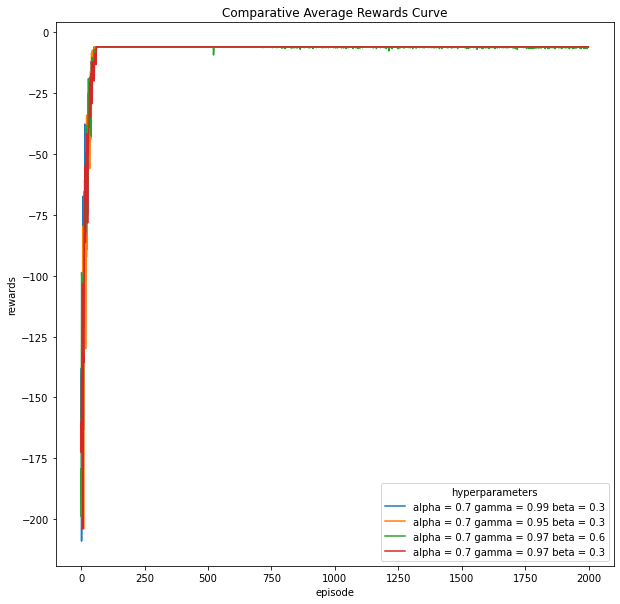

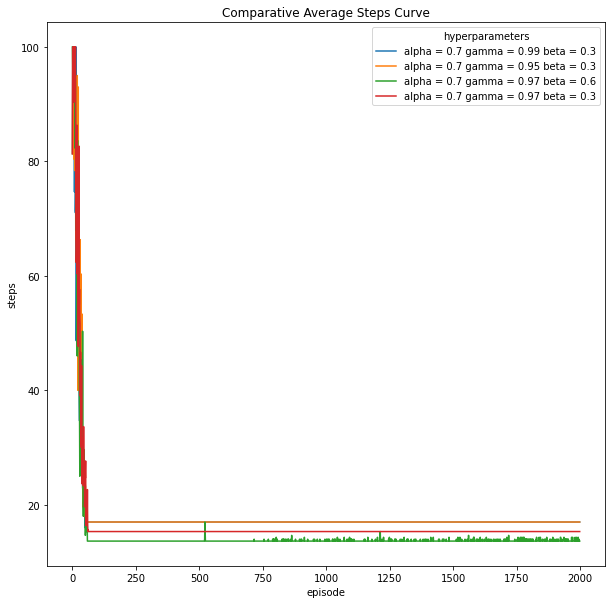

In [24]:
besthyperlist = [(0.7,0.99,0.3), (0.7,0.95,0.3), (0.7,0.97,0.6), (0.7,0.97,0.3)]
cno = 13

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:07<00:00, 273.58it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 554.74it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 2315.49it/s]


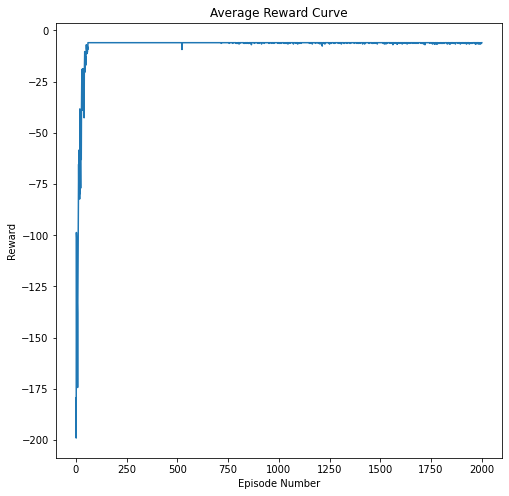

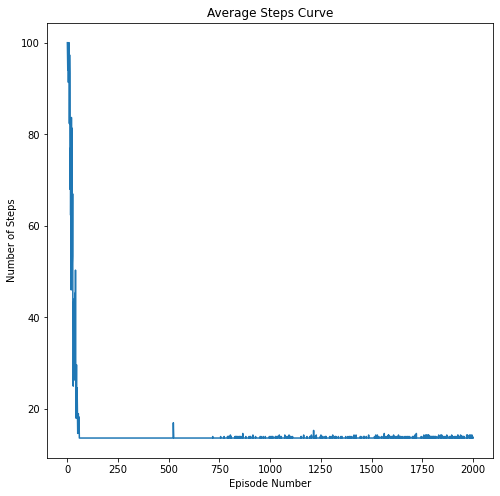

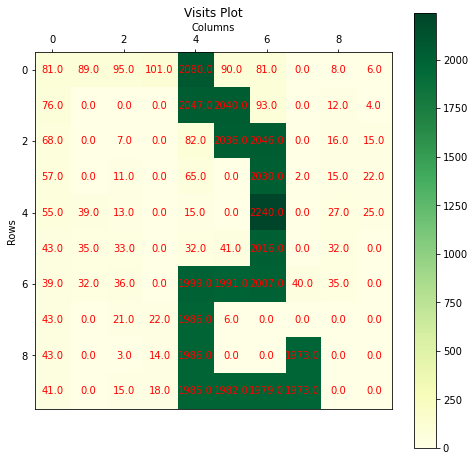

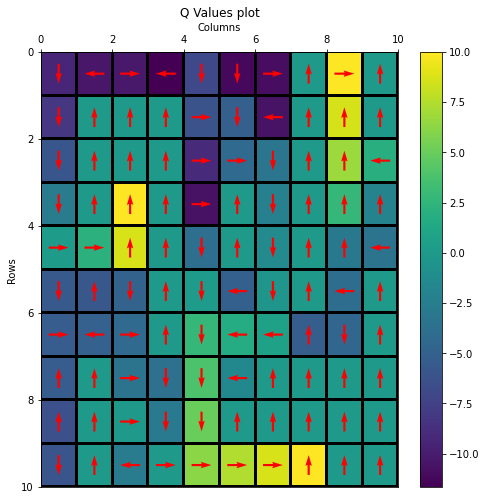

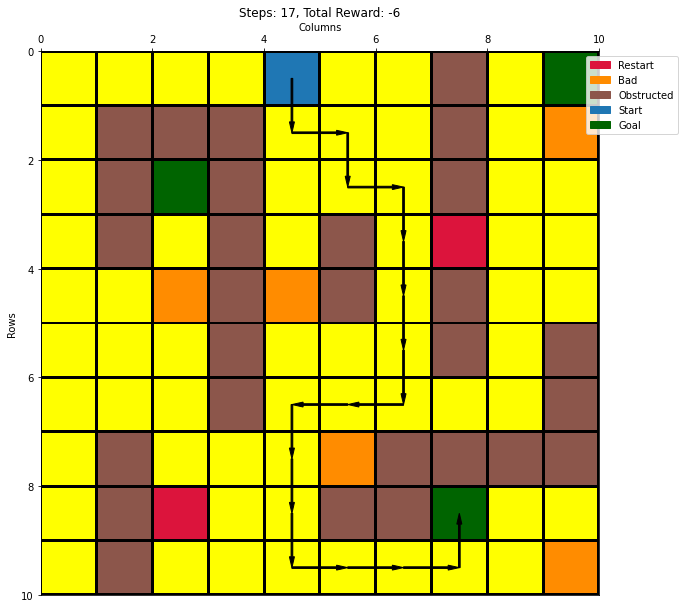

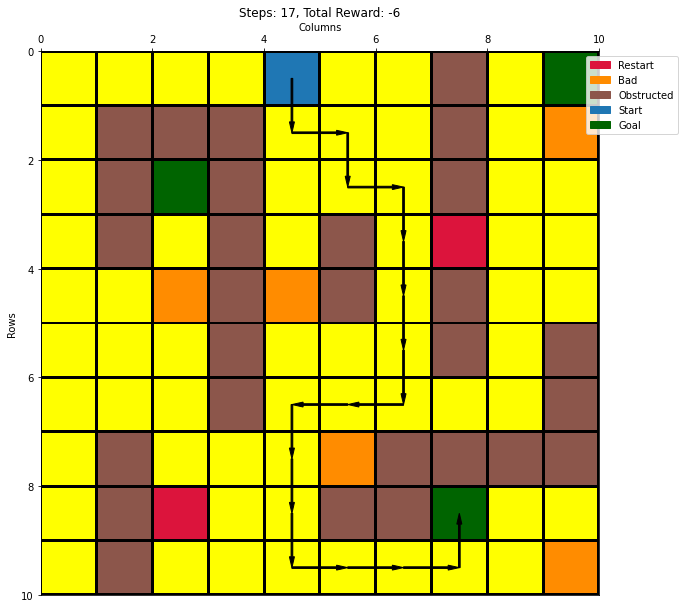

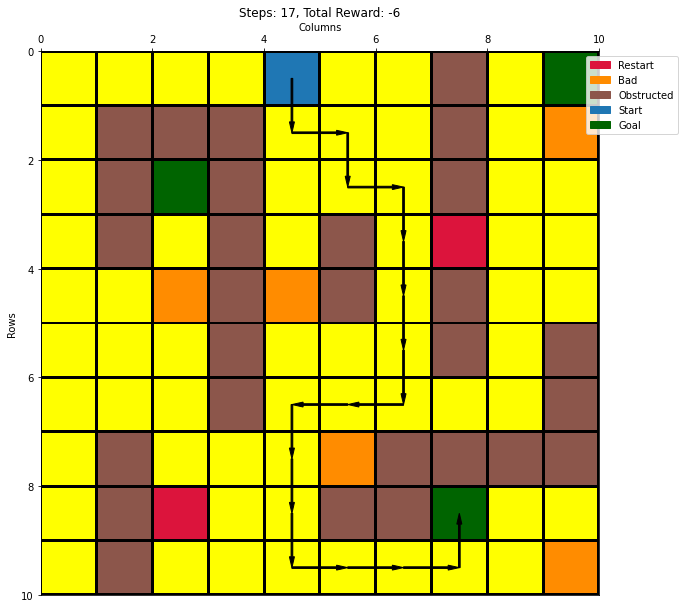

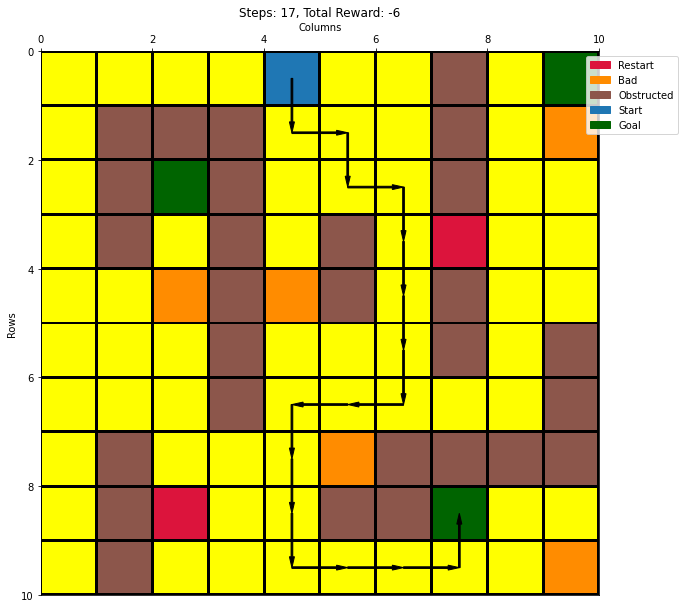

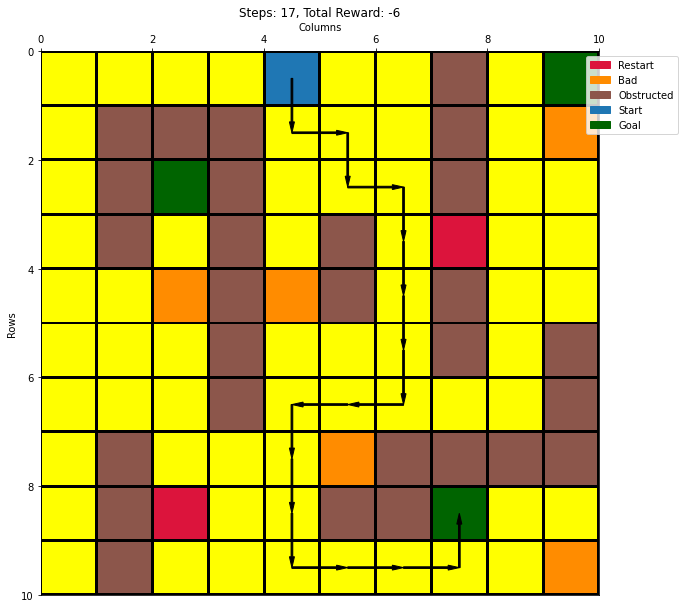

In [67]:
# best hyperparameters
balpha = 0.7
bgamma = 0.97
bbeta = 0.6
cno = 13

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

# Configuration 14 - {wind = false, start = (0,4), p = 0.7} with SARSA and softmax selection

run - 1


100%|██████████| 2000/2000 [00:08<00:00, 227.67it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 291.40it/s]


run - 3


100%|██████████| 2000/2000 [00:08<00:00, 229.21it/s]


run - 1


100%|██████████| 2000/2000 [00:10<00:00, 190.52it/s]


run - 2


100%|██████████| 2000/2000 [00:13<00:00, 151.45it/s]


run - 3


100%|██████████| 2000/2000 [00:09<00:00, 205.91it/s]


run - 1


100%|██████████| 2000/2000 [00:19<00:00, 105.22it/s]


run - 2


100%|██████████| 2000/2000 [00:17<00:00, 113.58it/s]


run - 3


100%|██████████| 2000/2000 [00:18<00:00, 110.53it/s]


run - 1


100%|██████████| 2000/2000 [00:08<00:00, 240.16it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 304.35it/s]


run - 3


100%|██████████| 2000/2000 [00:08<00:00, 230.81it/s]


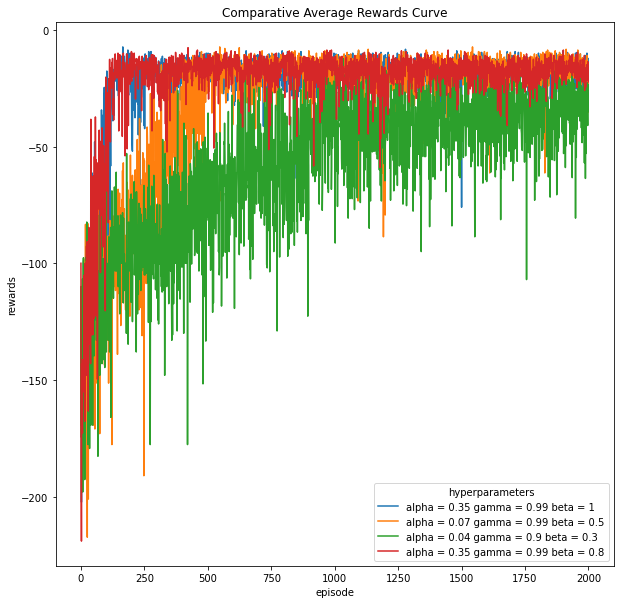

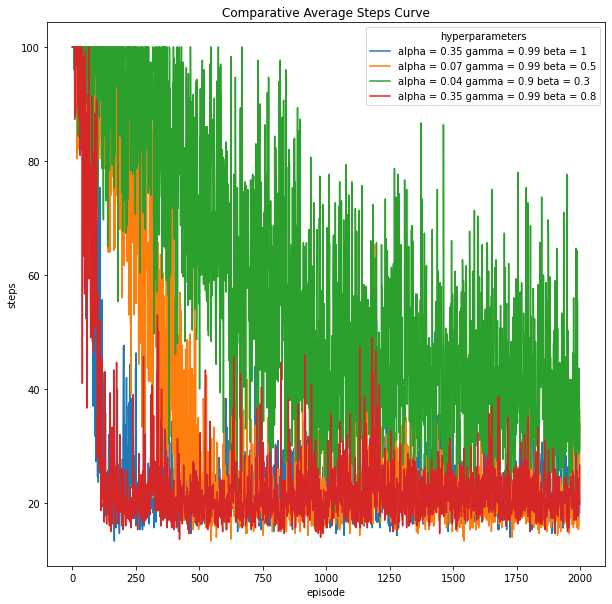

In [25]:
besthyperlist = [(0.35,0.99,1), (0.07,0.99,0.5), (0.04,0.9,0.3), (0.35,0.99,0.8)]
cno = 14

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:07<00:00, 284.26it/s]


run - 2


100%|██████████| 2000/2000 [00:08<00:00, 225.75it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 1005.32it/s]


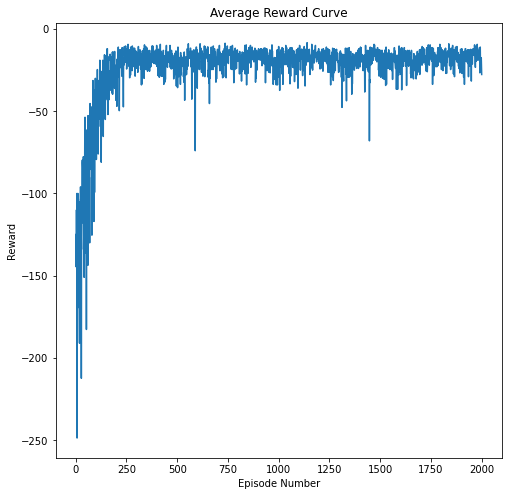

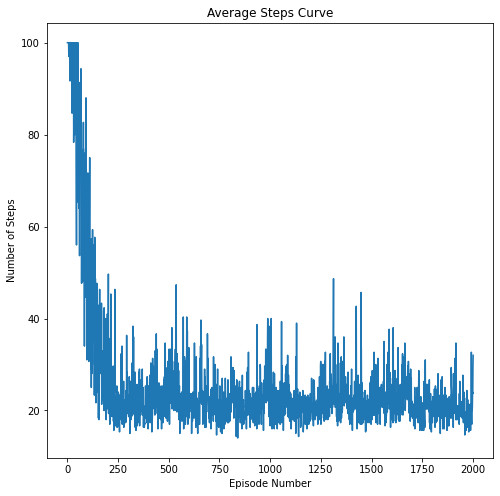

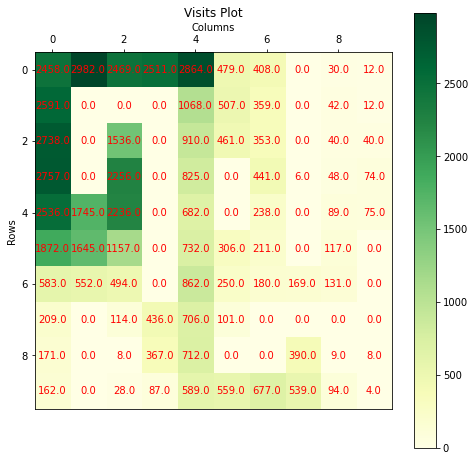

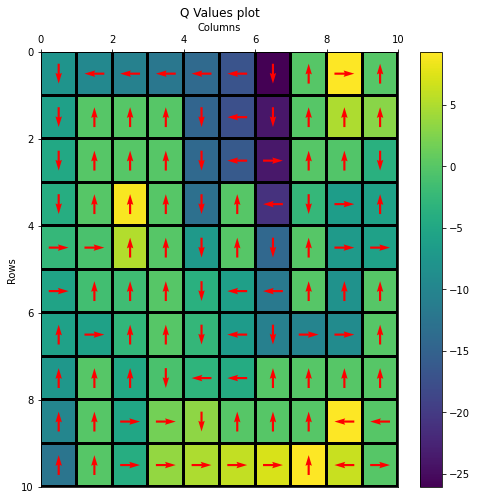

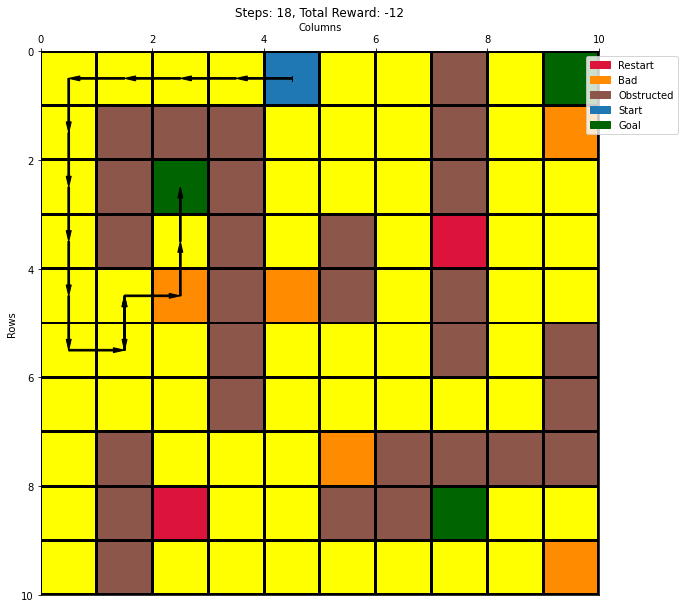

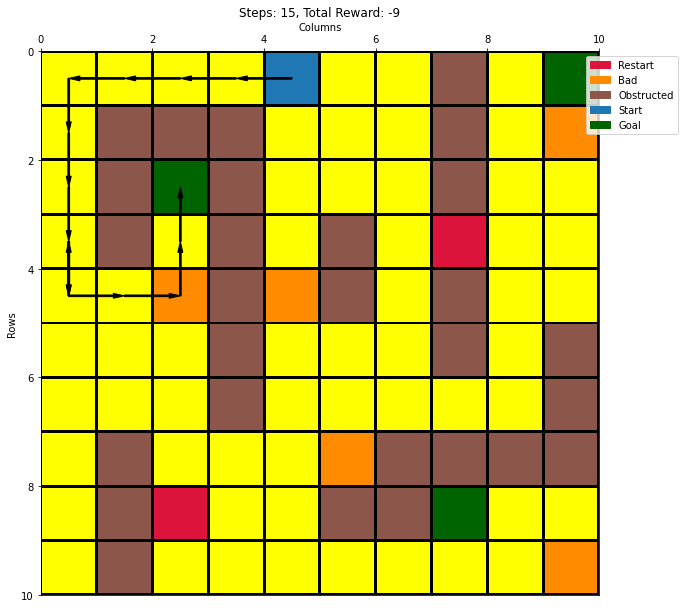

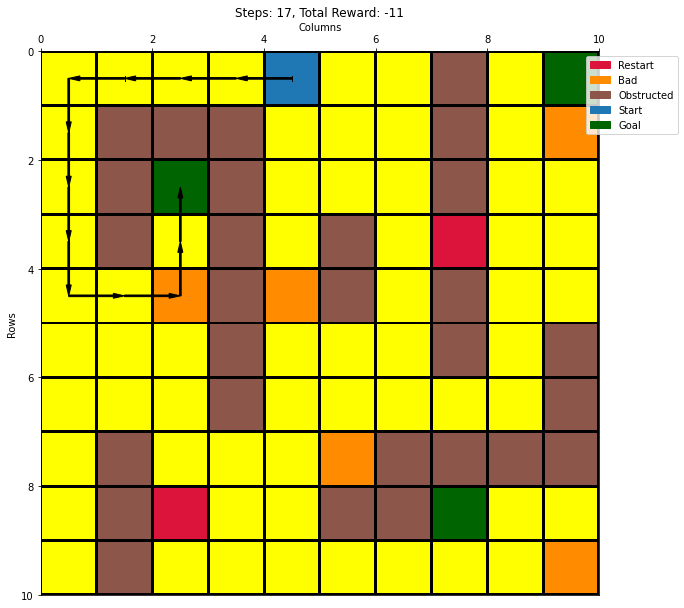

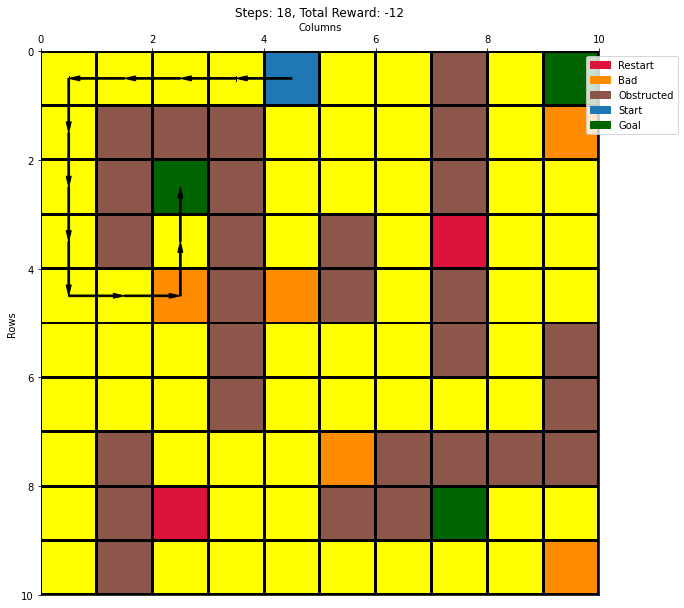

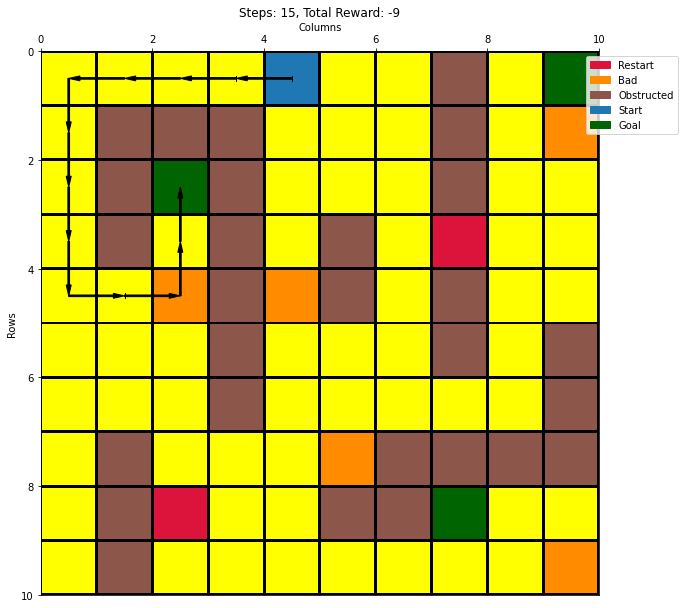

In [68]:
# best hyperparameters
balpha = 0.35
bgamma = 0.99
bbeta = 1
cno = 14

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

# Configuration 15 - {wind = false, start = (3,6), p = 1.0} with SARSA and softmax selection

run - 1


100%|██████████| 2000/2000 [00:04<00:00, 459.40it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 348.68it/s]


run - 3


100%|██████████| 2000/2000 [00:05<00:00, 393.62it/s]


run - 1


100%|██████████| 2000/2000 [00:03<00:00, 508.40it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 353.19it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 436.69it/s]


run - 1


100%|██████████| 2000/2000 [00:04<00:00, 467.93it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 334.49it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 471.48it/s]


run - 1


100%|██████████| 2000/2000 [00:04<00:00, 452.18it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 338.60it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 461.17it/s]


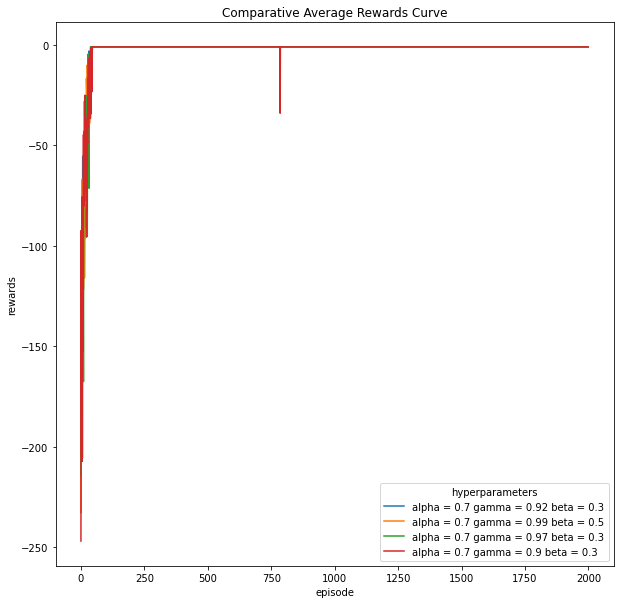

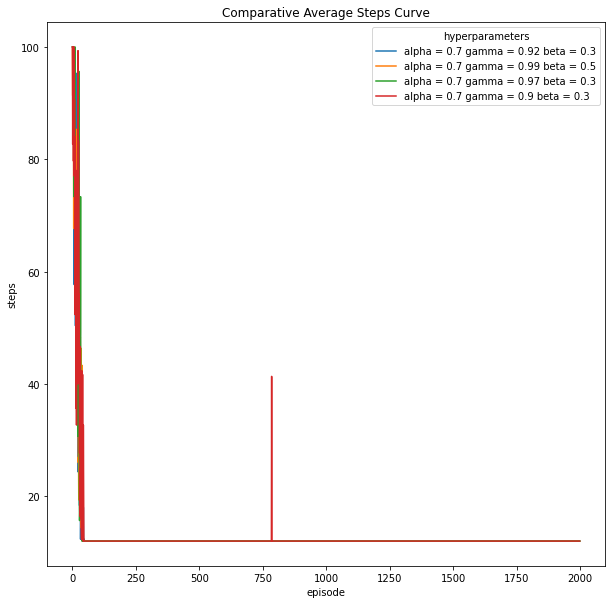

In [26]:
besthyperlist = [(0.7,0.92,0.3), (0.7,0.99,0.5), (0.7,0.97,0.3), (0.7,0.9,0.3)]
cno = 15

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:04<00:00, 465.38it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 357.60it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 881.36it/s]


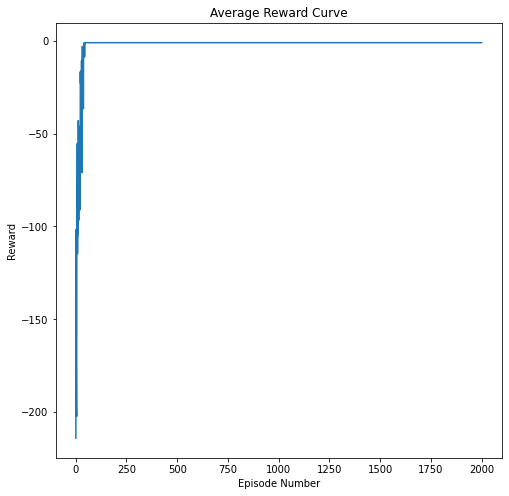

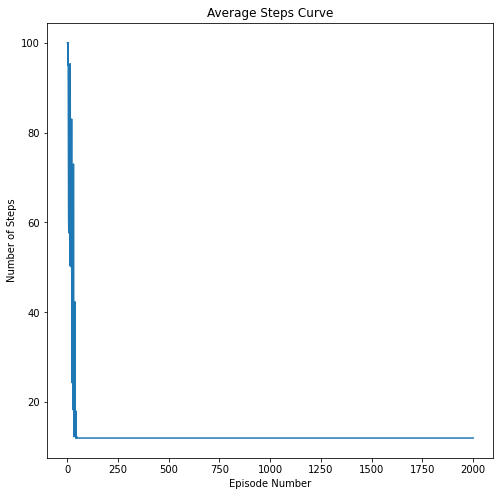

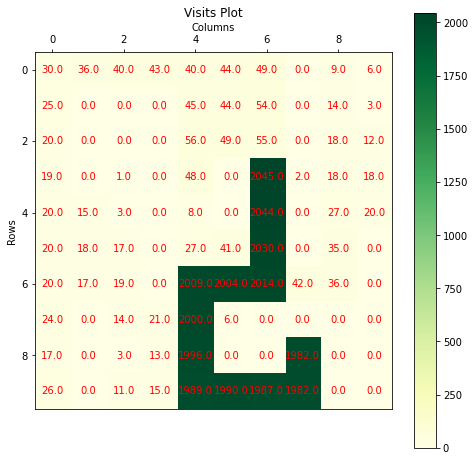

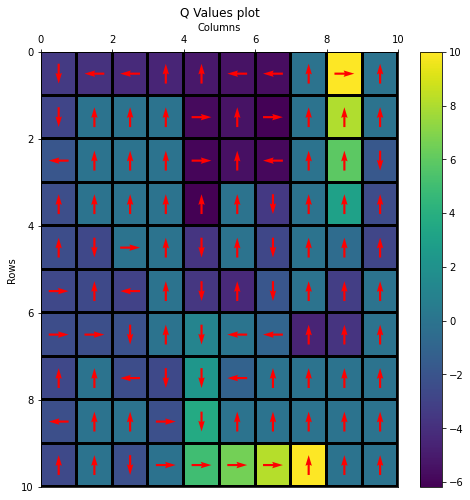

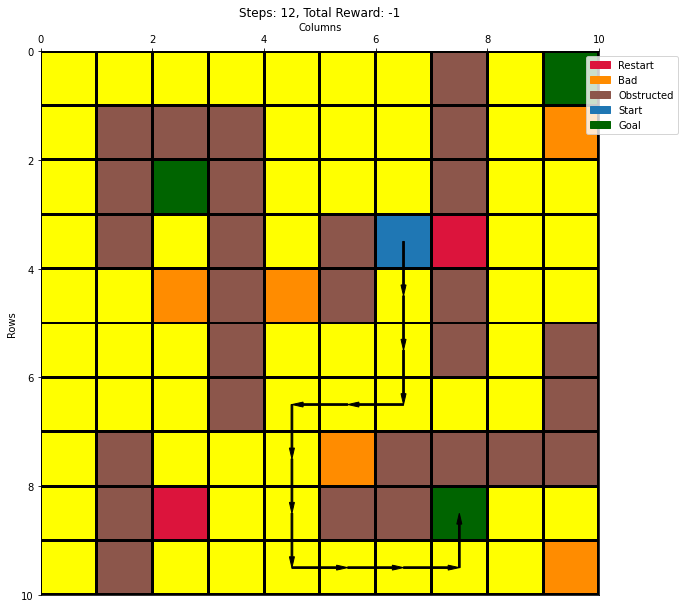

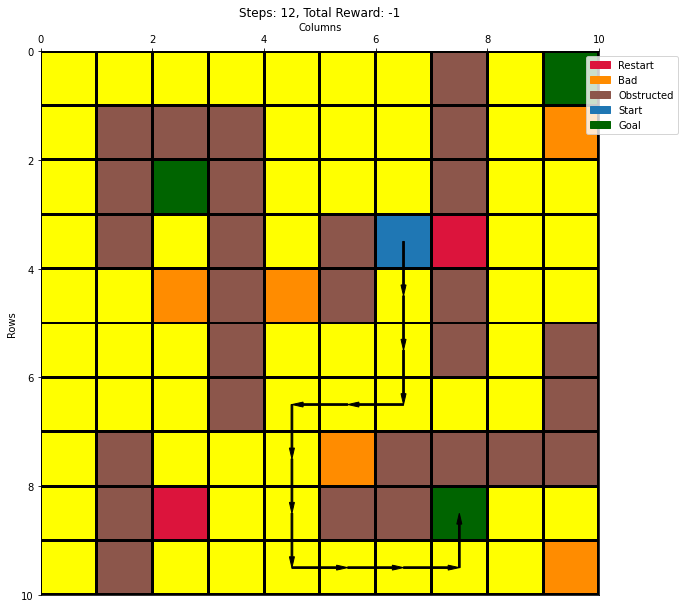

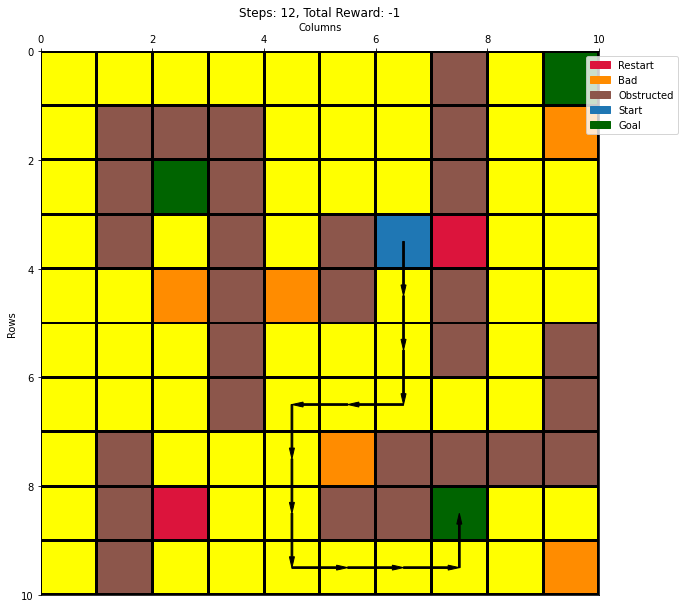

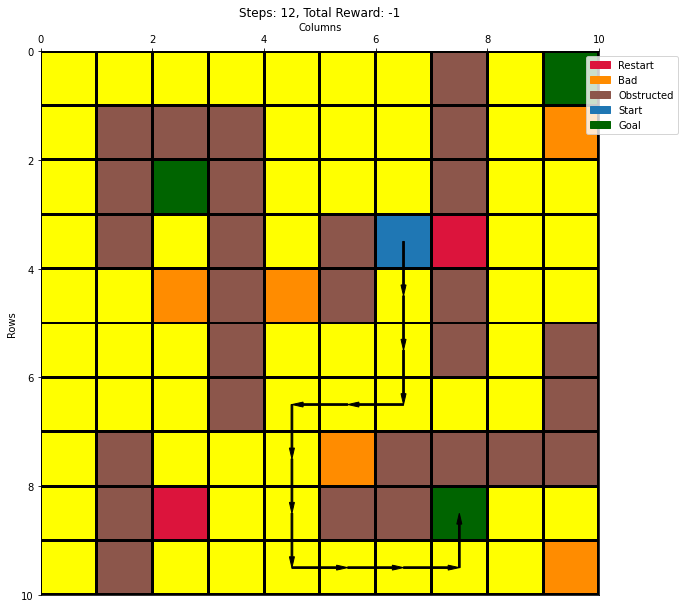

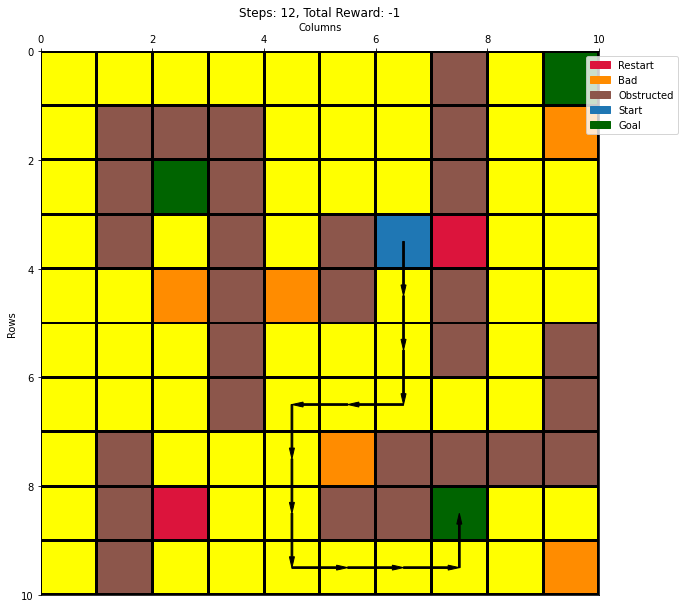

In [69]:
# best hyperparameters
balpha = 0.7
bgamma = 0.92
bbeta = 0.3
cno = 15

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

# Configuration 16 - {wind = false, start = (3,6), p = 0.7} with SARSA and softmax selection

run - 1


100%|██████████| 2000/2000 [00:12<00:00, 160.19it/s]


run - 2


100%|██████████| 2000/2000 [00:12<00:00, 161.73it/s]


run - 3


100%|██████████| 2000/2000 [00:11<00:00, 170.96it/s]


run - 1


100%|██████████| 2000/2000 [00:12<00:00, 159.80it/s]


run - 2


100%|██████████| 2000/2000 [00:13<00:00, 147.07it/s]


run - 3


100%|██████████| 2000/2000 [00:14<00:00, 141.64it/s]


run - 1


100%|██████████| 2000/2000 [00:17<00:00, 112.28it/s]


run - 2


100%|██████████| 2000/2000 [00:18<00:00, 110.89it/s]


run - 3


100%|██████████| 2000/2000 [00:16<00:00, 121.22it/s]


run - 1


100%|██████████| 2000/2000 [00:16<00:00, 121.86it/s]


run - 2


100%|██████████| 2000/2000 [00:17<00:00, 117.24it/s]


run - 3


100%|██████████| 2000/2000 [00:27<00:00, 72.00it/s] 


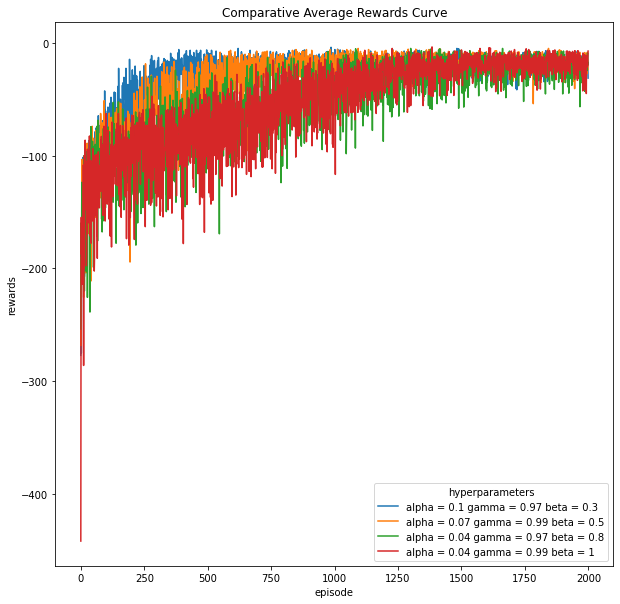

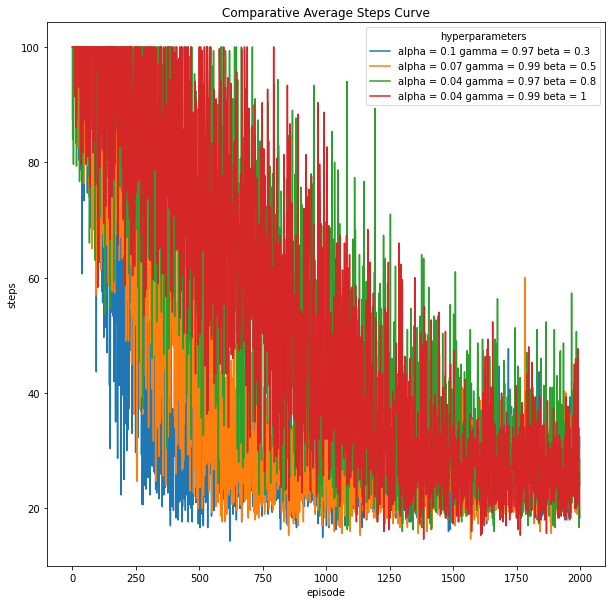

In [27]:
besthyperlist = [(0.1,0.97,0.3), (0.07,0.99,0.5), (0.04,0.97,0.8), (0.04,0.99,1)]
cno = 16

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:11<00:00, 173.28it/s]


run - 2


100%|██████████| 2000/2000 [00:11<00:00, 168.33it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 670.18it/s]


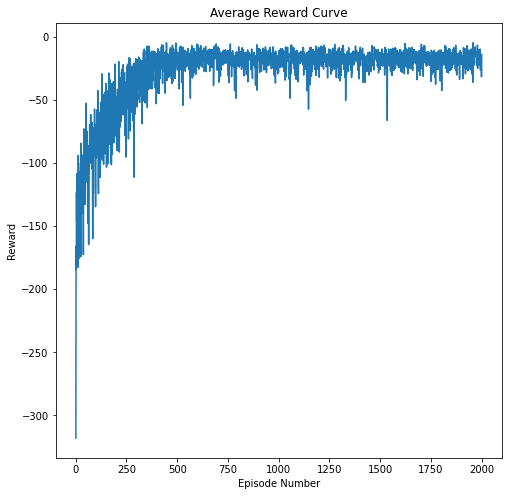

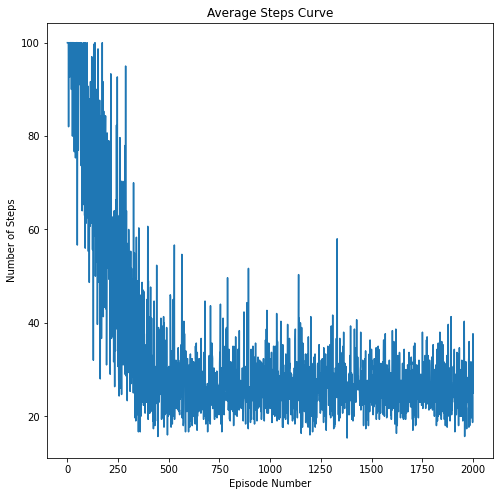

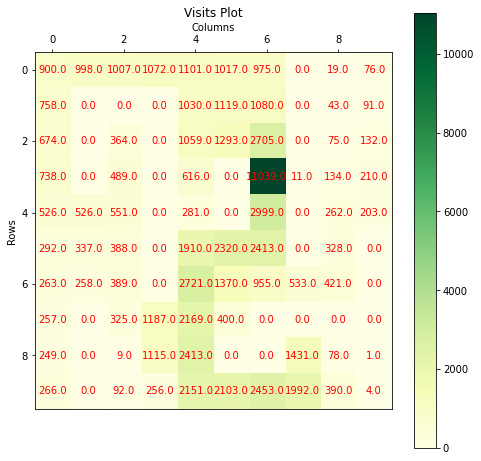

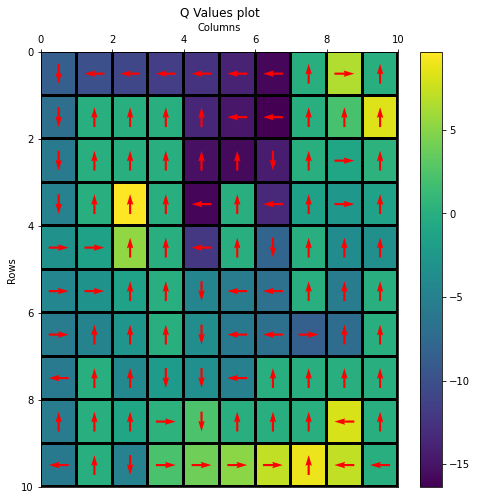

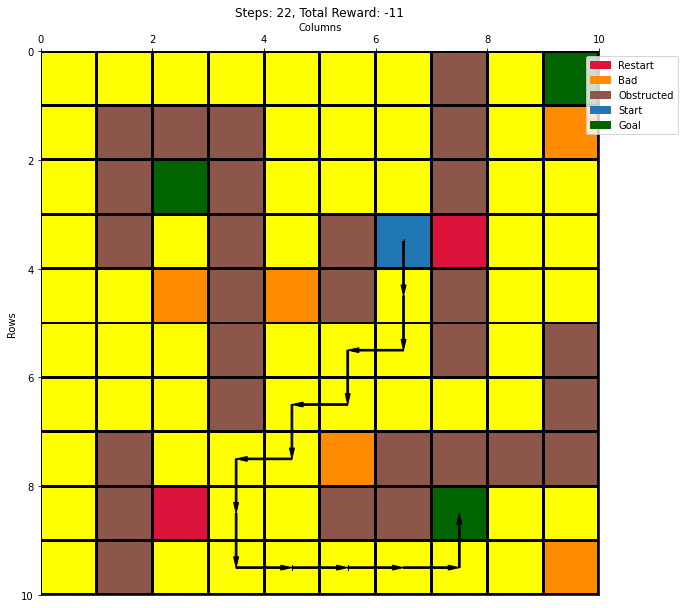

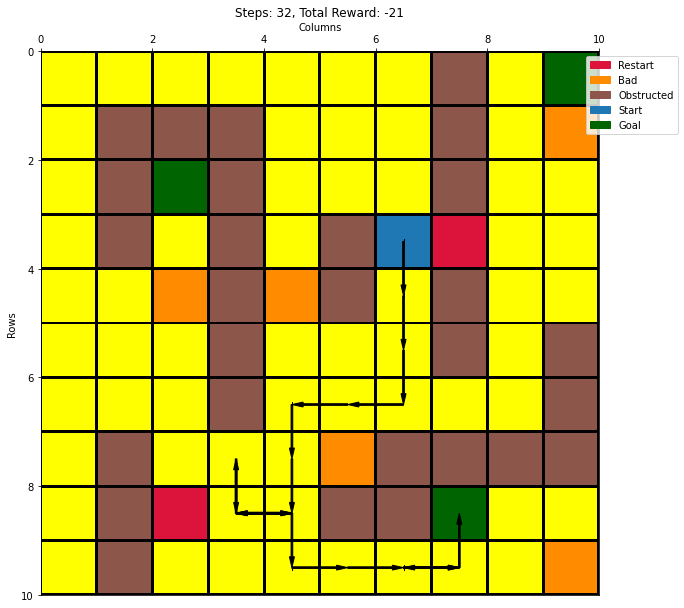

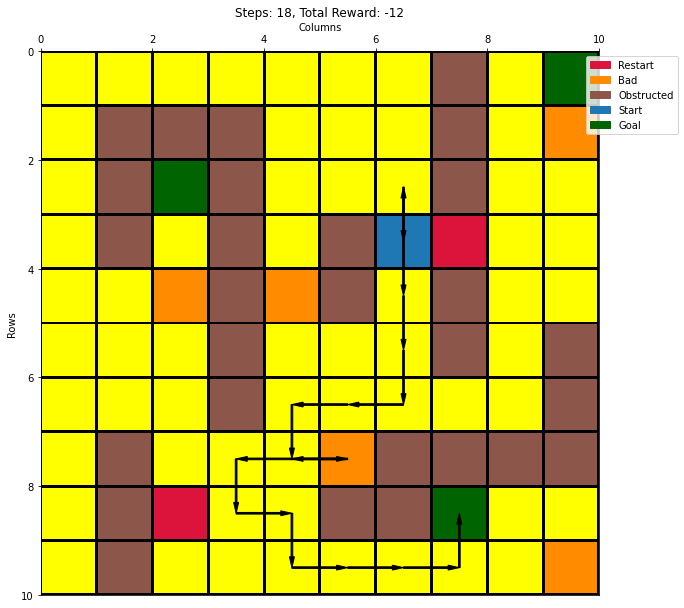

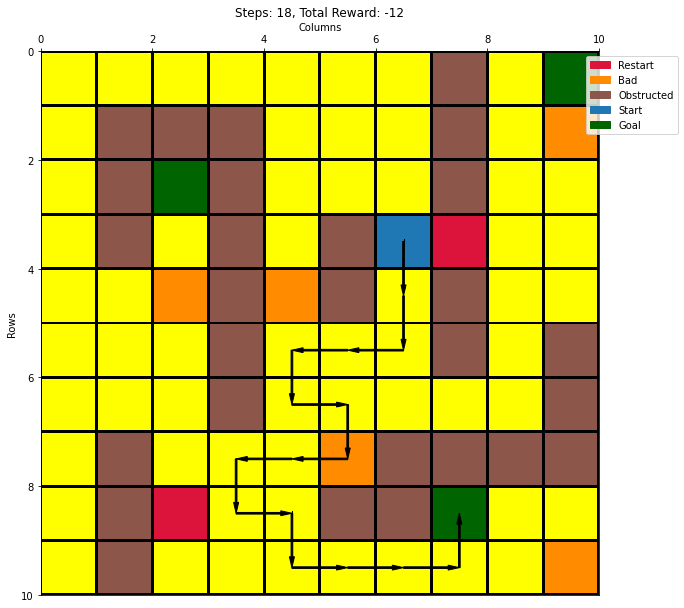

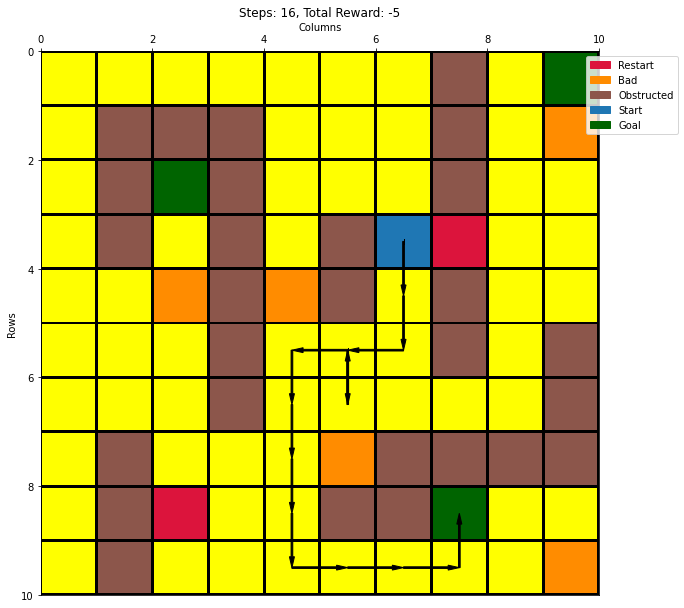

In [70]:
# best hyperparameters
balpha = 0.1
bgamma = 0.97
bbeta = 0.3
cno = 16

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

# Configuration 17 - {wind = true, start = (0,4), p = 1.0} with Q-Learning and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:07<00:00, 285.57it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 519.49it/s]


run - 3


100%|██████████| 2000/2000 [00:03<00:00, 550.87it/s]


run - 1


100%|██████████| 2000/2000 [00:04<00:00, 467.44it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 592.11it/s]


run - 3


100%|██████████| 2000/2000 [00:03<00:00, 562.16it/s]


run - 1


100%|██████████| 2000/2000 [00:23<00:00, 83.40it/s] 


run - 2


100%|██████████| 2000/2000 [00:18<00:00, 108.24it/s]


run - 3


100%|██████████| 2000/2000 [00:18<00:00, 105.84it/s]


run - 1


100%|██████████| 2000/2000 [00:07<00:00, 267.37it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 416.77it/s]


run - 3


100%|██████████| 2000/2000 [00:03<00:00, 510.28it/s]


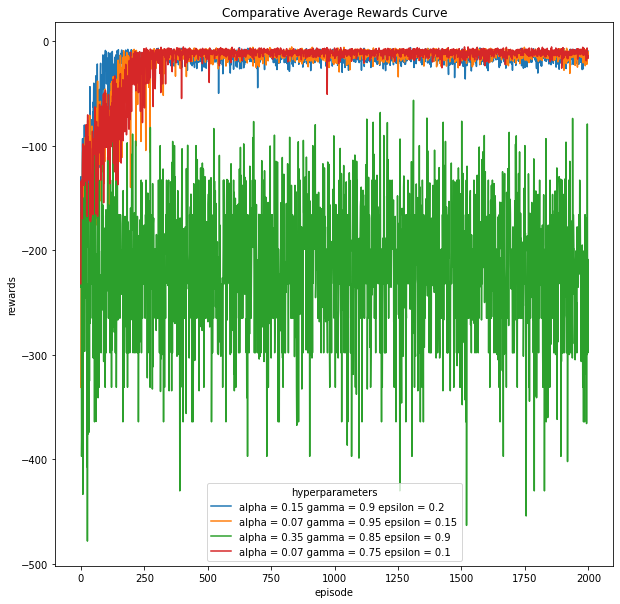

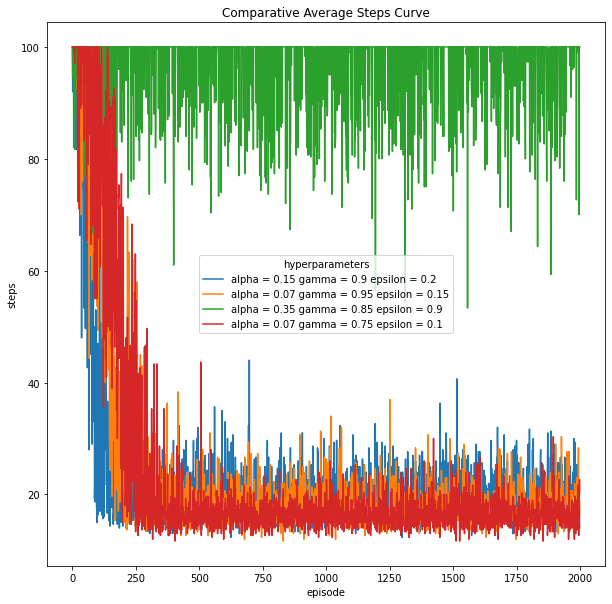

In [28]:
besthyperlist = [(0.15,0.9,0.2), (0.07,0.95,0.15), (0.35,0.85,0.9), (0.07,0.75,0.1)]
cno = 17

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:04<00:00, 493.84it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 509.46it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 2597.24it/s]


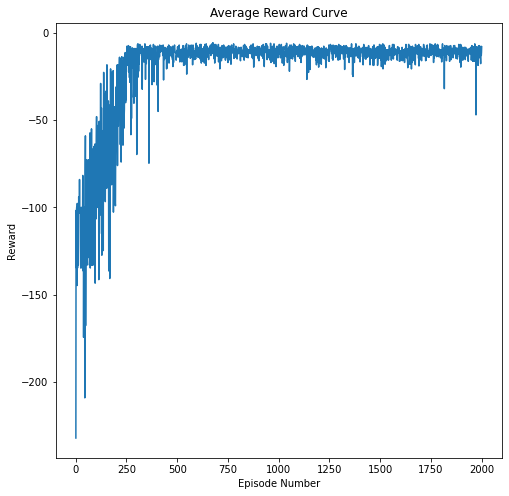

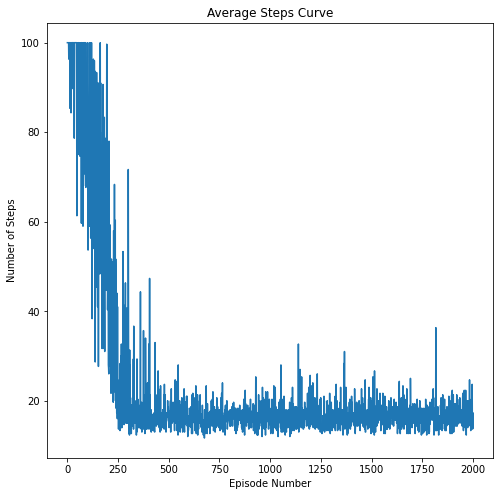

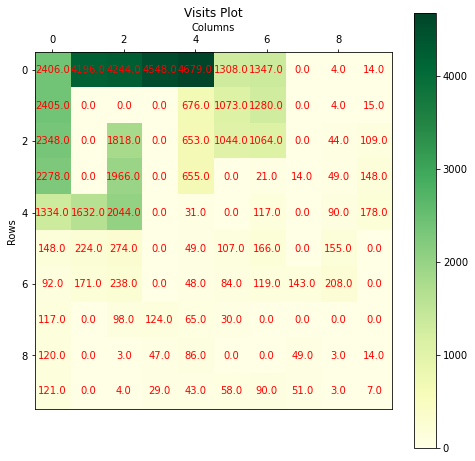

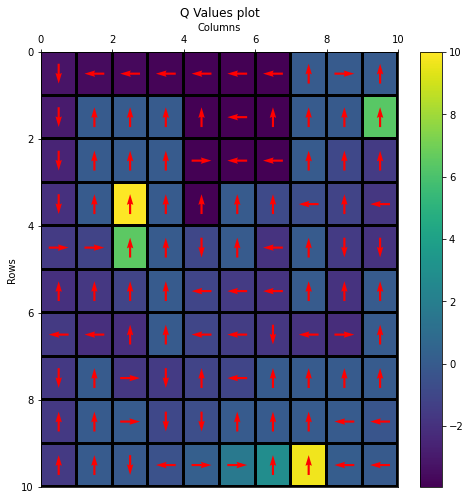

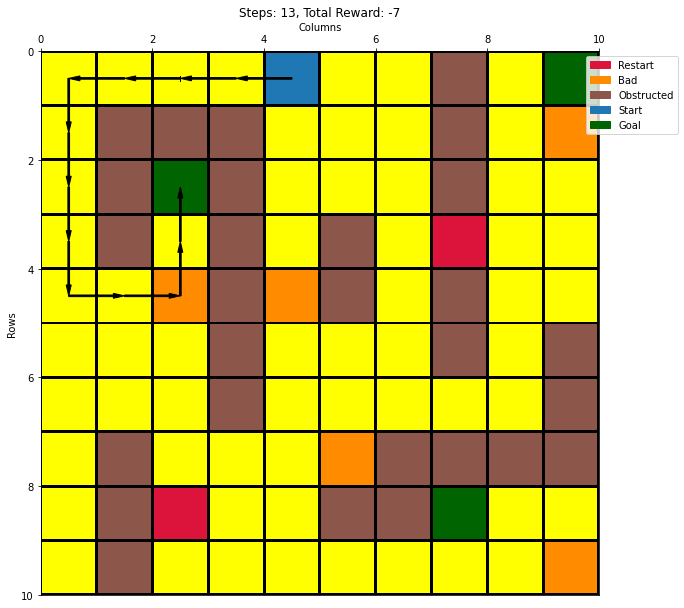

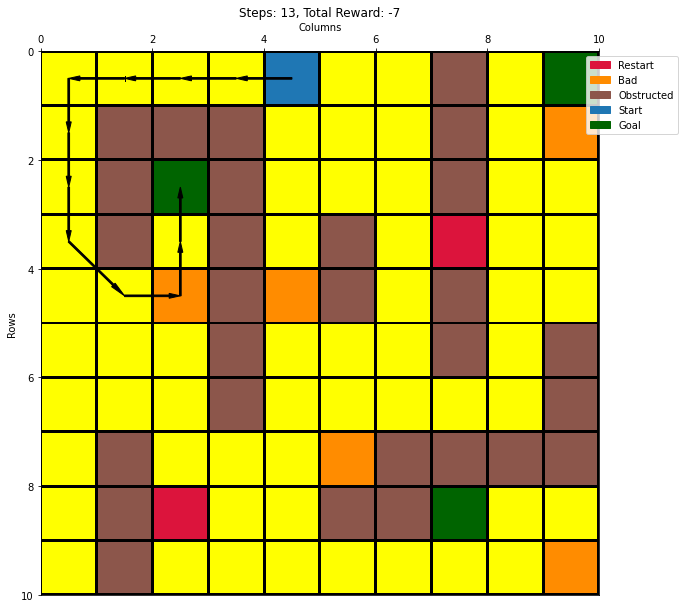

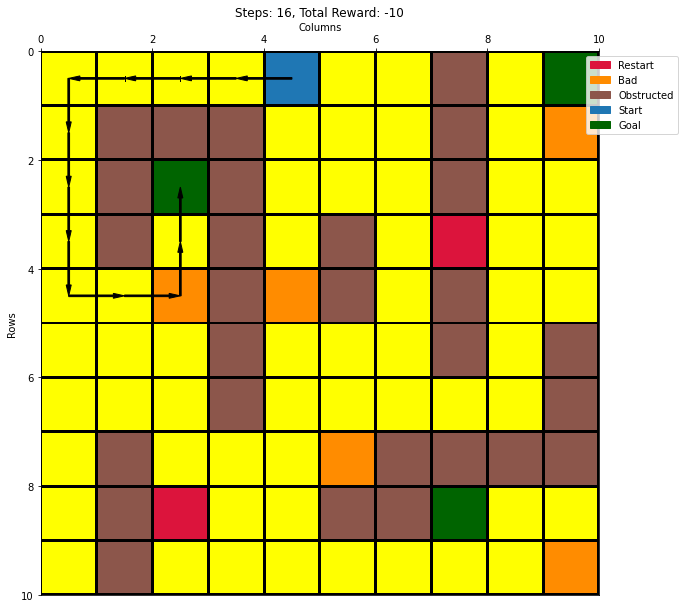

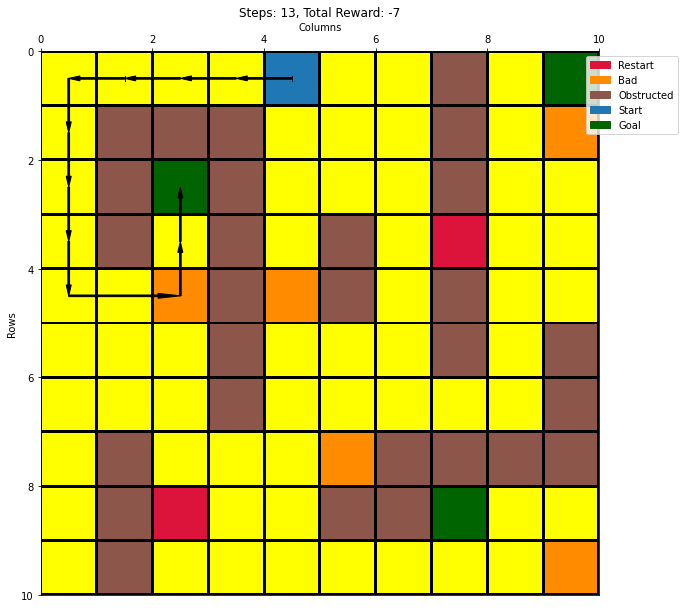

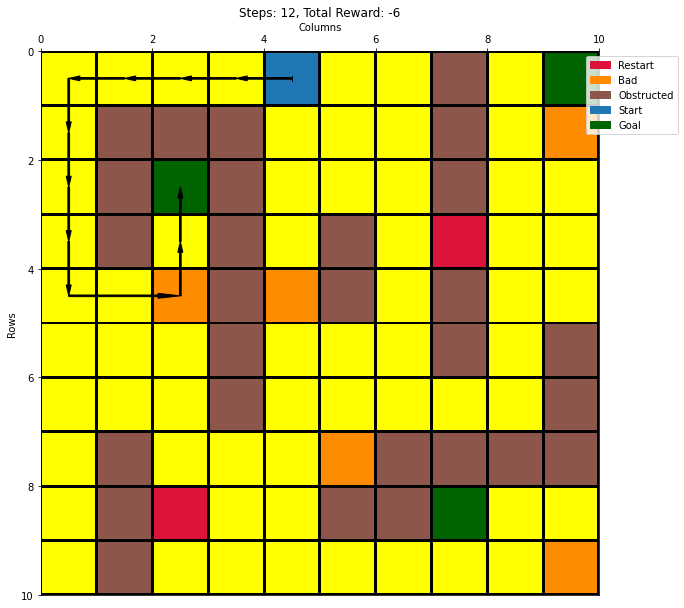

In [71]:
# best hyperparameters
balpha = 0.07
bgamma = 0.75
bepsilon = 0.1
cno = 17

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 18 - {wind = true, start = (0,4), p = 0.7} with Q-Learning and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:08<00:00, 238.05it/s]


run - 2


100%|██████████| 2000/2000 [00:08<00:00, 228.08it/s]


run - 3


100%|██████████| 2000/2000 [00:05<00:00, 372.77it/s]


run - 1


100%|██████████| 2000/2000 [00:07<00:00, 261.05it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 300.39it/s]


run - 3


100%|██████████| 2000/2000 [00:11<00:00, 178.62it/s]


run - 1


100%|██████████| 2000/2000 [00:21<00:00, 94.87it/s] 


run - 2


100%|██████████| 2000/2000 [00:26<00:00, 74.54it/s]


run - 3


100%|██████████| 2000/2000 [00:22<00:00, 87.76it/s] 


run - 1


100%|██████████| 2000/2000 [00:05<00:00, 340.77it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 314.49it/s]


run - 3


100%|██████████| 2000/2000 [00:08<00:00, 239.55it/s]


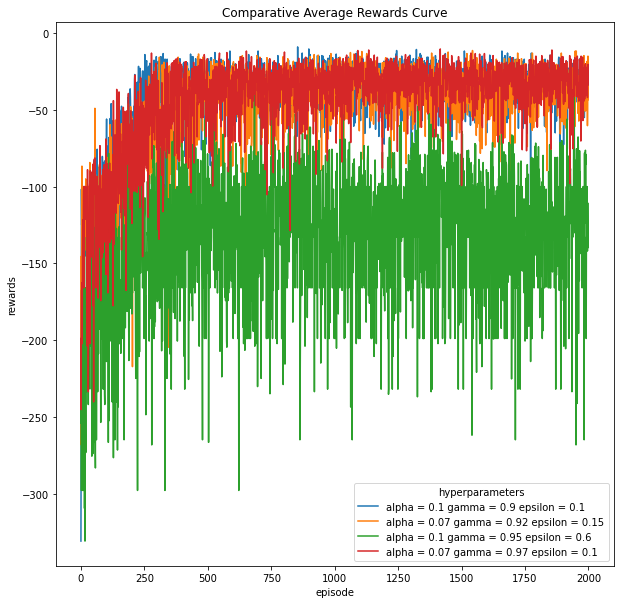

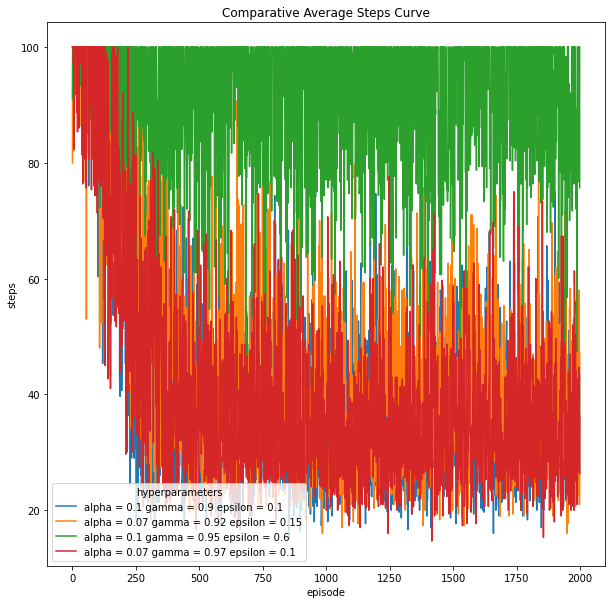

In [29]:
besthyperlist = [(0.1,0.9,0.1), (0.07,0.92,0.15), (0.1,0.95,0.6), (0.07,0.97,0.1)]
cno = 18

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:06<00:00, 300.32it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 326.96it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 853.58it/s]


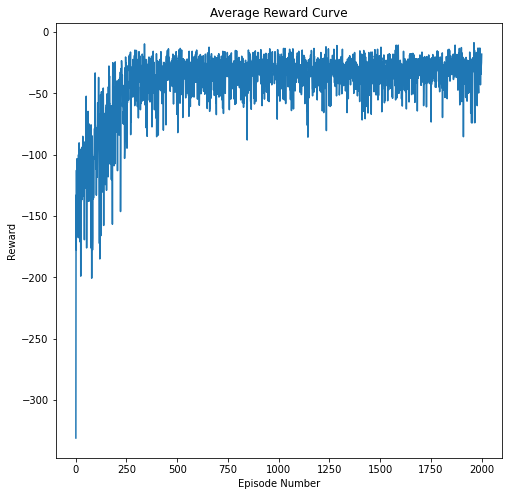

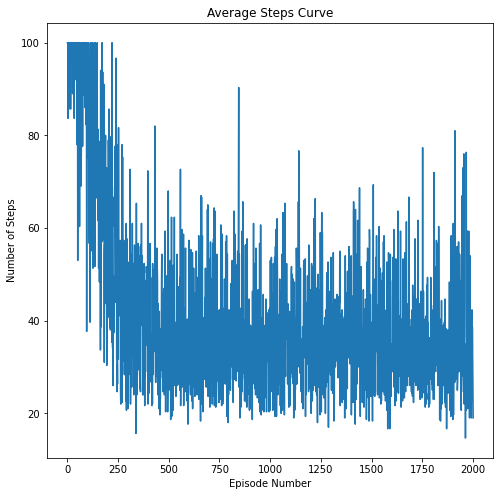

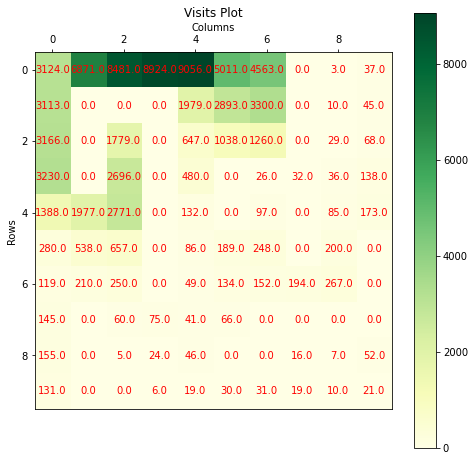

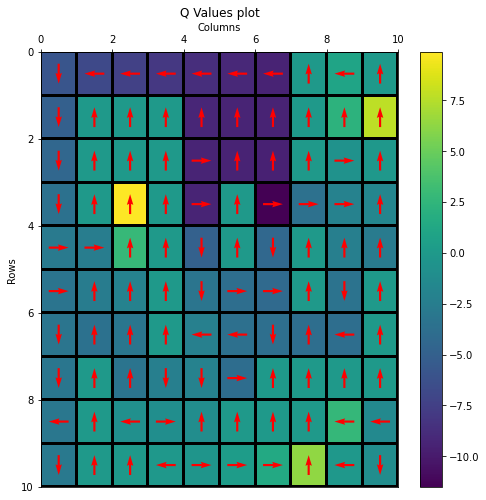

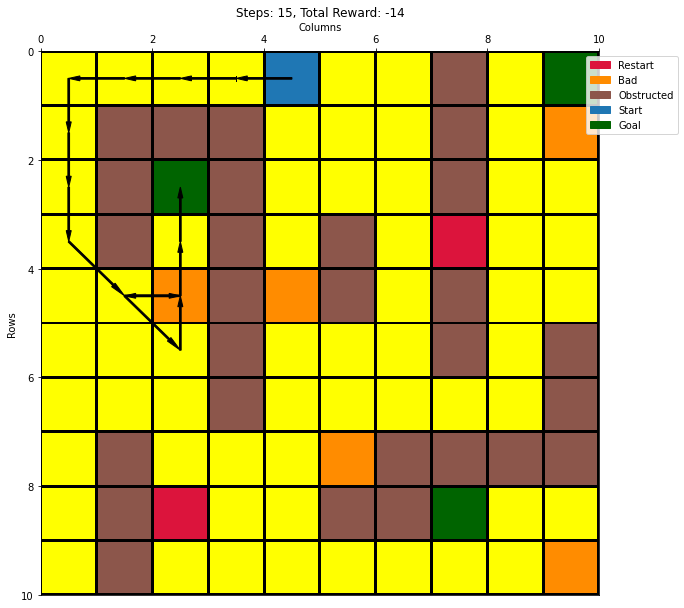

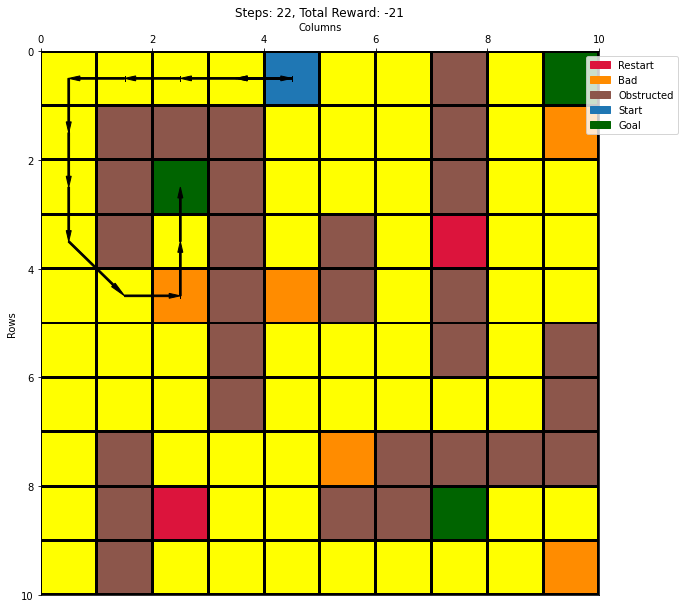

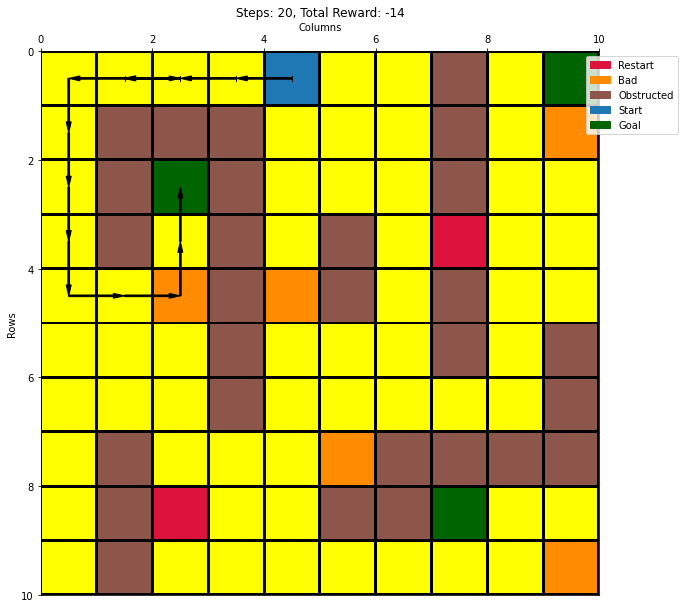

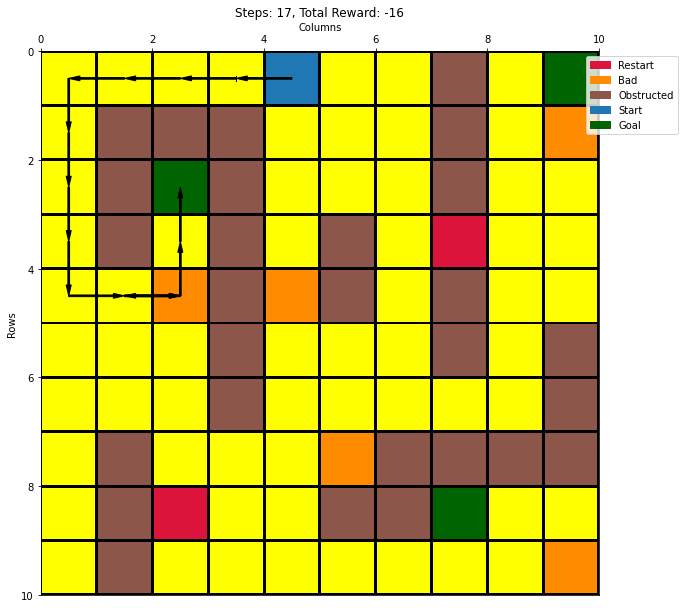

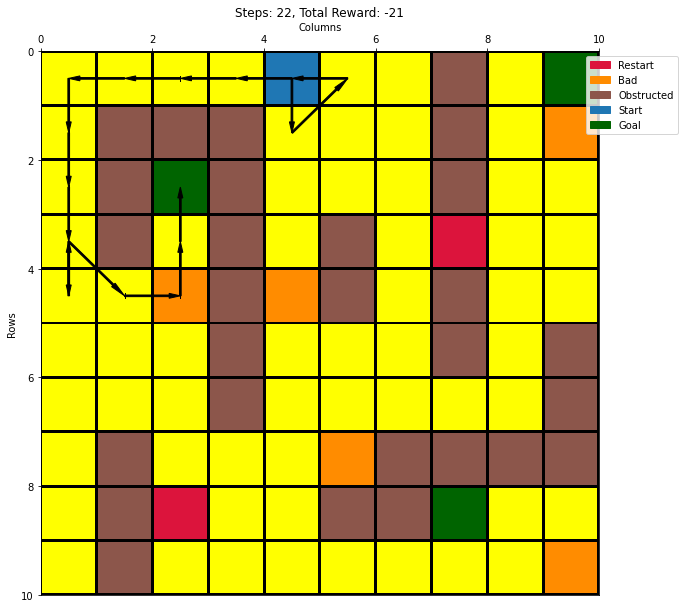

In [72]:
# best hyperparameters
balpha = 0.1
bgamma = 0.9
bepsilon = 0.1
cno = 18

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 19 - {wind = true, start = (3,6), p = 1.0} with Q-Learning and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:16<00:00, 122.94it/s]


run - 2


100%|██████████| 2000/2000 [00:16<00:00, 118.36it/s]


run - 3


100%|██████████| 2000/2000 [00:16<00:00, 120.45it/s]


run - 1


100%|██████████| 2000/2000 [00:04<00:00, 429.73it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 473.59it/s]


run - 3


100%|██████████| 2000/2000 [00:05<00:00, 363.53it/s]


run - 1


100%|██████████| 2000/2000 [00:04<00:00, 412.94it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 520.32it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 495.26it/s]


run - 1


100%|██████████| 2000/2000 [00:05<00:00, 398.16it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 534.45it/s]


run - 3


100%|██████████| 2000/2000 [00:03<00:00, 586.80it/s]


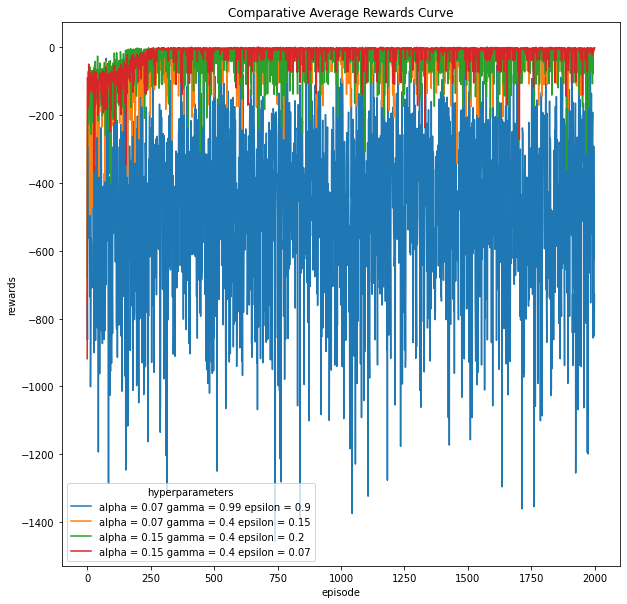

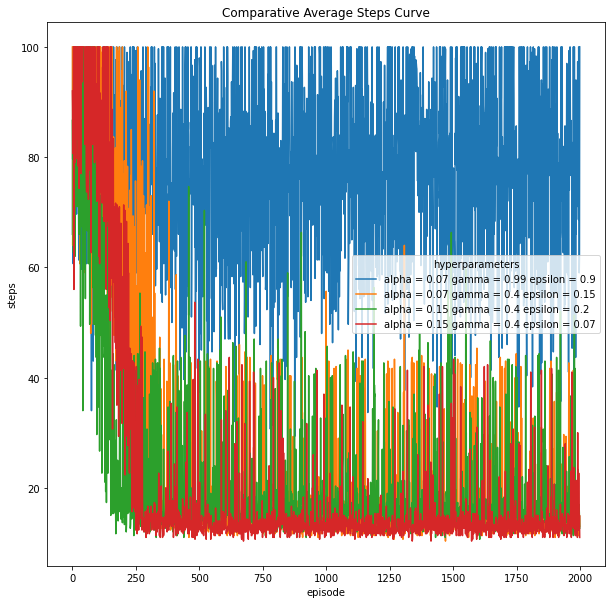

In [30]:
besthyperlist = [(0.07,0.99,0.9), (0.07,0.4,0.15), (0.15,0.4,0.2), (0.15,0.4,0.07)]
cno = 19

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:03<00:00, 588.58it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 325.58it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 1010.19it/s]


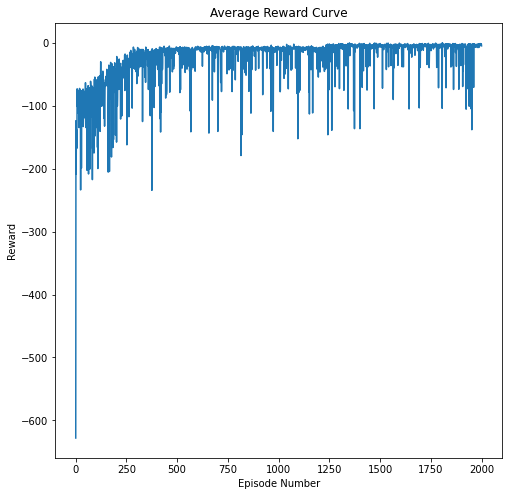

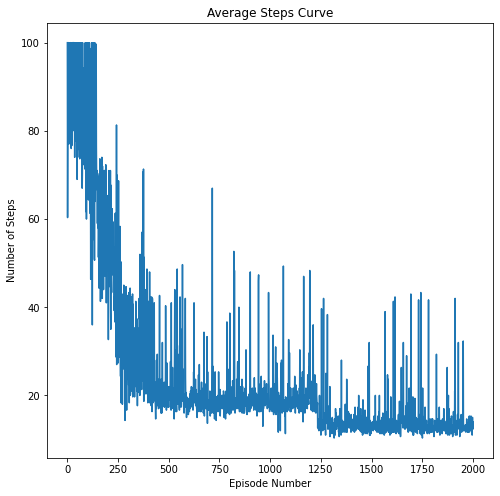

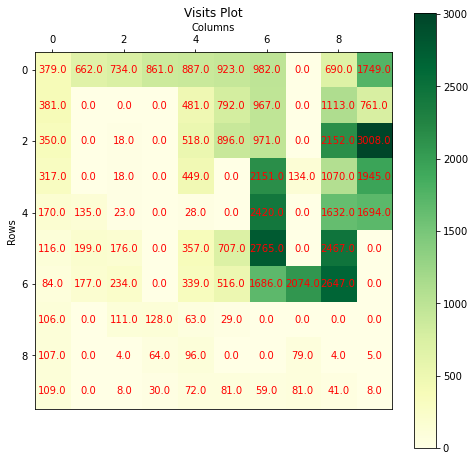

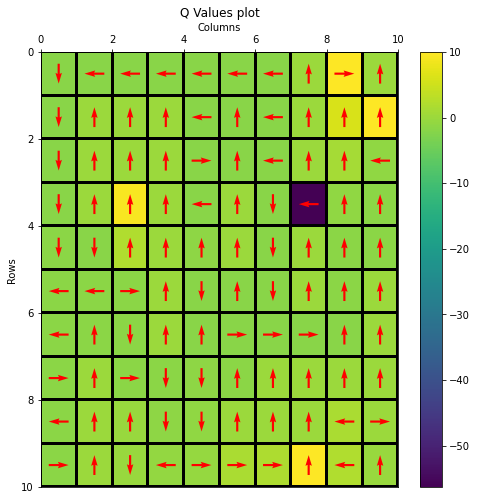

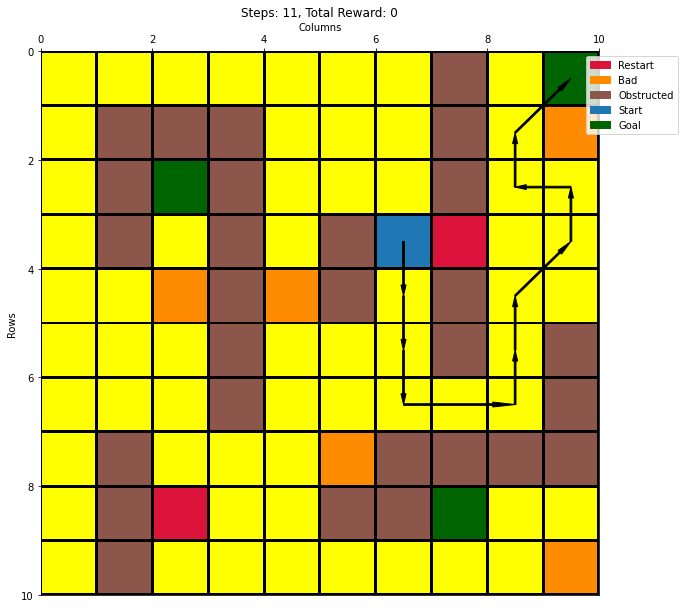

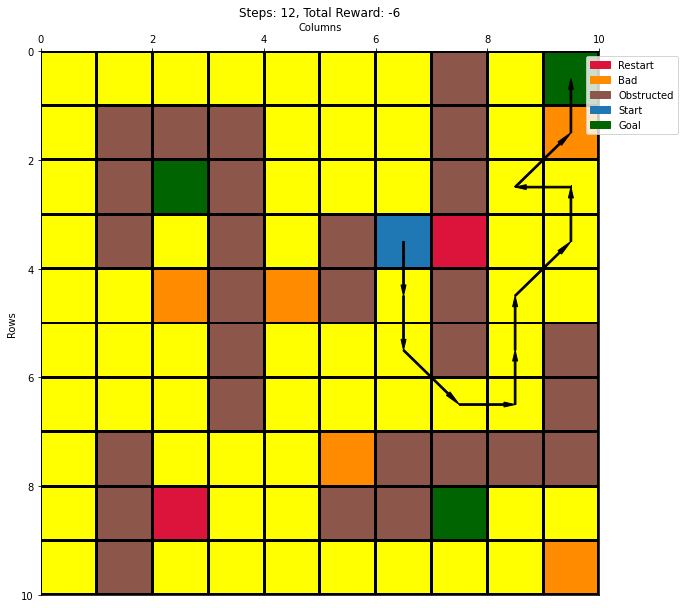

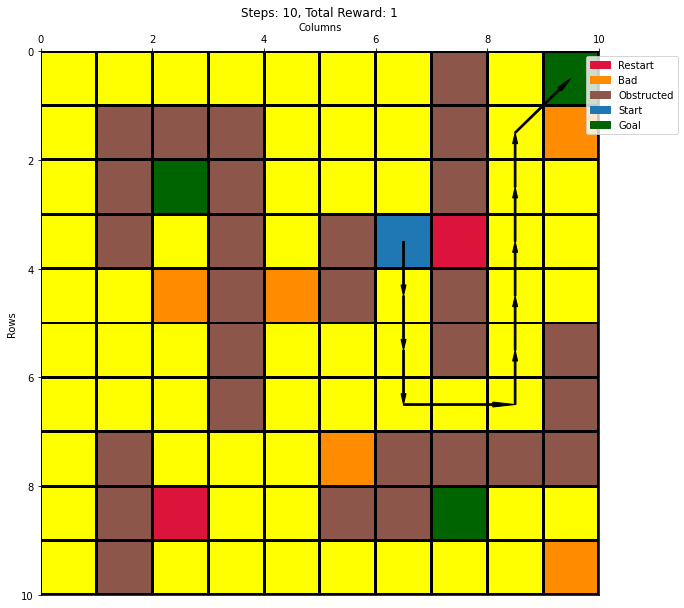

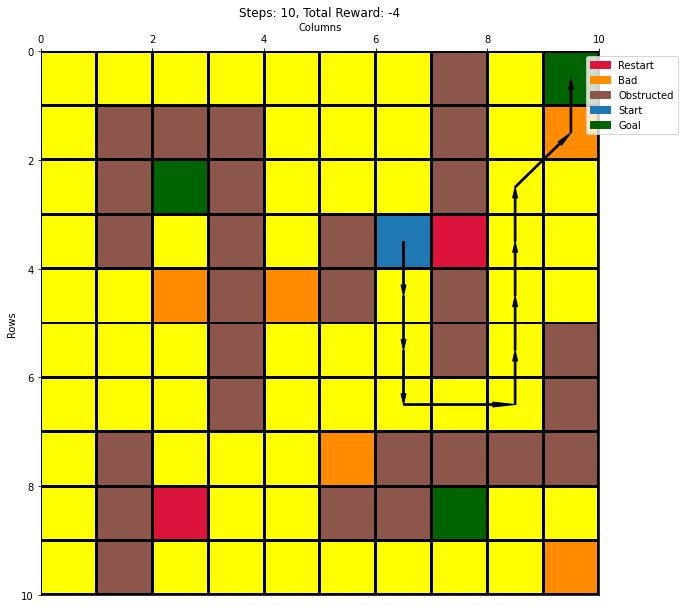

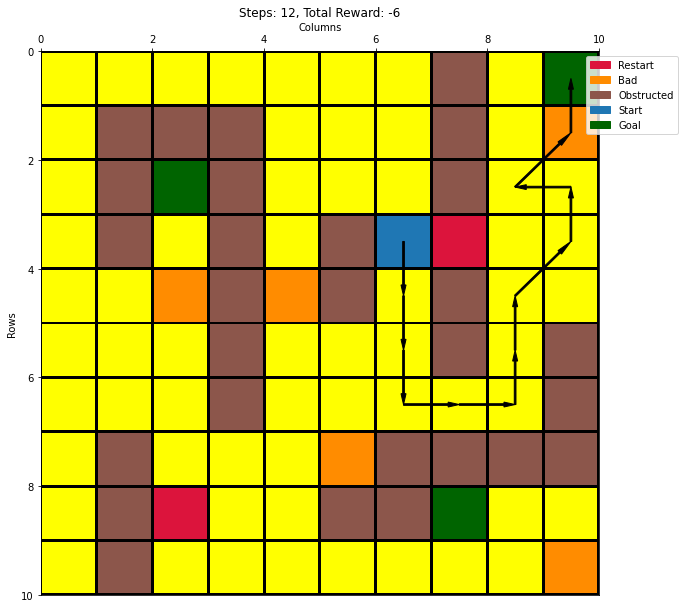

In [73]:
# best hyperparameters
balpha = 0.15
bgamma = 0.4
bepsilon = 0.07
cno = 19

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 20 - {wind = true, start = (3,6), p = 0.7} with Q-Learning and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:09<00:00, 210.93it/s]


run - 2


100%|██████████| 2000/2000 [00:07<00:00, 258.20it/s]


run - 3


100%|██████████| 2000/2000 [00:08<00:00, 248.72it/s]


run - 1


100%|██████████| 2000/2000 [00:07<00:00, 268.68it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 304.44it/s]


run - 3


100%|██████████| 2000/2000 [00:06<00:00, 293.04it/s]


run - 1


100%|██████████| 2000/2000 [00:17<00:00, 112.98it/s]


run - 2


100%|██████████| 2000/2000 [00:17<00:00, 111.27it/s]


run - 3


100%|██████████| 2000/2000 [00:17<00:00, 111.69it/s]


run - 1


100%|██████████| 2000/2000 [00:06<00:00, 318.86it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 427.07it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 438.13it/s]


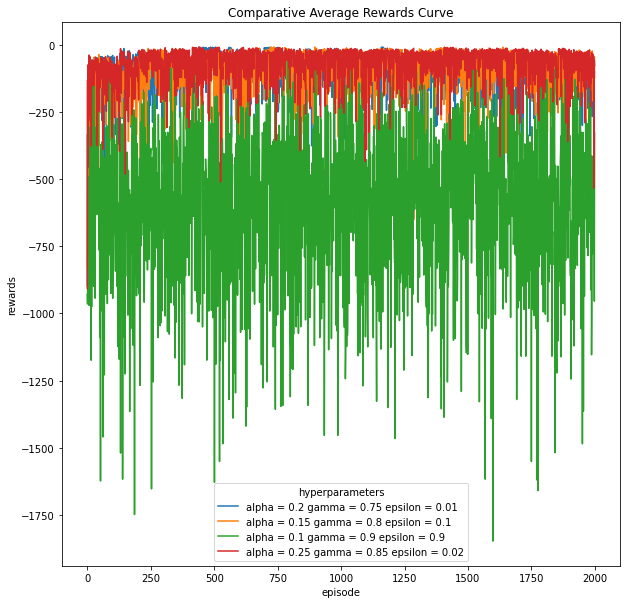

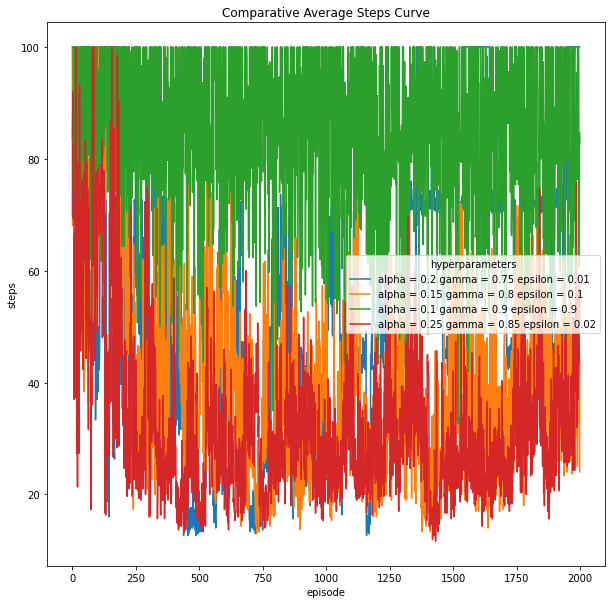

In [31]:
besthyperlist = [(0.2,0.75,0.01), (0.15,0.8,0.1), (0.1,0.9,0.9), (0.25,0.85,0.02)]
cno = 20

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:05<00:00, 359.43it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 404.96it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 715.36it/s]


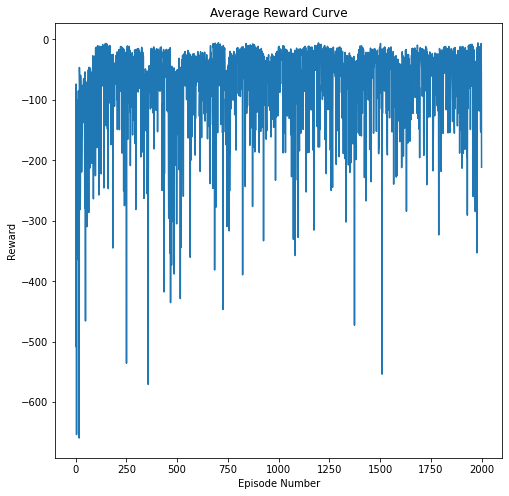

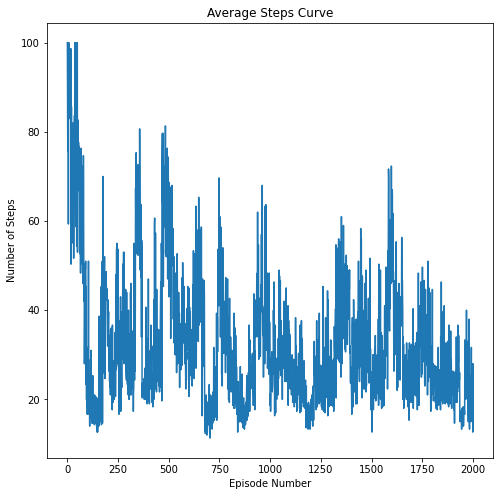

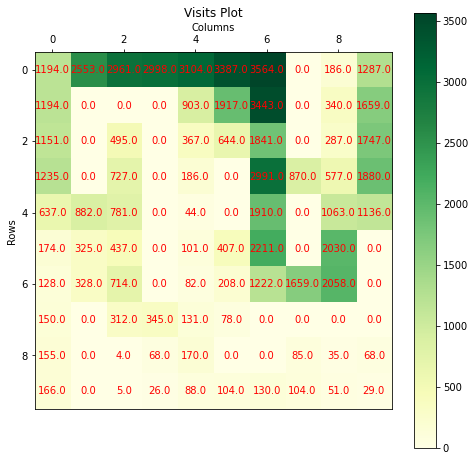

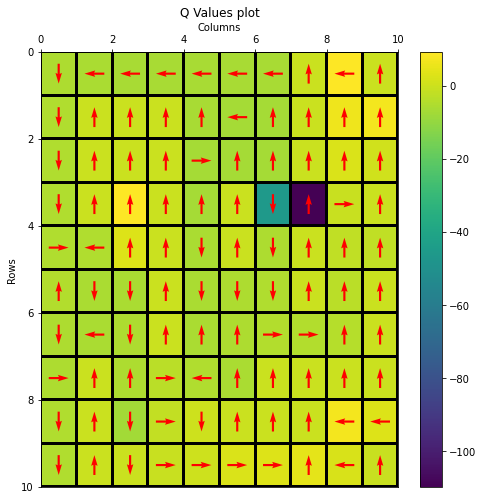

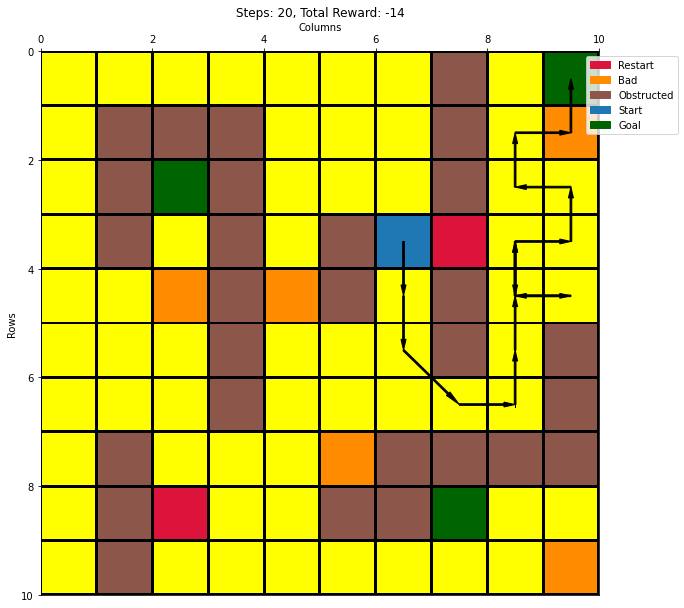

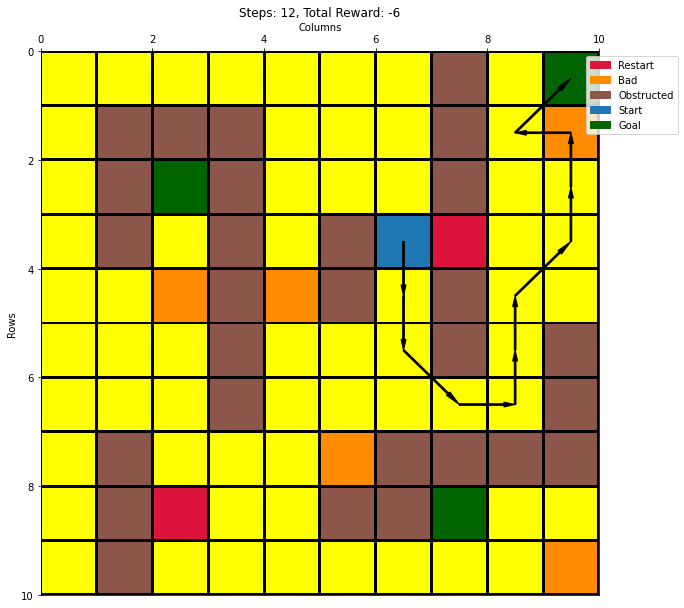

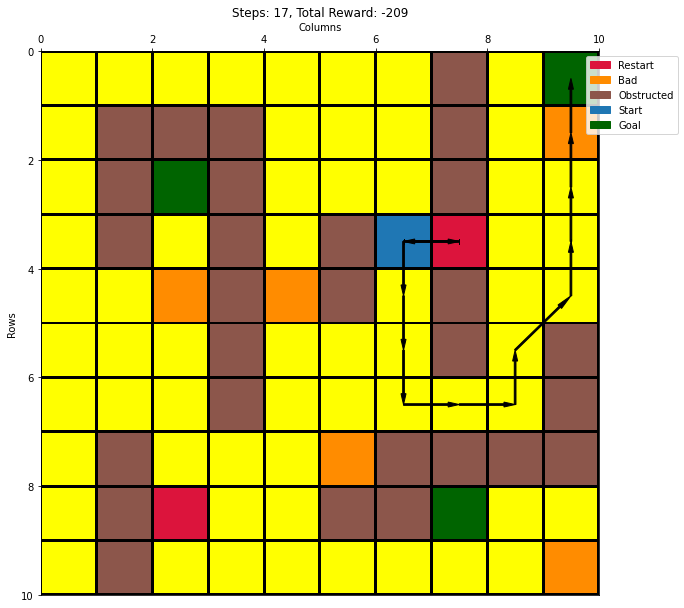

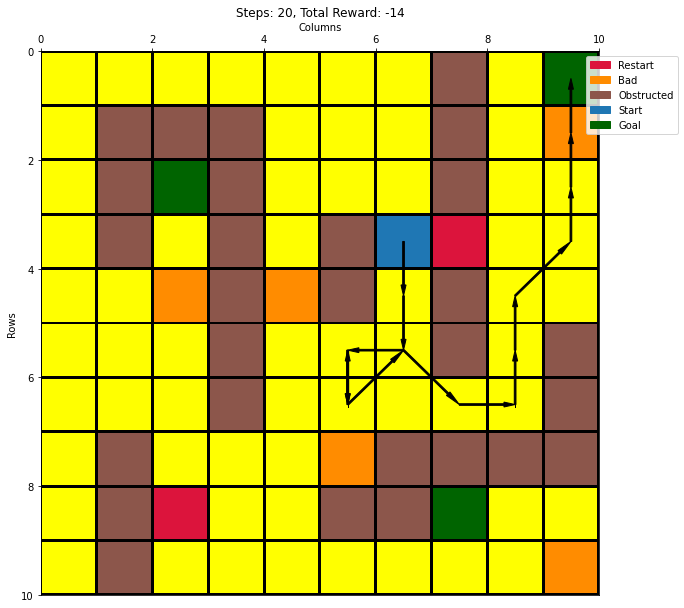

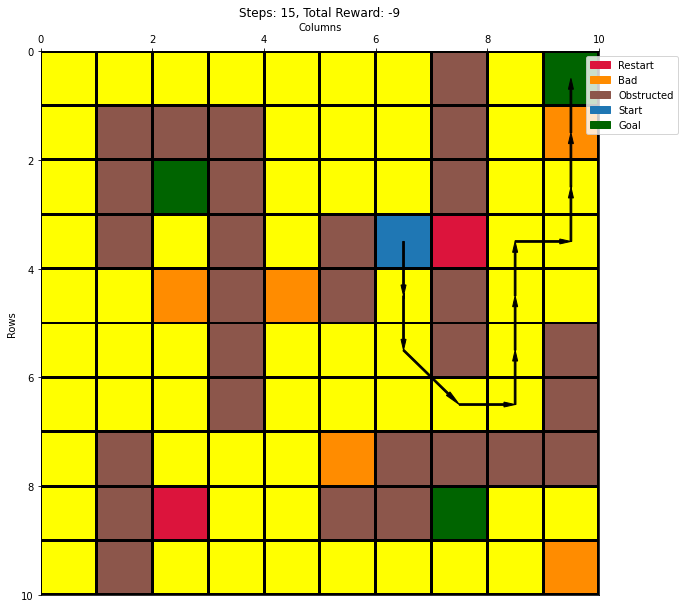

In [74]:
# best hyperparameters
balpha = 0.25
bgamma = 0.85
bepsilon = 0.02
cno = 20

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 21 - {wind = false, start = (0,4), p = 1.0} with Q-Learning and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:03<00:00, 583.02it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 600.34it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 421.73it/s]


run - 1


100%|██████████| 2000/2000 [00:05<00:00, 376.17it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 646.12it/s]


run - 3


100%|██████████| 2000/2000 [00:03<00:00, 611.41it/s]


run - 1


100%|██████████| 2000/2000 [00:03<00:00, 653.85it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 466.92it/s]


run - 3


100%|██████████| 2000/2000 [00:03<00:00, 619.95it/s]


run - 1


100%|██████████| 2000/2000 [00:03<00:00, 630.12it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 647.31it/s]


run - 3


100%|██████████| 2000/2000 [00:03<00:00, 577.33it/s]


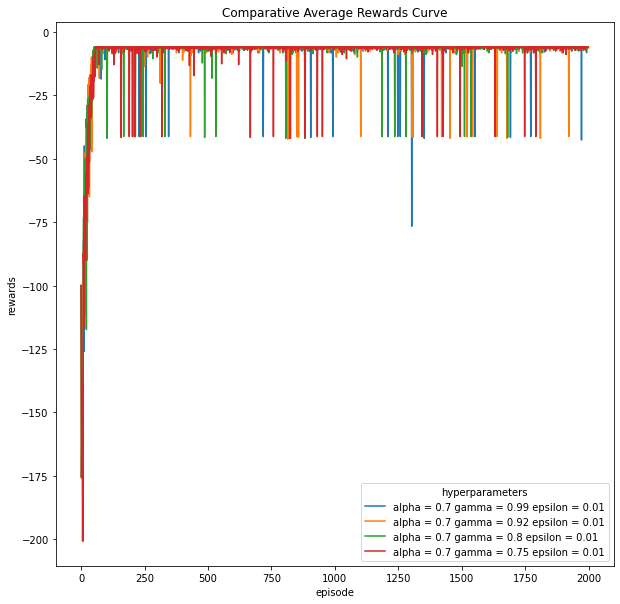

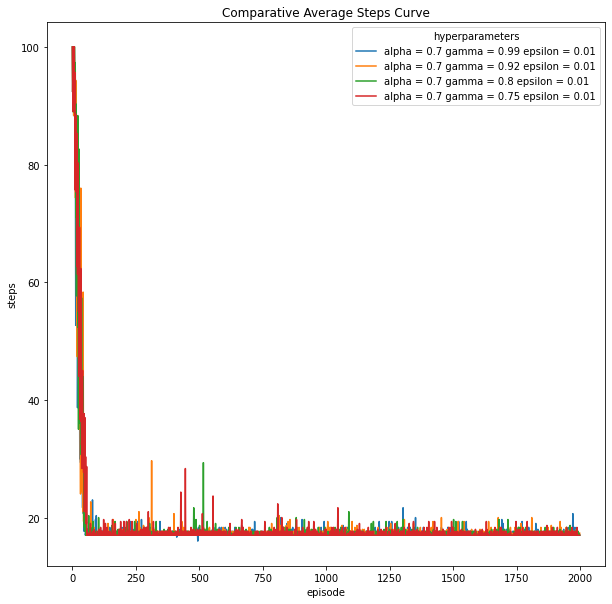

In [32]:
besthyperlist = [(0.7,0.99,0.01), (0.7,0.92,0.01), (0.7,0.8,0.01), (0.7,0.75,0.01)]
cno = 21

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:03<00:00, 521.53it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 511.26it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 925.95it/s]


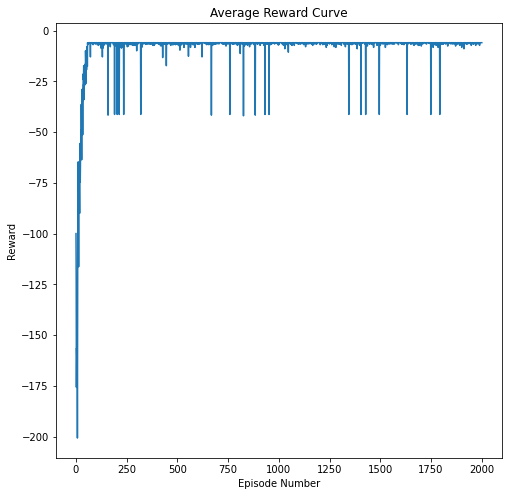

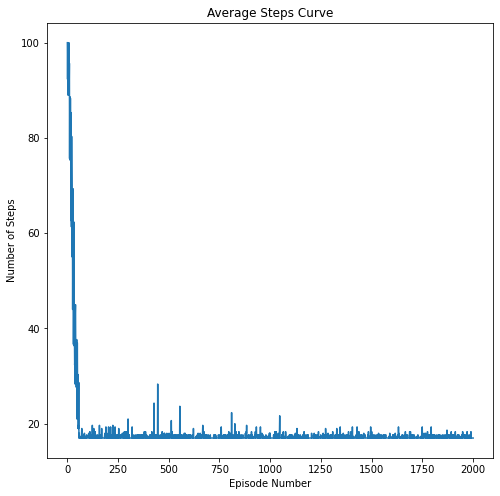

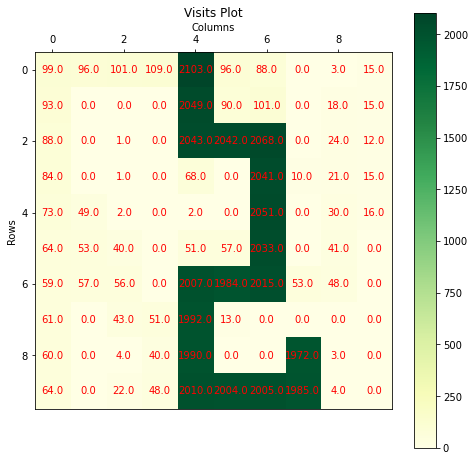

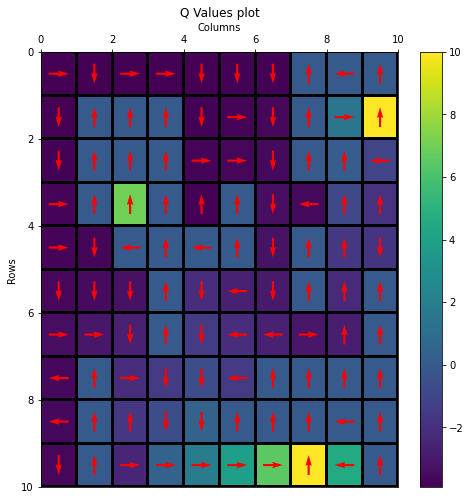

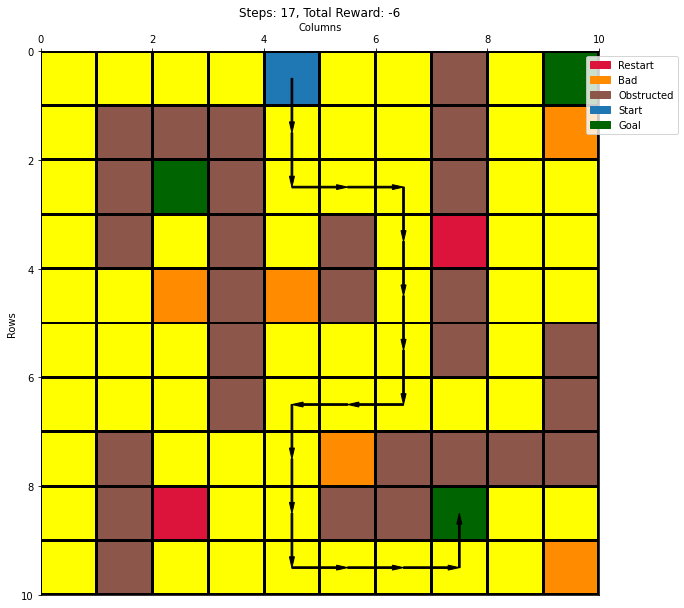

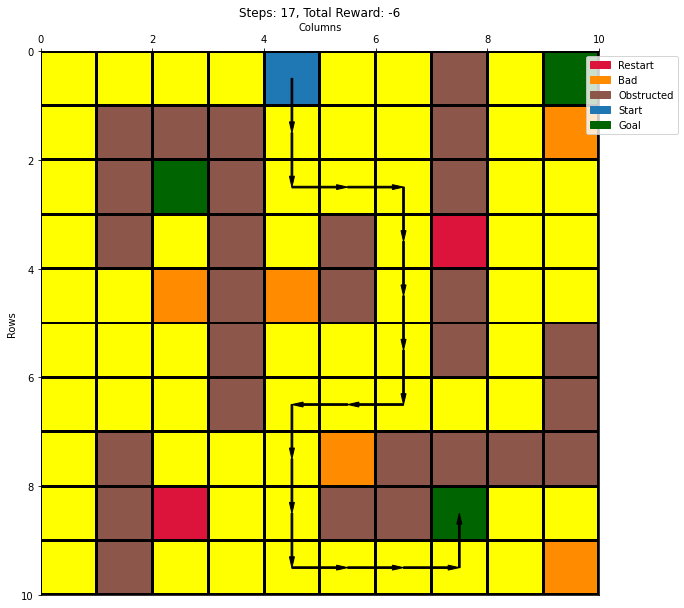

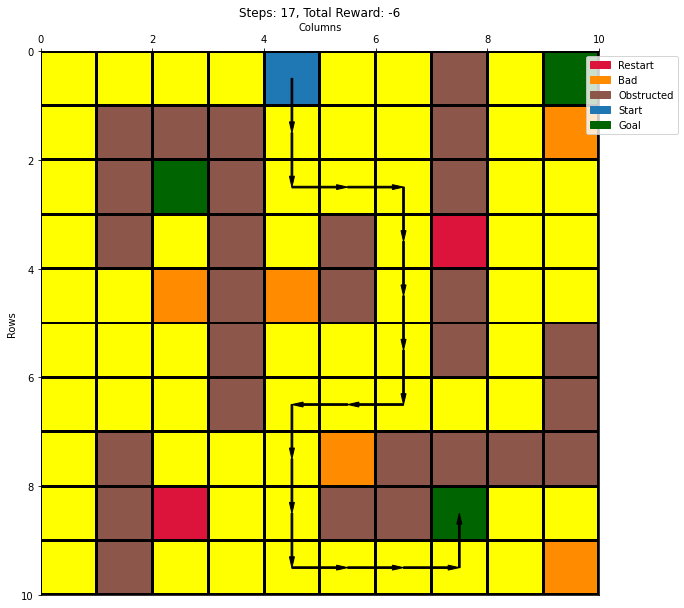

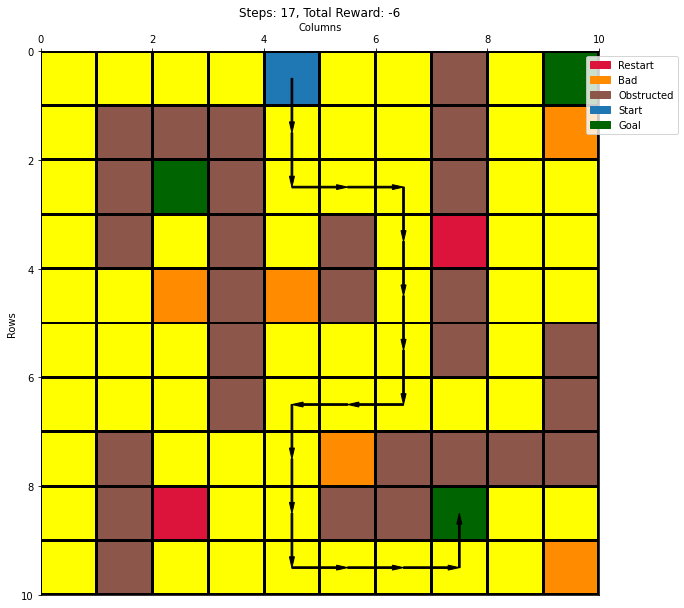

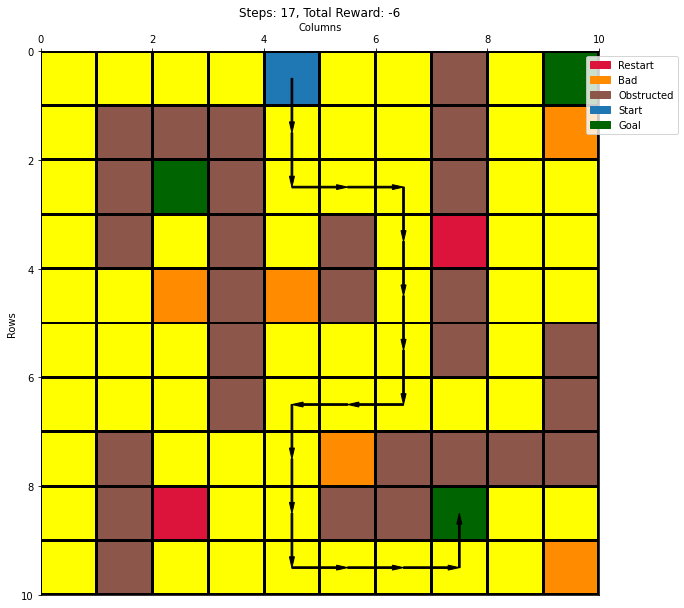

In [75]:
# best hyperparameters
balpha = 0.7
bgamma = 0.75
bepsilon = 0.01
cno = 21

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 22 - {wind = false, start = (0,4), p = 0.7} with Q-Learning and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:03<00:00, 581.28it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 639.20it/s]


run - 3


100%|██████████| 2000/2000 [00:03<00:00, 571.89it/s]


run - 1


100%|██████████| 2000/2000 [00:18<00:00, 110.44it/s]


run - 2


100%|██████████| 2000/2000 [00:16<00:00, 124.62it/s]


run - 3


100%|██████████| 2000/2000 [00:16<00:00, 123.39it/s]


run - 1


100%|██████████| 2000/2000 [00:03<00:00, 504.28it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 421.38it/s]


run - 3


100%|██████████| 2000/2000 [00:05<00:00, 381.94it/s]


run - 1


100%|██████████| 2000/2000 [00:04<00:00, 485.20it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 471.67it/s]


run - 3


100%|██████████| 2000/2000 [00:05<00:00, 365.20it/s]


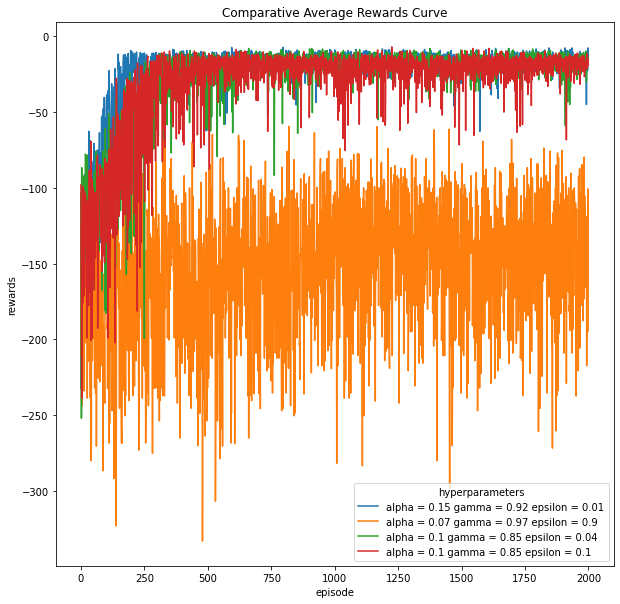

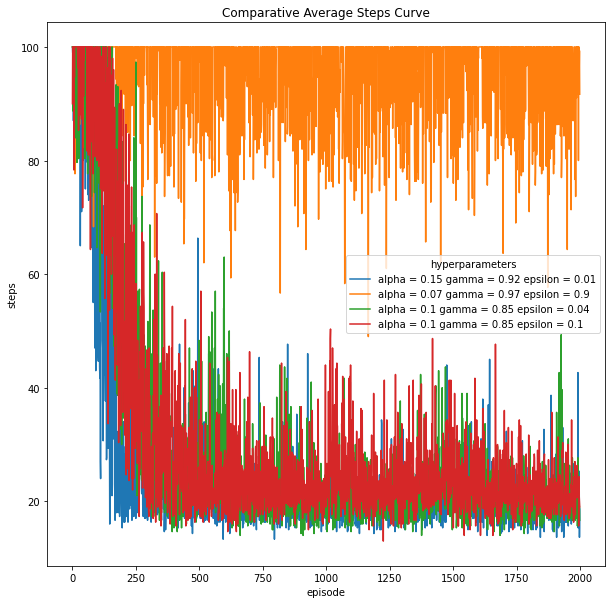

In [33]:
besthyperlist = [(0.15,0.92,0.01), (0.07,0.97,0.9), (0.1,0.85,0.04), (0.1,0.85,0.1)]
cno = 22

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:04<00:00, 478.18it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 617.78it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 1476.20it/s]


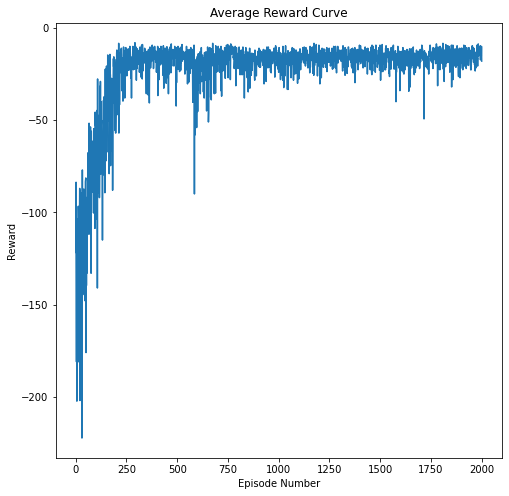

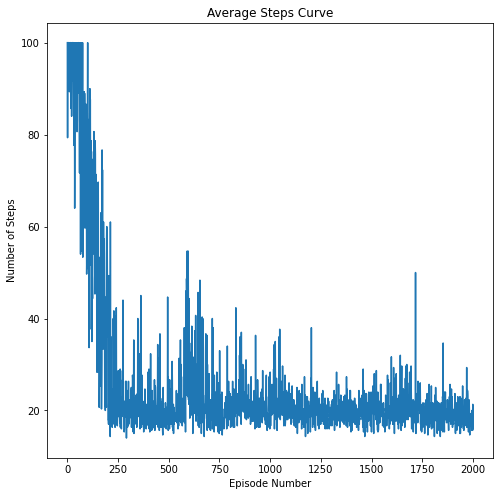

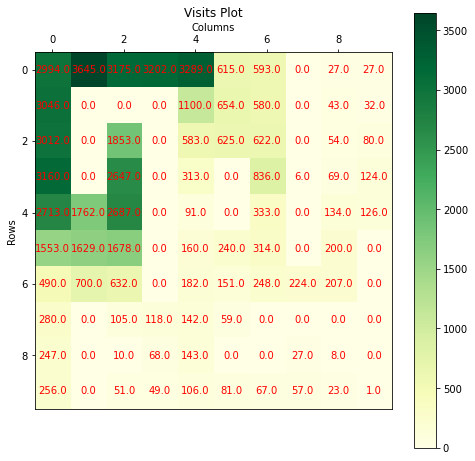

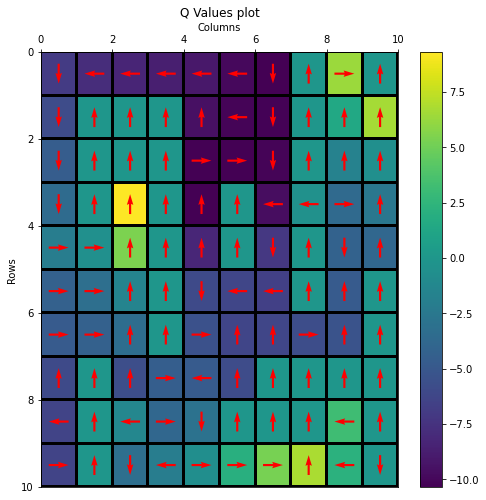

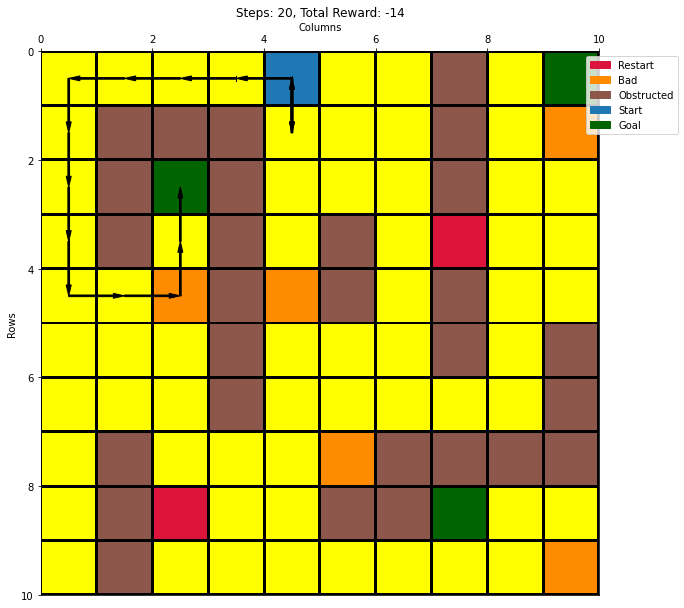

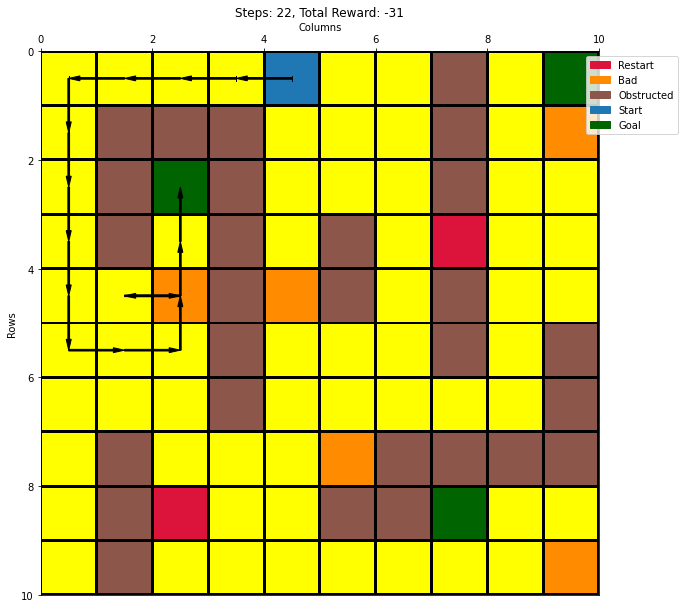

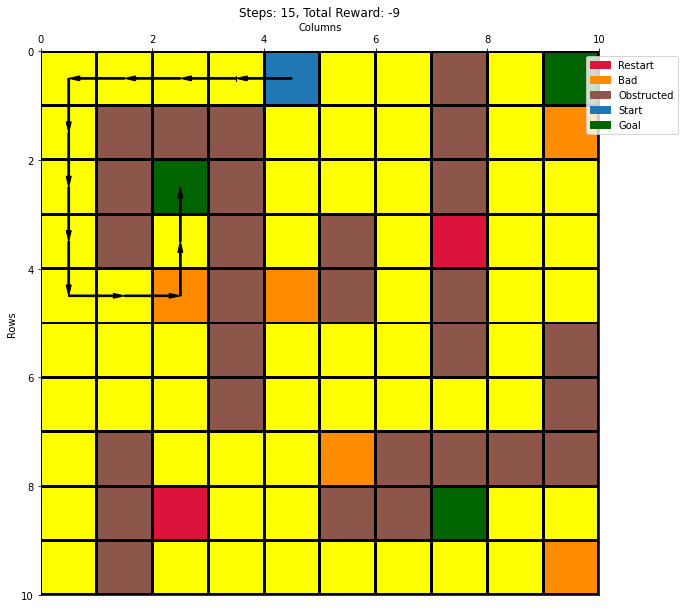

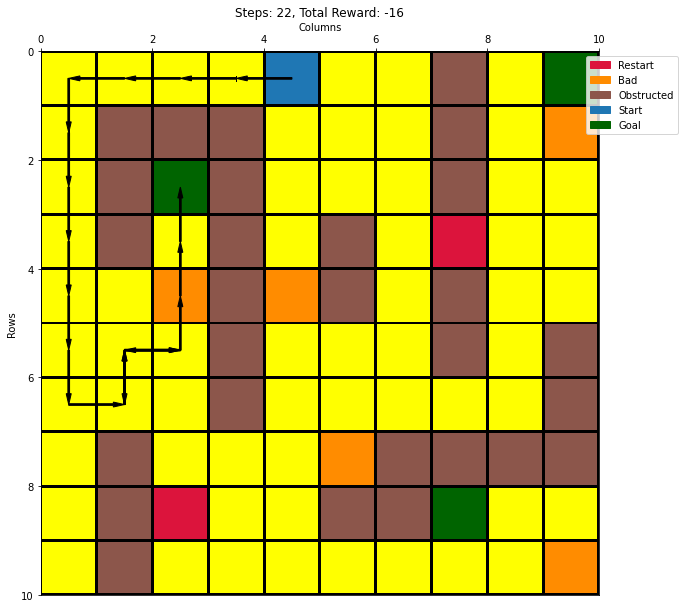

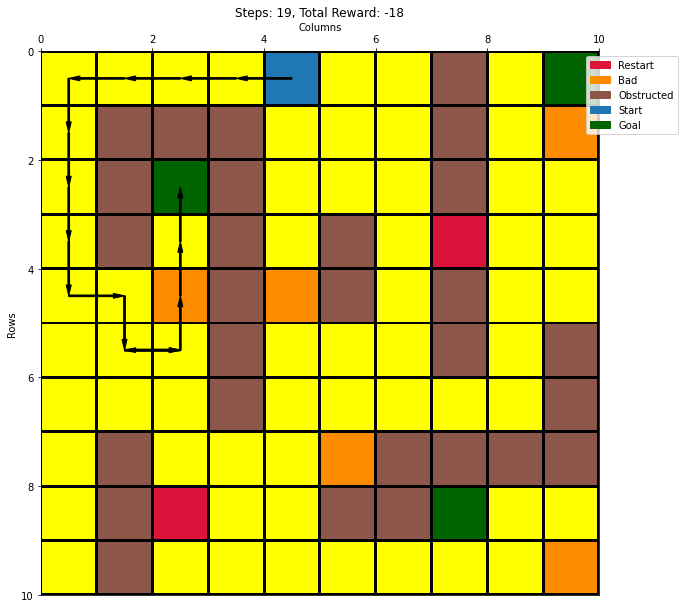

In [76]:
# best hyperparameters
balpha = 0.15
bgamma = 0.92
bepsilon = 0.01
cno = 22

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 23 - {wind = false, start = (3,6), p = 1.0} with Q-Learning and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:02<00:00, 794.81it/s] 


run - 2


100%|██████████| 2000/2000 [00:02<00:00, 875.19it/s]


run - 3


100%|██████████| 2000/2000 [00:02<00:00, 759.87it/s]


run - 1


100%|██████████| 2000/2000 [00:03<00:00, 570.95it/s]


run - 2


100%|██████████| 2000/2000 [00:03<00:00, 562.54it/s]


run - 3


100%|██████████| 2000/2000 [00:02<00:00, 709.90it/s]


run - 1


100%|██████████| 2000/2000 [00:02<00:00, 835.26it/s]


run - 2


100%|██████████| 2000/2000 [00:02<00:00, 799.58it/s]


run - 3


100%|██████████| 2000/2000 [00:03<00:00, 560.57it/s]


run - 1


100%|██████████| 2000/2000 [00:02<00:00, 763.48it/s]


run - 2


100%|██████████| 2000/2000 [00:02<00:00, 827.96it/s] 


run - 3


100%|██████████| 2000/2000 [00:02<00:00, 838.57it/s]


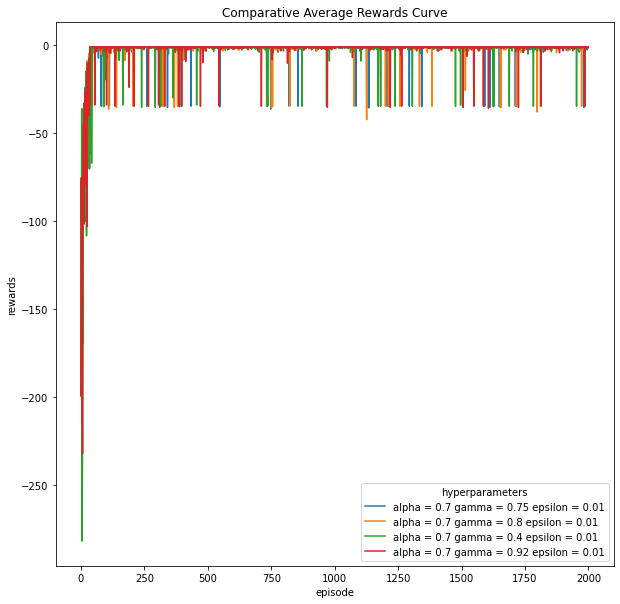

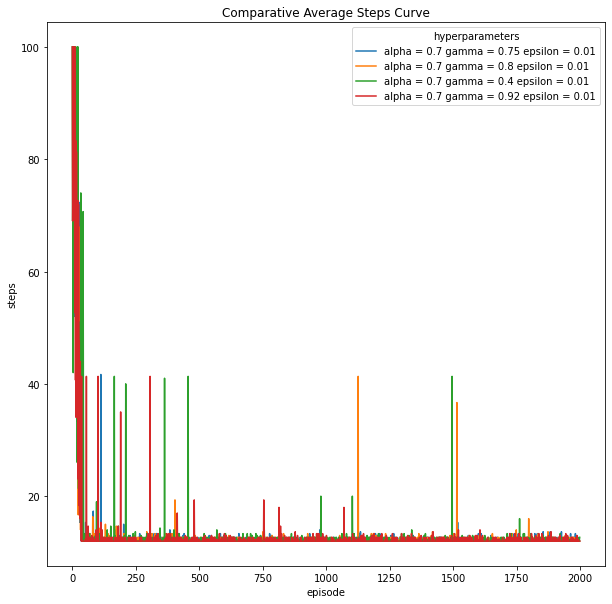

In [34]:
besthyperlist = [(0.7,0.75,0.01), (0.7,0.8,0.01), (0.7,0.4,0.01), (0.7,0.92,0.01)]
cno = 23

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:02<00:00, 833.42it/s]


run - 2


100%|██████████| 2000/2000 [00:02<00:00, 827.91it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 1612.61it/s]


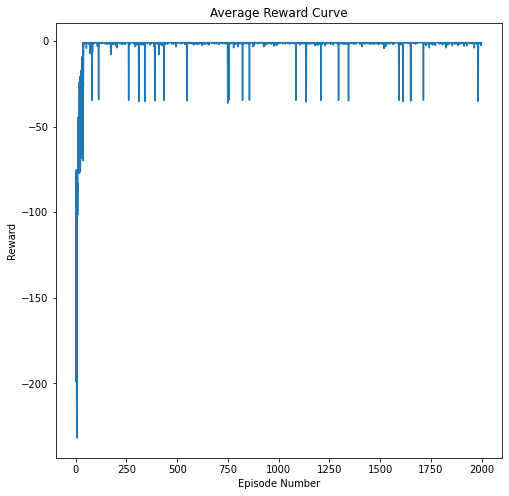

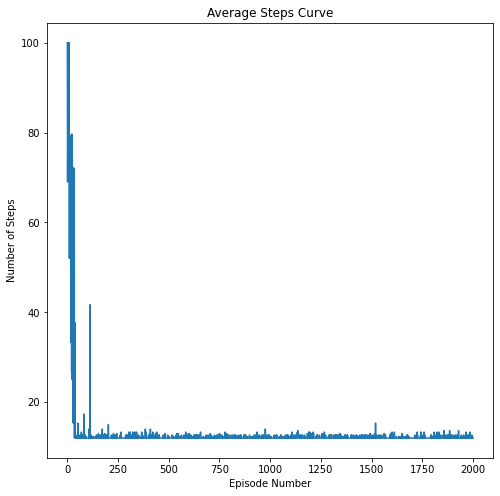

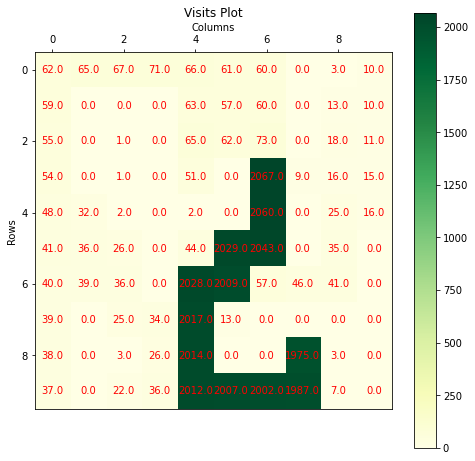

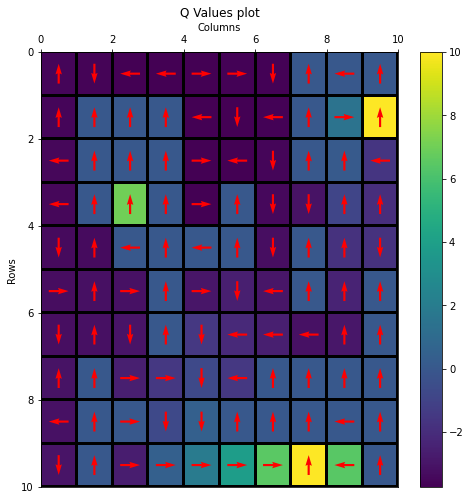

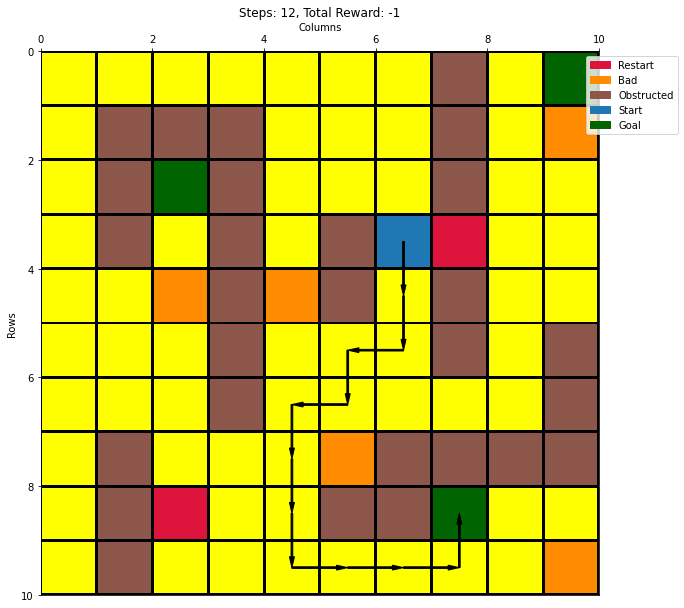

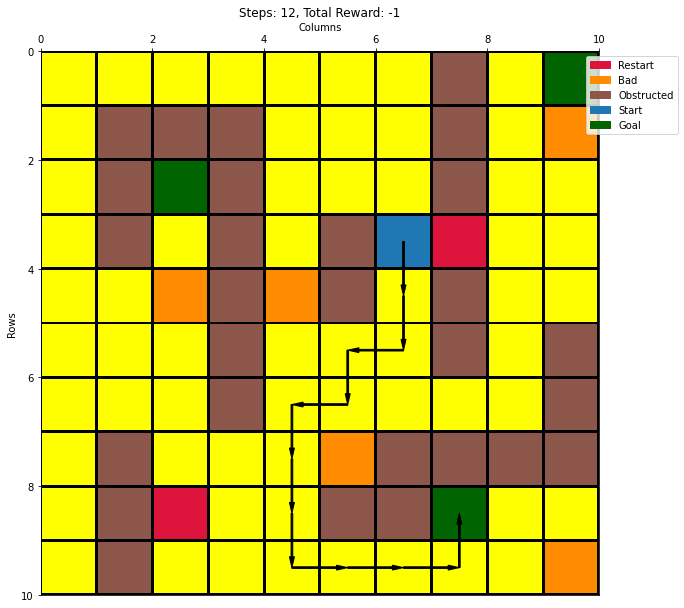

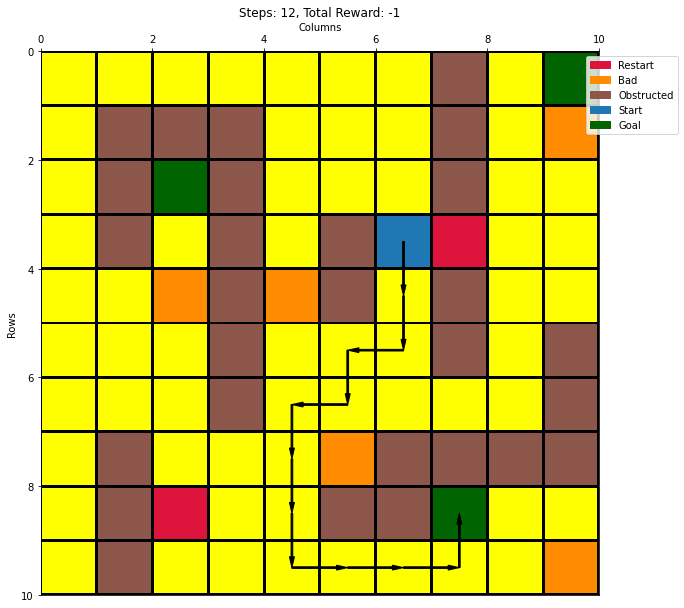

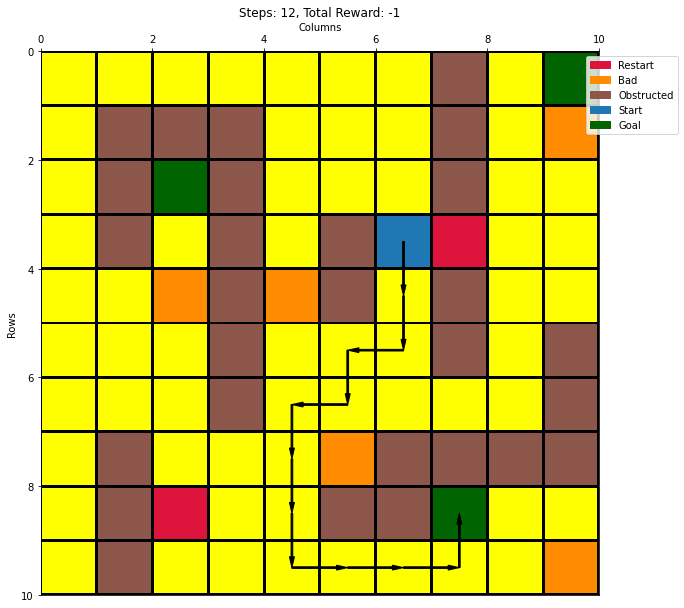

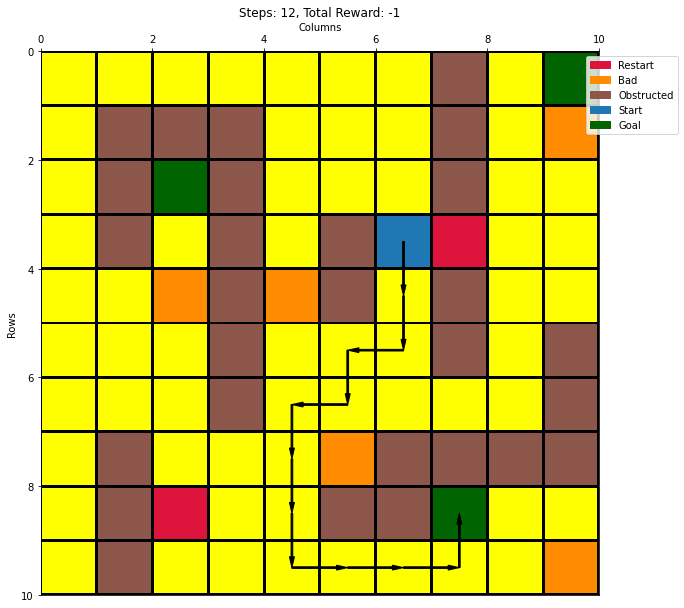

In [77]:
# best hyperparameters
balpha = 0.7
bgamma = 0.75
bepsilon = 0.01
cno = 23

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 24 - {wind = false, start = (3,6), p = 0.7} with Q-Learning and ep-greedy action selection

run - 1


100%|██████████| 2000/2000 [00:12<00:00, 154.89it/s]


run - 2


100%|██████████| 2000/2000 [00:12<00:00, 154.33it/s]


run - 3


100%|██████████| 2000/2000 [00:13<00:00, 150.60it/s]


run - 1


100%|██████████| 2000/2000 [00:06<00:00, 291.05it/s]


run - 2


100%|██████████| 2000/2000 [00:07<00:00, 260.80it/s]


run - 3


100%|██████████| 2000/2000 [00:05<00:00, 336.99it/s]


run - 1


100%|██████████| 2000/2000 [00:07<00:00, 271.69it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 319.59it/s]


run - 3


100%|██████████| 2000/2000 [00:07<00:00, 270.10it/s]


run - 1


100%|██████████| 2000/2000 [00:12<00:00, 158.26it/s]


run - 2


100%|██████████| 2000/2000 [00:14<00:00, 140.13it/s]


run - 3


100%|██████████| 2000/2000 [00:14<00:00, 137.90it/s]


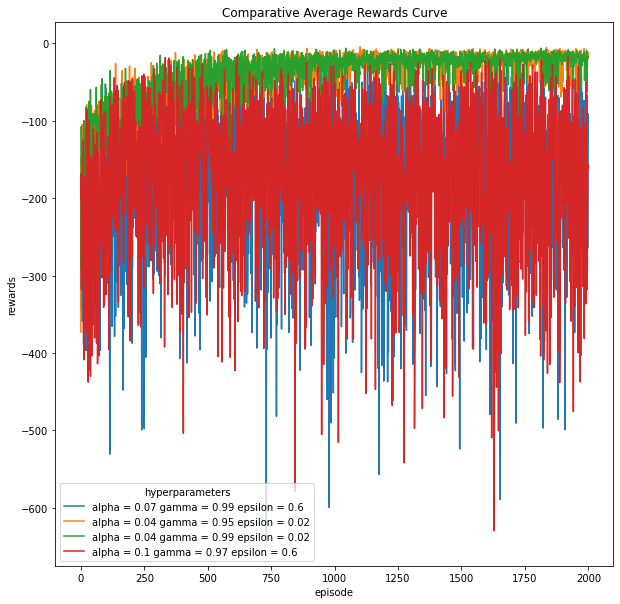

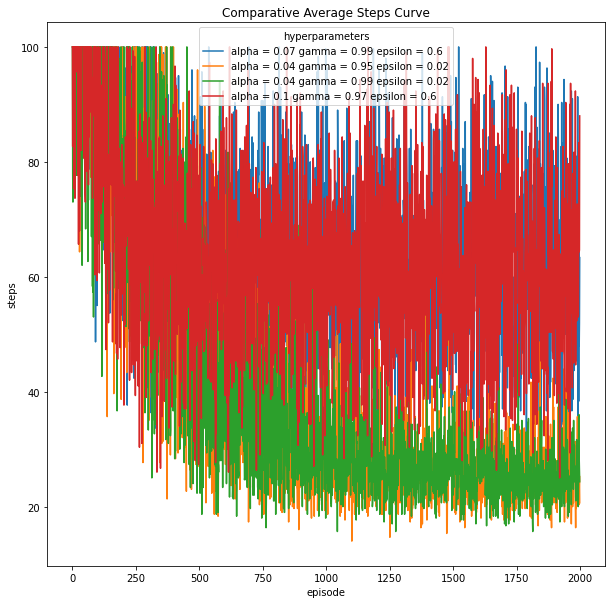

In [35]:
besthyperlist = [(0.07,0.99,0.6), (0.04,0.95,0.02), (0.04,0.99,0.02), (0.1,0.97,0.6)]
cno = 24

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:05<00:00, 360.05it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 306.93it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 550.78it/s]


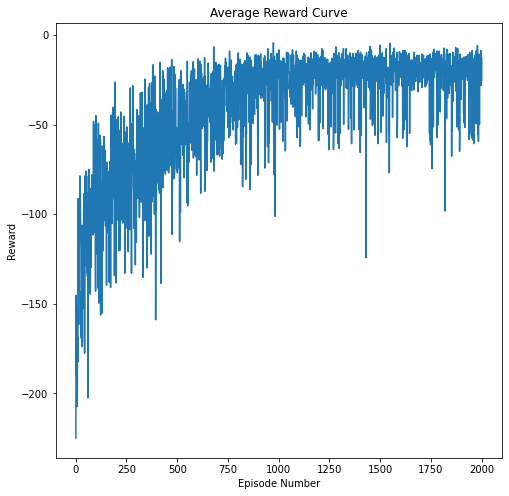

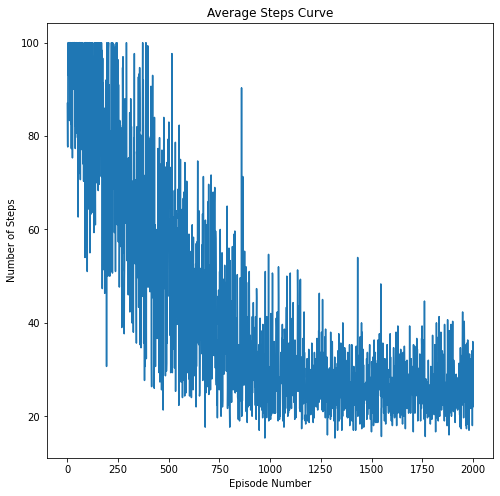

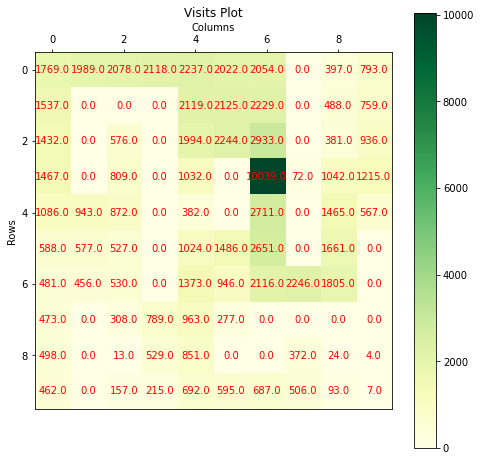

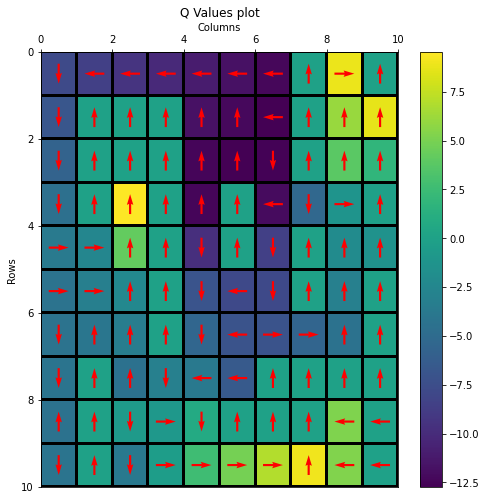

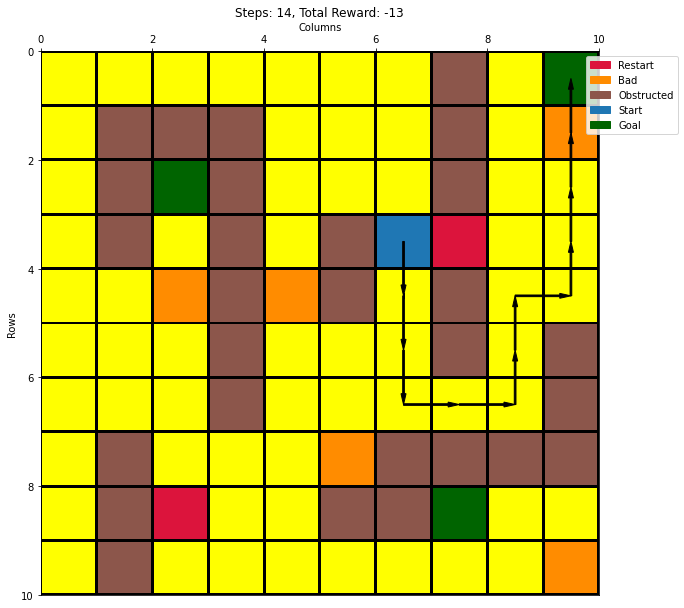

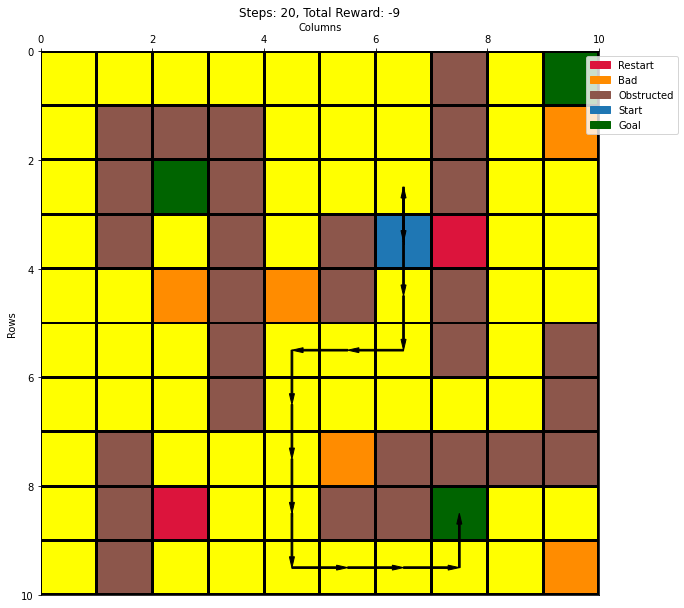

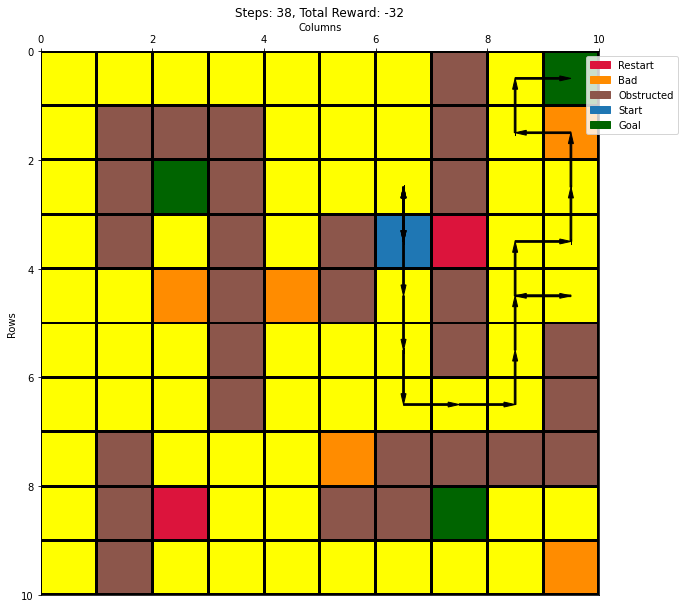

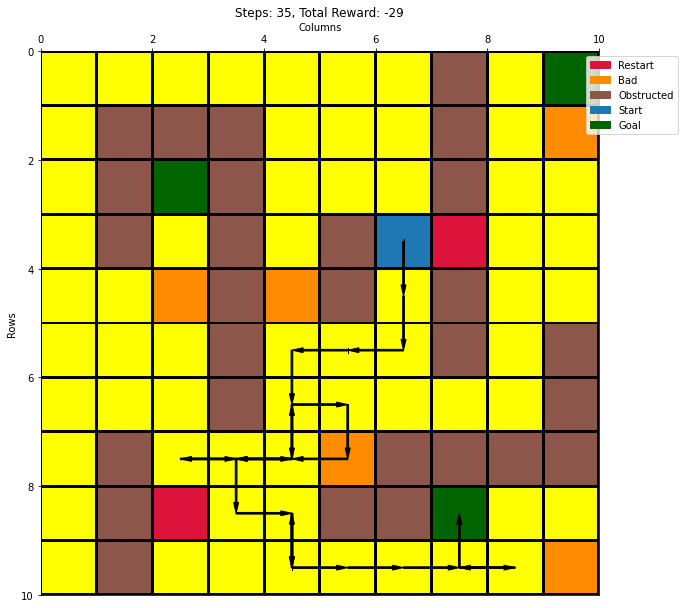

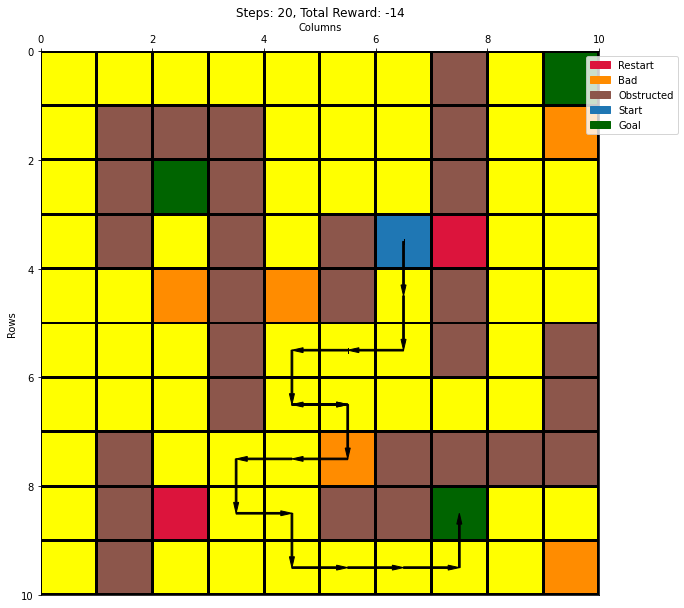

In [78]:
# best hyperparameters
balpha = 0.04
bgamma = 0.95
bepsilon = 0.02
cno = 24

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, bepsilon, None, False, False)
new_exp.generate_plots_report(cno)

# Configuration 25 - {wind = true, start = (0,4), p = 1.0} with Q-Learning and softmax selection

run - 1


100%|██████████| 2000/2000 [00:18<00:00, 110.35it/s]


run - 2


100%|██████████| 2000/2000 [00:18<00:00, 110.28it/s]


run - 3


100%|██████████| 2000/2000 [00:21<00:00, 95.20it/s] 


run - 1


100%|██████████| 2000/2000 [00:34<00:00, 57.15it/s]


run - 2


100%|██████████| 2000/2000 [00:36<00:00, 54.20it/s]


run - 3


100%|██████████| 2000/2000 [00:31<00:00, 63.02it/s]


run - 1


100%|██████████| 2000/2000 [00:35<00:00, 56.21it/s]


run - 2


100%|██████████| 2000/2000 [00:34<00:00, 57.95it/s]


run - 3


100%|██████████| 2000/2000 [00:32<00:00, 62.37it/s]


run - 1


100%|██████████| 2000/2000 [00:09<00:00, 204.34it/s]


run - 2


100%|██████████| 2000/2000 [00:10<00:00, 197.29it/s]


run - 3


100%|██████████| 2000/2000 [00:10<00:00, 184.06it/s]


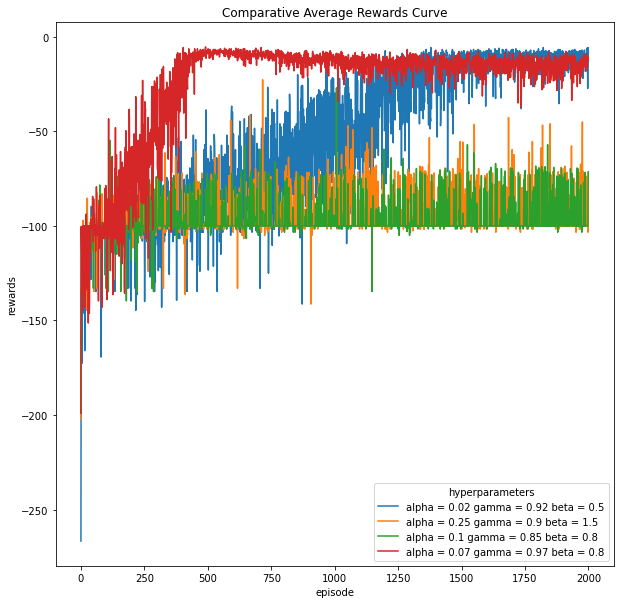

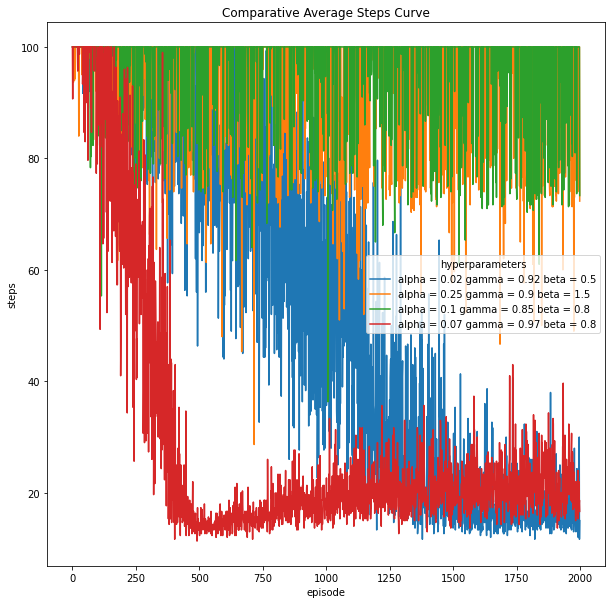

In [36]:
besthyperlist = [(0.02,0.92,0.5), (0.25,0.9,1.5), (0.1,0.85,0.8), (0.07,0.97,0.8)]
cno = 25

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:09<00:00, 202.94it/s]


run - 2


100%|██████████| 2000/2000 [00:10<00:00, 190.42it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 1272.34it/s]


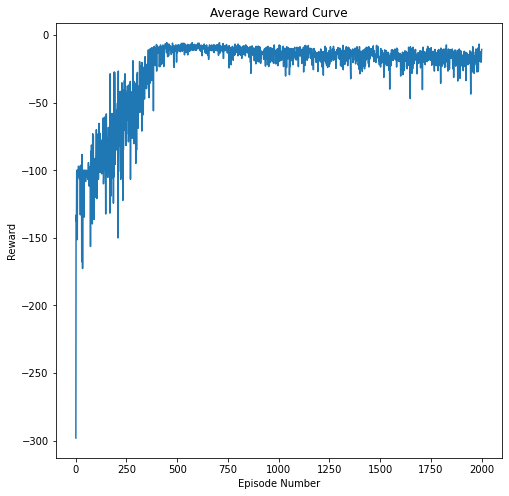

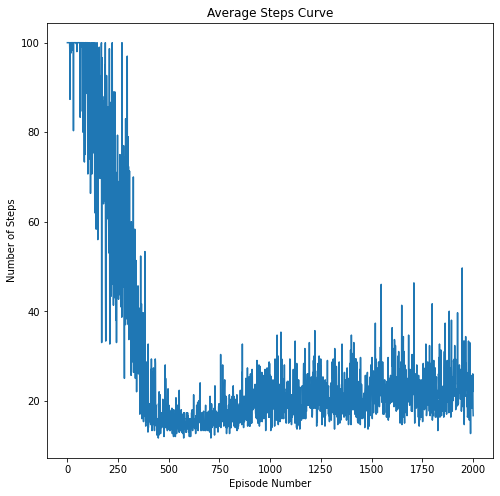

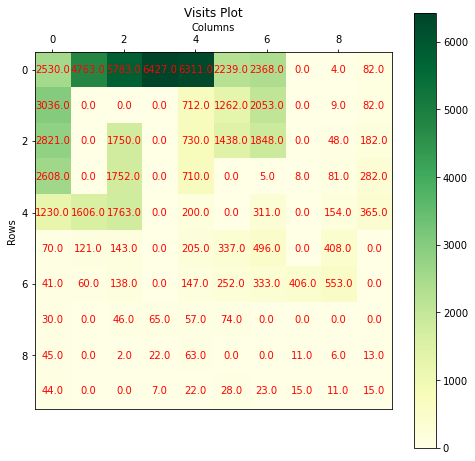

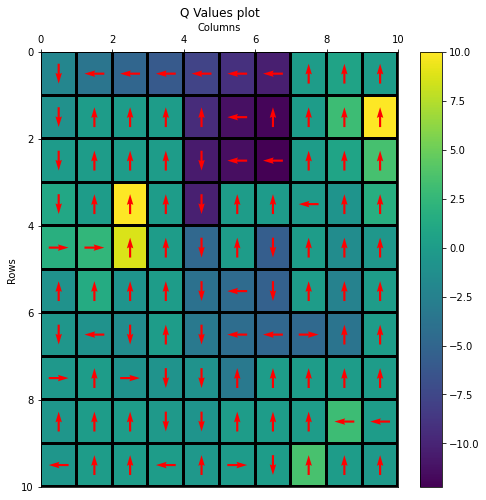

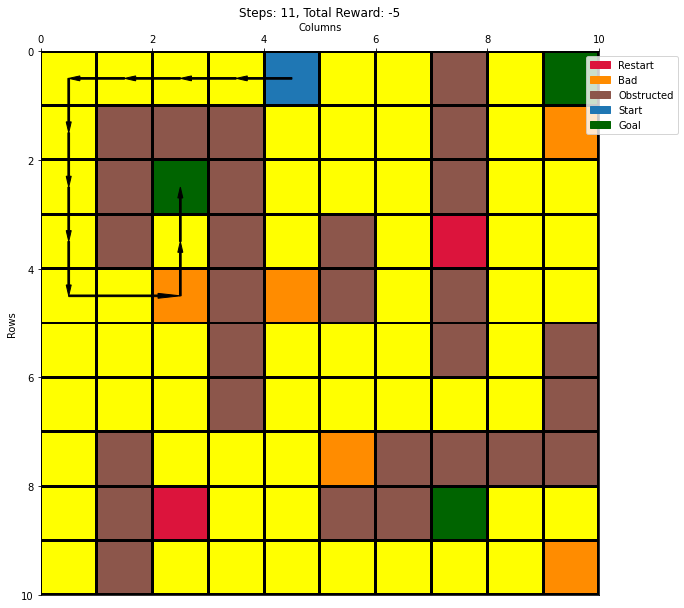

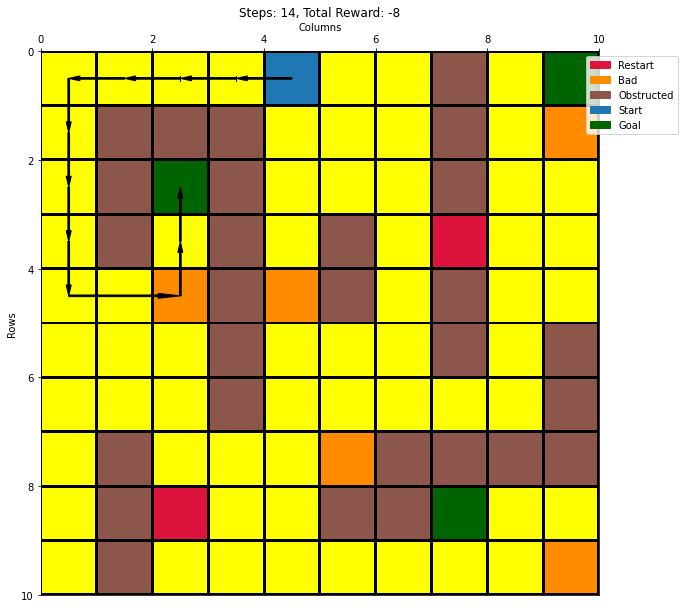

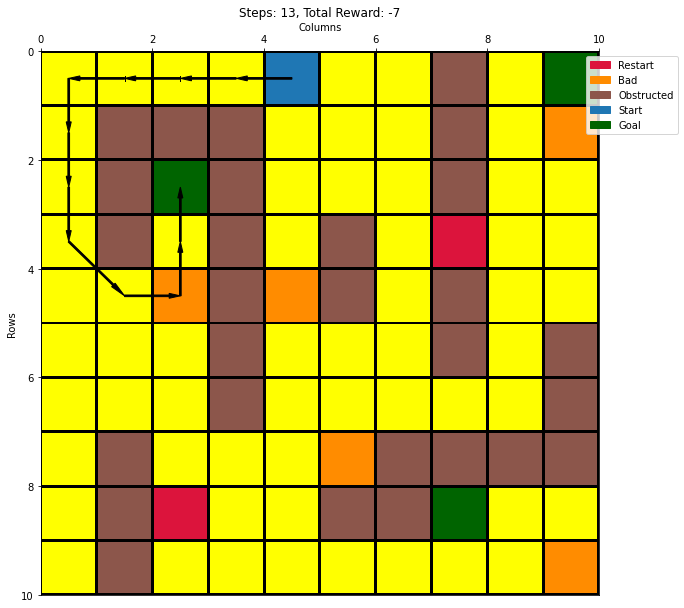

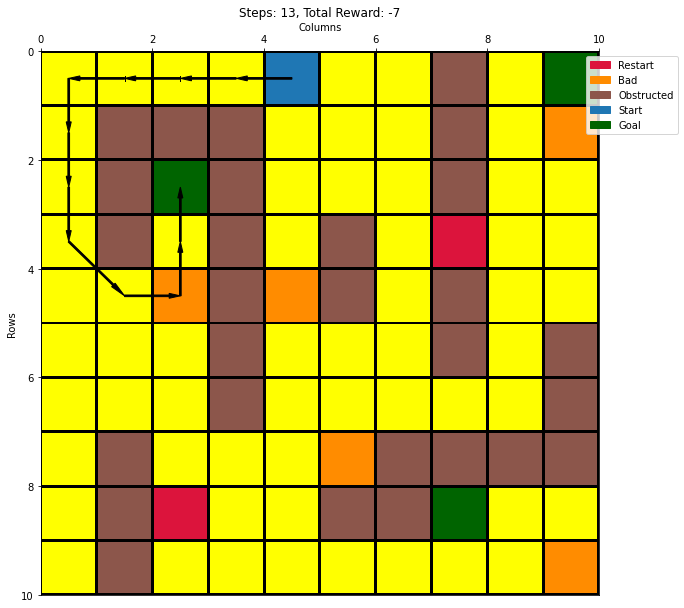

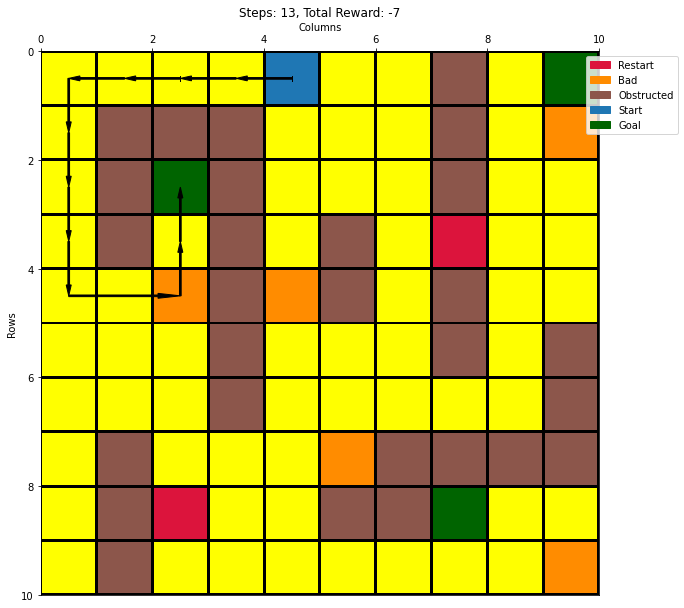

In [79]:
# best hyperparameters
balpha = 0.07
bgamma = 0.97
bbeta = 0.8
cno = 25

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

# Configuration 26 - {wind = true, start = (0,4), p = 0.7} with Q-Learning and softmax selection

run - 1


100%|██████████| 2000/2000 [00:14<00:00, 134.18it/s]


run - 2


100%|██████████| 2000/2000 [00:14<00:00, 136.34it/s]


run - 3


100%|██████████| 2000/2000 [00:14<00:00, 134.46it/s]


run - 1


100%|██████████| 2000/2000 [00:11<00:00, 169.95it/s]


run - 2


100%|██████████| 2000/2000 [00:15<00:00, 130.85it/s]


run - 3


100%|██████████| 2000/2000 [00:11<00:00, 168.30it/s]


run - 1


100%|██████████| 2000/2000 [00:20<00:00, 98.61it/s] 


run - 2


100%|██████████| 2000/2000 [00:21<00:00, 94.00it/s] 


run - 3


100%|██████████| 2000/2000 [00:22<00:00, 90.01it/s] 


run - 1


100%|██████████| 2000/2000 [00:15<00:00, 126.39it/s]


run - 2


100%|██████████| 2000/2000 [00:15<00:00, 125.17it/s]


run - 3


100%|██████████| 2000/2000 [00:16<00:00, 123.18it/s]


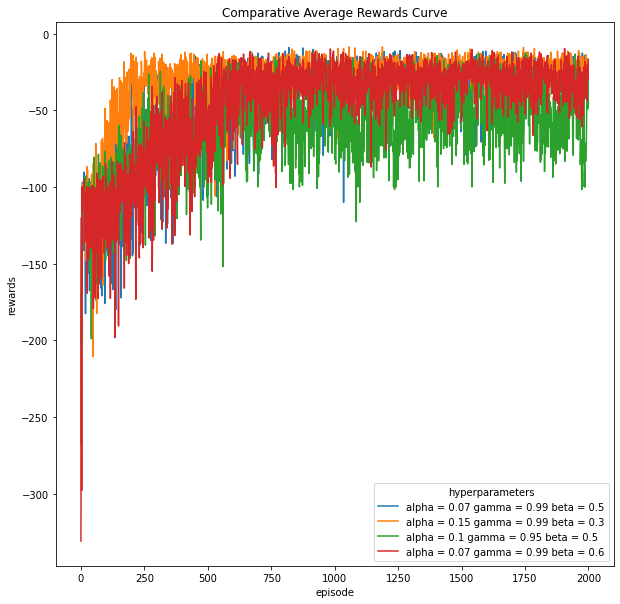

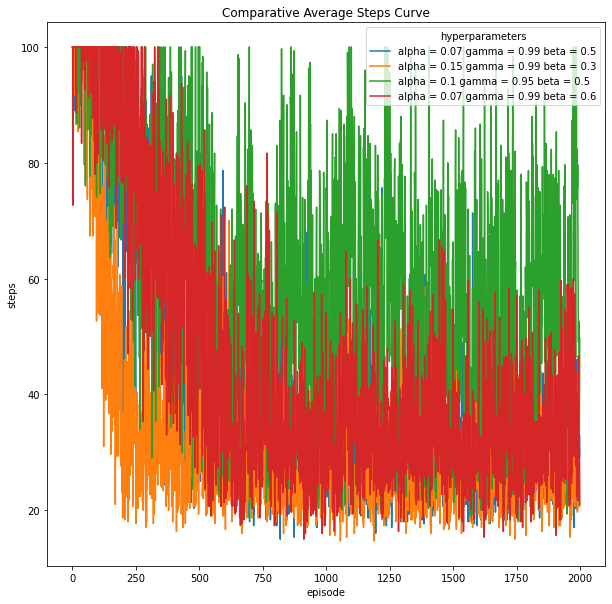

In [37]:
besthyperlist = [(0.07,0.99,0.5), (0.15,0.99,0.3), (0.1,0.95,0.5), (0.07,0.99,0.6)]
cno = 26

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:11<00:00, 169.47it/s]


run - 2


100%|██████████| 2000/2000 [00:11<00:00, 171.87it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 583.31it/s]


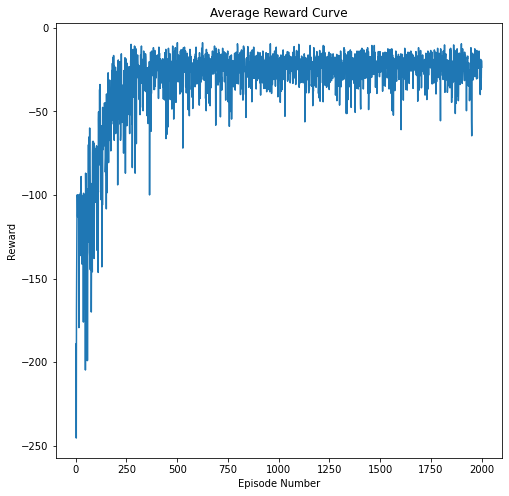

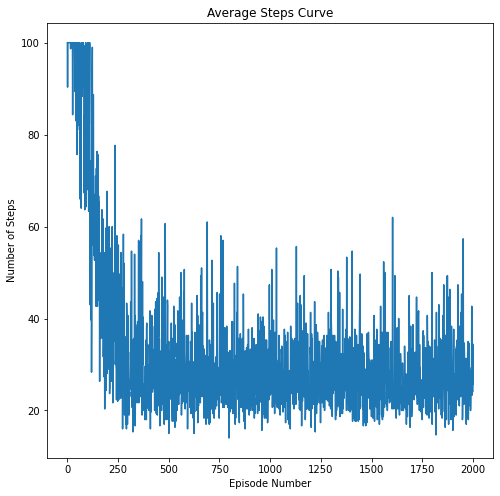

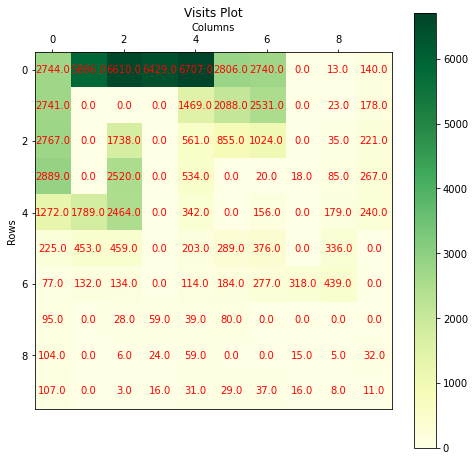

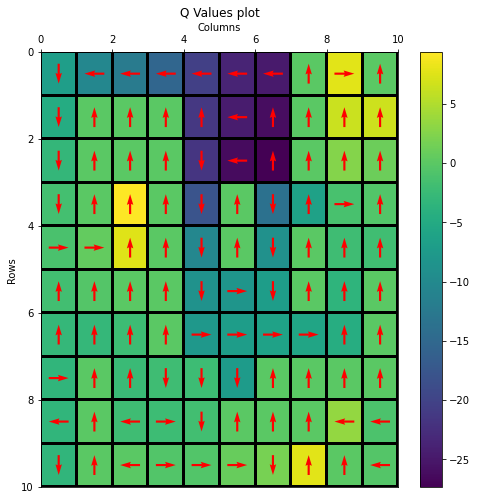

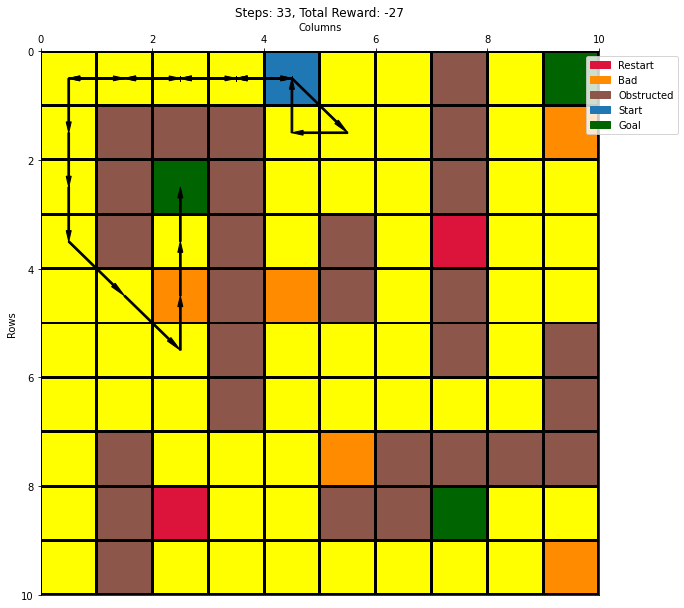

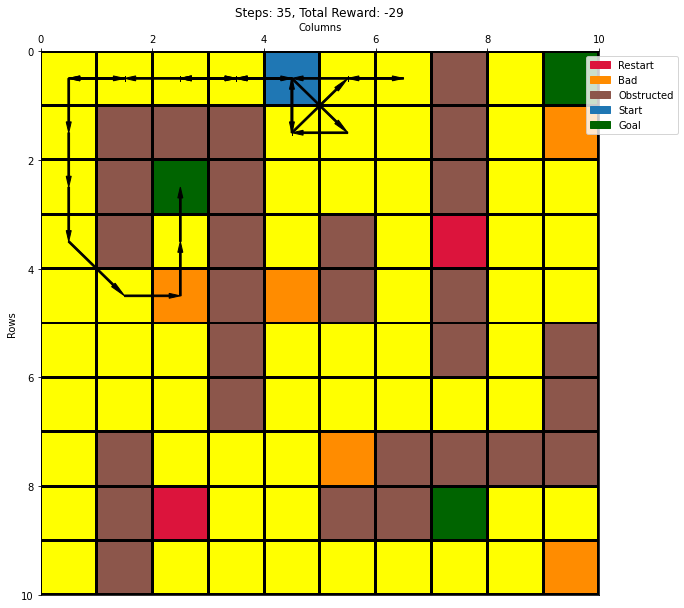

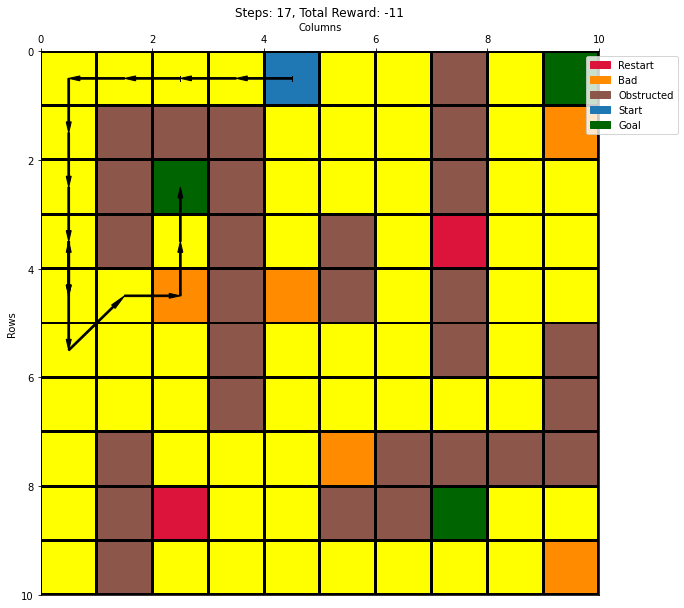

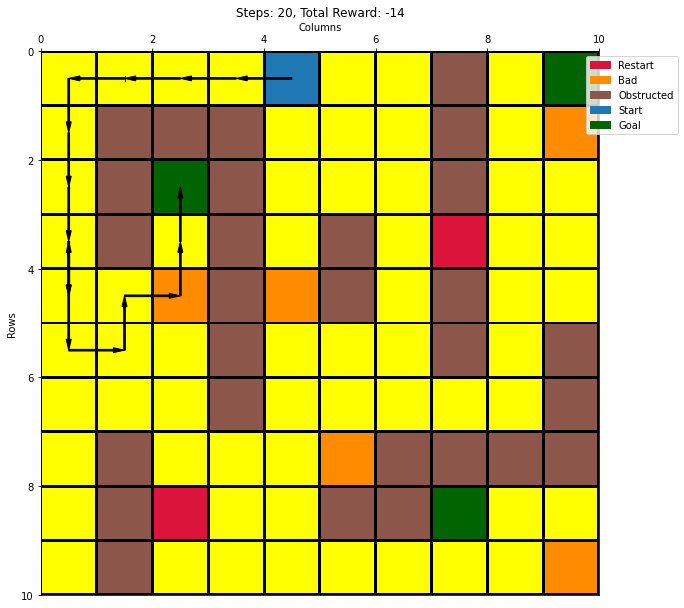

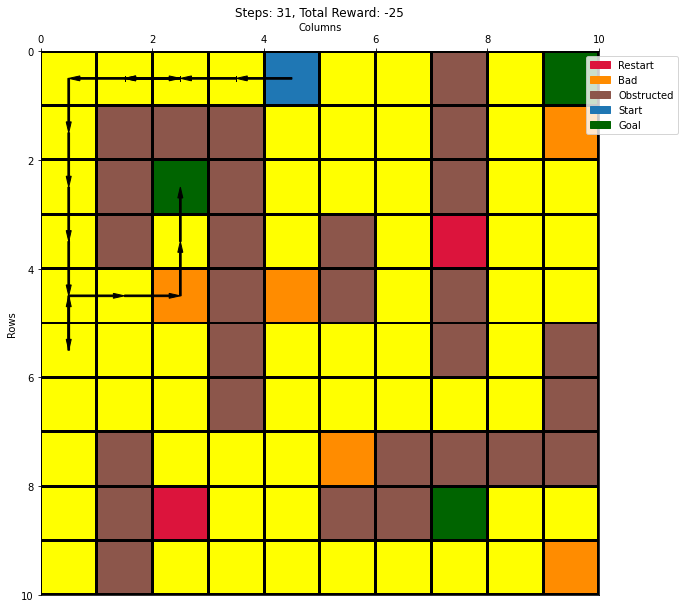

In [80]:
# best hyperparameters
balpha = 0.15
bgamma = 0.99
bbeta = 0.3
cno = 26

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

# Configuration 27 - {wind = true, start = (3,6), p = 1.0} with Q-Learning and softmax selection

run - 1


100%|██████████| 2000/2000 [00:31<00:00, 64.01it/s]


run - 2


100%|██████████| 2000/2000 [00:28<00:00, 70.85it/s]


run - 3


100%|██████████| 2000/2000 [00:42<00:00, 46.71it/s]


run - 1


100%|██████████| 2000/2000 [00:51<00:00, 39.21it/s]


run - 2


100%|██████████| 2000/2000 [00:55<00:00, 36.16it/s]


run - 3


100%|██████████| 2000/2000 [00:51<00:00, 38.53it/s]


run - 1


100%|██████████| 2000/2000 [00:44<00:00, 44.66it/s]


run - 2


100%|██████████| 2000/2000 [00:45<00:00, 43.93it/s]


run - 3


100%|██████████| 2000/2000 [00:35<00:00, 56.28it/s]


run - 1


100%|██████████| 2000/2000 [00:33<00:00, 59.46it/s]


run - 2


100%|██████████| 2000/2000 [00:34<00:00, 57.48it/s]


run - 3


100%|██████████| 2000/2000 [00:34<00:00, 57.65it/s]


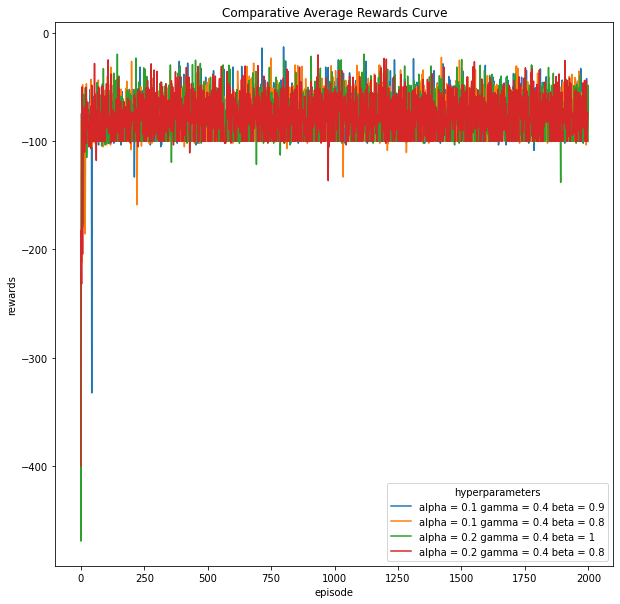

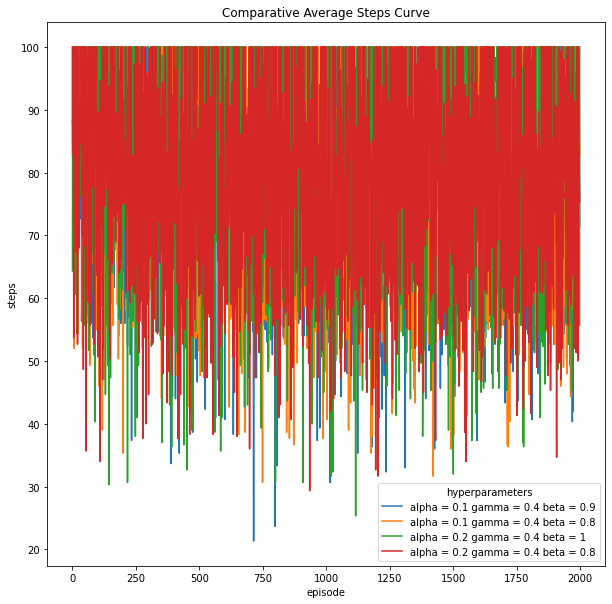

In [38]:
besthyperlist = [(0.1,0.4,0.9), (0.1,0.4,0.8), (0.2,0.4,1), (0.2,0.4,0.8)]
cno = 27

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:28<00:00, 71.13it/s]


run - 2


100%|██████████| 2000/2000 [00:27<00:00, 72.28it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 1080.19it/s]


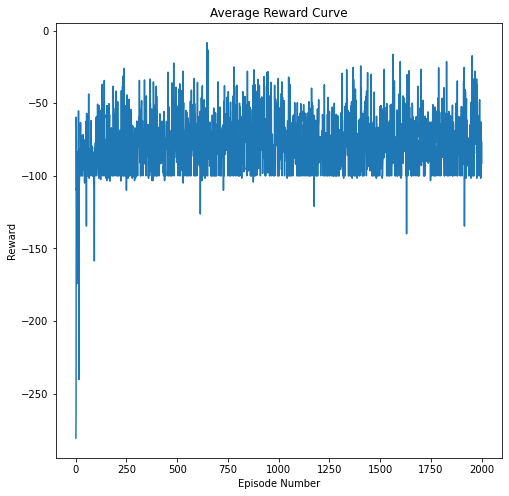

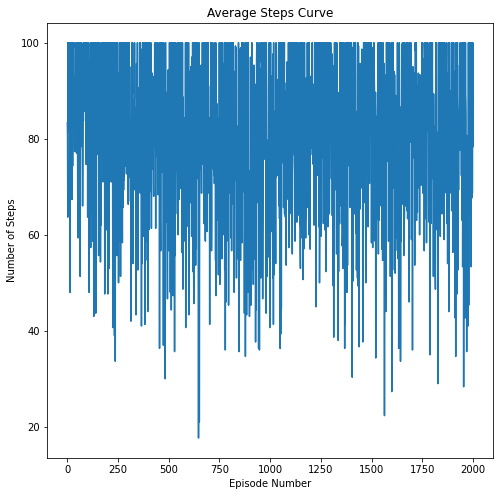

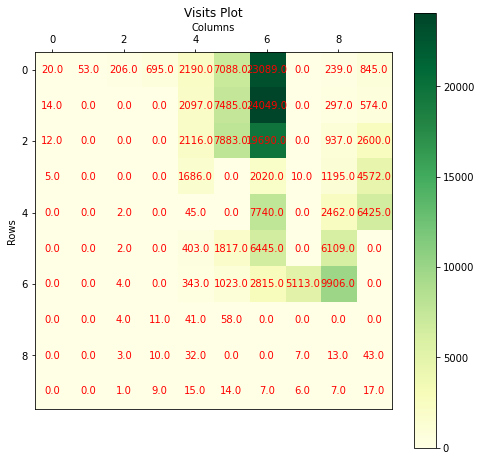

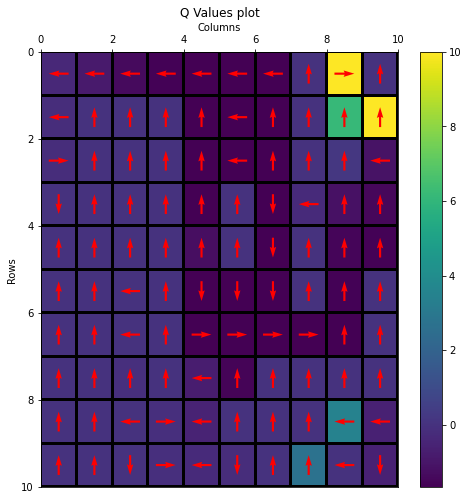

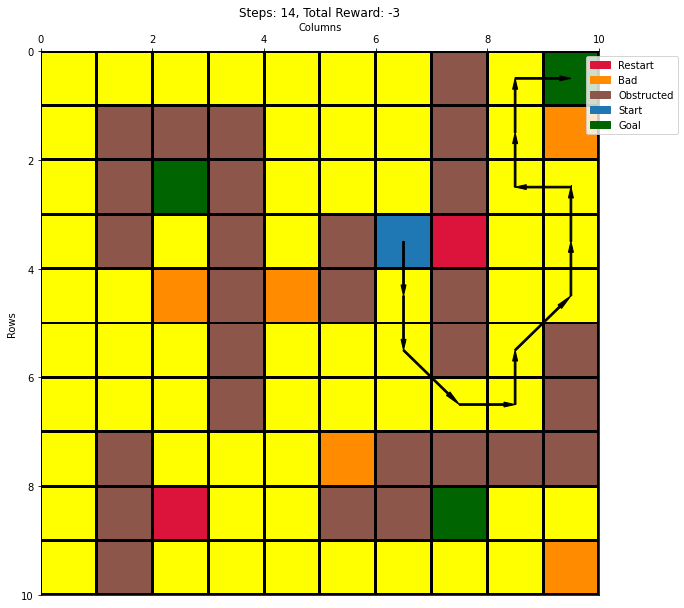

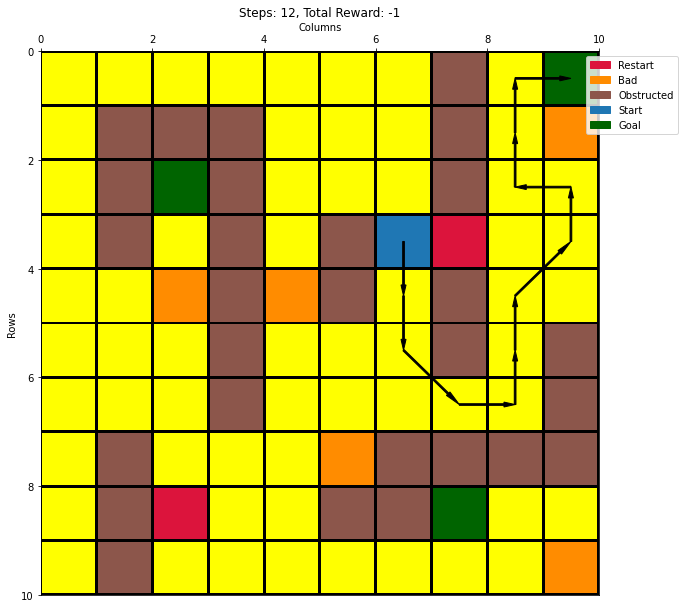

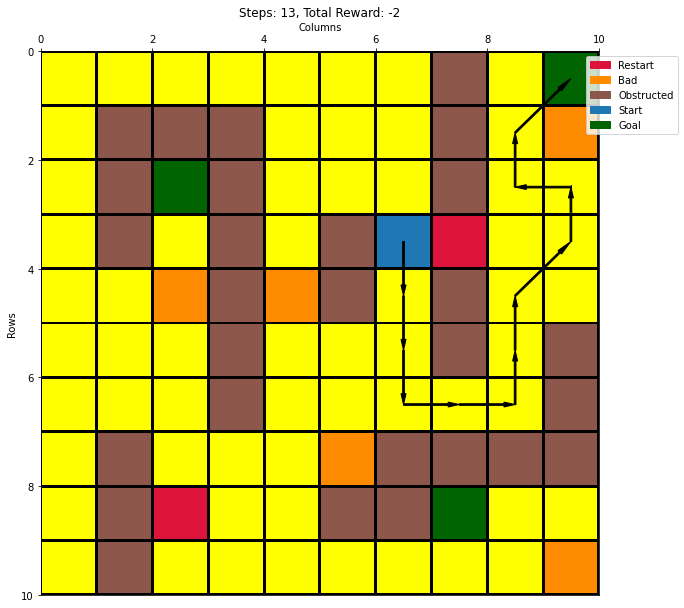

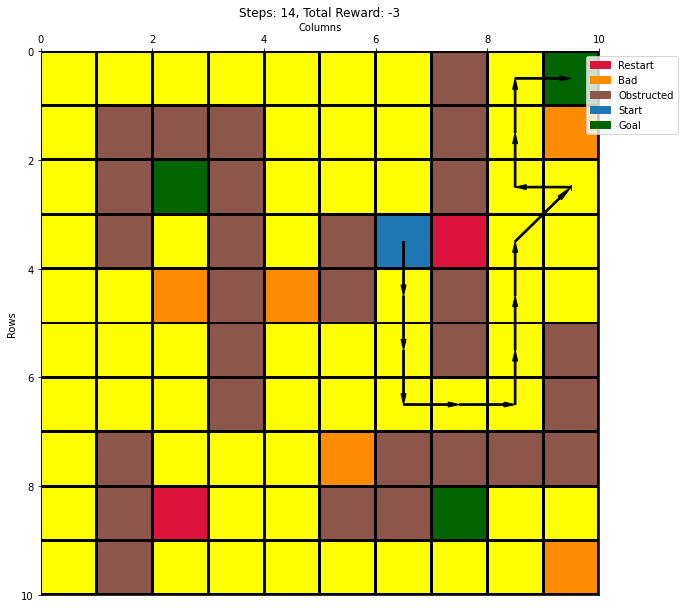

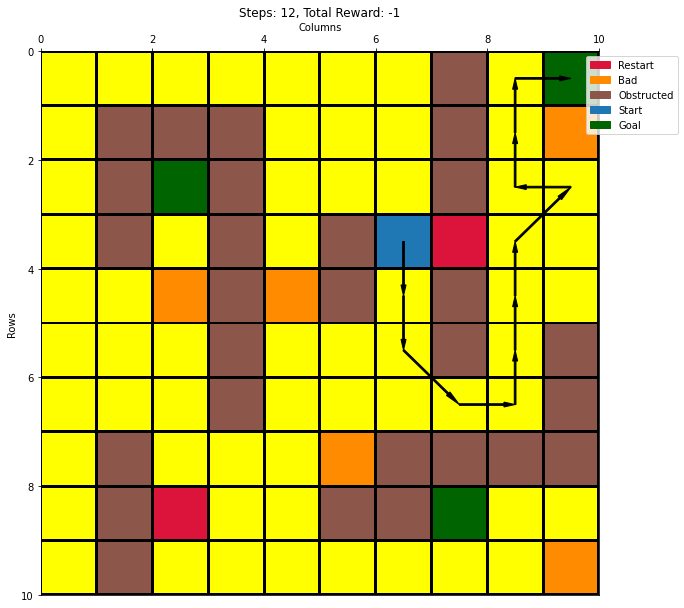

In [81]:
# best hyperparameters
balpha = 0.1
bgamma = 0.4
bbeta = 0.9
cno = 27

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

# Configuration 28 - {wind = true, start = (3,6), p = 0.7} with Q-Learning and softmax selection

run - 1


100%|██████████| 2000/2000 [00:19<00:00, 100.67it/s]


run - 2


100%|██████████| 2000/2000 [00:19<00:00, 103.15it/s]


run - 3


100%|██████████| 2000/2000 [00:16<00:00, 124.51it/s]


run - 1


100%|██████████| 2000/2000 [00:21<00:00, 93.31it/s] 


run - 2


100%|██████████| 2000/2000 [00:20<00:00, 98.31it/s] 


run - 3


100%|██████████| 2000/2000 [00:18<00:00, 110.17it/s]


run - 1


100%|██████████| 2000/2000 [00:24<00:00, 82.10it/s] 


run - 2


100%|██████████| 2000/2000 [00:36<00:00, 54.11it/s]


run - 3


100%|██████████| 2000/2000 [00:35<00:00, 56.90it/s]


run - 1


100%|██████████| 2000/2000 [00:21<00:00, 91.46it/s]


run - 2


100%|██████████| 2000/2000 [00:20<00:00, 95.72it/s] 


run - 3


100%|██████████| 2000/2000 [00:28<00:00, 69.82it/s] 


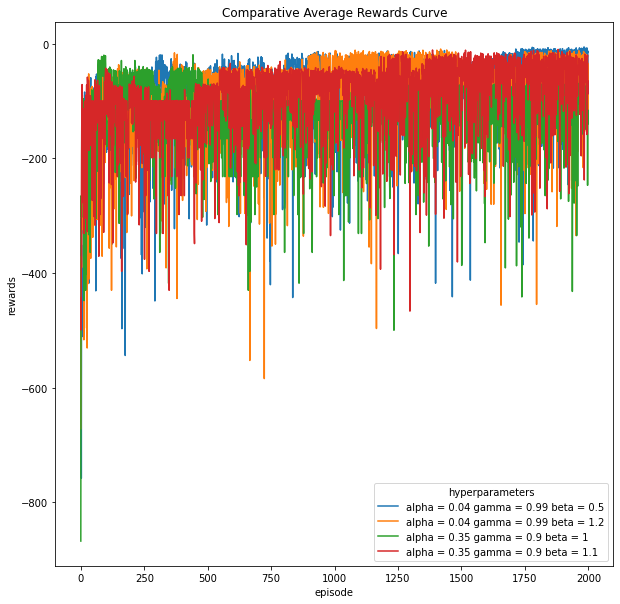

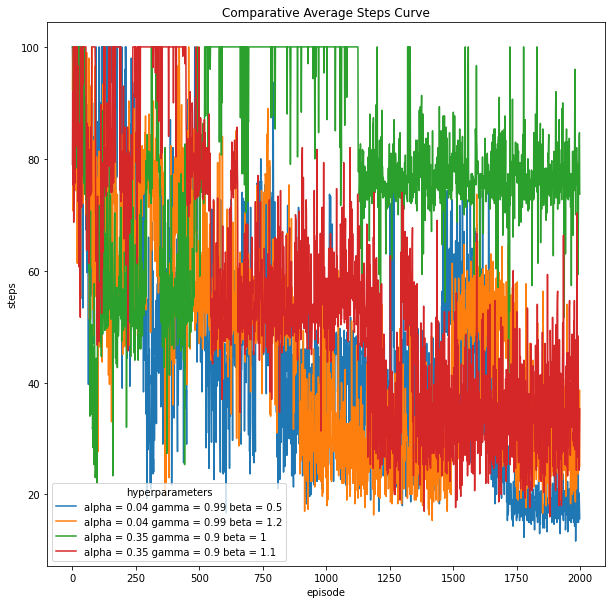

In [39]:
besthyperlist = [(0.04,0.99,0.5), (0.04,0.99,1.2), (0.35,0.9,1), (0.35,0.9,1.1)]
cno = 28

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:15<00:00, 127.72it/s]


run - 2


100%|██████████| 2000/2000 [00:15<00:00, 132.17it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 753.12it/s]


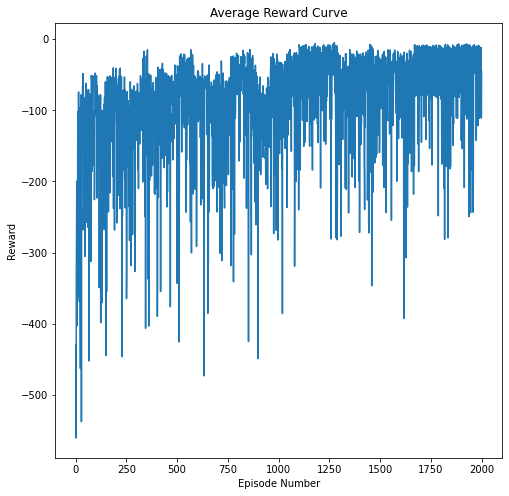

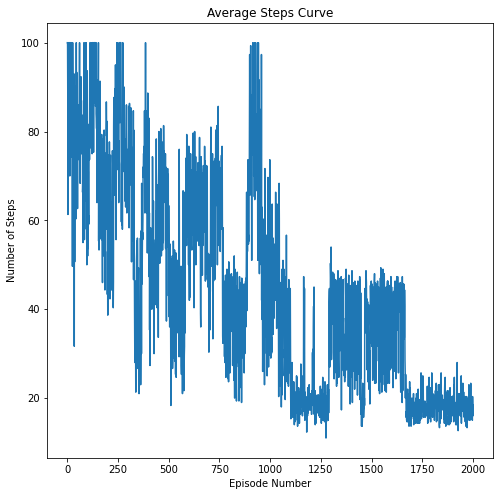

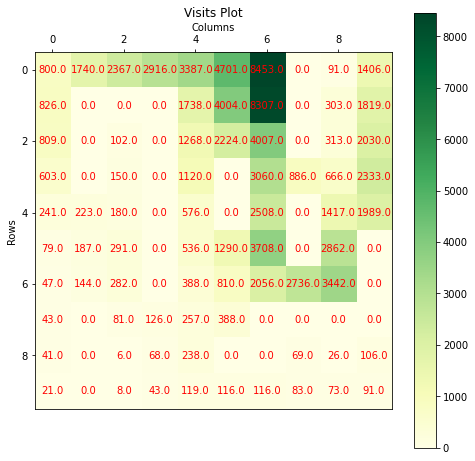

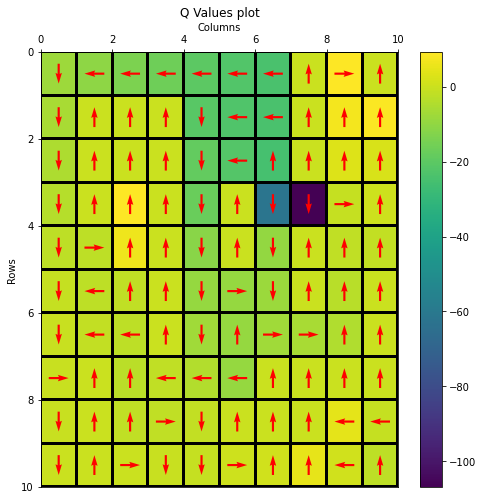

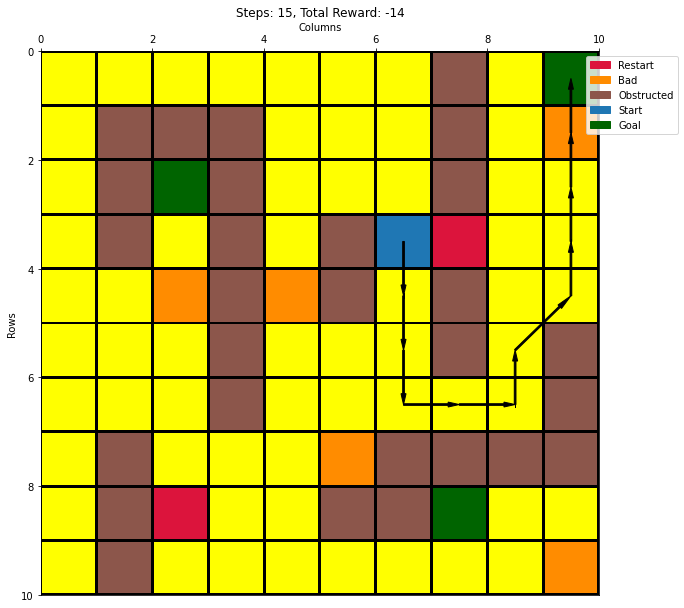

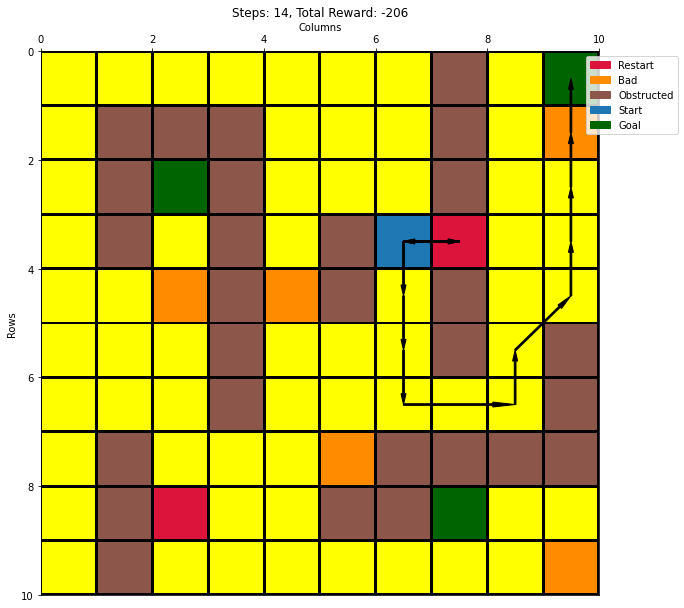

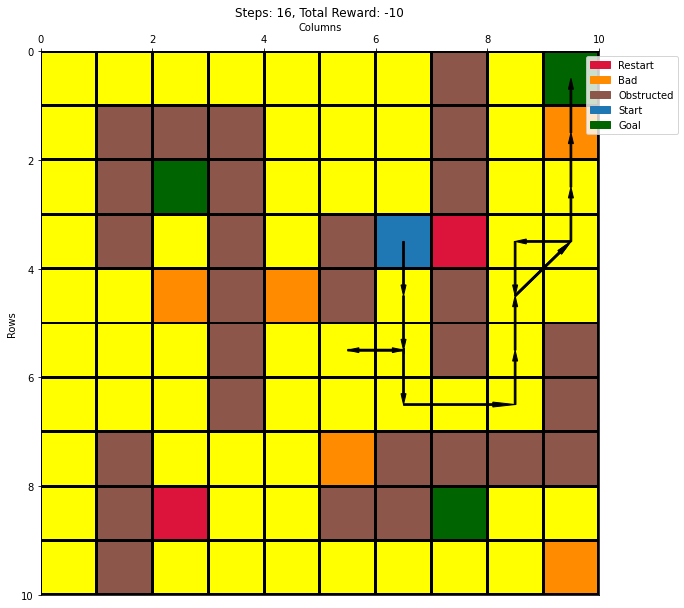

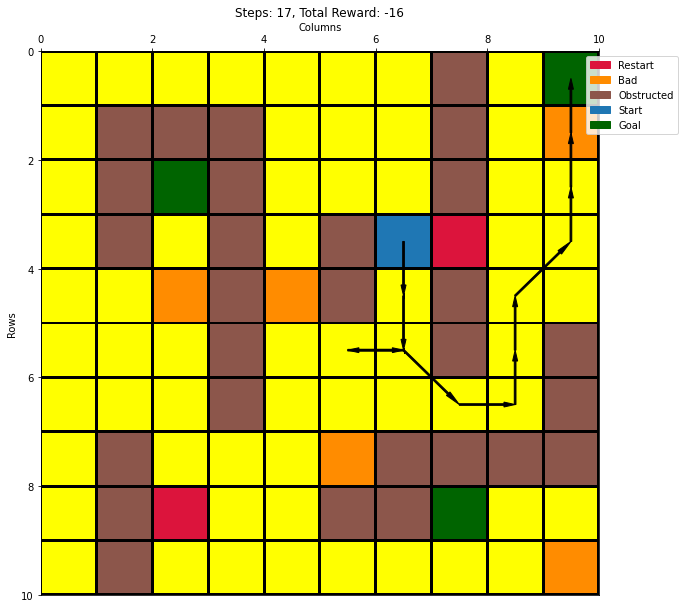

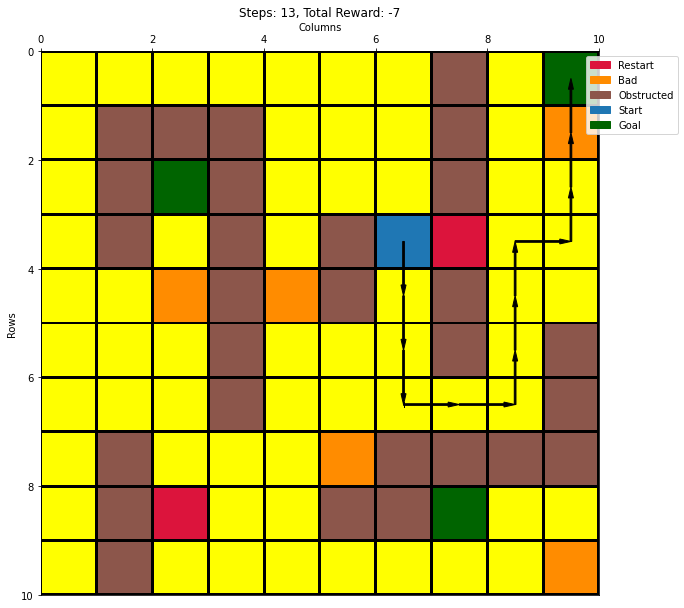

In [82]:
# best hyperparameters
balpha = 0.04
bgamma = 0.99
bbeta = 0.5
cno = 28

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

# Configuration 29 - {wind = false, start = (0,4), p = 1.0} with Q-Learning and softmax selection

run - 1


100%|██████████| 2000/2000 [00:08<00:00, 244.06it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 349.35it/s]


run - 3


100%|██████████| 2000/2000 [00:07<00:00, 267.99it/s]


run - 1


100%|██████████| 2000/2000 [00:09<00:00, 209.32it/s]


run - 2


100%|██████████| 2000/2000 [00:08<00:00, 234.01it/s]


run - 3


100%|██████████| 2000/2000 [00:06<00:00, 286.02it/s]


run - 1


100%|██████████| 2000/2000 [00:08<00:00, 239.78it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 297.76it/s]


run - 3


100%|██████████| 2000/2000 [00:08<00:00, 224.76it/s]


run - 1


100%|██████████| 2000/2000 [00:04<00:00, 418.60it/s]


run - 2


100%|██████████| 2000/2000 [00:08<00:00, 236.49it/s]


run - 3


100%|██████████| 2000/2000 [00:06<00:00, 296.28it/s]


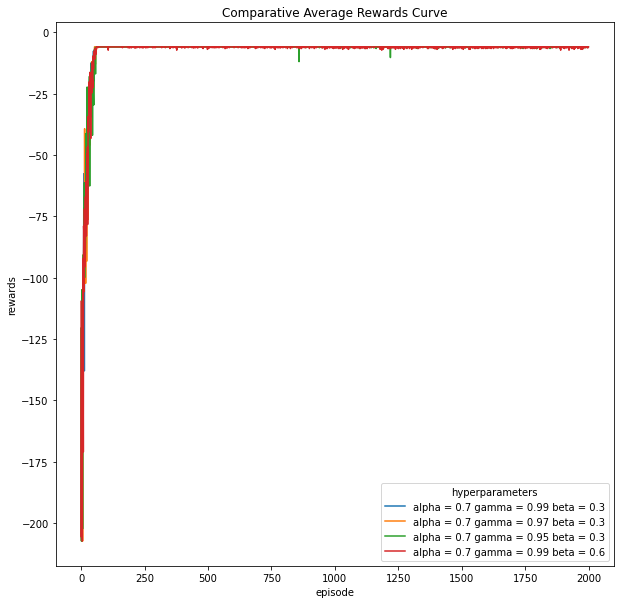

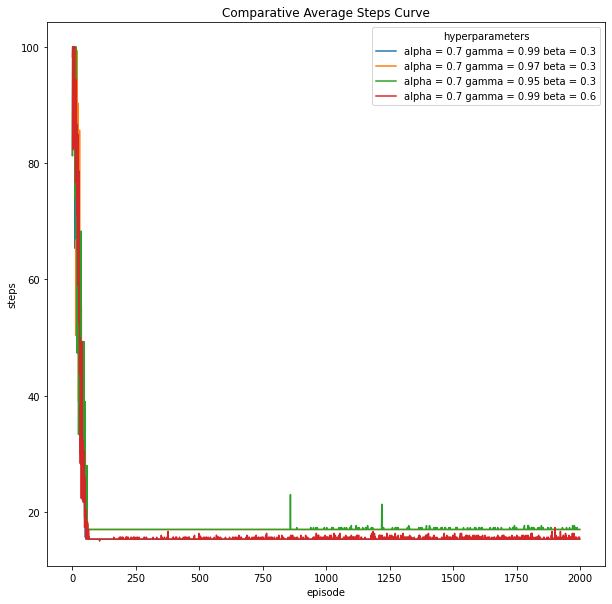

In [40]:
besthyperlist = [(0.7,0.99,0.3), (0.7,0.97,0.3), (0.7,0.95,0.3), (0.7,0.99,0.6)]
cno = 29

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:07<00:00, 272.65it/s]


run - 2


100%|██████████| 2000/2000 [00:04<00:00, 468.92it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 1458.23it/s]


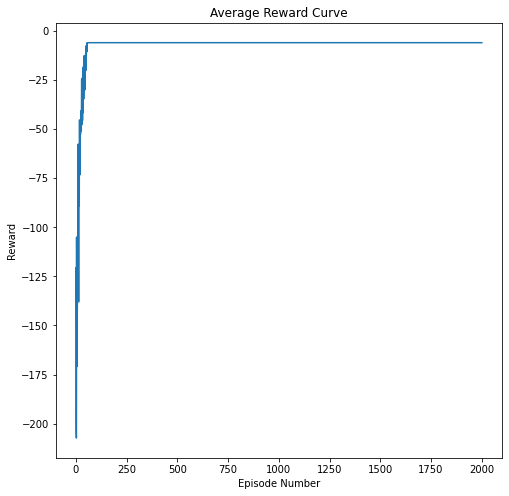

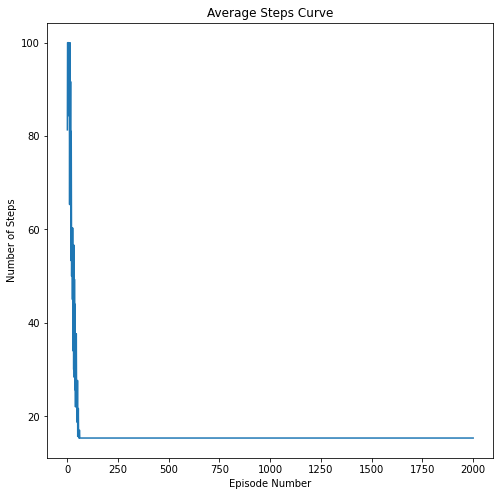

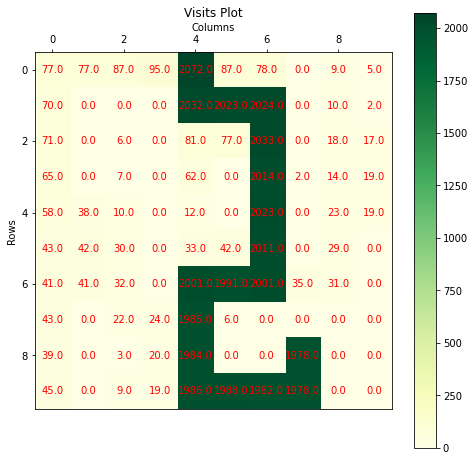

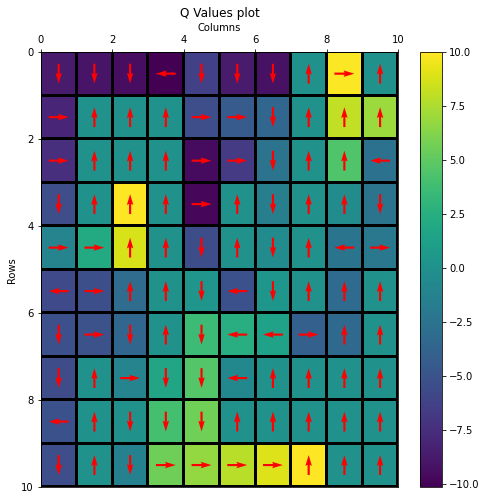

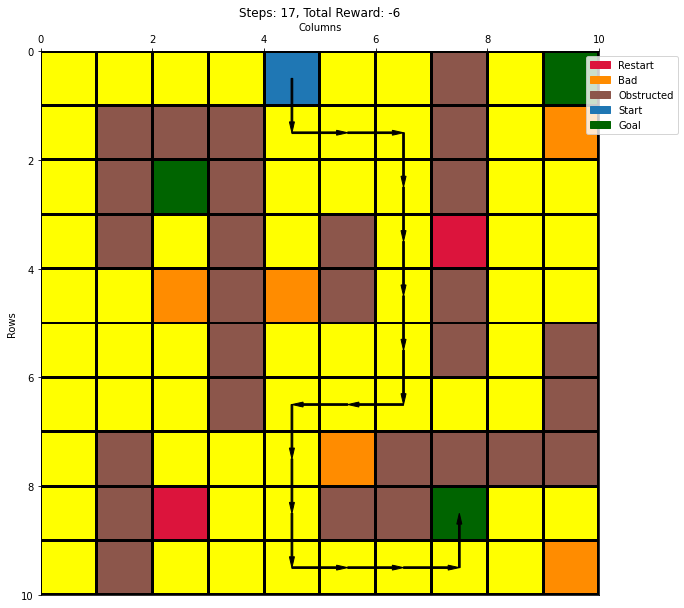

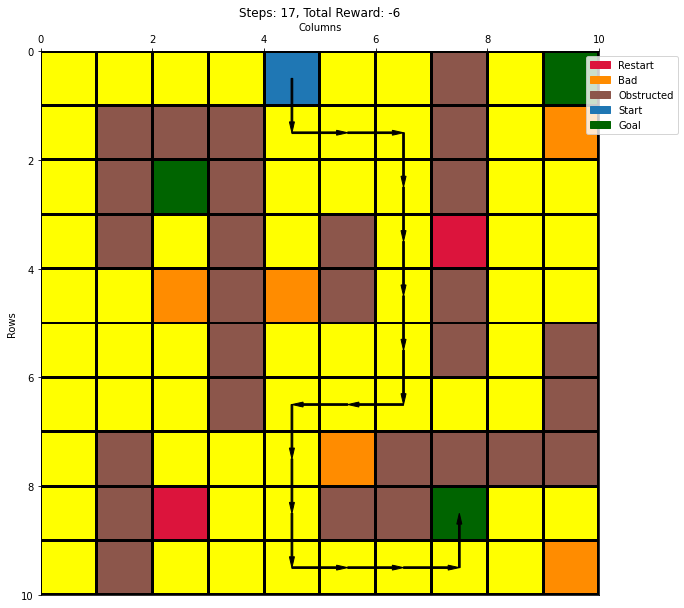

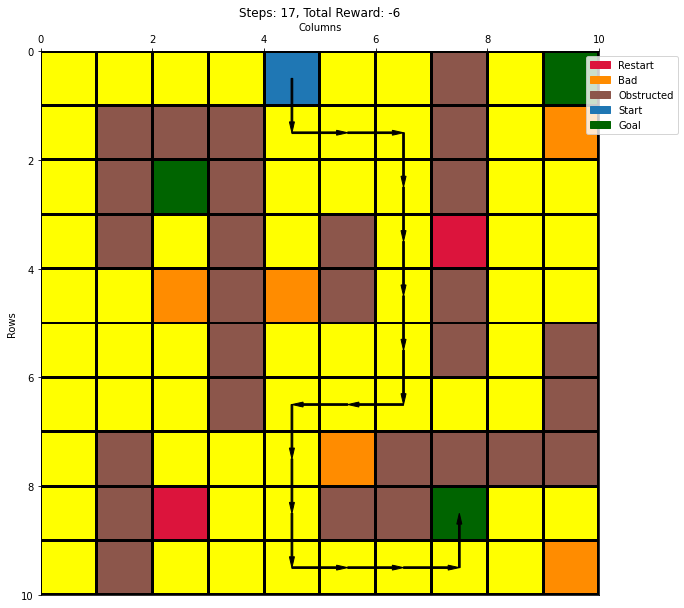

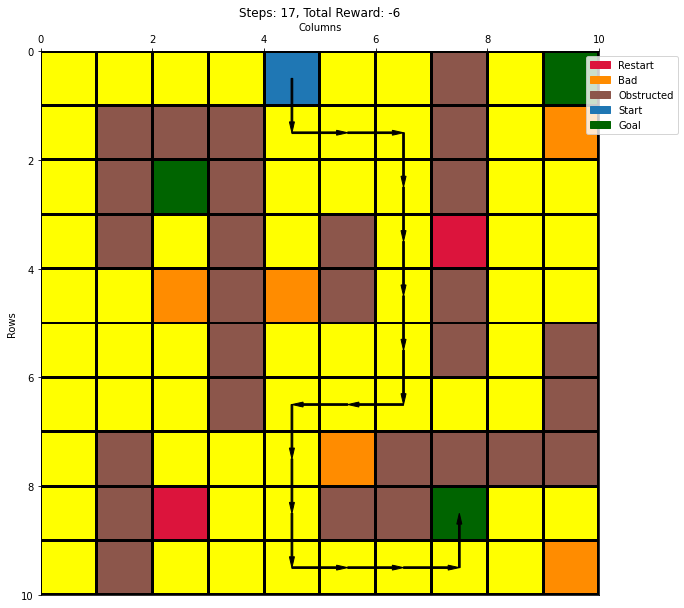

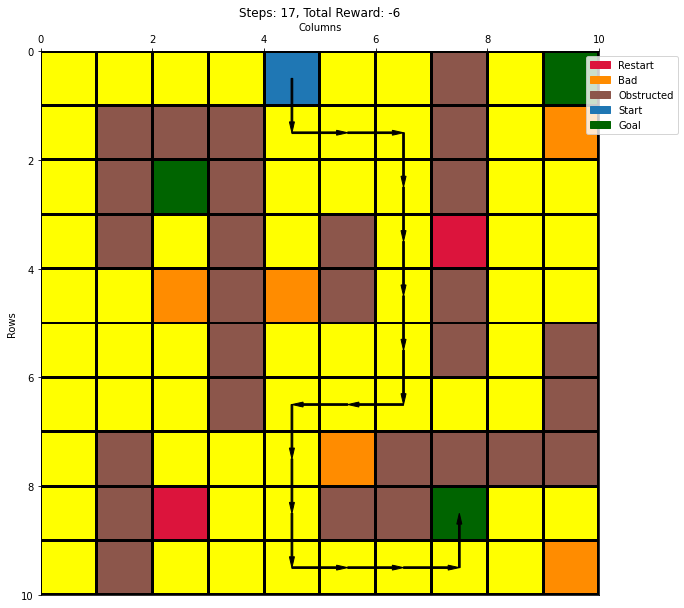

In [83]:
# best hyperparameters
balpha = 0.7
bgamma = 0.99
bbeta = 0.3
cno = 29

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

# Configuration 30 - {wind = false, start = (0,4), p = 0.7} with Q-Learning and softmax selection

run - 1


100%|██████████| 2000/2000 [00:16<00:00, 124.15it/s]


run - 2


100%|██████████| 2000/2000 [00:16<00:00, 120.47it/s]


run - 3


100%|██████████| 2000/2000 [00:16<00:00, 124.31it/s]


run - 1


100%|██████████| 2000/2000 [00:31<00:00, 64.32it/s]


run - 2


100%|██████████| 2000/2000 [00:32<00:00, 61.52it/s]


run - 3


100%|██████████| 2000/2000 [00:30<00:00, 64.97it/s]


run - 1


100%|██████████| 2000/2000 [00:23<00:00, 84.02it/s]


run - 2


100%|██████████| 2000/2000 [00:22<00:00, 87.48it/s]


run - 3


100%|██████████| 2000/2000 [00:23<00:00, 84.18it/s] 


run - 1


100%|██████████| 2000/2000 [00:09<00:00, 215.78it/s]


run - 2


100%|██████████| 2000/2000 [00:09<00:00, 221.24it/s]


run - 3


100%|██████████| 2000/2000 [00:09<00:00, 207.20it/s]


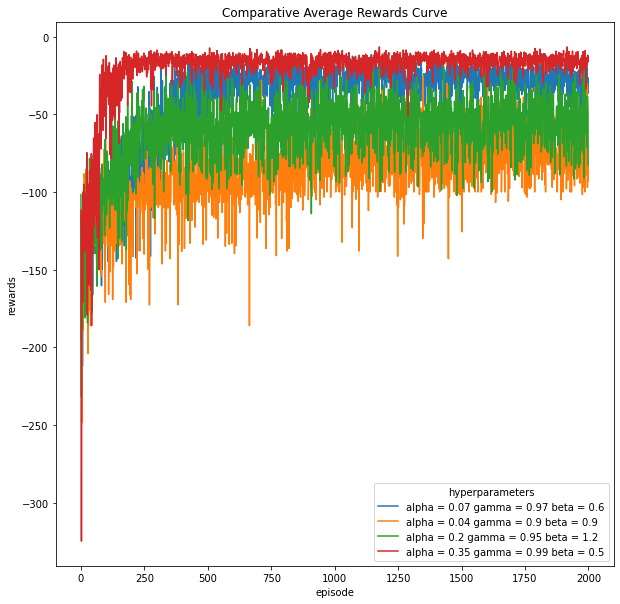

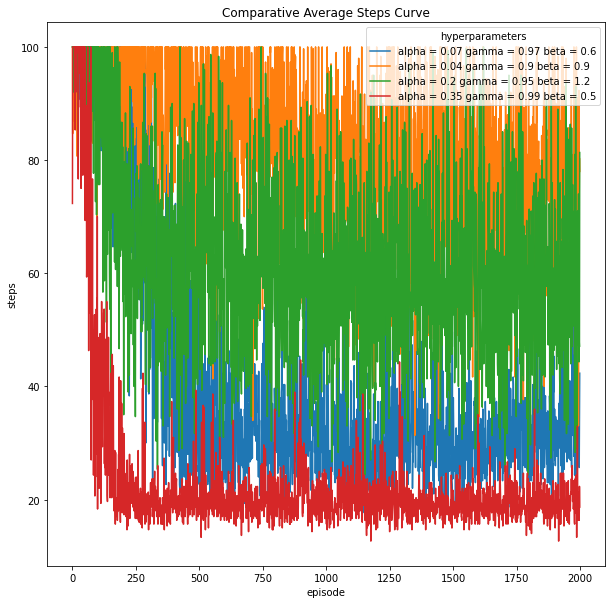

In [41]:
besthyperlist = [(0.07,0.97,0.6), (0.04,0.9,0.9), (0.2,0.95,1.2), (0.35,0.99,0.5)]
cno = 30

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:07<00:00, 279.95it/s]


run - 2


100%|██████████| 2000/2000 [00:08<00:00, 237.79it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 1074.24it/s]


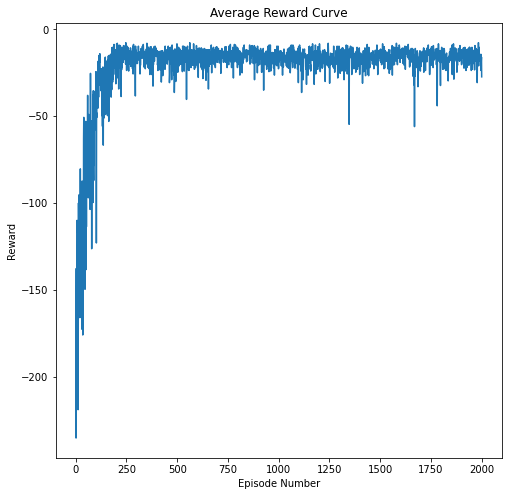

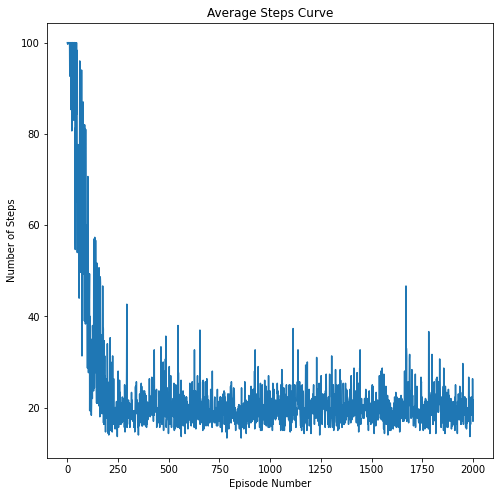

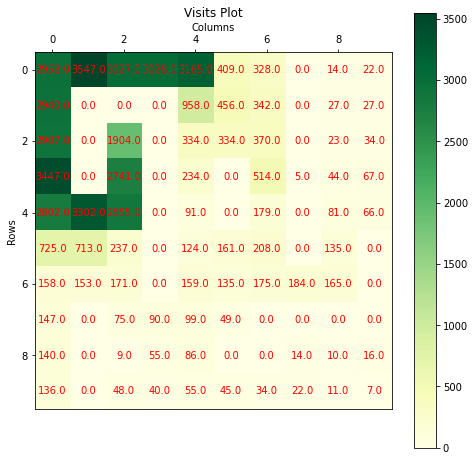

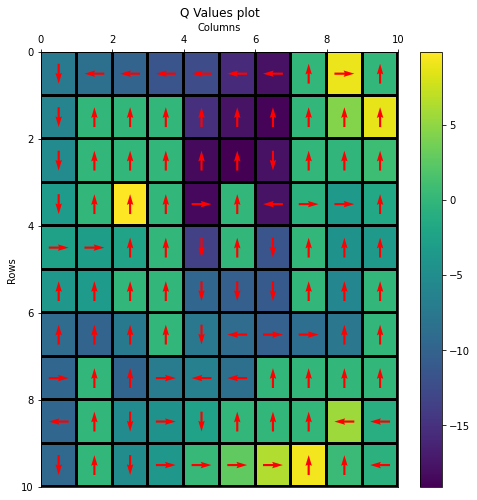

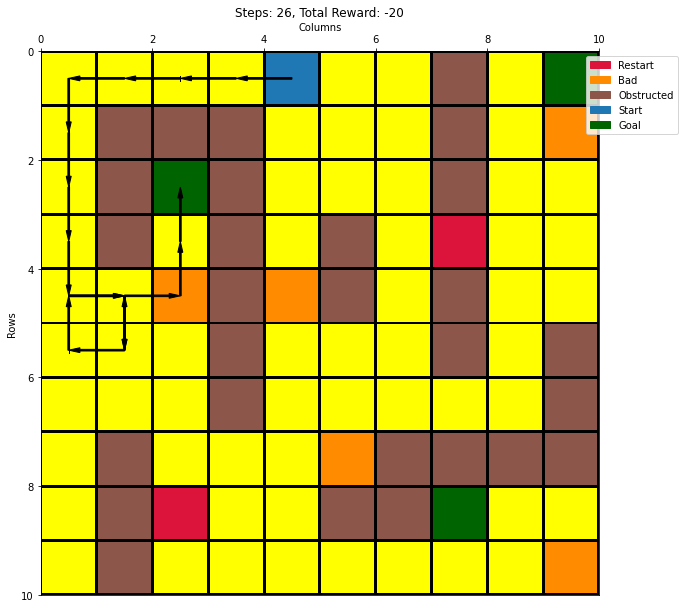

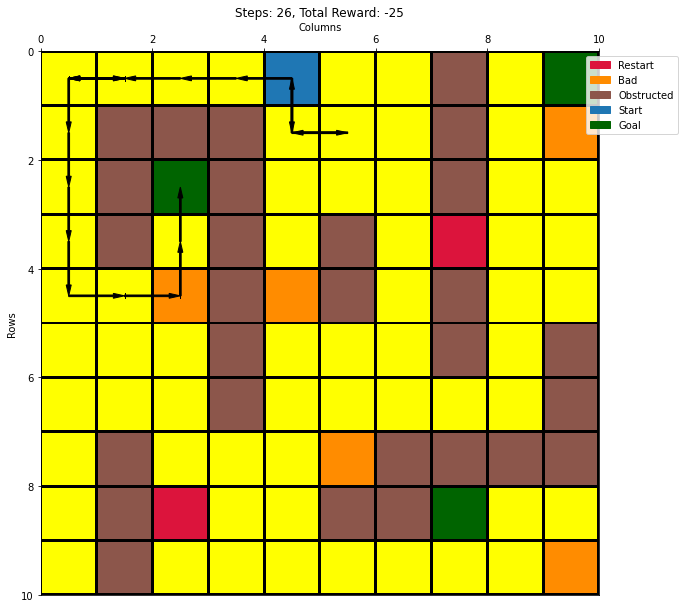

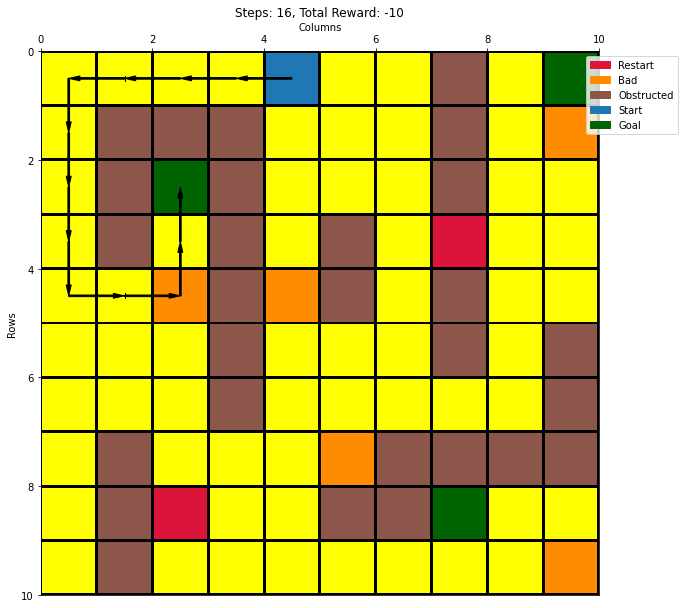

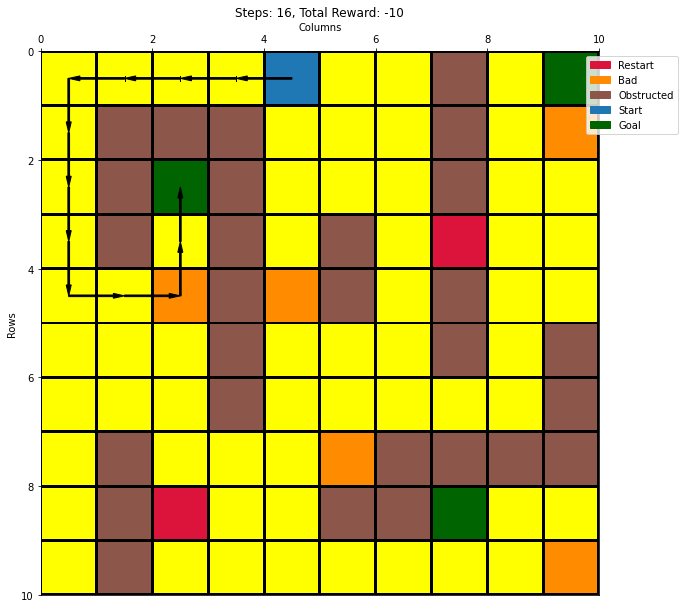

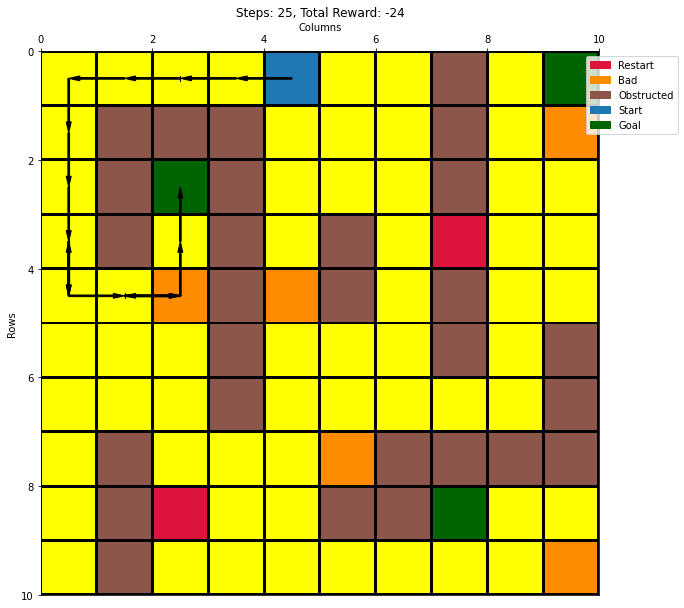

In [84]:
# best hyperparameters
balpha = 0.35
bgamma = 0.99
bbeta = 0.5
cno = 30

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

# Configuration 31 - {wind = false, start = (3,6), p = 1.0} with Q-Learning and softmax selection

run - 1


100%|██████████| 2000/2000 [00:05<00:00, 391.94it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 303.65it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 406.73it/s]


run - 1


100%|██████████| 2000/2000 [00:05<00:00, 367.64it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 329.52it/s]


run - 3


100%|██████████| 2000/2000 [00:04<00:00, 406.61it/s]


run - 1


100%|██████████| 2000/2000 [00:07<00:00, 280.30it/s]


run - 2


100%|██████████| 2000/2000 [00:05<00:00, 359.01it/s]


run - 3


100%|██████████| 2000/2000 [00:07<00:00, 283.10it/s]


run - 1


100%|██████████| 2000/2000 [00:07<00:00, 256.35it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 301.91it/s]


run - 3


100%|██████████| 2000/2000 [00:07<00:00, 269.37it/s]


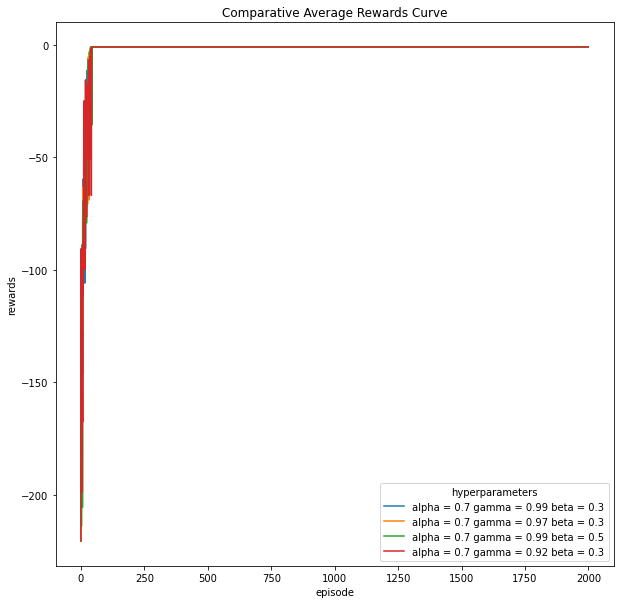

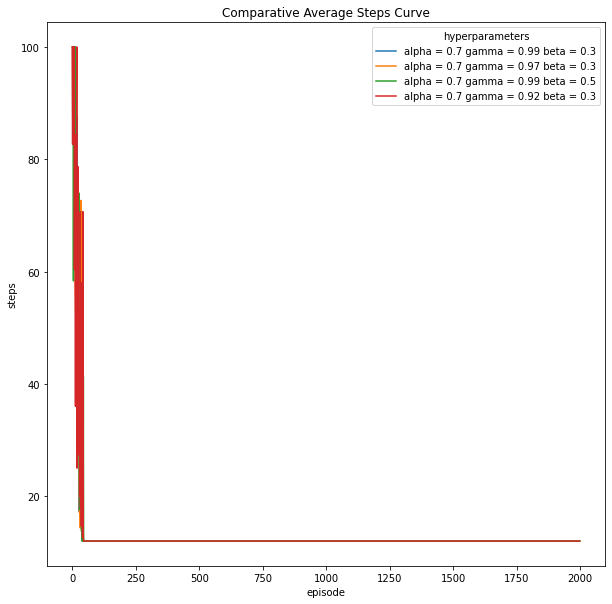

In [42]:
besthyperlist = [(0.7,0.99,0.3), (0.7,0.97,0.3), (0.7,0.99,0.5), (0.7,0.92,0.3)]
cno = 31

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:04<00:00, 446.60it/s]


run - 2


100%|██████████| 2000/2000 [00:06<00:00, 323.56it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 1758.93it/s]


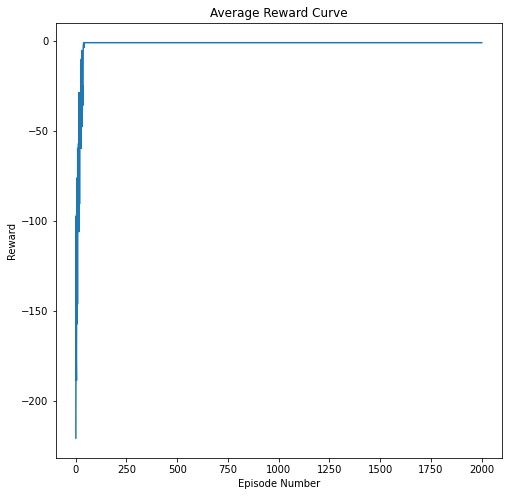

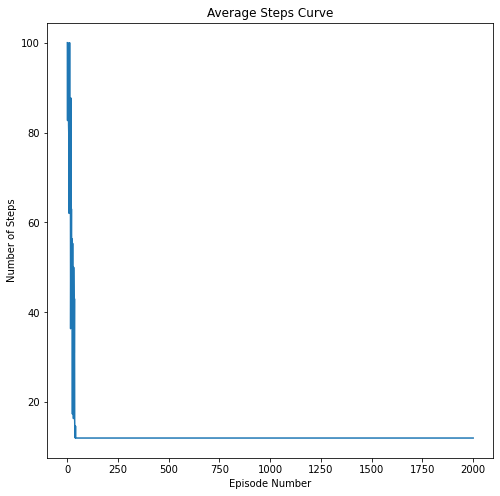

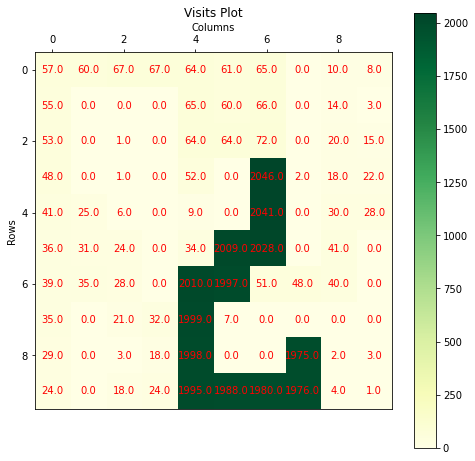

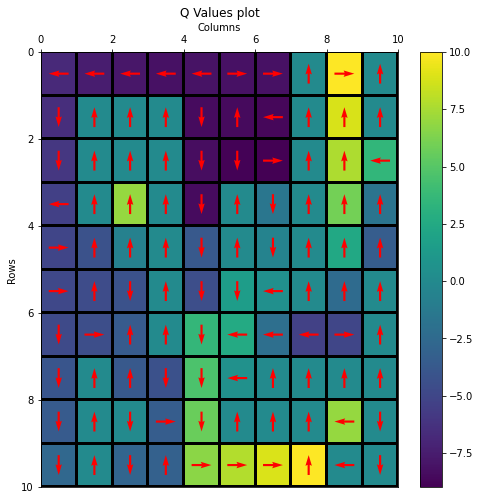

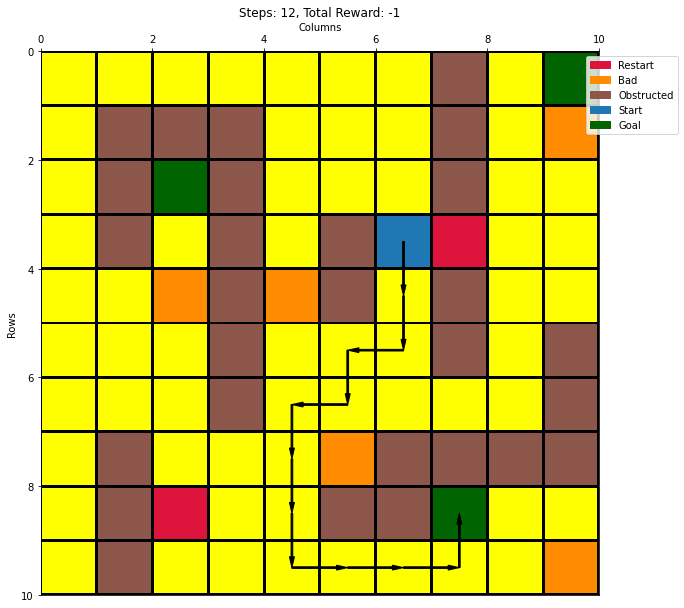

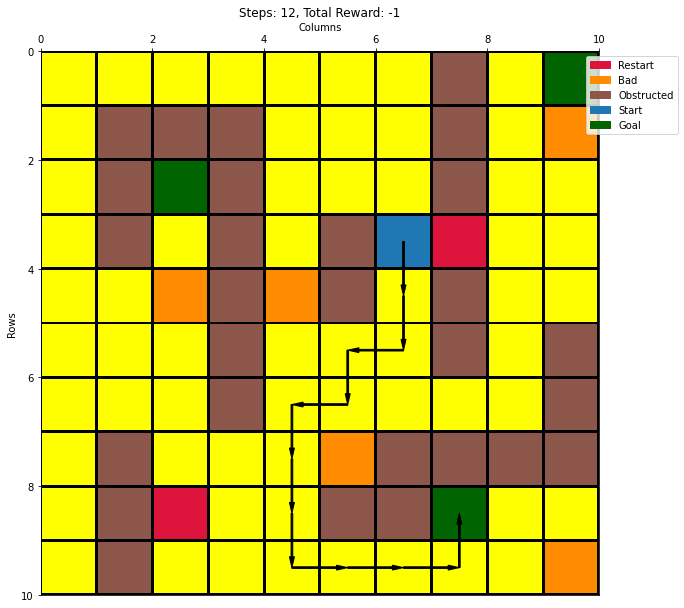

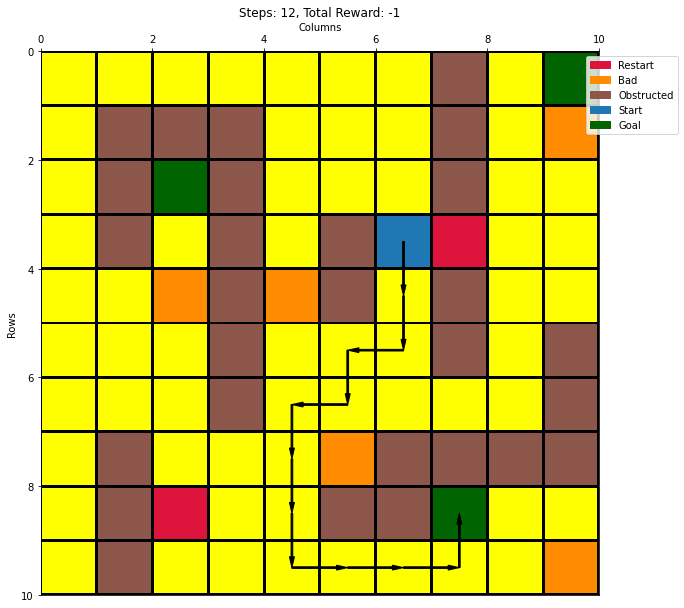

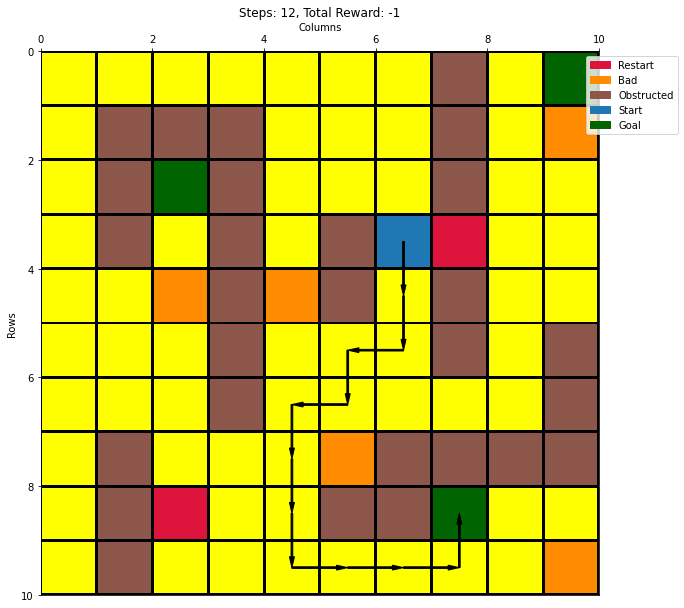

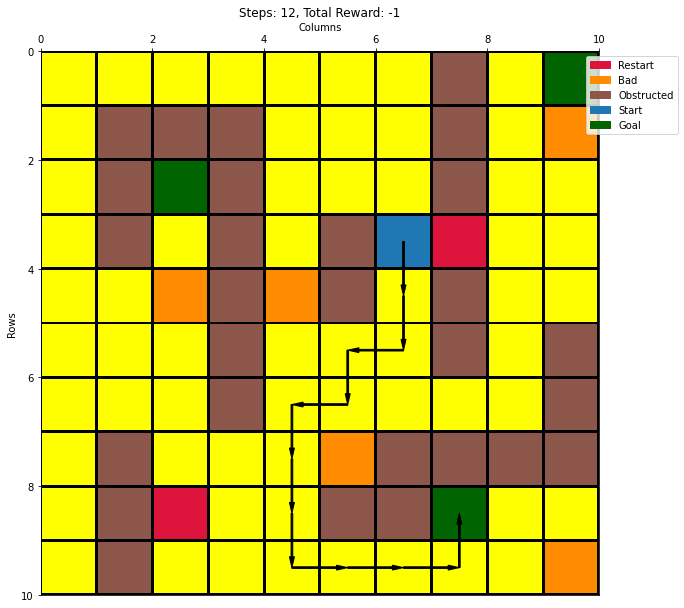

In [85]:
# best hyperparameters
balpha = 0.7
bgamma = 0.99
bbeta = 0.3
cno = 31

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

# Configuration 32 - {wind = false, start = (3,6), p = 0.7} with Q-Learning and softmax selection

run - 1


100%|██████████| 2000/2000 [00:17<00:00, 111.19it/s]


run - 2


100%|██████████| 2000/2000 [00:16<00:00, 123.85it/s]


run - 3


100%|██████████| 2000/2000 [00:16<00:00, 120.11it/s]


run - 1


100%|██████████| 2000/2000 [00:27<00:00, 72.00it/s]


run - 2


100%|██████████| 2000/2000 [00:27<00:00, 72.47it/s]


run - 3


100%|██████████| 2000/2000 [00:25<00:00, 77.18it/s] 


run - 1


100%|██████████| 2000/2000 [00:17<00:00, 111.94it/s]


run - 2


100%|██████████| 2000/2000 [00:18<00:00, 107.76it/s]


run - 3


100%|██████████| 2000/2000 [00:19<00:00, 101.29it/s]


run - 1


100%|██████████| 2000/2000 [00:21<00:00, 94.68it/s] 


run - 2


100%|██████████| 2000/2000 [00:22<00:00, 88.05it/s] 


run - 3


100%|██████████| 2000/2000 [00:20<00:00, 97.21it/s] 


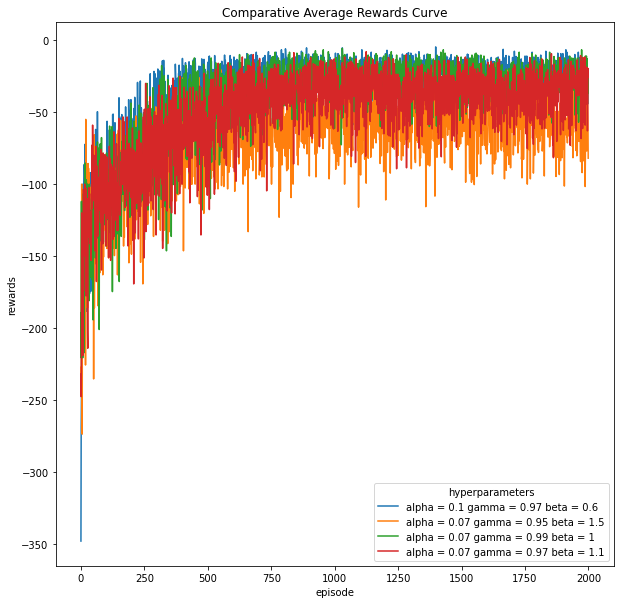

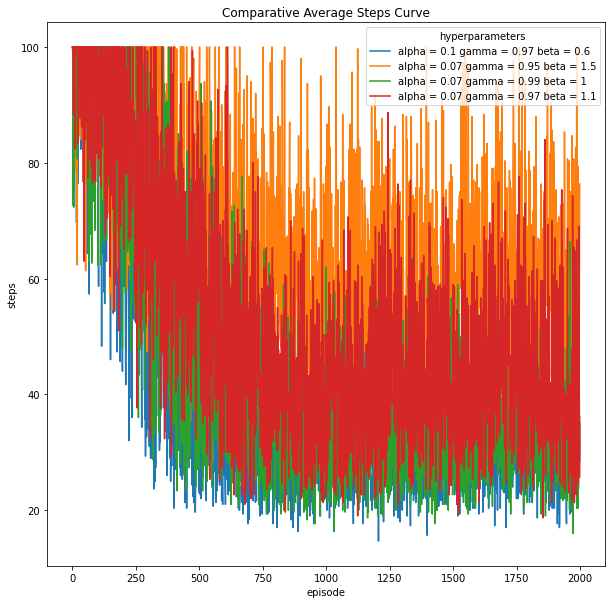

In [43]:
besthyperlist = [(0.1,0.97,0.6), (0.07,0.95,1.5), (0.07,0.99,1), (0.07,0.97,1.1)]
cno = 32

new_exp = Experiment(configs_dict[cno])
new_exp.generate_comparative_plots(cno, besthyperlist, 3, 2000, configs_dict[cno]['action'])

run - 1


100%|██████████| 2000/2000 [00:13<00:00, 146.04it/s]


run - 2


100%|██████████| 2000/2000 [00:13<00:00, 148.56it/s]


run - 3


100%|██████████| 100/100 [00:00<00:00, 1004.38it/s]


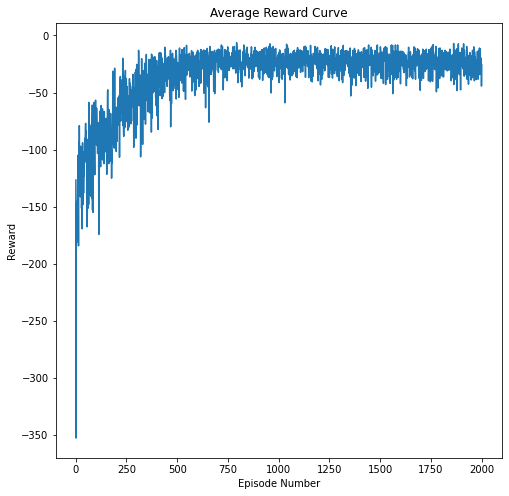

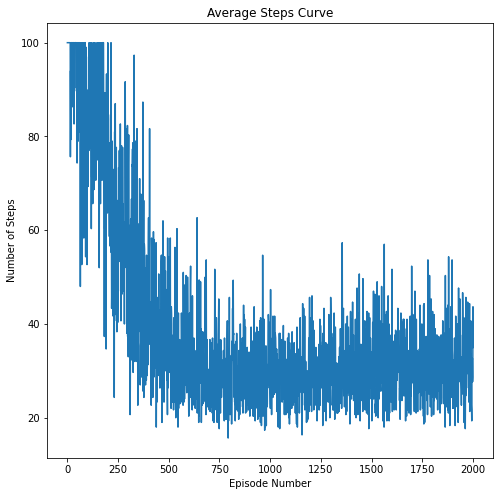

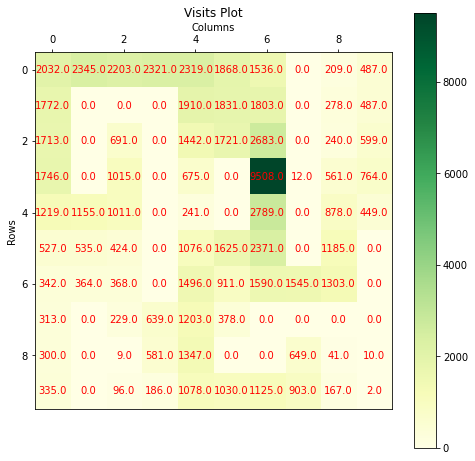

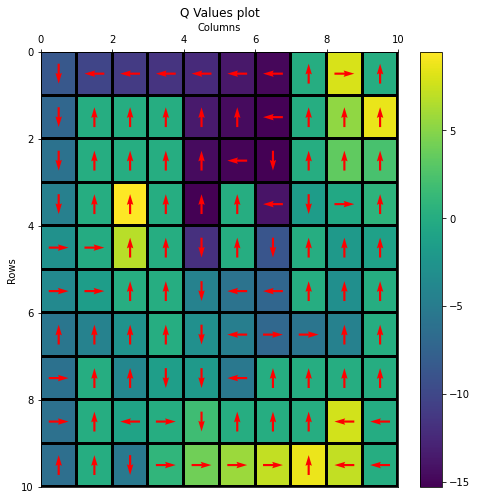

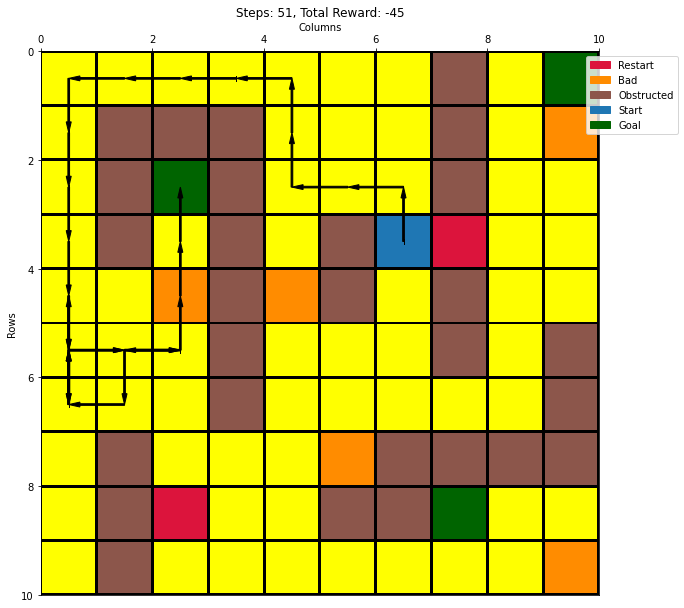

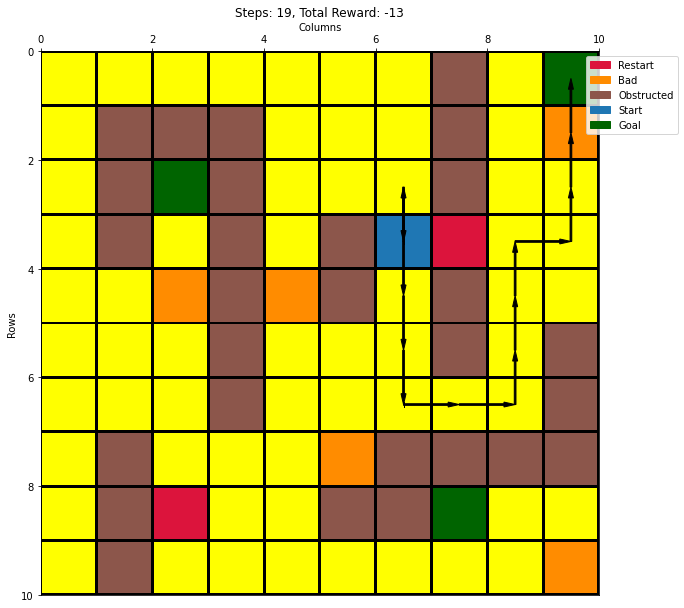

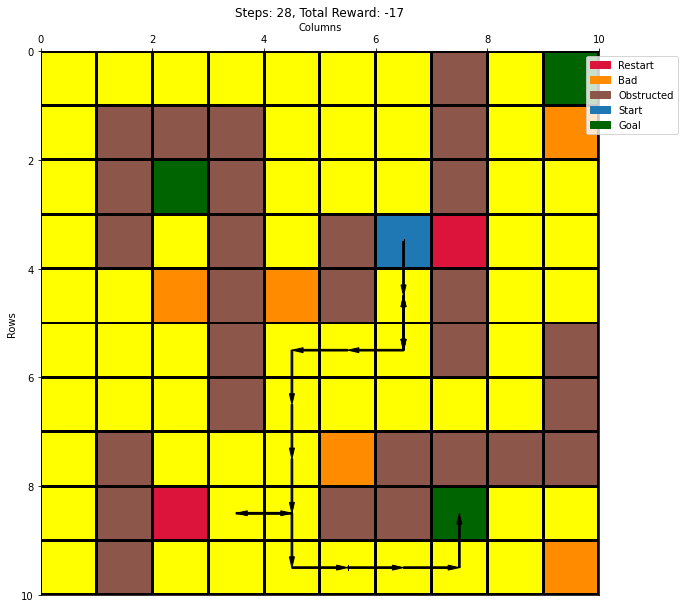

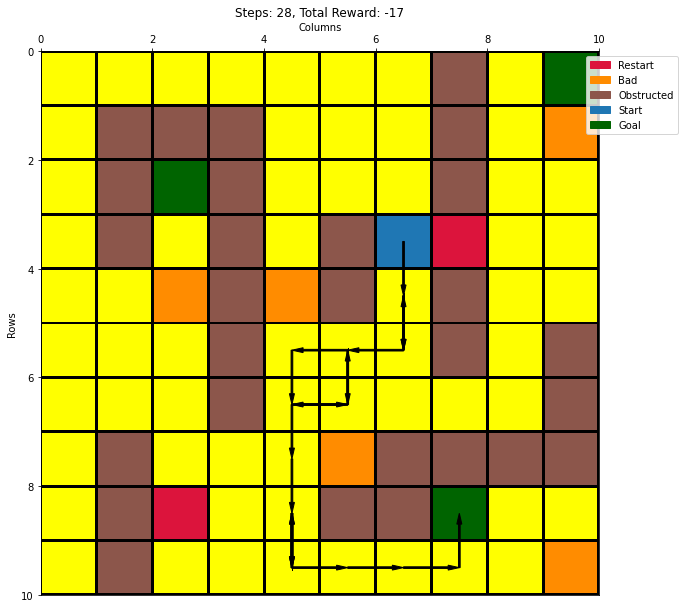

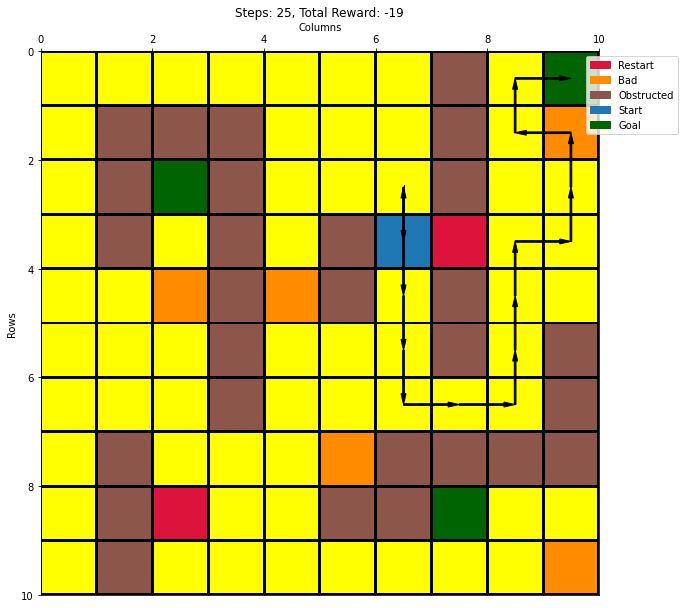

In [86]:
# best hyperparameters
balpha = 0.1
bgamma = 0.97
bbeta = 0.6
cno = 32

new_exp = Experiment(configs_dict[cno])
new_exp.train_model(3, 2000, balpha, bgamma, None, bbeta, False, False)
new_exp.generate_plots_report(cno)

In [ ]:
!pip install nbconvert
!sudo apt-get install texlive-xetex texlive-fonts-recommended texlive-plain-generic

In [88]:
!jupyter nbconvert --to pdf "/content/drive/MyDrive/Colab Notebooks/CS6700_ProgAssignment1_finalversion.ipynb"

[NbConvertApp] Running bibtex 1 time: ['bibtex', './notebook']
[NbConvertApp] WARNING | bibtex had problems, most likely because there were no citations
[NbConvertApp] PDF successfully created
[NbConvertApp] Writing 9539893 bytes to /content/drive/MyDrive/Colab Notebooks/CS6700_ProgAssignment1_finalversion.pdf
